![](https://www.pata.org/wp-content/uploads/2014/09/TripAdvisor_Logo-300x119.png)
# Predict TripAdvisor Rating
## В этом соревновании нам предстоит предсказать рейтинг ресторана в TripAdvisor
**По ходу задачи:**
* Прокачаем работу с pandas
* Научимся работать с Kaggle Notebooks
* Поймем как делать предобработку различных данных
* Научимся работать с пропущенными данными (Nan)
* Познакомимся с различными видами кодирования признаков
* Немного попробуем [Feature Engineering](https://ru.wikipedia.org/wiki/Конструирование_признаков) (генерировать новые признаки)
* И совсем немного затронем ML
* И многое другое...   



### И самое важное, все это вы сможете сделать самостоятельно!

*Этот Ноутбук являетсся Примером/Шаблоном к этому соревнованию (Baseline) и не служит готовым решением!*   
Вы можете использовать его как основу для построения своего решения.

> что такое baseline решение, зачем оно нужно и почему предоставлять baseline к соревнованию стало важным стандартом на kaggle и других площадках.   
**baseline** создается больше как шаблон, где можно посмотреть как происходит обращение с входящими данными и что нужно получить на выходе. При этом МЛ начинка может быть достаточно простой, просто для примера. Это помогает быстрее приступить к самому МЛ, а не тратить ценное время на чисто инженерные задачи. 
Также baseline являеться хорошей опорной точкой по метрике. Если твое решение хуже baseline - ты явно делаешь что-то не то и стоит попробовать другой путь) 

В контексте нашего соревнования baseline идет с небольшими примерами того, что можно делать с данными, и с инструкцией, что делать дальше, чтобы улучшить результат.  Вообще готовым решением это сложно назвать, так как используются всего 2 самых простых признака (а остальные исключаются).

# import

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import math

import matplotlib.pyplot as plt
import seaborn as sns 
%matplotlib inline

# Загружаем специальный удобный инструмент для разделения датасета:
from sklearn.model_selection import train_test_split

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# Any results you write to the current directory are saved as output.

/BOOTNXT
/hiberfil.sys
/installAgent.log
/pagefile.sys
/SUService.log
/swapfile.sys
/$Recycle.Bin\S-1-5-21-1034887424-1308305834-632688529-94911\$I0JOOT2.ipynb
/$Recycle.Bin\S-1-5-21-1034887424-1308305834-632688529-94911\$I3YJXS6.ipynb
/$Recycle.Bin\S-1-5-21-1034887424-1308305834-632688529-94911\$I42JQQL.csv
/$Recycle.Bin\S-1-5-21-1034887424-1308305834-632688529-94911\$I70HG9A.docx
/$Recycle.Bin\S-1-5-21-1034887424-1308305834-632688529-94911\$ICI7RJZ.zip
/$Recycle.Bin\S-1-5-21-1034887424-1308305834-632688529-94911\$IICOJB1.ipynb
/$Recycle.Bin\S-1-5-21-1034887424-1308305834-632688529-94911\$IJNFCM1.ipynb
/$Recycle.Bin\S-1-5-21-1034887424-1308305834-632688529-94911\$IM94NVS.xlsb
/$Recycle.Bin\S-1-5-21-1034887424-1308305834-632688529-94911\$INUCXM8.zip
/$Recycle.Bin\S-1-5-21-1034887424-1308305834-632688529-94911\$R0JOOT2.ipynb
/$Recycle.Bin\S-1-5-21-1034887424-1308305834-632688529-94911\$R3YJXS6.ipynb
/$Recycle.Bin\S-1-5-21-1034887424-1308305834-632688529-94911\$R70HG9A.docx
/$Recycle.Bin

/DRIVERS\AudioDriver\Source\Thirdparty\Dolby\ext_realtek_lenovo_ideapad\ext_lenovo_l340-15irh_rs4_rs5_19h1_v229\dax3_ext_dolbyaudio.cat
/DRIVERS\AudioDriver\Source\Thirdparty\Dolby\ext_realtek_lenovo_ideapad\ext_lenovo_l340-15irh_rs4_rs5_19h1_v229\dax3_ext_dolbyaudio.inf
/DRIVERS\AudioDriver\Source\Thirdparty\Dolby\ext_realtek_lenovo_ideapad\ext_lenovo_l340-15irh_rs4_rs5_19h1_v229\HDAUDIO_DEV_0257_SUBSYS_17AA3824_PCI_SUBSYS_381517AA.xml
/DRIVERS\AudioDriver\Source\Thirdparty\Dolby\ext_realtek_lenovo_ideapad\ext_lenovo_l340-15irh_rs4_rs5_19h1_v229\Headphone_Default_Generic_Default_DolbyAudio.xml
/DRIVERS\AudioDriver\Source\Thirdparty\Dolby\ext_realtek_lenovo_ideapad\ext_lenovo_l340-15irh_rs4_rs5_19h1_v229\INTELAUDIO_DEV_0257_SUBSYS_17AA3824_PCI_SUBSYS_381517AA.xml
/DRIVERS\AudioDriver\Source\Thirdparty\Dolby\ext_realtek_lenovo_ideapad\ext_lenovo_l340-15irh_rs4_rs5_19h1_v229\Operator_Info_Lenovo.xml
/DRIVERS\AudioDriver\Source\Thirdparty\Dolby\ext_realtek_lenovo_ideapad\ext_lenovo_l340-1

/Lotus\Notes\framework\brokerbridge85\base.ver
/Lotus\Notes\framework\brokerbridge85\customproperties.bak
/Lotus\Notes\framework\brokerbridge85\customproperties.ini
/Lotus\Notes\framework\brokerbridge85\STHelper.dll
/Lotus\Notes\framework\brokerbridge85\STHelperEventMessage.dll
/Lotus\Notes\framework\brokerbridge85\STLogger.dll
/Lotus\Notes\framework\brokerbridge85\STOfficeDiag.dll
/Lotus\Notes\framework\brokerbridge85\wmqtt.dll
/Lotus\Notes\framework\brokerbridge85\help\st_oi.chm
/Lotus\Notes\framework\brokerbridge85\help\st_oi_ar.chm
/Lotus\Notes\framework\brokerbridge85\help\st_oi_cs.chm
/Lotus\Notes\framework\brokerbridge85\help\st_oi_da.chm
/Lotus\Notes\framework\brokerbridge85\help\st_oi_de.chm
/Lotus\Notes\framework\brokerbridge85\help\st_oi_el.chm
/Lotus\Notes\framework\brokerbridge85\help\st_oi_es.chm
/Lotus\Notes\framework\brokerbridge85\help\st_oi_fi.chm
/Lotus\Notes\framework\brokerbridge85\help\st_oi_fr.chm
/Lotus\Notes\framework\brokerbridge85\help\st_oi_he.chm
/Lotus\Not

/Lotus\Notes\framework\rcp\eclipse\features\com.ibm.langware.v5.dic.en_AU.feature_7.2.0.201107220540\feature.properties
/Lotus\Notes\framework\rcp\eclipse\features\com.ibm.langware.v5.dic.en_AU.feature_7.2.0.201107220540\feature.xml
/Lotus\Notes\framework\rcp\eclipse\features\com.ibm.langware.v5.dic.en_AU.feature_7.2.0.201107220540\feature_ar.properties
/Lotus\Notes\framework\rcp\eclipse\features\com.ibm.langware.v5.dic.en_AU.feature_7.2.0.201107220540\feature_ca.properties
/Lotus\Notes\framework\rcp\eclipse\features\com.ibm.langware.v5.dic.en_AU.feature_7.2.0.201107220540\feature_cs.properties
/Lotus\Notes\framework\rcp\eclipse\features\com.ibm.langware.v5.dic.en_AU.feature_7.2.0.201107220540\feature_da.properties
/Lotus\Notes\framework\rcp\eclipse\features\com.ibm.langware.v5.dic.en_AU.feature_7.2.0.201107220540\feature_de.properties
/Lotus\Notes\framework\rcp\eclipse\features\com.ibm.langware.v5.dic.en_AU.feature_7.2.0.201107220540\feature_el.properties
/Lotus\Notes\framework\rcp\ec

/Lotus\Notes\framework\rcp\eclipse\features\com.ibm.pvc.webhttpservice.feature_6.2.3.20110915-1350\feature_zh_CN.properties
/Lotus\Notes\framework\rcp\eclipse\features\com.ibm.pvc.webhttpservice.feature_6.2.3.20110915-1350\feature_zh_TW.properties
/Lotus\Notes\framework\rcp\eclipse\features\com.ibm.pvc.webhttpservice.feature_6.2.3.20110915-1350\META-INF\IBM_WPLC.RSA
/Lotus\Notes\framework\rcp\eclipse\features\com.ibm.pvc.webhttpservice.feature_6.2.3.20110915-1350\META-INF\IBM_WPLC.SF
/Lotus\Notes\framework\rcp\eclipse\features\com.ibm.pvc.webhttpservice.feature_6.2.3.20110915-1350\META-INF\MANIFEST.MF
/Lotus\Notes\framework\rcp\eclipse\features\com.ibm.pvcws.feature_6.2.3.20110915-1350\feature.properties
/Lotus\Notes\framework\rcp\eclipse\features\com.ibm.pvcws.feature_6.2.3.20110915-1350\feature.xml
/Lotus\Notes\framework\rcp\eclipse\features\com.ibm.pvcws.feature_6.2.3.20110915-1350\feature_ar.properties
/Lotus\Notes\framework\rcp\eclipse\features\com.ibm.pvcws.feature_6.2.3.20110915

/Lotus\Notes\framework\rcp\eclipse\features\com.ibm.rcp.managedsettings.feature_6.2.3.20110915-1350\META-INF\IBM_WPLC.RSA
/Lotus\Notes\framework\rcp\eclipse\features\com.ibm.rcp.managedsettings.feature_6.2.3.20110915-1350\META-INF\IBM_WPLC.SF
/Lotus\Notes\framework\rcp\eclipse\features\com.ibm.rcp.managedsettings.feature_6.2.3.20110915-1350\META-INF\MANIFEST.MF
/Lotus\Notes\framework\rcp\eclipse\features\com.ibm.rcp.managedsettings.portal.feature_6.2.3.20110915-1350\feature.properties
/Lotus\Notes\framework\rcp\eclipse\features\com.ibm.rcp.managedsettings.portal.feature_6.2.3.20110915-1350\feature.xml
/Lotus\Notes\framework\rcp\eclipse\features\com.ibm.rcp.managedsettings.portal.feature_6.2.3.20110915-1350\feature_ar.properties
/Lotus\Notes\framework\rcp\eclipse\features\com.ibm.rcp.managedsettings.portal.feature_6.2.3.20110915-1350\feature_ca.properties
/Lotus\Notes\framework\rcp\eclipse\features\com.ibm.rcp.managedsettings.portal.feature_6.2.3.20110915-1350\feature_cs.properties
/Lot

/Lotus\Notes\framework\rcp\eclipse\features\com.ibm.rcp.syncui.feature_6.2.3.20110915-1350\feature.properties
/Lotus\Notes\framework\rcp\eclipse\features\com.ibm.rcp.syncui.feature_6.2.3.20110915-1350\feature.xml
/Lotus\Notes\framework\rcp\eclipse\features\com.ibm.rcp.syncui.feature_6.2.3.20110915-1350\feature_ar.properties
/Lotus\Notes\framework\rcp\eclipse\features\com.ibm.rcp.syncui.feature_6.2.3.20110915-1350\feature_ca.properties
/Lotus\Notes\framework\rcp\eclipse\features\com.ibm.rcp.syncui.feature_6.2.3.20110915-1350\feature_cs.properties
/Lotus\Notes\framework\rcp\eclipse\features\com.ibm.rcp.syncui.feature_6.2.3.20110915-1350\feature_da.properties
/Lotus\Notes\framework\rcp\eclipse\features\com.ibm.rcp.syncui.feature_6.2.3.20110915-1350\feature_de.properties
/Lotus\Notes\framework\rcp\eclipse\features\com.ibm.rcp.syncui.feature_6.2.3.20110915-1350\feature_el.properties
/Lotus\Notes\framework\rcp\eclipse\features\com.ibm.rcp.syncui.feature_6.2.3.20110915-1350\feature_es.propert

/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.avatar_1.5.3.20110915-1350.jar
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.cds_2.0.4.200802251155.jar
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.css.parser_6.2.3.20110915-1350.jar
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.eclipse.ant.core.nl_6.2.3.20110815-1128.jar
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.eclipse.core.contenttype.nl_6.2.3.20110815-1128.jar
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.eclipse.core.databinding.nl_6.2.3.20110815-1128.jar
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.eclipse.core.expressions.nl_6.2.3.20110815-1128.jar
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.eclipse.core.filebuffers.nl_6.2.3.20110815-1128.jar
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.eclipse.core.filesystem.nl_6.2.3.20110815-1128.jar
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.eclipse.core.jobs.nl_6.2.3.20110815-1128.jar
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ib

/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.esupport.client.product.SHARED_4.1.1.100316-rcp20110531\properties\SHARED\autopdtoolstrings_shared.properties
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.esupport.client.product.SHARED_4.1.1.100316-rcp20110531\properties\SHARED\autopdtoolstrings_shared_ar.properties
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.esupport.client.product.SHARED_4.1.1.100316-rcp20110531\properties\SHARED\autopdtoolstrings_shared_ca.properties
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.esupport.client.product.SHARED_4.1.1.100316-rcp20110531\properties\SHARED\autopdtoolstrings_shared_cs.properties
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.esupport.client.product.SHARED_4.1.1.100316-rcp20110531\properties\SHARED\autopdtoolstrings_shared_da.properties
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.esupport.client.product.SHARED_4.1.1.100316-rcp20110531\properties\SHARED\autopdtoolstrings_shared_db2.properties
/Lotus\Notes\frame

/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.esupport.client.product.System_4.0.1.090505\permissions.properties
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.esupport.client.product.System_4.0.1.090505\META-INF\eclipse.inf
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.esupport.client.product.System_4.0.1.090505\META-INF\IBM_WPLC.RSA
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.esupport.client.product.System_4.0.1.090505\META-INF\IBM_WPLC.SF
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.esupport.client.product.System_4.0.1.090505\META-INF\MANIFEST.MF
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.esupport.client.product.System_4.0.1.090505\properties\System\autopd.properties
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.esupport.client.product.System_4.0.1.090505\properties\System\autopd_en.properties
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.esupport.client.product.System_4.0.1.090505\properties\System\autopd_en_US.properties
/Lotus\Notes\fr

/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.pvc.webcontainer_6.2.3.20110915-1350\wwcc\asm-3.1.jar
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.pvc.webcontainer_6.2.3.20110915-1350\wwcc\asm-commons-3.1.jar
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.pvc.webcontainer_6.2.3.20110915-1350\wwcc\geronimo-annotation_1.0_spec-1.1.1.jar
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.pvc.webcontainer_6.2.3.20110915-1350\wwcc\ibmcfw.jar
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.pvc.webcontainer_6.2.3.20110915-1350\wwcc\jasper-el.jar
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.pvc.webcontainer_6.2.3.20110915-1350\wwcc\web.jsp.jar
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.pvc.webcontainer_6.2.3.20110915-1350\wwcc\web.jsplite.jar
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.pvc.webcontainer_6.2.3.20110915-1350\wwcc\web.session.core.jar
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.pvc.webcontainer_6.2.3.20110915-1350\wwcc\web.session.shell.

/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.rcp.security.auth.spnego_6.2.3.20110915-1350\META-INF\eclipse.inf
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.rcp.security.auth.spnego_6.2.3.20110915-1350\META-INF\IBM_WPLC.RSA
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.rcp.security.auth.spnego_6.2.3.20110915-1350\META-INF\IBM_WPLC.SF
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.rcp.security.auth.spnego_6.2.3.20110915-1350\META-INF\MANIFEST.MF
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.rcp.security.auth.spnego_6.2.3.20110915-1350\os\win32\x86\rcpspnego.dll
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.rcp.servlet.jwl_3.0.8.20110915-1350\about.html
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.rcp.servlet.jwl_3.0.8.20110915-1350\copyright.txt
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.rcp.servlet.jwl_3.0.8.20110915-1350\DocEditor.jar
/Lotus\Notes\framework\rcp\eclipse\plugins\com.ibm.rcp.servlet.jwl_3.0.8.20110915-1350\odc-jsf.jar
/Lotus\No

/Lotus\Notes\framework\rcp\eclipse\plugins\org.eclipse.equinox.security.win32.x86_1.0.0.v20080529-1600\org\eclipse\equinox\internal\security\win32\nls\messages.properties
/Lotus\Notes\framework\rcp\eclipse\plugins\org.eclipse.equinox.security.win32.x86_1.0.0.v20080529-1600\org\eclipse\equinox\internal\security\win32\nls\WinCryptoMessages.class
/Lotus\Notes\framework\rcp\eclipse\plugins\org.eclipse.jdt.debug_3.4.1.v20081216_r342\.api_description
/Lotus\Notes\framework\rcp\eclipse\plugins\org.eclipse.jdt.debug_3.4.1.v20081216_r342\about.html
/Lotus\Notes\framework\rcp\eclipse\plugins\org.eclipse.jdt.debug_3.4.1.v20081216_r342\jdi.jar
/Lotus\Notes\framework\rcp\eclipse\plugins\org.eclipse.jdt.debug_3.4.1.v20081216_r342\jdimodel.jar
/Lotus\Notes\framework\rcp\eclipse\plugins\org.eclipse.jdt.debug_3.4.1.v20081216_r342\plugin.properties
/Lotus\Notes\framework\rcp\eclipse\plugins\org.eclipse.jdt.debug_3.4.1.v20081216_r342\plugin.xml
/Lotus\Notes\framework\rcp\eclipse\plugins\org.eclipse.jdt.d

/Lotus\Notes\framework\shared\eclipse\features\com.ibm.collaboration.realtime.bluepages.feature_8.5.1.20110812-1126\feature.html
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.collaboration.realtime.bluepages.feature_8.5.1.20110812-1126\feature.properties
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.collaboration.realtime.bluepages.feature_8.5.1.20110812-1126\feature.xml
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.collaboration.realtime.bluepages.feature_8.5.1.20110812-1126\feature_ar.properties
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.collaboration.realtime.bluepages.feature_8.5.1.20110812-1126\feature_cs.properties
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.collaboration.realtime.bluepages.feature_8.5.1.20110812-1126\feature_da.properties
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.collaboration.realtime.bluepages.feature_8.5.1.20110812-1126\feature_de.properties
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.c

/Lotus\Notes\framework\shared\eclipse\features\com.ibm.collaboration.realtime.im.community.feature_8.5.1.20110812-1126\feature.html
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.collaboration.realtime.im.community.feature_8.5.1.20110812-1126\feature.properties
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.collaboration.realtime.im.community.feature_8.5.1.20110812-1126\feature.xml
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.collaboration.realtime.im.community.feature_8.5.1.20110812-1126\feature_ar.properties
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.collaboration.realtime.im.community.feature_8.5.1.20110812-1126\feature_cs.properties
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.collaboration.realtime.im.community.feature_8.5.1.20110812-1126\feature_da.properties
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.collaboration.realtime.im.community.feature_8.5.1.20110812-1126\feature_de.properties
/Lotus\Notes\framework\shared\eclip

/Lotus\Notes\framework\shared\eclipse\features\com.ibm.collaboration.realtime.oi.base.feature_8.5.1.20110812-1126\feature_pl.properties
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.collaboration.realtime.oi.base.feature_8.5.1.20110812-1126\feature_pt.properties
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.collaboration.realtime.oi.base.feature_8.5.1.20110812-1126\feature_pt_BR.properties
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.collaboration.realtime.oi.base.feature_8.5.1.20110812-1126\feature_ro.properties
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.collaboration.realtime.oi.base.feature_8.5.1.20110812-1126\feature_ru.properties
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.collaboration.realtime.oi.base.feature_8.5.1.20110812-1126\feature_sk.properties
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.collaboration.realtime.oi.base.feature_8.5.1.20110812-1126\feature_sl.properties
/Lotus\Notes\framework\shared\eclipse\feature

/Lotus\Notes\framework\shared\eclipse\features\com.ibm.collaboration.realtime.spellchecker.feature_8.5.1.20110812-1126\feature.html
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.collaboration.realtime.spellchecker.feature_8.5.1.20110812-1126\feature.properties
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.collaboration.realtime.spellchecker.feature_8.5.1.20110812-1126\feature.xml
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.collaboration.realtime.spellchecker.feature_8.5.1.20110812-1126\feature_ar.properties
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.collaboration.realtime.spellchecker.feature_8.5.1.20110812-1126\feature_cs.properties
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.collaboration.realtime.spellchecker.feature_8.5.1.20110812-1126\feature_da.properties
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.collaboration.realtime.spellchecker.feature_8.5.1.20110812-1126\feature_de.properties
/Lotus\Notes\framework\shared\eclip

/Lotus\Notes\framework\shared\eclipse\features\com.ibm.commons.jdbc.feature_8.5.3.20110915-2025\META-INF\IBM_WPLC.RSA
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.commons.jdbc.feature_8.5.3.20110915-2025\META-INF\IBM_WPLC.SF
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.commons.jdbc.feature_8.5.3.20110915-2025\META-INF\MANIFEST.MF
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.commons.jdbc.nl2.feature_8.5.3.20111220-1200\feature.properties
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.commons.jdbc.nl2.feature_8.5.3.20111220-1200\feature.xml
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.commons.jdbc.nl2.feature_8.5.3.20111220-1200\feature_ar.properties
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.commons.jdbc.nl2.feature_8.5.3.20111220-1200\feature_ca.properties
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.commons.jdbc.nl2.feature_8.5.3.20111220-1200\feature_cs.properties
/Lotus\Notes\framework\shared\eclipse\features\com.

/Lotus\Notes\framework\shared\eclipse\features\com.ibm.notes.pim.nl2.feature_8.5.0.20111220-1200\feature_pt.properties
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.notes.pim.nl2.feature_8.5.0.20111220-1200\feature_pt_BR.properties
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.notes.pim.nl2.feature_8.5.0.20111220-1200\feature_ru.properties
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.notes.pim.nl2.feature_8.5.0.20111220-1200\feature_sk.properties
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.notes.pim.nl2.feature_8.5.0.20111220-1200\feature_sl.properties
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.notes.pim.nl2.feature_8.5.0.20111220-1200\feature_sv.properties
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.notes.pim.nl2.feature_8.5.0.20111220-1200\feature_th.properties
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.notes.pim.nl2.feature_8.5.0.20111220-1200\feature_tr.properties
/Lotus\Notes\framework\shared\eclipse\feature

/Lotus\Notes\framework\shared\eclipse\features\com.ibm.rcp.search.engines.google.feature_8.5.3.20110916-0921\feature.properties
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.rcp.search.engines.google.feature_8.5.3.20110916-0921\feature.xml
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.rcp.search.engines.google.feature_8.5.3.20110916-0921\feature_ar.properties
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.rcp.search.engines.google.feature_8.5.3.20110916-0921\feature_ca.properties
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.rcp.search.engines.google.feature_8.5.3.20110916-0921\feature_cs.properties
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.rcp.search.engines.google.feature_8.5.3.20110916-0921\feature_da.properties
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.rcp.search.engines.google.feature_8.5.3.20110916-0921\feature_de.properties
/Lotus\Notes\framework\shared\eclipse\features\com.ibm.rcp.search.engines.google.feature_8.5.3.2

/Lotus\Notes\framework\shared\eclipse\plugins\com.google.gdata.calendar_1.5.3.20110916-0921.jar
/Lotus\Notes\framework\shared\eclipse\plugins\com.google.gdata.client_1.5.3.20110916-0921.jar
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.collaboration.realtime.accessibility_8.5.1.20110812-1126.jar
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.collaboration.realtime.accountstore_8.5.1.20110812-1126.jar
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.collaboration.realtime.accountstore_8.5.1.20120414-1100.jar
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.collaboration.realtime.activitymonitor.win32.win32.x86_8.5.1.20110812-1126.jar
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.collaboration.realtime.activitymonitor_8.5.1.20110812-1126.jar
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.collaboration.realtime.alertmanager.embedded_8.5.1.20110812-1126.jar
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.collaboration.realtime.annotate_8.5.1.20

/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.collaboration.realtime.rtc.core_8.5.1.20110812-1126\META-INF\IBM_WPLC.RSA
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.collaboration.realtime.rtc.core_8.5.1.20110812-1126\META-INF\IBM_WPLC.SF
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.collaboration.realtime.rtc.core_8.5.1.20110812-1126\META-INF\MANIFEST.MF
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.collaboration.realtime.rtc.core_8.5.1.20120414-1100\about.html
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.collaboration.realtime.rtc.core_8.5.1.20120414-1100\copyright.txt
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.collaboration.realtime.rtc.core_8.5.1.20120414-1100\core.jar
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.collaboration.realtime.rtc.core_8.5.1.20120414-1100\plugin.xml
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.collaboration.realtime.rtc.core_8.5.1.20120414-1100\lib\rtcapi.jar
/Lotus\Notes\framework\share

/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.collaboration.realtime.telephony.sut.help.nl1_8.5.1.20110812-1126\nl\no\doc.zip
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.collaboration.realtime.telephony.sut.help.nl1_8.5.1.20110812-1126\nl\no\sut_st_connect_client.xml
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.collaboration.realtime.telephony.sut.help.nl1_8.5.1.20110812-1126\nl\no\sut_st_connect_clientindex.xml
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.collaboration.realtime.telephony.sut.help.nl1_8.5.1.20110812-1126\nl\no\sut_st_connect_client_collectionindex.xml
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.collaboration.realtime.telephony.sut.help.nl1_8.5.1.20110812-1126\nl\pl\doc.zip
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.collaboration.realtime.telephony.sut.help.nl1_8.5.1.20110812-1126\nl\pl\sut_st_connect_client.xml
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.collaboration.realtime.telephony.sut.help.nl1_8.5

/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.collaboration.realtime.webapi_8.5.1.20110812-1126\schema\function.exsd
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.collaboration.realtime.webapi_8.5.1.20110812-1126\WEB-INF\web.xml
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.collaboration.realtime.webapi_8.5.1.20110812-1126\WEB-INF\lib\JSON4J.jar
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.collaboration.realtime.webapi_8.5.1.20120414-1100\about.html
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.collaboration.realtime.webapi_8.5.1.20120414-1100\copyright.txt
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.collaboration.realtime.webapi_8.5.1.20120414-1100\getStatus.js
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.collaboration.realtime.webapi_8.5.1.20120414-1100\getStatusNonDojo.js
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.collaboration.realtime.webapi_8.5.1.20120414-1100\main.css
/Lotus\Notes\framework\shared\eclipse\plu

/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.notes.esupport.client.product.SSKTWP80.nl2_8.5.0.20111220-1200\properties\SSKTWP\autopd_notes8_iw.properties
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.notes.esupport.client.product.SSKTWP80.nl2_8.5.0.20111220-1200\properties\SSKTWP\autopd_notes8_nl.properties
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.notes.esupport.client.product.SSKTWP80.nl2_8.5.0.20111220-1200\properties\SSKTWP\autopd_notes8_no.properties
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.notes.esupport.client.product.SSKTWP80.nl2_8.5.0.20111220-1200\properties\SSKTWP\autopd_notes8_pl.properties
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.notes.esupport.client.product.SSKTWP80.nl2_8.5.0.20111220-1200\properties\SSKTWP\autopd_notes8_pt.properties
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.notes.esupport.client.product.SSKTWP80.nl2_8.5.0.20111220-1200\properties\SSKTWP\autopd_notes8_ru.properties
/Lotus\Notes\framework

/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.notes.help.doc_8.5.3.20110916-0921\0d_blink.gif
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.notes.help.doc_8.5.3.20110916-0921\0d_dlink.gif
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.notes.help.doc_8.5.3.20110916-0921\0d_vlink.gif
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.notes.help.doc_8.5.3.20110916-0921\159.gif
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.notes.help.doc_8.5.3.20110916-0921\176.gif
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.notes.help.doc_8.5.3.20110916-0921\177.gif
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.notes.help.doc_8.5.3.20110916-0921\178.gif
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.notes.help.doc_8.5.3.20110916-0921\179.gif
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.notes.help.doc_8.5.3.20110916-0921\180.gif
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.notes.help.doc_8.5.3.20110916-0921\185.gif
/Lotus\Notes\fr

/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.notes.images_1.5.3.20110916-0921\icons\colicon1\colicon1_151.png
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.notes.images_1.5.3.20110916-0921\icons\colicon1\colicon1_152.png
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.notes.images_1.5.3.20110916-0921\icons\colicon1\colicon1_153.png
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.notes.images_1.5.3.20110916-0921\icons\colicon1\colicon1_154.png
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.notes.images_1.5.3.20110916-0921\icons\colicon1\colicon1_155.png
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.notes.images_1.5.3.20110916-0921\icons\colicon1\colicon1_156.png
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.notes.images_1.5.3.20110916-0921\icons\colicon1\colicon1_157.png
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.notes.images_1.5.3.20110916-0921\icons\colicon1\colicon1_158.png
/Lotus\Notes\framework\shared\eclipse\plugins\co

/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.rcp.notes.infra_1.5.3.20110916-0921\about.html
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.rcp.notes.infra_1.5.3.20110916-0921\copyright.txt
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.rcp.notes.infra_1.5.3.20110916-0921\helpadvisor.jar
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.rcp.notes.infra_1.5.3.20110916-0921\lwp.commoninfrautil.jar
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.rcp.notes.infra_1.5.3.20110916-0921\META-INF\eclipse.inf
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.rcp.notes.infra_1.5.3.20110916-0921\META-INF\IBM_WPLC.RSA
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.rcp.notes.infra_1.5.3.20110916-0921\META-INF\IBM_WPLC.SF
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.rcp.notes.infra_1.5.3.20110916-0921\META-INF\MANIFEST.MF
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.rcp.portal.catalog.doc.nl2_1.5.0.20111220-1200\about.html
/Lotus\Notes\frame

/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.rtc.meetings.recording.win32_8.5.1.20110812-1126\SE_bins\OS\Windows\libappinputmodule.dll
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.rtc.meetings.recording.win32_8.5.1.20110812-1126\SE_bins\OS\Windows\libaudio_g711_ibm_dec.dll
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.rtc.meetings.recording.win32_8.5.1.20110812-1126\SE_bins\OS\Windows\libaudio_g711_ibm_enc.dll
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.rtc.meetings.recording.win32_8.5.1.20110812-1126\SE_bins\OS\Windows\liberrmgrimpl.dll
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.rtc.meetings.recording.win32_8.5.1.20110812-1126\SE_bins\OS\Windows\libjni_streamingengine.dll
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.rtc.meetings.recording.win32_8.5.1.20110812-1126\SE_bins\OS\Windows\libloggerimpl.dll
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.rtc.meetings.recording.win32_8.5.1.20110812-1126\SE_bins\OS\Windows\libmediaf

/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.xsp.mum.nl2_8.5.3.20111220-1200\META-INF\IBM_WPLC.RSA
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.xsp.mum.nl2_8.5.3.20111220-1200\META-INF\IBM_WPLC.SF
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.xsp.mum.nl2_8.5.3.20111220-1200\META-INF\MANIFEST.MF
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.xsp.mum_8.5.3.20110915-2025\about.html
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.xsp.mum_8.5.3.20110915-2025\copyright.txt
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.xsp.mum_8.5.3.20110915-2025\lwpd.xsp.mum.jar
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.xsp.mum_8.5.3.20110915-2025\plugin.xml
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.xsp.mum_8.5.3.20110915-2025\META-INF\eclipse.inf
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.xsp.mum_8.5.3.20110915-2025\META-INF\IBM_WPLC.RSA
/Lotus\Notes\framework\shared\eclipse\plugins\com.ibm.xsp.mum_8.5.3.20110915-2025\META-INF

/Lotus\Notes\jvm\lib\fonts\LucidaBrightDemiBold.ttf
/Lotus\Notes\jvm\lib\fonts\LucidaBrightDemiItalic.ttf
/Lotus\Notes\jvm\lib\fonts\LucidaBrightItalic.ttf
/Lotus\Notes\jvm\lib\fonts\LucidaBrightRegular.ttf
/Lotus\Notes\jvm\lib\fonts\LucidaSansDemiBold.ttf
/Lotus\Notes\jvm\lib\fonts\LucidaSansRegular.ttf
/Lotus\Notes\jvm\lib\fonts\LucidaTypewriterBold.ttf
/Lotus\Notes\jvm\lib\fonts\LucidaTypewriterRegular.ttf
/Lotus\Notes\jvm\lib\i386\jvm.cfg
/Lotus\Notes\jvm\lib\im\indicim.jar
/Lotus\Notes\jvm\lib\im\thaiim.jar
/Lotus\Notes\jvm\lib\images\cursors\cursors.properties
/Lotus\Notes\jvm\lib\images\cursors\invalid32x32.gif
/Lotus\Notes\jvm\lib\images\cursors\win32_CopyDrop32x32.gif
/Lotus\Notes\jvm\lib\images\cursors\win32_CopyNoDrop32x32.gif
/Lotus\Notes\jvm\lib\images\cursors\win32_LinkDrop32x32.gif
/Lotus\Notes\jvm\lib\images\cursors\win32_LinkNoDrop32x32.gif
/Lotus\Notes\jvm\lib\images\cursors\win32_MoveDrop32x32.gif
/Lotus\Notes\jvm\lib\images\cursors\win32_MoveNoDrop32x32.gif
/Lotus\N

/MININT\SMSOSD\OSDLOGS\BDD.log
/MININT\SMSOSD\OSDLOGS\VARIABLES.DAT
/MININT\SMSOSD\OSDLOGS\VARIABLES.DAT.LOCK
/MININT\SMSOSD\OSDLOGS\Wizard.log
/Program Files\desktop.ini
/Program Files\Common Files\DESIGNER\MSADDNDR.OLB
/Program Files\Common Files\Dolby\DAX3\Runtime.xml
/Program Files\Common Files\microsoft shared\DW\DBGHELP.DLL
/Program Files\Common Files\microsoft shared\DW\DW20.EXE
/Program Files\Common Files\microsoft shared\DW\DWTRIG20.EXE
/Program Files\Common Files\microsoft shared\EQUATION\1033\EEINTL.DLL
/Program Files\Common Files\microsoft shared\EQUATION\1049\EEINTL.DLL
/Program Files\Common Files\microsoft shared\EURO\MSOEURO.DLL
/Program Files\Common Files\microsoft shared\Filters\msgfilt.dll
/Program Files\Common Files\microsoft shared\Filters\odffilt.dll
/Program Files\Common Files\microsoft shared\Filters\offfiltx.dll
/Program Files\Common Files\microsoft shared\GRPHFLT\EPSIMP32.FLT
/Program Files\Common Files\microsoft shared\GRPHFLT\GIFIMP32.FLT
/Program Files\Commo

/Program Files\Common Files\microsoft shared\OFFICE16\Office Setup Controller\Access.en-us\AccessMUI.XML
/Program Files\Common Files\microsoft shared\OFFICE16\Office Setup Controller\Access.en-us\AccessMUISet.XML
/Program Files\Common Files\microsoft shared\OFFICE16\Office Setup Controller\Access.en-us\SETUP.XML
/Program Files\Common Files\microsoft shared\OFFICE16\Office Setup Controller\Access.ru-ru\AccessMUI.XML
/Program Files\Common Files\microsoft shared\OFFICE16\Office Setup Controller\Access.ru-ru\SETUP.XML
/Program Files\Common Files\microsoft shared\OFFICE16\Office Setup Controller\DCF.en-us\DCFMUI.XML
/Program Files\Common Files\microsoft shared\OFFICE16\Office Setup Controller\DCF.en-us\SETUP.XML
/Program Files\Common Files\microsoft shared\OFFICE16\Office Setup Controller\DCF.ru-ru\DCFMUI.XML
/Program Files\Common Files\microsoft shared\OFFICE16\Office Setup Controller\DCF.ru-ru\SETUP.XML
/Program Files\Common Files\microsoft shared\OFFICE16\Office Setup Controller\Excel.en

/Program Files\Common Files\microsoft shared\VC\msdia100.dll
/Program Files\Common Files\microsoft shared\VC\msdia90.dll
/Program Files\Common Files\microsoft shared\vgx\VGX.dll
/Program Files\Common Files\microsoft shared\VSTO\vstoee.dll
/Program Files\Common Files\microsoft shared\VSTO\vstoee100.tlb
/Program Files\Common Files\microsoft shared\VSTO\vstoee90.tlb
/Program Files\Common Files\microsoft shared\VSTO\10.0\VSTOInstaller.exe
/Program Files\Common Files\microsoft shared\VSTO\10.0\VSTOInstaller.exe.config
/Program Files\Common Files\microsoft shared\VSTO\10.0\VSTOLoader.dll
/Program Files\Common Files\microsoft shared\VSTO\10.0\VSTOMessageProvider.dll
/Program Files\Common Files\microsoft shared\VSTO\10.0\1033\VSTOInstallerUI.dll
/Program Files\Common Files\microsoft shared\VSTO\10.0\1033\VSTOLoaderUI.dll
/Program Files\Common Files\microsoft shared\VSTO\10.0\1049\VSTOInstallerUI.dll
/Program Files\Common Files\microsoft shared\VSTO\10.0\1049\VSTOLoaderUI.dll
/Program Files\Com

/Program Files\Git\mingw64\bin\acountry.exe
/Program Files\Git\mingw64\bin\adig.exe
/Program Files\Git\mingw64\bin\ahost.exe
/Program Files\Git\mingw64\bin\antiword.exe
/Program Files\Git\mingw64\bin\blocked-file-util.exe
/Program Files\Git\mingw64\bin\brotli.exe
/Program Files\Git\mingw64\bin\bunzip2.exe
/Program Files\Git\mingw64\bin\bzcat.exe
/Program Files\Git\mingw64\bin\bzcmp
/Program Files\Git\mingw64\bin\bzdiff
/Program Files\Git\mingw64\bin\bzegrep
/Program Files\Git\mingw64\bin\bzfgrep
/Program Files\Git\mingw64\bin\bzgrep
/Program Files\Git\mingw64\bin\bzip2.exe
/Program Files\Git\mingw64\bin\bzip2recover.exe
/Program Files\Git\mingw64\bin\bzless
/Program Files\Git\mingw64\bin\bzmore
/Program Files\Git\mingw64\bin\certtool.exe
/Program Files\Git\mingw64\bin\connect.exe
/Program Files\Git\mingw64\bin\create-shortcut.exe
/Program Files\Git\mingw64\bin\curl.exe
/Program Files\Git\mingw64\bin\edit.dll
/Program Files\Git\mingw64\bin\edit_test.exe
/Program Files\Git\mingw64\bin\ed

/Program Files\Git\mingw64\lib\tcl8.6\tzdata\CET
/Program Files\Git\mingw64\lib\tcl8.6\tzdata\CST6CDT
/Program Files\Git\mingw64\lib\tcl8.6\tzdata\Cuba
/Program Files\Git\mingw64\lib\tcl8.6\tzdata\EET
/Program Files\Git\mingw64\lib\tcl8.6\tzdata\Egypt
/Program Files\Git\mingw64\lib\tcl8.6\tzdata\Eire
/Program Files\Git\mingw64\lib\tcl8.6\tzdata\EST
/Program Files\Git\mingw64\lib\tcl8.6\tzdata\EST5EDT
/Program Files\Git\mingw64\lib\tcl8.6\tzdata\GB
/Program Files\Git\mingw64\lib\tcl8.6\tzdata\GB-Eire
/Program Files\Git\mingw64\lib\tcl8.6\tzdata\GMT
/Program Files\Git\mingw64\lib\tcl8.6\tzdata\GMT+0
/Program Files\Git\mingw64\lib\tcl8.6\tzdata\GMT-0
/Program Files\Git\mingw64\lib\tcl8.6\tzdata\GMT0
/Program Files\Git\mingw64\lib\tcl8.6\tzdata\Greenwich
/Program Files\Git\mingw64\lib\tcl8.6\tzdata\Hongkong
/Program Files\Git\mingw64\lib\tcl8.6\tzdata\HST
/Program Files\Git\mingw64\lib\tcl8.6\tzdata\Iceland
/Program Files\Git\mingw64\lib\tcl8.6\tzdata\Iran
/Program Files\Git\mingw64\lib\tc

/Program Files\Git\mingw64\lib\tcl8.6\tzdata\Europe\Monaco
/Program Files\Git\mingw64\lib\tcl8.6\tzdata\Europe\Moscow
/Program Files\Git\mingw64\lib\tcl8.6\tzdata\Europe\Nicosia
/Program Files\Git\mingw64\lib\tcl8.6\tzdata\Europe\Oslo
/Program Files\Git\mingw64\lib\tcl8.6\tzdata\Europe\Paris
/Program Files\Git\mingw64\lib\tcl8.6\tzdata\Europe\Podgorica
/Program Files\Git\mingw64\lib\tcl8.6\tzdata\Europe\Prague
/Program Files\Git\mingw64\lib\tcl8.6\tzdata\Europe\Riga
/Program Files\Git\mingw64\lib\tcl8.6\tzdata\Europe\Rome
/Program Files\Git\mingw64\lib\tcl8.6\tzdata\Europe\Samara
/Program Files\Git\mingw64\lib\tcl8.6\tzdata\Europe\San_Marino
/Program Files\Git\mingw64\lib\tcl8.6\tzdata\Europe\Sarajevo
/Program Files\Git\mingw64\lib\tcl8.6\tzdata\Europe\Saratov
/Program Files\Git\mingw64\lib\tcl8.6\tzdata\Europe\Simferopol
/Program Files\Git\mingw64\lib\tcl8.6\tzdata\Europe\Skopje
/Program Files\Git\mingw64\lib\tcl8.6\tzdata\Europe\Sofia
/Program Files\Git\mingw64\lib\tcl8.6\tzdata\Euro

/Program Files\Git\mingw64\libexec\git-core\Atlassian.Bitbucket.dll
/Program Files\Git\mingw64\libexec\git-core\Atlassian.Bitbucket.UI.exe
/Program Files\Git\mingw64\libexec\git-core\Atlassian.Bitbucket.UI.exe.config
/Program Files\Git\mingw64\libexec\git-core\AzureDevOps.Authentication.dll
/Program Files\Git\mingw64\libexec\git-core\Bitbucket.Authentication.dll
/Program Files\Git\mingw64\libexec\git-core\edit.dll
/Program Files\Git\mingw64\libexec\git-core\git-add--interactive
/Program Files\Git\mingw64\libexec\git-core\git-add.exe
/Program Files\Git\mingw64\libexec\git-core\git-am.exe
/Program Files\Git\mingw64\libexec\git-core\git-annotate.exe
/Program Files\Git\mingw64\libexec\git-core\git-apply.exe
/Program Files\Git\mingw64\libexec\git-core\git-archive.exe
/Program Files\Git\mingw64\libexec\git-core\git-askpass.exe
/Program Files\Git\mingw64\libexec\git-core\git-bisect
/Program Files\Git\mingw64\libexec\git-core\git-bisect--helper.exe
/Program Files\Git\mingw64\libexec\git-core\g

/Program Files\Git\mingw64\share\git\builtins.txt
/Program Files\Git\mingw64\share\git\compat-bash.exe
/Program Files\Git\mingw64\share\git\edit-git-bash.exe
/Program Files\Git\mingw64\share\git\git-for-windows.ico
/Program Files\Git\mingw64\share\git\git-wrapper.exe
/Program Files\Git\mingw64\share\git\completion\git-completion.bash
/Program Files\Git\mingw64\share\git\completion\git-completion.tcsh
/Program Files\Git\mingw64\share\git\completion\git-completion.zsh
/Program Files\Git\mingw64\share\git\completion\git-prompt.sh
/Program Files\Git\mingw64\share\git-core\templates\description
/Program Files\Git\mingw64\share\git-core\templates\hooks\applypatch-msg.sample
/Program Files\Git\mingw64\share\git-core\templates\hooks\commit-msg.sample
/Program Files\Git\mingw64\share\git-core\templates\hooks\fsmonitor-watchman.sample
/Program Files\Git\mingw64\share\git-core\templates\hooks\post-update.sample
/Program Files\Git\mingw64\share\git-core\templates\hooks\pre-applypatch.sample
/Progr

/Program Files\Git\usr\bin\gettext.sh
/Program Files\Git\usr\bin\gettextize
/Program Files\Git\usr\bin\gio-querymodules.exe
/Program Files\Git\usr\bin\git-flow
/Program Files\Git\usr\bin\git-flow-bugfix
/Program Files\Git\usr\bin\git-flow-config
/Program Files\Git\usr\bin\git-flow-feature
/Program Files\Git\usr\bin\git-flow-hotfix
/Program Files\Git\usr\bin\git-flow-init
/Program Files\Git\usr\bin\git-flow-log
/Program Files\Git\usr\bin\git-flow-release
/Program Files\Git\usr\bin\git-flow-support
/Program Files\Git\usr\bin\git-flow-version
/Program Files\Git\usr\bin\gitflow-common
/Program Files\Git\usr\bin\gitflow-shFlags
/Program Files\Git\usr\bin\gkill.exe
/Program Files\Git\usr\bin\glib-compile-schemas.exe
/Program Files\Git\usr\bin\gobject-query.exe
/Program Files\Git\usr\bin\gpg-agent.exe
/Program Files\Git\usr\bin\gpg-connect-agent.exe
/Program Files\Git\usr\bin\gpg-error.exe
/Program Files\Git\usr\bin\gpg-wks-server.exe
/Program Files\Git\usr\bin\gpg.exe
/Program Files\Git\usr\

/Program Files\Git\usr\lib\perl5\core_perl\auto\B\B.dll
/Program Files\Git\usr\lib\perl5\core_perl\auto\Compress\Raw\Bzip2\Bzip2.dll
/Program Files\Git\usr\lib\perl5\core_perl\auto\Compress\Raw\Zlib\Zlib.dll
/Program Files\Git\usr\lib\perl5\core_perl\auto\Cwd\Cwd.dll
/Program Files\Git\usr\lib\perl5\core_perl\auto\Data\Dumper\Dumper.dll
/Program Files\Git\usr\lib\perl5\core_perl\auto\Devel\Peek\Peek.dll
/Program Files\Git\usr\lib\perl5\core_perl\auto\Digest\MD5\MD5.dll
/Program Files\Git\usr\lib\perl5\core_perl\auto\Digest\SHA\SHA.dll
/Program Files\Git\usr\lib\perl5\core_perl\auto\Encode\Encode.dll
/Program Files\Git\usr\lib\perl5\core_perl\auto\Encode\Byte\Byte.dll
/Program Files\Git\usr\lib\perl5\core_perl\auto\Encode\CN\CN.dll
/Program Files\Git\usr\lib\perl5\core_perl\auto\Encode\EBCDIC\EBCDIC.dll
/Program Files\Git\usr\lib\perl5\core_perl\auto\Encode\JP\JP.dll
/Program Files\Git\usr\lib\perl5\core_perl\auto\Encode\KR\KR.dll
/Program Files\Git\usr\lib\perl5\core_perl\auto\Encode\S

/Program Files\Git\usr\lib\ssh\sftp-server.exe
/Program Files\Git\usr\lib\ssh\ssh-keysign.exe
/Program Files\Git\usr\lib\ssh\ssh-pkcs11-helper.exe
/Program Files\Git\usr\lib\ssh\ssh-sk-helper.exe
/Program Files\Git\usr\lib\tar\backup.sh
/Program Files\Git\usr\lib\tar\dump-remind
/Program Files\Git\usr\lib\tar\rmt.exe
/Program Files\Git\usr\lib\terminfo\63\cygwin
/Program Files\Git\usr\lib\terminfo\64\dumb
/Program Files\Git\usr\lib\terminfo\73\screen
/Program Files\Git\usr\lib\terminfo\73\screen+fkeys
/Program Files\Git\usr\lib\terminfo\73\screen+italics
/Program Files\Git\usr\lib\terminfo\73\screen-16color
/Program Files\Git\usr\lib\terminfo\73\screen-16color-bce
/Program Files\Git\usr\lib\terminfo\73\screen-16color-bce-s
/Program Files\Git\usr\lib\terminfo\73\screen-16color-s
/Program Files\Git\usr\lib\terminfo\73\screen-256color
/Program Files\Git\usr\lib\terminfo\73\screen-256color-bce
/Program Files\Git\usr\lib\terminfo\73\screen-256color-bce-s
/Program Files\Git\usr\lib\terminfo\

/Program Files\Git\usr\share\icons\hicolor\48x48\apps\gvim.png
/Program Files\Git\usr\share\icons\locolor\16x16\apps\gvim.png
/Program Files\Git\usr\share\icons\locolor\32x32\apps\gvim.png
/Program Files\Git\usr\share\licenses\dos2unix\LICENSE
/Program Files\Git\usr\share\licenses\expat\COPYING
/Program Files\Git\usr\share\licenses\file\COPYING
/Program Files\Git\usr\share\licenses\gcc-libs\RUNTIME.LIBRARY.EXCEPTION
/Program Files\Git\usr\share\licenses\libassuan\COPYING
/Program Files\Git\usr\share\licenses\libedit\LICENSE
/Program Files\Git\usr\share\licenses\libffi\LICENSE
/Program Files\Git\usr\share\licenses\libksba\COPYING
/Program Files\Git\usr\share\licenses\libnghttp2\COPYING
/Program Files\Git\usr\share\licenses\libpsl\COPYING
/Program Files\Git\usr\share\licenses\libsasl\COPYING
/Program Files\Git\usr\share\licenses\libsqlite\LICENSE
/Program Files\Git\usr\share\licenses\libssh2\LICENSE
/Program Files\Git\usr\share\licenses\libxml2\COPYING
/Program Files\Git\usr\share\licens

/Program Files\Git\usr\share\perl5\core_perl\encoding\warnings.pm
/Program Files\Git\usr\share\perl5\core_perl\Exporter\Heavy.pm
/Program Files\Git\usr\share\perl5\core_perl\File\Basename.pm
/Program Files\Git\usr\share\perl5\core_perl\File\Compare.pm
/Program Files\Git\usr\share\perl5\core_perl\File\Copy.pm
/Program Files\Git\usr\share\perl5\core_perl\File\Fetch.pm
/Program Files\Git\usr\share\perl5\core_perl\File\Find.pm
/Program Files\Git\usr\share\perl5\core_perl\File\GlobMapper.pm
/Program Files\Git\usr\share\perl5\core_perl\File\Path.pm
/Program Files\Git\usr\share\perl5\core_perl\File\stat.pm
/Program Files\Git\usr\share\perl5\core_perl\File\Temp.pm
/Program Files\Git\usr\share\perl5\core_perl\Filter\Simple.pm
/Program Files\Git\usr\share\perl5\core_perl\Getopt\Long.pm
/Program Files\Git\usr\share\perl5\core_perl\Getopt\Std.pm
/Program Files\Git\usr\share\perl5\core_perl\HTTP\Tiny.pm
/Program Files\Git\usr\share\perl5\core_perl\I18N\Collate.pm
/Program Files\Git\usr\share\perl5\

/Program Files\Git\usr\share\perl5\core_perl\Test2\Event\TAP\Version.pm
/Program Files\Git\usr\share\perl5\core_perl\Test2\EventFacet\About.pm
/Program Files\Git\usr\share\perl5\core_perl\Test2\EventFacet\Amnesty.pm
/Program Files\Git\usr\share\perl5\core_perl\Test2\EventFacet\Assert.pm
/Program Files\Git\usr\share\perl5\core_perl\Test2\EventFacet\Control.pm
/Program Files\Git\usr\share\perl5\core_perl\Test2\EventFacet\Error.pm
/Program Files\Git\usr\share\perl5\core_perl\Test2\EventFacet\Hub.pm
/Program Files\Git\usr\share\perl5\core_perl\Test2\EventFacet\Info.pm
/Program Files\Git\usr\share\perl5\core_perl\Test2\EventFacet\Meta.pm
/Program Files\Git\usr\share\perl5\core_perl\Test2\EventFacet\Parent.pm
/Program Files\Git\usr\share\perl5\core_perl\Test2\EventFacet\Plan.pm
/Program Files\Git\usr\share\perl5\core_perl\Test2\EventFacet\Render.pm
/Program Files\Git\usr\share\perl5\core_perl\Test2\EventFacet\Trace.pm
/Program Files\Git\usr\share\perl5\core_perl\Test2\EventFacet\Info\Table.p

/Program Files\Git\usr\share\perl5\core_perl\unicore\lib\In\10_0.pl
/Program Files\Git\usr\share\perl5\core_perl\unicore\lib\In\11_0.pl
/Program Files\Git\usr\share\perl5\core_perl\unicore\lib\In\12_0.pl
/Program Files\Git\usr\share\perl5\core_perl\unicore\lib\In\12_1.pl
/Program Files\Git\usr\share\perl5\core_perl\unicore\lib\In\13_0.pl
/Program Files\Git\usr\share\perl5\core_perl\unicore\lib\In\2_0.pl
/Program Files\Git\usr\share\perl5\core_perl\unicore\lib\In\2_1.pl
/Program Files\Git\usr\share\perl5\core_perl\unicore\lib\In\3_0.pl
/Program Files\Git\usr\share\perl5\core_perl\unicore\lib\In\3_1.pl
/Program Files\Git\usr\share\perl5\core_perl\unicore\lib\In\3_2.pl
/Program Files\Git\usr\share\perl5\core_perl\unicore\lib\In\4_0.pl
/Program Files\Git\usr\share\perl5\core_perl\unicore\lib\In\4_1.pl
/Program Files\Git\usr\share\perl5\core_perl\unicore\lib\In\5_0.pl
/Program Files\Git\usr\share\perl5\core_perl\unicore\lib\In\5_1.pl
/Program Files\Git\usr\share\perl5\core_perl\unicore\lib\

/Program Files\Git\usr\share\perl5\vendor_perl\Convert\BinHex.pm
/Program Files\Git\usr\share\perl5\vendor_perl\Date\Format.pm
/Program Files\Git\usr\share\perl5\vendor_perl\Date\Language.pm
/Program Files\Git\usr\share\perl5\vendor_perl\Date\Parse.pm
/Program Files\Git\usr\share\perl5\vendor_perl\Date\Language\Afar.pm
/Program Files\Git\usr\share\perl5\vendor_perl\Date\Language\Amharic.pm
/Program Files\Git\usr\share\perl5\vendor_perl\Date\Language\Austrian.pm
/Program Files\Git\usr\share\perl5\vendor_perl\Date\Language\Brazilian.pm
/Program Files\Git\usr\share\perl5\vendor_perl\Date\Language\Bulgarian.pm
/Program Files\Git\usr\share\perl5\vendor_perl\Date\Language\Chinese.pm
/Program Files\Git\usr\share\perl5\vendor_perl\Date\Language\Chinese_GB.pm
/Program Files\Git\usr\share\perl5\vendor_perl\Date\Language\Czech.pm
/Program Files\Git\usr\share\perl5\vendor_perl\Date\Language\Danish.pm
/Program Files\Git\usr\share\perl5\vendor_perl\Date\Language\Dutch.pm
/Program Files\Git\usr\share

/Program Files\Git\usr\share\perl5\vendor_perl\Net\SMTP\SSL.pm
/Program Files\Git\usr\share\perl5\vendor_perl\Time\Zone.pm
/Program Files\Git\usr\share\perl5\vendor_perl\Try\Tiny.pm
/Program Files\Git\usr\share\perl5\vendor_perl\URI\data.pm
/Program Files\Git\usr\share\perl5\vendor_perl\URI\Escape.pm
/Program Files\Git\usr\share\perl5\vendor_perl\URI\file.pm
/Program Files\Git\usr\share\perl5\vendor_perl\URI\ftp.pm
/Program Files\Git\usr\share\perl5\vendor_perl\URI\gopher.pm
/Program Files\Git\usr\share\perl5\vendor_perl\URI\Heuristic.pm
/Program Files\Git\usr\share\perl5\vendor_perl\URI\http.pm
/Program Files\Git\usr\share\perl5\vendor_perl\URI\https.pm
/Program Files\Git\usr\share\perl5\vendor_perl\URI\IRI.pm
/Program Files\Git\usr\share\perl5\vendor_perl\URI\ldap.pm
/Program Files\Git\usr\share\perl5\vendor_perl\URI\ldapi.pm
/Program Files\Git\usr\share\perl5\vendor_perl\URI\ldaps.pm
/Program Files\Git\usr\share\perl5\vendor_perl\URI\mailto.pm
/Program Files\Git\usr\share\perl5\vend

/Program Files\Git\usr\share\vim\vim82\doc\arabic.txt
/Program Files\Git\usr\share\vim\vim82\doc\autocmd.txt
/Program Files\Git\usr\share\vim\vim82\doc\change.txt
/Program Files\Git\usr\share\vim\vim82\doc\channel.txt
/Program Files\Git\usr\share\vim\vim82\doc\cmdline.txt
/Program Files\Git\usr\share\vim\vim82\doc\debug.txt
/Program Files\Git\usr\share\vim\vim82\doc\debugger.txt
/Program Files\Git\usr\share\vim\vim82\doc\develop.txt
/Program Files\Git\usr\share\vim\vim82\doc\diff.txt
/Program Files\Git\usr\share\vim\vim82\doc\digraph.txt
/Program Files\Git\usr\share\vim\vim82\doc\editing.txt
/Program Files\Git\usr\share\vim\vim82\doc\eval.txt
/Program Files\Git\usr\share\vim\vim82\doc\farsi.txt
/Program Files\Git\usr\share\vim\vim82\doc\filetype.txt
/Program Files\Git\usr\share\vim\vim82\doc\fold.txt
/Program Files\Git\usr\share\vim\vim82\doc\ft_ada.txt
/Program Files\Git\usr\share\vim\vim82\doc\ft_rust.txt
/Program Files\Git\usr\share\vim\vim82\doc\ft_sql.txt
/Program Files\Git\usr\sh

/Program Files\Git\usr\share\vim\vim82\lang\ko.UTF-8\LC_MESSAGES\vim.mo
/Program Files\Git\usr\share\vim\vim82\lang\lv\LC_MESSAGES\vim.mo
/Program Files\Git\usr\share\vim\vim82\lang\nb\LC_MESSAGES\vim.mo
/Program Files\Git\usr\share\vim\vim82\lang\nl\LC_MESSAGES\vim.mo
/Program Files\Git\usr\share\vim\vim82\lang\no\LC_MESSAGES\vim.mo
/Program Files\Git\usr\share\vim\vim82\lang\pl\LC_MESSAGES\vim.mo
/Program Files\Git\usr\share\vim\vim82\lang\pl.cp1250\LC_MESSAGES\vim.mo
/Program Files\Git\usr\share\vim\vim82\lang\pl.UTF-8\LC_MESSAGES\vim.mo
/Program Files\Git\usr\share\vim\vim82\lang\pt_BR\LC_MESSAGES\vim.mo
/Program Files\Git\usr\share\vim\vim82\lang\ru\LC_MESSAGES\vim.mo
/Program Files\Git\usr\share\vim\vim82\lang\ru.cp1251\LC_MESSAGES\vim.mo
/Program Files\Git\usr\share\vim\vim82\lang\sk\LC_MESSAGES\vim.mo
/Program Files\Git\usr\share\vim\vim82\lang\sk.cp1250\LC_MESSAGES\vim.mo
/Program Files\Git\usr\share\vim\vim82\lang\sr\LC_MESSAGES\vim.mo
/Program Files\Git\usr\share\vim\vim82\l

/Program Files\Git\usr\share\vim\vim82\syntax\vgrindefs.vim
/Program Files\Git\usr\share\vim\vim82\syntax\vhdl.vim
/Program Files\Git\usr\share\vim\vim82\syntax\vim.vim
/Program Files\Git\usr\share\vim\vim82\syntax\viminfo.vim
/Program Files\Git\usr\share\vim\vim82\syntax\virata.vim
/Program Files\Git\usr\share\vim\vim82\syntax\vmasm.vim
/Program Files\Git\usr\share\vim\vim82\syntax\voscm.vim
/Program Files\Git\usr\share\vim\vim82\syntax\vrml.vim
/Program Files\Git\usr\share\vim\vim82\syntax\vroom.vim
/Program Files\Git\usr\share\vim\vim82\syntax\vsejcl.vim
/Program Files\Git\usr\share\vim\vim82\syntax\vue.vim
/Program Files\Git\usr\share\vim\vim82\syntax\wast.vim
/Program Files\Git\usr\share\vim\vim82\syntax\wdiff.vim
/Program Files\Git\usr\share\vim\vim82\syntax\web.vim
/Program Files\Git\usr\share\vim\vim82\syntax\webmacro.vim
/Program Files\Git\usr\share\vim\vim82\syntax\wget.vim
/Program Files\Git\usr\share\vim\vim82\syntax\whitespace.vim
/Program Files\Git\usr\share\vim\vim82\syn

/Program Files\Java\jre1.8.0_191\lib\ext\access-bridge-64.jar
/Program Files\Java\jre1.8.0_191\lib\ext\cldrdata.jar
/Program Files\Java\jre1.8.0_191\lib\ext\dnsns.jar
/Program Files\Java\jre1.8.0_191\lib\ext\jaccess.jar
/Program Files\Java\jre1.8.0_191\lib\ext\jfxrt.jar
/Program Files\Java\jre1.8.0_191\lib\ext\localedata.jar
/Program Files\Java\jre1.8.0_191\lib\ext\meta-index
/Program Files\Java\jre1.8.0_191\lib\ext\nashorn.jar
/Program Files\Java\jre1.8.0_191\lib\ext\sunec.jar
/Program Files\Java\jre1.8.0_191\lib\ext\sunjce_provider.jar
/Program Files\Java\jre1.8.0_191\lib\ext\sunmscapi.jar
/Program Files\Java\jre1.8.0_191\lib\ext\sunpkcs11.jar
/Program Files\Java\jre1.8.0_191\lib\ext\zipfs.jar
/Program Files\Java\jre1.8.0_191\lib\fonts\LucidaBrightDemiBold.ttf
/Program Files\Java\jre1.8.0_191\lib\fonts\LucidaBrightDemiItalic.ttf
/Program Files\Java\jre1.8.0_191\lib\fonts\LucidaBrightItalic.ttf
/Program Files\Java\jre1.8.0_191\lib\fonts\LucidaBrightRegular.ttf
/Program Files\Java\jre1

/Program Files\Manufacturer\Endpoint Agent\l10n\ar_SA.dll
/Program Files\Manufacturer\Endpoint Agent\l10n\cs_CZ.dll
/Program Files\Manufacturer\Endpoint Agent\l10n\da_DK.dll
/Program Files\Manufacturer\Endpoint Agent\l10n\de_DE.dll
/Program Files\Manufacturer\Endpoint Agent\l10n\el_GR.dll
/Program Files\Manufacturer\Endpoint Agent\l10n\en_US.dll
/Program Files\Manufacturer\Endpoint Agent\l10n\es_ES.dll
/Program Files\Manufacturer\Endpoint Agent\l10n\fi_FI.dll
/Program Files\Manufacturer\Endpoint Agent\l10n\fr_FR.dll
/Program Files\Manufacturer\Endpoint Agent\l10n\he_IL.dll
/Program Files\Manufacturer\Endpoint Agent\l10n\hu_HU.dll
/Program Files\Manufacturer\Endpoint Agent\l10n\it_IT.dll
/Program Files\Manufacturer\Endpoint Agent\l10n\ja_JP.dll
/Program Files\Manufacturer\Endpoint Agent\l10n\ko_KR.dll
/Program Files\Manufacturer\Endpoint Agent\l10n\nb_NO.dll
/Program Files\Manufacturer\Endpoint Agent\l10n\nl_NL.dll
/Program Files\Manufacturer\Endpoint Agent\l10n\pl_PL.dll
/Program Files

/Program Files\Microsoft Office\CLIPART\PUB60COR\J0187861.WMF
/Program Files\Microsoft Office\CLIPART\PUB60COR\J0187863.WMF
/Program Files\Microsoft Office\CLIPART\PUB60COR\J0187881.WMF
/Program Files\Microsoft Office\CLIPART\PUB60COR\J0187883.WMF
/Program Files\Microsoft Office\CLIPART\PUB60COR\J0187893.WMF
/Program Files\Microsoft Office\CLIPART\PUB60COR\J0187895.WMF
/Program Files\Microsoft Office\CLIPART\PUB60COR\J0187921.WMF
/Program Files\Microsoft Office\CLIPART\PUB60COR\J0188511.WMF
/Program Files\Microsoft Office\CLIPART\PUB60COR\J0188513.WMF
/Program Files\Microsoft Office\CLIPART\PUB60COR\J0188519.WMF
/Program Files\Microsoft Office\CLIPART\PUB60COR\J0188587.WMF
/Program Files\Microsoft Office\CLIPART\PUB60COR\J0188667.WMF
/Program Files\Microsoft Office\CLIPART\PUB60COR\J0188669.WMF
/Program Files\Microsoft Office\CLIPART\PUB60COR\J0188679.WMF
/Program Files\Microsoft Office\CLIPART\PUB60COR\J0195248.WMF
/Program Files\Microsoft Office\CLIPART\PUB60COR\J0195254.WMF
/Program

/Program Files\Microsoft Office\Office16\PTXT9.DLL
/Program Files\Microsoft Office\Office16\PUBCONV.DLL
/Program Files\Microsoft Office\Office16\PUBTRAP.DLL
/Program Files\Microsoft Office\Office16\rdpqoemetrics.dll
/Program Files\Microsoft Office\Office16\RECALL.DLL
/Program Files\Microsoft Office\Office16\REFEDIT.DLL
/Program Files\Microsoft Office\Office16\REMINDER.WAV
/Program Files\Microsoft Office\Office16\Resources.pri
/Program Files\Microsoft Office\Office16\roottools.dll
/Program Files\Microsoft Office\Office16\RSWOP.ICM
/Program Files\Microsoft Office\Office16\Rtmcodecs.dll
/Program Files\Microsoft Office\Office16\Rtmmediamanager.dll
/Program Files\Microsoft Office\Office16\Rtmmvras.dll
/Program Files\Microsoft Office\Office16\rtmmvrcs.dll
/Program Files\Microsoft Office\Office16\rtmmvrhw.dll
/Program Files\Microsoft Office\Office16\Rtmmvrsplitter.dll
/Program Files\Microsoft Office\Office16\Rtmpal.dll
/Program Files\Microsoft Office\Office16\RTMPLTFM.dll
/Program Files\Micro

/Program Files\Microsoft Office\Office16\1049\PUBFTSCM\FONTSCHM.INI
/Program Files\Microsoft Office\Office16\1049\PUBFTSCM\SCHEME01.CSS
/Program Files\Microsoft Office\Office16\1049\PUBFTSCM\SCHEME02.CSS
/Program Files\Microsoft Office\Office16\1049\PUBFTSCM\SCHEME03.CSS
/Program Files\Microsoft Office\Office16\1049\PUBFTSCM\SCHEME04.CSS
/Program Files\Microsoft Office\Office16\1049\PUBFTSCM\SCHEME05.CSS
/Program Files\Microsoft Office\Office16\1049\PUBFTSCM\SCHEME06.CSS
/Program Files\Microsoft Office\Office16\1049\PUBFTSCM\SCHEME07.CSS
/Program Files\Microsoft Office\Office16\1049\PUBFTSCM\SCHEME08.CSS
/Program Files\Microsoft Office\Office16\1049\PUBFTSCM\SCHEME09.CSS
/Program Files\Microsoft Office\Office16\1049\PUBFTSCM\SCHEME10.CSS
/Program Files\Microsoft Office\Office16\1049\PUBFTSCM\SCHEME11.CSS
/Program Files\Microsoft Office\Office16\1049\PUBFTSCM\SCHEME12.CSS
/Program Files\Microsoft Office\Office16\1049\PUBFTSCM\SCHEME13.CSS
/Program Files\Microsoft Office\Office16\1049\PU

/Program Files\Microsoft Office\Office16\ADDINS\Microsoft Power Query for Excel Integrated\bin\cy\Microsoft.Mashup.Client.Excel.resources.dll
/Program Files\Microsoft Office\Office16\ADDINS\Microsoft Power Query for Excel Integrated\bin\cy\Microsoft.Mashup.Client.UI.resources.dll
/Program Files\Microsoft Office\Office16\ADDINS\Microsoft Power Query for Excel Integrated\bin\cy\Microsoft.Mashup.Client.Windows.resources.dll
/Program Files\Microsoft Office\Office16\ADDINS\Microsoft Power Query for Excel Integrated\bin\cy\Microsoft.Mashup.Document.resources.dll
/Program Files\Microsoft Office\Office16\ADDINS\Microsoft Power Query for Excel Integrated\bin\cy\Microsoft.Mashup.DocumentServices.resources.dll
/Program Files\Microsoft Office\Office16\ADDINS\Microsoft Power Query for Excel Integrated\bin\da\Microsoft.Data.SapClient.resources.dll
/Program Files\Microsoft Office\Office16\ADDINS\Microsoft Power Query for Excel Integrated\bin\da\Microsoft.Mashup.Client.Excel.resources.dll
/Program Fil

/Program Files\Microsoft Office\Office16\ADDINS\Microsoft Power Query for Excel Integrated\bin\pa\Microsoft.Mashup.Client.Excel.resources.dll
/Program Files\Microsoft Office\Office16\ADDINS\Microsoft Power Query for Excel Integrated\bin\pa\Microsoft.Mashup.Client.UI.resources.dll
/Program Files\Microsoft Office\Office16\ADDINS\Microsoft Power Query for Excel Integrated\bin\pa\Microsoft.Mashup.Client.Windows.resources.dll
/Program Files\Microsoft Office\Office16\ADDINS\Microsoft Power Query for Excel Integrated\bin\pa\Microsoft.Mashup.Document.resources.dll
/Program Files\Microsoft Office\Office16\ADDINS\Microsoft Power Query for Excel Integrated\bin\pa\Microsoft.Mashup.DocumentServices.resources.dll
/Program Files\Microsoft Office\Office16\ADDINS\Microsoft Power Query for Excel Integrated\bin\pl\Microsoft.Data.SapClient.resources.dll
/Program Files\Microsoft Office\Office16\ADDINS\Microsoft Power Query for Excel Integrated\bin\pl\Microsoft.Mashup.Client.Excel.resources.dll
/Program Fil

/Program Files\Microsoft Office\Office16\ADDINS\Power View Excel Add-in\AdHocReportingExcelClient.dll
/Program Files\Microsoft Office\Office16\ADDINS\Power View Excel Add-in\BI-Report.png
/Program Files\Microsoft Office\Office16\ADDINS\Power View Excel Add-in\Microsoft.PowerBI.Diagnostics.dll
/Program Files\Microsoft Office\Office16\ADDINS\Power View Excel Add-in\Microsoft.Reporting.AdHoc.Shell.Bootstrapper.xap
/Program Files\Microsoft Office\Office16\ADDINS\Power View Excel Add-in\Microsoft.Reporting.Common.dll
/Program Files\Microsoft Office\Office16\ADDINS\Power View Excel Add-in\Microsoft.ReportingServices.AdHoc.Excel.Client.dll
/Program Files\Microsoft Office\Office16\ADDINS\Power View Excel Add-in\Microsoft.ReportingServices.AdHoc.Excel.Client.Entry.Interfaces.dll
/Program Files\Microsoft Office\Office16\ADDINS\Power View Excel Add-in\Microsoft.ReportingServices.AdomdDataExtension.dll
/Program Files\Microsoft Office\Office16\ADDINS\Power View Excel Add-in\Microsoft.ReportingServi

/Program Files\Microsoft Office\Office16\ADDINS\PowerPivot Excel Add-in\Microsoft.Dallas.OAuthClient.dll
/Program Files\Microsoft Office\Office16\ADDINS\PowerPivot Excel Add-in\Microsoft.Data.ConnectionUI.Dialog.dll
/Program Files\Microsoft Office\Office16\ADDINS\PowerPivot Excel Add-in\Microsoft.Data.ConnectionUI.dll
/Program Files\Microsoft Office\Office16\ADDINS\PowerPivot Excel Add-in\Microsoft.Data.Recommendation.Client.Core.dll
/Program Files\Microsoft Office\Office16\ADDINS\PowerPivot Excel Add-in\Microsoft.Data.Recommendation.Client.Picasso.dll
/Program Files\Microsoft Office\Office16\ADDINS\PowerPivot Excel Add-in\Microsoft.Data.Recommendation.Client.Picasso.Sampler.dll
/Program Files\Microsoft Office\Office16\ADDINS\PowerPivot Excel Add-in\Microsoft.Data.Recommendation.Common.dll
/Program Files\Microsoft Office\Office16\ADDINS\PowerPivot Excel Add-in\Microsoft.DataWarehouse.DLL
/Program Files\Microsoft Office\Office16\ADDINS\PowerPivot Excel Add-in\Microsoft.DataWarehouse.Int

/Program Files\Microsoft Office\Office16\ADDINS\PowerPivot Excel Add-in\hr\Microsoft.ReportingServices.QueryDesigners.Common.resources.dll
/Program Files\Microsoft Office\Office16\ADDINS\PowerPivot Excel Add-in\hr\Microsoft.ReportingServices.QueryDesigners.resources.dll
/Program Files\Microsoft Office\Office16\ADDINS\PowerPivot Excel Add-in\hr\Microsoft.ReportingServices.ReportDesign.Common.resources.dll
/Program Files\Microsoft Office\Office16\ADDINS\PowerPivot Excel Add-in\hr\Microsoft.ReportingServices.ReportDesign.Forms.resources.dll
/Program Files\Microsoft Office\Office16\ADDINS\PowerPivot Excel Add-in\hr\Microsoft.ReportingServices.RsClient.resources.dll
/Program Files\Microsoft Office\Office16\ADDINS\PowerPivot Excel Add-in\hr\Microsoft.SqlServer.Types.resources.dll
/Program Files\Microsoft Office\Office16\ADDINS\PowerPivot Excel Add-in\hr\ReportingServicesNativeClient.resources.dll
/Program Files\Microsoft Office\Office16\ADDINS\PowerPivot Excel Add-in\hu\LocalizedStrings.xml


/Program Files\Microsoft Office\Office16\ADDINS\PowerPivot Excel Add-in\Resources\1053\PowerPivotExcelClientAddIn.rll
/Program Files\Microsoft Office\Office16\ADDINS\PowerPivot Excel Add-in\Resources\1054\PowerPivotExcelClientAddIn.rll
/Program Files\Microsoft Office\Office16\ADDINS\PowerPivot Excel Add-in\Resources\1055\PowerPivotExcelClientAddIn.rll
/Program Files\Microsoft Office\Office16\ADDINS\PowerPivot Excel Add-in\Resources\1057\PowerPivotExcelClientAddIn.rll
/Program Files\Microsoft Office\Office16\ADDINS\PowerPivot Excel Add-in\Resources\1058\PowerPivotExcelClientAddIn.rll
/Program Files\Microsoft Office\Office16\ADDINS\PowerPivot Excel Add-in\Resources\1060\PowerPivotExcelClientAddIn.rll
/Program Files\Microsoft Office\Office16\ADDINS\PowerPivot Excel Add-in\Resources\1061\PowerPivotExcelClientAddIn.rll
/Program Files\Microsoft Office\Office16\ADDINS\PowerPivot Excel Add-in\Resources\1062\PowerPivotExcelClientAddIn.rll
/Program Files\Microsoft Office\Office16\ADDINS\PowerPiv

/Program Files\Microsoft Office\Office16\BORDERS\MSART1.BDR
/Program Files\Microsoft Office\Office16\BORDERS\MSART10.BDR
/Program Files\Microsoft Office\Office16\BORDERS\MSART11.BDR
/Program Files\Microsoft Office\Office16\BORDERS\MSART12.BDR
/Program Files\Microsoft Office\Office16\BORDERS\MSART13.BDR
/Program Files\Microsoft Office\Office16\BORDERS\MSART14.BDR
/Program Files\Microsoft Office\Office16\BORDERS\MSART15.BDR
/Program Files\Microsoft Office\Office16\BORDERS\MSART2.BDR
/Program Files\Microsoft Office\Office16\BORDERS\MSART3.BDR
/Program Files\Microsoft Office\Office16\BORDERS\MSART4.BDR
/Program Files\Microsoft Office\Office16\BORDERS\MSART5.BDR
/Program Files\Microsoft Office\Office16\BORDERS\MSART6.BDR
/Program Files\Microsoft Office\Office16\BORDERS\MSART7.BDR
/Program Files\Microsoft Office\Office16\BORDERS\MSART8.BDR
/Program Files\Microsoft Office\Office16\BORDERS\MSART9.BDR
/Program Files\Microsoft Office\Office16\Configuration\card_expiration_terms_dict.txt
/Program

/Program Files\Microsoft Office\Office16\Groove\ToolIcons\ALERT.ICO
/Program Files\Microsoft Office\Office16\Groove\ToolIcons\CHEVRON.ICO
/Program Files\Microsoft Office\Office16\Groove\ToolIcons\COMPUTER.ICO
/Program Files\Microsoft Office\Office16\Groove\ToolIcons\ContactSelector.ico
/Program Files\Microsoft Office\Office16\Groove\ToolIcons\GWE.ICO
/Program Files\Microsoft Office\Office16\Groove\ToolIcons\INCOMING.ICO
/Program Files\Microsoft Office\Office16\Groove\ToolIcons\INDOMAIN.ICO
/Program Files\Microsoft Office\Office16\Groove\ToolIcons\MAIL.ICO
/Program Files\Microsoft Office\Office16\Groove\ToolIcons\MANUAL.ICO
/Program Files\Microsoft Office\Office16\Groove\ToolIcons\messageboxalert.ico
/Program Files\Microsoft Office\Office16\Groove\ToolIcons\messageboxerror.ico
/Program Files\Microsoft Office\Office16\Groove\ToolIcons\messageboxinfo.ico
/Program Files\Microsoft Office\Office16\Groove\ToolIcons\ModifiedTelespace.ico
/Program Files\Microsoft Office\Office16\Groove\ToolIcon

/Program Files\Microsoft Office\Office16\MSIPC\it\msipc.dll.mui
/Program Files\Microsoft Office\Office16\MSIPC\ja\msipc.dll.mui
/Program Files\Microsoft Office\Office16\MSIPC\kk\msipc.dll.mui
/Program Files\Microsoft Office\Office16\MSIPC\ko\msipc.dll.mui
/Program Files\Microsoft Office\Office16\MSIPC\lt\msipc.dll.mui
/Program Files\Microsoft Office\Office16\MSIPC\lv\msipc.dll.mui
/Program Files\Microsoft Office\Office16\MSIPC\ms\msipc.dll.mui
/Program Files\Microsoft Office\Office16\MSIPC\nl\msipc.dll.mui
/Program Files\Microsoft Office\Office16\MSIPC\no\msipc.dll.mui
/Program Files\Microsoft Office\Office16\MSIPC\pl\msipc.dll.mui
/Program Files\Microsoft Office\Office16\MSIPC\pt\msipc.dll.mui
/Program Files\Microsoft Office\Office16\MSIPC\pt-BR\msipc.dll.mui
/Program Files\Microsoft Office\Office16\MSIPC\ro\msipc.dll.mui
/Program Files\Microsoft Office\Office16\MSIPC\ru\msipc.dll.mui
/Program Files\Microsoft Office\Office16\MSIPC\sk\msipc.dll.mui
/Program Files\Microsoft Office\Offic

/Program Files\Microsoft Office\Stationery\1033\CURRENCY.GIF
/Program Files\Microsoft Office\Stationery\1033\CURRENCY.HTM
/Program Files\Microsoft Office\Stationery\1033\DADSHIRT.GIF
/Program Files\Microsoft Office\Stationery\1033\DADSHIRT.HTM
/Program Files\Microsoft Office\Stationery\1033\JUDGESCH.GIF
/Program Files\Microsoft Office\Stationery\1033\JUDGESCH.HTM
/Program Files\Microsoft Office\Stationery\1033\JUNGLE.GIF
/Program Files\Microsoft Office\Stationery\1033\JUNGLE.HTM
/Program Files\Microsoft Office\Stationery\1033\NOTEBOOK.HTM
/Program Files\Microsoft Office\Stationery\1033\NOTEBOOK.JPG
/Program Files\Microsoft Office\Stationery\1033\OFFISUPP.GIF
/Program Files\Microsoft Office\Stationery\1033\OFFISUPP.HTM
/Program Files\Microsoft Office\Stationery\1033\PAWPRINT.GIF
/Program Files\Microsoft Office\Stationery\1033\PAWPRINT.HTM
/Program Files\Microsoft Office\Stationery\1033\PINELUMB.HTM
/Program Files\Microsoft Office\Stationery\1033\PINELUMB.JPG
/Program Files\Microsoft Off

/Program Files\MSBuild\Microsoft\Windows Workflow Foundation\v3.5\Workflow.Targets
/Program Files\MSBuild\Microsoft\Windows Workflow Foundation\v3.5\Workflow.VisualBasic.Targets
/Program Files\OpenText\ContentXfer\com.documentum.wdk.native\1\ChromeExtensionRegDel.vbs
/Program Files\OpenText\ContentXfer\com.documentum.wdk.native\1\ExtnNativeVersion.properties
/Program Files\OpenText\ContentXfer\com.documentum.wdk.native\1\ini4j-0.5.4.jar
/Program Files\OpenText\ContentXfer\com.documentum.wdk.native\1\jna-4.2.2.jar
/Program Files\OpenText\ContentXfer\com.documentum.wdk.native\1\jna-platform-4.2.2.jar
/Program Files\OpenText\ContentXfer\com.documentum.wdk.native\1\log4j.properties
/Program Files\OpenText\ContentXfer\com.documentum.wdk.native\1\manifest-firefox.json
/Program Files\OpenText\ContentXfer\com.documentum.wdk.native\1\manifest.json
/Program Files\OpenText\ContentXfer\com.documentum.wdk.native\1\PathEditor.vbs
/Program Files\OpenText\ContentXfer\com.documentum.wdk.native\1\proxy-

/Program Files\Windows Media Player\ru-RU\mpvis.dll.mui
/Program Files\Windows Media Player\ru-RU\setup_wm.exe.mui
/Program Files\Windows Media Player\ru-RU\wmlaunch.exe.mui
/Program Files\Windows Media Player\ru-RU\wmplayer.exe.mui
/Program Files\Windows Media Player\ru-RU\WMPMediaSharing.dll.mui
/Program Files\Windows Media Player\ru-RU\wmpnetwk.exe.mui
/Program Files\Windows Media Player\ru-RU\wmpnscfg.exe.mui
/Program Files\Windows Media Player\ru-RU\wmpnssci.dll.mui
/Program Files\Windows Media Player\ru-RU\wmpnssui.dll.mui
/Program Files\Windows Media Player\Skins\Revert.wmz
/Program Files\Windows Multimedia Platform\sqmapi.dll
/Program Files\windows nt\accessories\wordpad.exe
/Program Files\windows nt\accessories\WordpadFilter.dll
/Program Files\windows nt\accessories\ru-RU\wordpad.exe.mui
/Program Files\windows nt\tabletextservice\TableTextService.dll
/Program Files\windows nt\tabletextservice\TableTextServiceArray.txt
/Program Files\windows nt\tabletextservice\TableTextService

/Program Files\WindowsPowerShell\Modules\Pester\3.4.0\Functions\Assertions\Match.Tests.ps1
/Program Files\WindowsPowerShell\Modules\Pester\3.4.0\Functions\Assertions\MatchExactly.ps1
/Program Files\WindowsPowerShell\Modules\Pester\3.4.0\Functions\Assertions\MatchExactly.Tests.ps1
/Program Files\WindowsPowerShell\Modules\Pester\3.4.0\Functions\Assertions\PesterThrow.ps1
/Program Files\WindowsPowerShell\Modules\Pester\3.4.0\Functions\Assertions\PesterThrow.Tests.ps1
/Program Files\WindowsPowerShell\Modules\Pester\3.4.0\Functions\Assertions\Set-TestInconclusive.ps1
/Program Files\WindowsPowerShell\Modules\Pester\3.4.0\Functions\Assertions\Should.ps1
/Program Files\WindowsPowerShell\Modules\Pester\3.4.0\Functions\Assertions\Should.Tests.ps1
/Program Files\WindowsPowerShell\Modules\Pester\3.4.0\Functions\Assertions\Test-Assertion.ps1
/Program Files\WindowsPowerShell\Modules\Pester\3.4.0\Snippets\Context.snippets.ps1xml
/Program Files\WindowsPowerShell\Modules\Pester\3.4.0\Snippets\Describe.

/Program Files (x86)\Adobe\Reader 11.0\Reader\Locale\cs_CZ\Services\DEXEchoSign.asfx
/Program Files (x86)\Adobe\Reader 11.0\Reader\Locale\cs_CZ\Services\DEXShare.asfx
/Program Files (x86)\Adobe\Reader 11.0\Reader\Locale\cs_CZ\Services\Files.asfx
/Program Files (x86)\Adobe\Reader 11.0\Reader\Locale\cs_CZ\Services\Services.asfx
/Program Files (x86)\Adobe\Reader 11.0\Reader\Locale\da_DK\accessibility.DAN
/Program Files (x86)\Adobe\Reader 11.0\Reader\Locale\da_DK\Acroform.DAN
/Program Files (x86)\Adobe\Reader 11.0\Reader\Locale\da_DK\AdobeCollabSync.DAN
/Program Files (x86)\Adobe\Reader 11.0\Reader\Locale\da_DK\Annots.DAN
/Program Files (x86)\Adobe\Reader 11.0\Reader\Locale\da_DK\BRdlang32.DAN
/Program Files (x86)\Adobe\Reader 11.0\Reader\Locale\da_DK\Checkers.DAN
/Program Files (x86)\Adobe\Reader 11.0\Reader\Locale\da_DK\DigSig.DAN
/Program Files (x86)\Adobe\Reader 11.0\Reader\Locale\da_DK\DVA.DAN
/Program Files (x86)\Adobe\Reader 11.0\Reader\Locale\da_DK\eBook.DAN
/Program Files (x86)\Ad

/Program Files (x86)\Adobe\Reader 11.0\Reader\Locale\nb_NO\Services\DEXEchoSign.asfx
/Program Files (x86)\Adobe\Reader 11.0\Reader\Locale\nb_NO\Services\DEXShare.asfx
/Program Files (x86)\Adobe\Reader 11.0\Reader\Locale\nb_NO\Services\Files.asfx
/Program Files (x86)\Adobe\Reader 11.0\Reader\Locale\nb_NO\Services\Services.asfx
/Program Files (x86)\Adobe\Reader 11.0\Reader\Locale\nl_NL\accessibility.NLD
/Program Files (x86)\Adobe\Reader 11.0\Reader\Locale\nl_NL\Acroform.NLD
/Program Files (x86)\Adobe\Reader 11.0\Reader\Locale\nl_NL\AdobeCollabSync.NLD
/Program Files (x86)\Adobe\Reader 11.0\Reader\Locale\nl_NL\Annots.NLD
/Program Files (x86)\Adobe\Reader 11.0\Reader\Locale\nl_NL\BRdlang32.NLD
/Program Files (x86)\Adobe\Reader 11.0\Reader\Locale\nl_NL\Checkers.NLD
/Program Files (x86)\Adobe\Reader 11.0\Reader\Locale\nl_NL\DigSig.NLD
/Program Files (x86)\Adobe\Reader 11.0\Reader\Locale\nl_NL\DVA.NLD
/Program Files (x86)\Adobe\Reader 11.0\Reader\Locale\nl_NL\eBook.NLD
/Program Files (x86)\Ad

/Program Files (x86)\Adobe\Reader 11.0\Reader\Locale\zh_TW\Services\DEXEchoSign.asfx
/Program Files (x86)\Adobe\Reader 11.0\Reader\Locale\zh_TW\Services\DEXShare.asfx
/Program Files (x86)\Adobe\Reader 11.0\Reader\Locale\zh_TW\Services\Files.asfx
/Program Files (x86)\Adobe\Reader 11.0\Reader\Locale\zh_TW\Services\Services.asfx
/Program Files (x86)\Adobe\Reader 11.0\Reader\plug_ins\Accessibility.api
/Program Files (x86)\Adobe\Reader 11.0\Reader\plug_ins\AcroForm.api
/Program Files (x86)\Adobe\Reader 11.0\Reader\plug_ins\Annots.api
/Program Files (x86)\Adobe\Reader 11.0\Reader\plug_ins\Checkers.api
/Program Files (x86)\Adobe\Reader 11.0\Reader\plug_ins\DigSig.api
/Program Files (x86)\Adobe\Reader 11.0\Reader\plug_ins\DVA.api
/Program Files (x86)\Adobe\Reader 11.0\Reader\plug_ins\eBook.api
/Program Files (x86)\Adobe\Reader 11.0\Reader\plug_ins\EScript.api
/Program Files (x86)\Adobe\Reader 11.0\Reader\plug_ins\IA32.api
/Program Files (x86)\Adobe\Reader 11.0\Reader\plug_ins\MakeAccessible.ap

/Program Files (x86)\Adobe\Reader 11.0\Resource\CMap\83pv-RKSJ-H
/Program Files (x86)\Adobe\Reader 11.0\Resource\CMap\90ms-RKSJ-H
/Program Files (x86)\Adobe\Reader 11.0\Resource\CMap\90ms-RKSJ-UCS2
/Program Files (x86)\Adobe\Reader 11.0\Resource\CMap\90ms-RKSJ-V
/Program Files (x86)\Adobe\Reader 11.0\Resource\CMap\90msp-RKSJ-H
/Program Files (x86)\Adobe\Reader 11.0\Resource\CMap\90msp-RKSJ-V
/Program Files (x86)\Adobe\Reader 11.0\Resource\CMap\90pv-RKSJ-H
/Program Files (x86)\Adobe\Reader 11.0\Resource\CMap\90pv-RKSJ-UCS2
/Program Files (x86)\Adobe\Reader 11.0\Resource\CMap\90pv-RKSJ-UCS2C
/Program Files (x86)\Adobe\Reader 11.0\Resource\CMap\Add-RKSJ-H
/Program Files (x86)\Adobe\Reader 11.0\Resource\CMap\Add-RKSJ-V
/Program Files (x86)\Adobe\Reader 11.0\Resource\CMap\Adobe-CNS1-0
/Program Files (x86)\Adobe\Reader 11.0\Resource\CMap\Adobe-CNS1-1
/Program Files (x86)\Adobe\Reader 11.0\Resource\CMap\Adobe-CNS1-2
/Program Files (x86)\Adobe\Reader 11.0\Resource\CMap\Adobe-CNS1-3
/Program Fi

/Program Files (x86)\Cisco Systems\VPN Client\Profiles\vpnc-1.pcf
/Program Files (x86)\Cisco Systems\VPN Client\Profiles\vpnc-2.pcf
/Program Files (x86)\Citrix\AuthManager\AppReceiverSDKWrapper.dll
/Program Files (x86)\Citrix\AuthManager\atl110.dll
/Program Files (x86)\Citrix\AuthManager\AuthManagerSDK.dll
/Program Files (x86)\Citrix\AuthManager\AuthManSvr.exe
/Program Files (x86)\Citrix\AuthManager\msvcp110.dll
/Program Files (x86)\Citrix\AuthManager\msvcr110.dll
/Program Files (x86)\Citrix\AuthManager\PrimaryAuthInterfaces.dll
/Program Files (x86)\Citrix\AuthManager\PrimaryAuthModule.exe
/Program Files (x86)\Citrix\AuthManager\SSOnLibWrapper.dll
/Program Files (x86)\Citrix\AuthManager\vccorlib110.dll
/Program Files (x86)\Citrix\AuthManager\xerces-c_3_1.dll
/Program Files (x86)\Citrix\AuthManager\Microsoft.VC90.CRT\Microsoft.VC90.CRT.manifest
/Program Files (x86)\Citrix\AuthManager\Microsoft.VC90.CRT\msvcm90.dll
/Program Files (x86)\Citrix\AuthManager\Microsoft.VC90.CRT\msvcp90.dll
/P

/Program Files (x86)\Citrix\ICA Client\Receiver\ja\CitrixReceiverUpdater_UI.resources.dll
/Program Files (x86)\Citrix\ICA Client\Receiver\ja\ConfigurationWizard.resources.dll
/Program Files (x86)\Citrix\ICA Client\Receiver\ja\PrefPanel.resources.dll
/Program Files (x86)\Citrix\ICA Client\Receiver\ja\SSOnChecker.resources.dll
/Program Files (x86)\Citrix\ICA Client\Receiver\ko\CitrixReceiverUpdater_UI.resources.dll
/Program Files (x86)\Citrix\ICA Client\Receiver\ko\ConfigurationWizard.resources.dll
/Program Files (x86)\Citrix\ICA Client\Receiver\ko\PrefPanel.resources.dll
/Program Files (x86)\Citrix\ICA Client\Receiver\ko\SSOnChecker.resources.dll
/Program Files (x86)\Citrix\ICA Client\Receiver\resource\de\NativeDialogsLibUI.dll
/Program Files (x86)\Citrix\ICA Client\Receiver\resource\de\ResourceKeeperUI.dll
/Program Files (x86)\Citrix\ICA Client\Receiver\resource\en\NativeDialogsLibUI.dll
/Program Files (x86)\Citrix\ICA Client\Receiver\resource\en\ResourceKeeperUI.dll
/Program Files (x8

/Program Files (x86)\Citrix\ICA Client\SelfServicePlugin\BaseClassLibrary.dll
/Program Files (x86)\Citrix\ICA Client\SelfServicePlugin\Citrix.DeliveryServices.Clients.AuthManager.dll
/Program Files (x86)\Citrix\ICA Client\SelfServicePlugin\Citrix.DeliveryServices.Clients.AuthManagerUtils.dll
/Program Files (x86)\Citrix\ICA Client\SelfServicePlugin\Citrix.DeliveryServices.CoreUtilities.dll
/Program Files (x86)\Citrix\ICA Client\SelfServicePlugin\Citrix.DeliveryServices.DazzleResources.Contract.dll
/Program Files (x86)\Citrix\ICA Client\SelfServicePlugin\Citrix.DeliveryServices.Mvc.Contract.dll
/Program Files (x86)\Citrix\ICA Client\SelfServicePlugin\Citrix.DeliveryServices.ResourcesCommon.Contract.dll
/Program Files (x86)\Citrix\ICA Client\SelfServicePlugin\Citrix.DeliveryServices.ResourcesHelpers.dll
/Program Files (x86)\Citrix\ICA Client\SelfServicePlugin\Citrix.Diagnostics.dll
/Program Files (x86)\Citrix\ICA Client\SelfServicePlugin\Citrix.Diagnostics.Recorder.Cdf.dll
/Program Files 

/Program Files (x86)\Common Files\Adobe\Reader\11.0\Linguistics\Providers\Plugins2\AdobeHunspellPlugin\Abbreviations\ca_ES\List.txt
/Program Files (x86)\Common Files\Adobe\Reader\11.0\Linguistics\Providers\Plugins2\AdobeHunspellPlugin\Abbreviations\cs_CZ\List.txt
/Program Files (x86)\Common Files\Adobe\Reader\11.0\Linguistics\Providers\Plugins2\AdobeHunspellPlugin\Abbreviations\da_DK\List.txt
/Program Files (x86)\Common Files\Adobe\Reader\11.0\Linguistics\Providers\Plugins2\AdobeHunspellPlugin\Abbreviations\de_CH\2006\List.txt
/Program Files (x86)\Common Files\Adobe\Reader\11.0\Linguistics\Providers\Plugins2\AdobeHunspellPlugin\Abbreviations\de_DE\2006\List.txt
/Program Files (x86)\Common Files\Adobe\Reader\11.0\Linguistics\Providers\Plugins2\AdobeHunspellPlugin\Abbreviations\el_GR\List.txt
/Program Files (x86)\Common Files\Adobe\Reader\11.0\Linguistics\Providers\Plugins2\AdobeHunspellPlugin\Abbreviations\en_CA\List.txt
/Program Files (x86)\Common Files\Adobe\Reader\11.0\Linguistics\Pr

/Program Files (x86)\Common Files\Adobe\Reader\11.0\Linguistics\Providers\Plugins2\AdobeHunspellPlugin\Dictionaries\hr_HR\downloadplaces.txt
/Program Files (x86)\Common Files\Adobe\Reader\11.0\Linguistics\Providers\Plugins2\AdobeHunspellPlugin\Dictionaries\hr_HR\hr_HR.aff
/Program Files (x86)\Common Files\Adobe\Reader\11.0\Linguistics\Providers\Plugins2\AdobeHunspellPlugin\Dictionaries\hr_HR\hr_HR.dic
/Program Files (x86)\Common Files\Adobe\Reader\11.0\Linguistics\Providers\Plugins2\AdobeHunspellPlugin\Dictionaries\hr_HR\hyph_hr_HR.dic
/Program Files (x86)\Common Files\Adobe\Reader\11.0\Linguistics\Providers\Plugins2\AdobeHunspellPlugin\Dictionaries\hr_HR\license_en-US.txt
/Program Files (x86)\Common Files\Adobe\Reader\11.0\Linguistics\Providers\Plugins2\AdobeHunspellPlugin\Dictionaries\hr_HR\license_hr.txt
/Program Files (x86)\Common Files\Adobe\Reader\11.0\Linguistics\Providers\Plugins2\AdobeHunspellPlugin\Dictionaries\hu_HU\hu_HU.aff
/Program Files (x86)\Common Files\Adobe\Reader\11

/Program Files (x86)\Common Files\microsoft shared\Ink\ru-RU\InkObj.dll.mui
/Program Files (x86)\Common Files\microsoft shared\Ink\ru-RU\mshwLatin.dll.mui
/Program Files (x86)\Common Files\microsoft shared\Ink\ru-RU\rtscom.dll.mui
/Program Files (x86)\Common Files\microsoft shared\Ink\ru-RU\TabTip32.exe.mui
/Program Files (x86)\Common Files\microsoft shared\Ink\ru-RU\TipRes.dll.mui
/Program Files (x86)\Common Files\microsoft shared\Ink\ru-RU\TipTsf.dll.mui
/Program Files (x86)\Common Files\microsoft shared\MSEnv\PublicAssemblies\extensibility.dll
/Program Files (x86)\Common Files\microsoft shared\MSInfo\msinfo32.exe
/Program Files (x86)\Common Files\microsoft shared\OFFICE15\Cultures\OFFICE.ODF
/Program Files (x86)\Common Files\microsoft shared\OFFICE16\CMigrate.exe
/Program Files (x86)\Common Files\microsoft shared\OFFICE16\Csi.dll
/Program Files (x86)\Common Files\microsoft shared\OFFICE16\MSO.DLL
/Program Files (x86)\Common Files\microsoft shared\OFFICE16\Mso20win32client.dll
/Progr

/Program Files (x86)\Java\jre1.8.0_191\bin\jawt.dll
/Program Files (x86)\Java\jre1.8.0_191\bin\JAWTAccessBridge-32.dll
/Program Files (x86)\Java\jre1.8.0_191\bin\jdwp.dll
/Program Files (x86)\Java\jre1.8.0_191\bin\jfr.dll
/Program Files (x86)\Java\jre1.8.0_191\bin\jfxmedia.dll
/Program Files (x86)\Java\jre1.8.0_191\bin\jfxwebkit.dll
/Program Files (x86)\Java\jre1.8.0_191\bin\jjs.exe
/Program Files (x86)\Java\jre1.8.0_191\bin\jli.dll
/Program Files (x86)\Java\jre1.8.0_191\bin\jp2iexp.dll
/Program Files (x86)\Java\jre1.8.0_191\bin\jp2launcher.exe
/Program Files (x86)\Java\jre1.8.0_191\bin\jp2native.dll
/Program Files (x86)\Java\jre1.8.0_191\bin\jp2ssv.dll
/Program Files (x86)\Java\jre1.8.0_191\bin\jpeg.dll
/Program Files (x86)\Java\jre1.8.0_191\bin\jsdt.dll
/Program Files (x86)\Java\jre1.8.0_191\bin\jsound.dll
/Program Files (x86)\Java\jre1.8.0_191\bin\jsoundds.dll
/Program Files (x86)\Java\jre1.8.0_191\bin\kcms.dll
/Program Files (x86)\Java\jre1.8.0_191\bin\keytool.exe
/Program Files (x

/Program Files (x86)\Java\jre1.8.0_191\lib\management\jmxremote.access
/Program Files (x86)\Java\jre1.8.0_191\lib\management\jmxremote.password.template
/Program Files (x86)\Java\jre1.8.0_191\lib\management\management.properties
/Program Files (x86)\Java\jre1.8.0_191\lib\management\snmp.acl.template
/Program Files (x86)\Java\jre1.8.0_191\lib\security\blacklist
/Program Files (x86)\Java\jre1.8.0_191\lib\security\blacklisted.certs
/Program Files (x86)\Java\jre1.8.0_191\lib\security\cacerts
/Program Files (x86)\Java\jre1.8.0_191\lib\security\java.policy
/Program Files (x86)\Java\jre1.8.0_191\lib\security\java.security
/Program Files (x86)\Java\jre1.8.0_191\lib\security\javaws.policy
/Program Files (x86)\Java\jre1.8.0_191\lib\security\trusted.libraries
/Program Files (x86)\Java\jre1.8.0_191\lib\security\policy\limited\local_policy.jar
/Program Files (x86)\Java\jre1.8.0_191\lib\security\policy\limited\US_export_policy.jar
/Program Files (x86)\Java\jre1.8.0_191\lib\security\policy\unlimited\

/Program Files (x86)\Kaspersky Lab\Kaspersky Endpoint Security for Windows\skin\images\activate.png
/Program Files (x86)\Kaspersky Lab\Kaspersky Endpoint Security for Windows\skin\images\antibanner.png
/Program Files (x86)\Kaspersky Lab\Kaspersky Endpoint Security for Windows\skin\images\antidialler.png
/Program Files (x86)\Kaspersky Lab\Kaspersky Endpoint Security for Windows\skin\images\antiphishing.png
/Program Files (x86)\Kaspersky Lab\Kaspersky Endpoint Security for Windows\skin\images\antispam.png
/Program Files (x86)\Kaspersky Lab\Kaspersky Endpoint Security for Windows\skin\images\appfiltering.png
/Program Files (x86)\Kaspersky Lab\Kaspersky Endpoint Security for Windows\skin\images\appgroup.png
/Program Files (x86)\Kaspersky Lab\Kaspersky Endpoint Security for Windows\skin\images\appgroup32.png
/Program Files (x86)\Kaspersky Lab\Kaspersky Endpoint Security for Windows\skin\images\app_control_criteria.png
/Program Files (x86)\Kaspersky Lab\Kaspersky Endpoint Security for Window

/Program Files (x86)\Kaspersky Lab\Kaspersky Endpoint Security for Windows\skin\resources\en\locs\antiphishing.lt
/Program Files (x86)\Kaspersky Lab\Kaspersky Endpoint Security for Windows\skin\resources\en\locs\anti_malware.lt
/Program Files (x86)\Kaspersky Lab\Kaspersky Endpoint Security for Windows\skin\resources\en\locs\browser_plugin_localization.lt
/Program Files (x86)\Kaspersky Lab\Kaspersky Endpoint Security for Windows\skin\resources\en\locs\Common.lt
/Program Files (x86)\Kaspersky Lab\Kaspersky Endpoint Security for Windows\skin\resources\en\locs\disk_encryption.lt
/Program Files (x86)\Kaspersky Lab\Kaspersky Endpoint Security for Windows\skin\resources\en\locs\kpsn_blocker.lt
/Program Files (x86)\Kaspersky Lab\Kaspersky Endpoint Security for Windows\skin\resources\en\locs\mcou.ini
/Program Files (x86)\Kaspersky Lab\Kaspersky Endpoint Security for Windows\skin\resources\en\locs\web_control_task.lt
/Program Files (x86)\Kaspersky Lab\Kaspersky Endpoint Security for Windows\skin

/Program Files (x86)\Kaspersky Lab\NetworkAgent\Data\Cleaner\acerlanscope.ini
/Program Files (x86)\Kaspersky Lab\NetworkAgent\Data\Cleaner\acerlanscope64.ini
/Program Files (x86)\Kaspersky Lab\NetworkAgent\Data\Cleaner\adaware9_6_0.ini
/Program Files (x86)\Kaspersky Lab\NetworkAgent\Data\Cleaner\adaware_web_companion_2_3_x64.ini
/Program Files (x86)\Kaspersky Lab\NetworkAgent\Data\Cleaner\adaware_web_companion_2_3_x86.ini
/Program Files (x86)\Kaspersky Lab\NetworkAgent\Data\Cleaner\adsecan2.ini
/Program Files (x86)\Kaspersky Lab\NetworkAgent\Data\Cleaner\ad_aware_960.ini
/Program Files (x86)\Kaspersky Lab\NetworkAgent\Data\Cleaner\ad_aware_av_12_2_x64.ini
/Program Files (x86)\Kaspersky Lab\NetworkAgent\Data\Cleaner\ad_aware_av_12_2_x86.ini
/Program Files (x86)\Kaspersky Lab\NetworkAgent\Data\Cleaner\aectrsustport_av.ini
/Program Files (x86)\Kaspersky Lab\NetworkAgent\Data\Cleaner\aectrsustport_fw.ini
/Program Files (x86)\Kaspersky Lab\NetworkAgent\Data\Cleaner\ahnlabis8.ini
/Program Fi

/Program Files (x86)\Kaspersky Lab\NetworkAgent\Data\Cleaner\symendp_12_1_1101_401_x86_fr.ini
/Program Files (x86)\Kaspersky Lab\NetworkAgent\Data\Cleaner\symendp_12_1_1101_401_x86_it.ini
/Program Files (x86)\Kaspersky Lab\NetworkAgent\Data\Cleaner\symendp_12_1_2015_2015_x64_de.ini
/Program Files (x86)\Kaspersky Lab\NetworkAgent\Data\Cleaner\symendp_12_1_2015_2015_x64_en.ini
/Program Files (x86)\Kaspersky Lab\NetworkAgent\Data\Cleaner\symendp_12_1_2015_2015_x64_it.ini
/Program Files (x86)\Kaspersky Lab\NetworkAgent\Data\Cleaner\symendp_12_1_2015_2015_x64_ru.ini
/Program Files (x86)\Kaspersky Lab\NetworkAgent\Data\Cleaner\symendp_12_1_2015_2015_x86_de.ini
/Program Files (x86)\Kaspersky Lab\NetworkAgent\Data\Cleaner\symendp_12_1_2015_2015_x86_en.ini
/Program Files (x86)\Kaspersky Lab\NetworkAgent\Data\Cleaner\symendp_12_1_2015_2015_x86_it.ini
/Program Files (x86)\Kaspersky Lab\NetworkAgent\Data\Cleaner\symendp_12_1_2015_2015_x86_ru.ini
/Program Files (x86)\Kaspersky Lab\NetworkAgent\Data

/Program Files (x86)\Microsoft.NET\RedistList\AssemblyList_4_client.xml
/Program Files (x86)\Microsoft.NET\RedistList\AssemblyList_4_extended.xml
/Program Files (x86)\Mozilla Firefox\plugins\npMeetingJoinPluginOC.dll
/Program Files (x86)\MSBuild\Microsoft\Windows Workflow Foundation\v3.0\Workflow.Targets
/Program Files (x86)\MSBuild\Microsoft\Windows Workflow Foundation\v3.0\Workflow.VisualBasic.Targets
/Program Files (x86)\MSBuild\Microsoft\Windows Workflow Foundation\v3.5\Workflow.Targets
/Program Files (x86)\MSBuild\Microsoft\Windows Workflow Foundation\v3.5\Workflow.VisualBasic.Targets
/Program Files (x86)\MSXML 4.0\xmleula.rtf
/Program Files (x86)\Notepad++\change.log
/Program Files (x86)\Notepad++\contextMenu.xml
/Program Files (x86)\Notepad++\functionList.xml
/Program Files (x86)\Notepad++\langs.model.xml
/Program Files (x86)\Notepad++\LICENSE
/Program Files (x86)\Notepad++\notepad++.exe
/Program Files (x86)\Notepad++\NppShell_06.dll
/Program Files (x86)\Notepad++\readme.txt
/Pr

/Program Files (x86)\think-cell\admin-policy-templates\think-cell.adm
/Program Files (x86)\think-cell\admin-policy-templates\think-cell.admx
/Program Files (x86)\think-cell\admin-policy-templates\en-us\think-cell.adml
/Program Files (x86)\think-cell\ppttc\ppttc-schema.json
/Program Files (x86)\think-cell\ppttc\sample.html
/Program Files (x86)\think-cell\ppttc\sample.ppttc
/Program Files (x86)\think-cell\ppttc\template.pptx
/Program Files (x86)\think-cell\styles\example_style_complex.xml
/Program Files (x86)\think-cell\styles\generic style.xml
/Program Files (x86)\think-cell\styles\traffic_light_horizontal_green.emf
/Program Files (x86)\think-cell\styles\traffic_light_horizontal_red.emf
/Program Files (x86)\think-cell\styles\traffic_light_horizontal_yellow.emf
/Program Files (x86)\think-cell\styles\traffic_light_vertical_green.emf
/Program Files (x86)\think-cell\styles\traffic_light_vertical_red.emf
/Program Files (x86)\think-cell\styles\traffic_light_vertical_yellow.emf
/Program Files 

/Program Files (x86)\WindowsPowerShell\Modules\PackageManagement\1.0.0.1\DSCResources\ru-RU\PackageManagementDscUtilities.strings.psd1
/Program Files (x86)\WindowsPowerShell\Modules\PackageManagement\1.0.0.1\en\Microsoft.PackageManagement.ArchiverProviders.resources.dll
/Program Files (x86)\WindowsPowerShell\Modules\PackageManagement\1.0.0.1\en\Microsoft.PackageManagement.CoreProviders.resources.dll
/Program Files (x86)\WindowsPowerShell\Modules\PackageManagement\1.0.0.1\en\Microsoft.PackageManagement.MsiProvider.resources.dll
/Program Files (x86)\WindowsPowerShell\Modules\PackageManagement\1.0.0.1\en\Microsoft.PackageManagement.MsuProvider.resources.dll
/Program Files (x86)\WindowsPowerShell\Modules\PackageManagement\1.0.0.1\ru\Microsoft.PackageManagement.MetaProvider.PowerShell.resources.dll
/Program Files (x86)\WindowsPowerShell\Modules\PackageManagement\1.0.0.1\ru\Microsoft.PackageManagement.resources.dll
/Program Files (x86)\WindowsPowerShell\Modules\PackageManagement\1.0.0.1\ru\M

/ProgramData\Kaspersky Lab\KES\Bases\Cache\adaptive_security.dll.00000000000e7d98-01d6292e1f66721b-01d6c23188fb92f0_0
/ProgramData\Kaspersky Lab\KES\Bases\Cache\apuhttps.dll.dbf98b5663cedeeca7c9fb257aec8496_0
/ProgramData\Kaspersky Lab\KES\Bases\Cache\arkmon.kdl.a7fafb079460bdfa2c3b8ad494a105d6_0
/ProgramData\Kaspersky Lab\KES\Bases\Cache\avengine.dll.ab462e5e0ec87f18d3f957ddfd4b9e68_0
/ProgramData\Kaspersky Lab\KES\Bases\Cache\cat_engine115E6682-D60E-4B41-A583-D7F05C5B59CE
/ProgramData\Kaspersky Lab\KES\Bases\Cache\cat_engine22CB808E-6308-A14B-9AAB-279B140C7928
/ProgramData\Kaspersky Lab\KES\Bases\Cache\cat_engine233B5436-DE37-8444-8593-266D02086262
/ProgramData\Kaspersky Lab\KES\Bases\Cache\cat_engine2992702A-52ED-C64B-868E-66A757F728A0
/ProgramData\Kaspersky Lab\KES\Bases\Cache\cat_engine2A28FBB4-FF8E-3644-9BF3-5B03DD20D264
/ProgramData\Kaspersky Lab\KES\Bases\Cache\cat_engine2E208B14-93F3-8848-A332-D915658F179E
/ProgramData\Kaspersky Lab\KES\Bases\Cache\cat_engine3EA4EE09-1599-DA47

/ProgramData\Lotus\Notes\Data\Shared\domino\html\ckeditor\lang\ar.js
/ProgramData\Lotus\Notes\Data\Shared\domino\html\ckeditor\lang\ca.js
/ProgramData\Lotus\Notes\Data\Shared\domino\html\ckeditor\lang\cs.js
/ProgramData\Lotus\Notes\Data\Shared\domino\html\ckeditor\lang\da.js
/ProgramData\Lotus\Notes\Data\Shared\domino\html\ckeditor\lang\de.js
/ProgramData\Lotus\Notes\Data\Shared\domino\html\ckeditor\lang\el.js
/ProgramData\Lotus\Notes\Data\Shared\domino\html\ckeditor\lang\en.js
/ProgramData\Lotus\Notes\Data\Shared\domino\html\ckeditor\lang\es.js
/ProgramData\Lotus\Notes\Data\Shared\domino\html\ckeditor\lang\fi.js
/ProgramData\Lotus\Notes\Data\Shared\domino\html\ckeditor\lang\fr.js
/ProgramData\Lotus\Notes\Data\Shared\domino\html\ckeditor\lang\he.js
/ProgramData\Lotus\Notes\Data\Shared\domino\html\ckeditor\lang\hr.js
/ProgramData\Lotus\Notes\Data\Shared\domino\html\ckeditor\lang\hu.js
/ProgramData\Lotus\Notes\Data\Shared\domino\html\ckeditor\lang\it.js
/ProgramData\Lotus\Notes\Data\Shar

/ProgramData\Lotus\Notes\Data\Shared\domino\html\ckeditor\skins\lotus\dialog.css
/ProgramData\Lotus\Notes\Data\Shared\domino\html\ckeditor\skins\lotus\editor.css
/ProgramData\Lotus\Notes\Data\Shared\domino\html\ckeditor\skins\lotus\icons.png
/ProgramData\Lotus\Notes\Data\Shared\domino\html\ckeditor\skins\lotus\icons_rtl.png
/ProgramData\Lotus\Notes\Data\Shared\domino\html\ckeditor\skins\lotus\skin.js
/ProgramData\Lotus\Notes\Data\Shared\domino\html\ckeditor\skins\lotus\templates.css
/ProgramData\Lotus\Notes\Data\Shared\domino\html\ckeditor\skins\lotus\images\arrowdown.gif
/ProgramData\Lotus\Notes\Data\Shared\domino\html\ckeditor\skins\lotus\images\arrowleft.gif
/ProgramData\Lotus\Notes\Data\Shared\domino\html\ckeditor\skins\lotus\images\arrowright.gif
/ProgramData\Lotus\Notes\Data\Shared\domino\html\ckeditor\skins\lotus\images\arrowtop.gif
/ProgramData\Lotus\Notes\Data\Shared\domino\html\ckeditor\skins\lotus\images\bluecard.gif
/ProgramData\Lotus\Notes\Data\Shared\domino\html\ckeditor\

/ProgramData\Lotus\Notes\Data\Shared\domino\html\ckeditor\_source\plugins\placeholder\lang\en.js
/ProgramData\Lotus\Notes\Data\Shared\domino\html\ckeditor\_source\plugins\placeholder\lang\he.js
/ProgramData\Lotus\Notes\Data\Shared\domino\html\ckeditor\_source\plugins\popup\plugin.js
/ProgramData\Lotus\Notes\Data\Shared\domino\html\ckeditor\_source\plugins\preview\plugin.js
/ProgramData\Lotus\Notes\Data\Shared\domino\html\ckeditor\_source\plugins\print\plugin.js
/ProgramData\Lotus\Notes\Data\Shared\domino\html\ckeditor\_source\plugins\removeformat\plugin.js
/ProgramData\Lotus\Notes\Data\Shared\domino\html\ckeditor\_source\plugins\resize\plugin.js
/ProgramData\Lotus\Notes\Data\Shared\domino\html\ckeditor\_source\plugins\richcombo\plugin.js
/ProgramData\Lotus\Notes\Data\Shared\domino\html\ckeditor\_source\plugins\sametimeemoticons\plugin.js
/ProgramData\Lotus\Notes\Data\Shared\domino\html\ckeditor\_source\plugins\sametimeemoticons\images\EmoticonAngel.gif
/ProgramData\Lotus\Notes\Data\Sha

/ProgramData\Lotus\Notes\Data\Shared\domino\html\oneuiv2.1\blueTheme\themeImages\loginBkgd.jpg
/ProgramData\Lotus\Notes\Data\Shared\domino\html\oneuiv2.1\defaultTheme\defaultTheme.css
/ProgramData\Lotus\Notes\Data\Shared\domino\html\oneuiv2.1\defaultTheme\defaultTheme.css.commented.css
/ProgramData\Lotus\Notes\Data\Shared\domino\html\oneuiv2.1\defaultTheme\defaultTheme.css.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\html\oneuiv2.1\defaultTheme\defaultThemeRTL.css
/ProgramData\Lotus\Notes\Data\Shared\domino\html\oneuiv2.1\defaultTheme\defaultThemeRTL.css.commented.css
/ProgramData\Lotus\Notes\Data\Shared\domino\html\oneuiv2.1\defaultTheme\defaultThemeRTL.css.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\html\oneuiv2.1\defaultTheme\dojoTheme.css
/ProgramData\Lotus\Notes\Data\Shared\domino\html\oneuiv2.1\defaultTheme\dojoTheme.css.commented.css
/ProgramData\Lotus\Notes\Data\Shared\domino\html\oneuiv2.1\defaultTheme\dojoTheme.css.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\html\oneu

/ProgramData\Lotus\Notes\Data\Shared\domino\java\xsp\theme\oneui\images\helpBkgd.png
/ProgramData\Lotus\Notes\Data\Shared\domino\java\xsp\theme\oneui\images\ibmLogo.gif
/ProgramData\Lotus\Notes\Data\Shared\domino\java\xsp\theme\oneui\images\iconAdd.gif
/ProgramData\Lotus\Notes\Data\Shared\domino\java\xsp\theme\oneui\images\iconArchive.gif
/ProgramData\Lotus\Notes\Data\Shared\domino\java\xsp\theme\oneui\images\iconAssignTo_ltr.gif
/ProgramData\Lotus\Notes\Data\Shared\domino\java\xsp\theme\oneui\images\iconAssignTo_rtl.gif
/ProgramData\Lotus\Notes\Data\Shared\domino\java\xsp\theme\oneui\images\iconAttention.gif
/ProgramData\Lotus\Notes\Data\Shared\domino\java\xsp\theme\oneui\images\iconBlock.gif
/ProgramData\Lotus\Notes\Data\Shared\domino\java\xsp\theme\oneui\images\iconByDate.gif
/ProgramData\Lotus\Notes\Data\Shared\domino\java\xsp\theme\oneui\images\iconByType.gif
/ProgramData\Lotus\Notes\Data\Shared\domino\java\xsp\theme\oneui\images\iconChat.gif
/ProgramData\Lotus\Notes\Data\Shared\d

/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dijit\themes\claro\form\images\button.png
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dijit\themes\claro\form\images\buttonArrows.png
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dijit\themes\claro\form\images\button_grad_d.png
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dijit\themes\claro\form\images\checkboxAndRadioButtons_IE6.png
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dijit\themes\claro\form\images\checkboxRadioButtonStates.png
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dijit\themes\claro\form\images\commonFormArrows.png
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dijit\themes\claro\form\images\error.png
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dijit\themes\claro\form\images\formHighlight.png
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dijit\themes\claro\form\images\shadow.png
/ProgramData\Lotus\Notes\Data\S

/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dijit\_editor\nls\ru\commands.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dijit\_editor\nls\ru\FontChoice.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dijit\_editor\nls\ru\LinkDialog.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dijit\_editor\nls\sk\commands.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dijit\_editor\nls\sk\FontChoice.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dijit\_editor\nls\sk\LinkDialog.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dijit\_editor\nls\sl\commands.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dijit\_editor\nls\sl\FontChoice.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dijit\_editor\nls\sl\LinkDialog.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dijit\_editor\nls\sv\commands.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\d

/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojo\cldr\nls\fa-af\persian.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojo\cldr\nls\ff\currency.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojo\cldr\nls\ff\gregorian.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojo\cldr\nls\ff\number.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojo\cldr\nls\fi\currency.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojo\cldr\nls\fi\gregorian.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojo\cldr\nls\fi\number.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojo\cldr\nls\fil\currency.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojo\cldr\nls\fil\gregorian.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojo\cldr\nls\fil\number.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojo\cldr\nls\fo\gregorian.js.gz
/Progra

/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojo\cldr\nls\teo\currency.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojo\cldr\nls\teo\gregorian.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojo\cldr\nls\teo\number.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojo\cldr\nls\th\buddhist.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojo\cldr\nls\th\currency.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojo\cldr\nls\th\gregorian.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojo\cldr\nls\th\number.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojo\cldr\nls\ti\currency.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojo\cldr\nls\ti\gregorian.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojo\cldr\nls\ti\number.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojo\cldr\nls\ti-er\gregorian.js.gz
/Progr

/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\charting\plot2d\Areas.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\charting\plot2d\Bars.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\charting\plot2d\Base.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\charting\plot2d\Bubble.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\charting\plot2d\Candlesticks.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\charting\plot2d\ClusteredBars.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\charting\plot2d\ClusteredColumns.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\charting\plot2d\Columns.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\charting\plot2d\common.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\charting\plot2d\Default.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\doj

/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\form\resources\BusyButton.css.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\form\resources\CheckedMultiSelect.css.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\form\resources\CheckedMultiSelect.html.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\form\resources\FileInput.css.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\form\resources\FileInput.html.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\form\resources\FileInputAuto.html.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\form\resources\FilePickerTextBox.css.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\form\resources\FilePickerTextBox.html.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\form\resources\FileUploader.css.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\form\resources\HorizontalR

/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\mobile\themes\buttons-compat.css.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\mobile\themes\buttons.css.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\mobile\themes\android\android-compat.css.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\mobile\themes\android\android.css.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\mobile\themes\android\compat\arrow-button-bg.png
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\mobile\themes\android\compat\arrow-button-head.png
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\mobile\themes\android\compat\blue-button-bg.png
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\mobile\themes\android\compat\blue-button-sel-bg.png
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\mobile\themes\android\compat\gray-arrow.png
/ProgramData\Lotus\Notes\Data\Shar

/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\widget\nls\hu\ColorPicker.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\widget\nls\hu\FilePicker.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\widget\nls\hu\Wizard.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\widget\nls\it\ColorPicker.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\widget\nls\it\FilePicker.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\widget\nls\it\Wizard.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\widget\nls\ja\ColorPicker.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\widget\nls\ja\FilePicker.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\widget\nls\ja\Wizard.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\dojox\widget\nls\kk\ColorPicker.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\

/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\ibm\xsp\widget\layout\layers\nls\DateTimeTextBoxContainer_nl-nl.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\ibm\xsp\widget\layout\layers\nls\DateTimeTextBoxContainer_nl.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\ibm\xsp\widget\layout\layers\nls\DateTimeTextBoxContainer_pl.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\ibm\xsp\widget\layout\layers\nls\DateTimeTextBoxContainer_pt-br.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\ibm\xsp\widget\layout\layers\nls\DateTimeTextBoxContainer_pt-pt.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\ibm\xsp\widget\layout\layers\nls\DateTimeTextBoxContainer_pt.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\ibm\xsp\widget\layout\layers\nls\DateTimeTextBoxContainer_ROOT.js.gz
/ProgramData\Lotus\Notes\Data\Shared\domino\js\dojo-1.5.1\ibm\xsp\widget\layout\layers\nls\DateTimeTextBoxContaine

/ProgramData\Microsoft\Group Policy\History\{22441398-5BFB-40C6-B1F1-7E98C338C42A}\Machine\Preferences\Registry\Registry.xml
/ProgramData\Microsoft\Group Policy\History\{A60B7532-2D9F-4502-A370-89888522A4A6}\Machine\Preferences\Registry\Registry.xml
/ProgramData\Microsoft\Group Policy\History\{D4B842A3-33B5-4F3F-B82A-DAE908800E54}\Machine\Preferences\Registry\Registry.xml
/ProgramData\Microsoft\Group Policy\History\{D4B842A3-33B5-4F3F-B82A-DAE908800E54}\Machine\Preferences\Services\Services.xml
/ProgramData\Microsoft\Group Policy\History\{E022E460-0BF3-416D-A83D-E856A603D8BA}\Machine\Preferences\Registry\Registry.xml
/ProgramData\Microsoft\Group Policy\History\{EFAB2AD3-E4E3-4A87-90E7-7371C081A852}\Machine\Preferences\Registry\Registry.xml
/ProgramData\Microsoft\Group Policy\Users\S-1-5-21-1034887424-1308305834-632688529-1077\History\{B3692A58-CF8C-4E21-BC58-2F0F9C1FE208}\S-1-5-21-1034887424-1308305834-632688529-1077\Preferences\InternetSettings\InternetSettings.xml
/ProgramData\Micros

/ProgramData\Microsoft\Windows\DeviceMetadataCache\dmrccache\en-US\ec4d5fdd-aa12-400f-83e2-7b0ea6023eb7\ec4d5fdd-aa12-400f-83e2-7b0ea6023eb7.devicemetadata-ms
/ProgramData\Microsoft\Windows\DeviceMetadataCache\dmrccache\en-US\ec4d5fdd-aa12-400f-83e2-7b0ea6023eb7\Packageinfo.xml
/ProgramData\Microsoft\Windows\DeviceMetadataCache\dmrccache\en-US\ec4d5fdd-aa12-400f-83e2-7b0ea6023eb7\packagesign.cat
/ProgramData\Microsoft\Windows\DeviceMetadataCache\dmrccache\en-US\ec4d5fdd-aa12-400f-83e2-7b0ea6023eb7\sign.cat
/ProgramData\Microsoft\Windows\DeviceMetadataCache\dmrccache\en-US\ec4d5fdd-aa12-400f-83e2-7b0ea6023eb7\DeviceInformation\DeviceInfo.xml
/ProgramData\Microsoft\Windows\DeviceMetadataCache\dmrccache\en-US\ec4d5fdd-aa12-400f-83e2-7b0ea6023eb7\DeviceInformation\lenovo.ico
/ProgramData\Microsoft\Windows\DeviceMetadataCache\dmrccache\en-US\ec4d5fdd-aa12-400f-83e2-7b0ea6023eb7\DeviceInformation\sign.cat
/ProgramData\Microsoft\Windows\DeviceMetadataCache\dmrccache\en-US\ec4d5fdd-aa12-400f-8

/ProgramData\Microsoft\Windows\DeviceMetadataCache\dmrccache\en-US\ec4d5fdd-aa12-400f-83e2-7b0ea6023eb7\DeviceStage\Task\{29588117-de7a-48cb-b18a-a18ae8df3994}\es-ES\resource.xml
/ProgramData\Microsoft\Windows\DeviceMetadataCache\dmrccache\en-US\ec4d5fdd-aa12-400f-83e2-7b0ea6023eb7\DeviceStage\Task\{29588117-de7a-48cb-b18a-a18ae8df3994}\es-ES\sign.cat
/ProgramData\Microsoft\Windows\DeviceMetadataCache\dmrccache\en-US\ec4d5fdd-aa12-400f-83e2-7b0ea6023eb7\DeviceStage\Task\{29588117-de7a-48cb-b18a-a18ae8df3994}\es-ES\tasks.xml
/ProgramData\Microsoft\Windows\DeviceMetadataCache\dmrccache\en-US\ec4d5fdd-aa12-400f-83e2-7b0ea6023eb7\DeviceStage\Task\{29588117-de7a-48cb-b18a-a18ae8df3994}\fi-FI\resource.xml
/ProgramData\Microsoft\Windows\DeviceMetadataCache\dmrccache\en-US\ec4d5fdd-aa12-400f-83e2-7b0ea6023eb7\DeviceStage\Task\{29588117-de7a-48cb-b18a-a18ae8df3994}\fi-FI\sign.cat
/ProgramData\Microsoft\Windows\DeviceMetadataCache\dmrccache\en-US\ec4d5fdd-aa12-400f-83e2-7b0ea6023eb7\DeviceStage\

/ProgramData\Microsoft\Windows\DeviceMetadataCache\dmrccache\en-US\ec4d5fdd-aa12-400f-83e2-7b0ea6023eb7\DeviceStage\Task\{6f27a6a1-f7aa-411e-bd20-16f18cb3e701}\cs-CZ\resource.xml
/ProgramData\Microsoft\Windows\DeviceMetadataCache\dmrccache\en-US\ec4d5fdd-aa12-400f-83e2-7b0ea6023eb7\DeviceStage\Task\{6f27a6a1-f7aa-411e-bd20-16f18cb3e701}\cs-CZ\sign.cat
/ProgramData\Microsoft\Windows\DeviceMetadataCache\dmrccache\en-US\ec4d5fdd-aa12-400f-83e2-7b0ea6023eb7\DeviceStage\Task\{6f27a6a1-f7aa-411e-bd20-16f18cb3e701}\cs-CZ\tasks.xml
/ProgramData\Microsoft\Windows\DeviceMetadataCache\dmrccache\en-US\ec4d5fdd-aa12-400f-83e2-7b0ea6023eb7\DeviceStage\Task\{6f27a6a1-f7aa-411e-bd20-16f18cb3e701}\da-DK\resource.xml
/ProgramData\Microsoft\Windows\DeviceMetadataCache\dmrccache\en-US\ec4d5fdd-aa12-400f-83e2-7b0ea6023eb7\DeviceStage\Task\{6f27a6a1-f7aa-411e-bd20-16f18cb3e701}\da-DK\sign.cat
/ProgramData\Microsoft\Windows\DeviceMetadataCache\dmrccache\en-US\ec4d5fdd-aa12-400f-83e2-7b0ea6023eb7\DeviceStage\

/ProgramData\Microsoft\Windows\DeviceMetadataCache\dmrccache\en-US\ec4d5fdd-aa12-400f-83e2-7b0ea6023eb7\WindowsInformation\cs-CZ\sign.cat
/ProgramData\Microsoft\Windows\DeviceMetadataCache\dmrccache\en-US\ec4d5fdd-aa12-400f-83e2-7b0ea6023eb7\WindowsInformation\cs-CZ\WindowsInfo.xml
/ProgramData\Microsoft\Windows\DeviceMetadataCache\dmrccache\en-US\ec4d5fdd-aa12-400f-83e2-7b0ea6023eb7\WindowsInformation\da-DK\sign.cat
/ProgramData\Microsoft\Windows\DeviceMetadataCache\dmrccache\en-US\ec4d5fdd-aa12-400f-83e2-7b0ea6023eb7\WindowsInformation\da-DK\WindowsInfo.xml
/ProgramData\Microsoft\Windows\DeviceMetadataCache\dmrccache\en-US\ec4d5fdd-aa12-400f-83e2-7b0ea6023eb7\WindowsInformation\de-DE\sign.cat
/ProgramData\Microsoft\Windows\DeviceMetadataCache\dmrccache\en-US\ec4d5fdd-aa12-400f-83e2-7b0ea6023eb7\WindowsInformation\de-DE\WindowsInfo.xml
/ProgramData\Microsoft\Windows\DeviceMetadataCache\dmrccache\en-US\ec4d5fdd-aa12-400f-83e2-7b0ea6023eb7\WindowsInformation\el-GR\sign.cat
/ProgramData\

/ProgramData\Microsoft\Windows\Start Menu\Programs\StartUp\desktop.ini
/ProgramData\Microsoft\Windows\Start Menu\Programs\System Tools\desktop.ini
/ProgramData\Microsoft\Windows\Start Menu\Programs\System Tools\Task Manager.lnk
/ProgramData\Microsoft\Windows\Start Menu\Programs\WinRAR\WinRAR.lnk
/ProgramData\Microsoft\Windows\Start Menu\Programs\WinRAR\Новости в последней версии.lnk
/ProgramData\Microsoft\Windows\Start Menu\Programs\WinRAR\Руководство по консольной версии RAR.lnk
/ProgramData\Microsoft\Windows\Start Menu\Programs\WinRAR\Справка WinRAR.lnk
/ProgramData\Microsoft\Windows\Start Menu\Programs\Приложения Lotus\Lotus Notes.lnk
/ProgramData\Microsoft\Windows\Start Menu\Programs\Средства Microsoft Office 2016\Database Compare 2016.lnk
/ProgramData\Microsoft\Windows\Start Menu\Programs\Средства Microsoft Office 2016\desktop.ini
/ProgramData\Microsoft\Windows\Start Menu\Programs\Средства Microsoft Office 2016\Spreadsheet Compare 2016.lnk
/ProgramData\Microsoft\Windows\Start Menu

/ProgramData\Microsoft\Windows NT\MSScan\WelcomeScan.jpg
/ProgramData\Microsoft\Windows Security Health\Logs\SHS-05132020-140224-7-2f-17763.1.amd64fre.rs5_release.180914-1434.etl
/ProgramData\Microsoft\Windows Security Health\Logs\SHS-05132020-141005-7-2f-17763.1.amd64fre.rs5_release.180914-1434.etl
/ProgramData\Microsoft\Windows Security Health\Logs\SHS-05132020-152618-7-2f-17763.1.amd64fre.rs5_release.180914-1434.etl
/ProgramData\Microsoft\Windows Security Health\Logs\SHS-05132020-162833-7-2f-17763.1.amd64fre.rs5_release.180914-1434.etl
/ProgramData\Microsoft\Windows Security Health\Logs\SHS-05132020-165942-7-2f-17763.1.amd64fre.rs5_release.180914-1434.etl
/ProgramData\Microsoft\Windows Security Health\Logs\SHS-05132020-191947-7-2f-17763.1.amd64fre.rs5_release.180914-1434.etl
/ProgramData\Microsoft\Windows Security Health\Logs\SHS-07032020-170712-7-2f-17763.1.amd64fre.rs5_release.180914-1434.etl
/ProgramData\Microsoft\Windows Security Health\Logs\SHS-07032020-171705-7-2f-17763.1.amd6

/ProgramData\USOShared\Logs\System\NotificationUxBroker.001.etl
/ProgramData\USOShared\Logs\System\NotificationUxBroker.002.etl
/ProgramData\USOShared\Logs\System\NotificationUxBroker.003.etl
/ProgramData\USOShared\Logs\System\NotificationUxBroker.004.etl
/ProgramData\USOShared\Logs\System\NotificationUxBroker.005.etl
/ProgramData\USOShared\Logs\System\NotificationUxBroker.006.etl
/ProgramData\USOShared\Logs\System\NotificationUxBroker.007.etl
/ProgramData\USOShared\Logs\System\NotificationUxBroker.008.etl
/ProgramData\USOShared\Logs\System\NotificationUxBroker.009.etl
/ProgramData\USOShared\Logs\System\NotificationUxBroker.010.etl
/ProgramData\USOShared\Logs\System\NotificationUxBroker.011.etl
/ProgramData\USOShared\Logs\System\NotificationUxBroker.012.etl
/ProgramData\USOShared\Logs\System\NotificationUxBroker.013.etl
/ProgramData\USOShared\Logs\System\NotificationUxBroker.014.etl
/ProgramData\USOShared\Logs\System\NotificationUxBroker.015.etl
/ProgramData\USOShared\Logs\System\Notif

/Users\Default\AppData\Local\Lotus\Notes\Data\workspace\.metadata\.plugins\com.ibm.rcp.managedsettings\Y29tLmlibS5yY3AubWFuYWdlZHNldHRpbmdz.mss
/Users\Default\AppData\Local\Lotus\Notes\Data\workspace\.metadata\.plugins\org.eclipse.core.resources\.root\.indexes\properties.version
/Users\Default\AppData\Local\Lotus\Notes\Data\workspace\.metadata\.plugins\org.eclipse.core.runtime\.settings\com.ibm.rcp.managedsettings.prefs
/Users\Default\AppData\Local\Lotus\Notes\Data\workspace\.metadata\.plugins\org.eclipse.core.runtime\.settings\org.eclipse.core.resources.prefs
/Users\Default\AppData\Local\Lotus\Notes\Data\workspace\applications\eclipse\.eclipseextension
/Users\Default\AppData\Local\Lotus\Notes\Data\workspace\applications\eclipse\features\com.ibm.rcp.site.anchor.user.feature_6.1.1\feature.properties
/Users\Default\AppData\Local\Lotus\Notes\Data\workspace\applications\eclipse\features\com.ibm.rcp.site.anchor.user.feature_6.1.1\feature.xml
/Users\Default\AppData\Local\Lotus\Notes\Data\wor

/Users\Default\AppData\Local\Microsoft\PenWorkspace\DiscoverCacheData.dat
/Users\Default\AppData\Local\Microsoft\Windows\UsrClass.dat
/Users\Default\AppData\Local\Microsoft\Windows\UsrClass.dat.LOG1
/Users\Default\AppData\Local\Microsoft\Windows\UsrClass.dat.LOG2
/Users\Default\AppData\Local\Microsoft\Windows\UsrClass.dat{c164e36f-9508-11ea-ab10-000c29d243af}.TM.blf
/Users\Default\AppData\Local\Microsoft\Windows\UsrClass.dat{c164e36f-9508-11ea-ab10-000c29d243af}.TMContainer00000000000000000001.regtrans-ms
/Users\Default\AppData\Local\Microsoft\Windows\UsrClass.dat{c164e36f-9508-11ea-ab10-000c29d243af}.TMContainer00000000000000000002.regtrans-ms
/Users\Default\AppData\Local\Microsoft\Windows\WebCacheLock.dat
/Users\Default\AppData\Local\Microsoft\Windows\1049\StructuredQuerySchema.bin
/Users\Default\AppData\Local\Microsoft\Windows\ActionCenterCache\windows-immersivecontrolpanel_cw5n1h2txyewy-microsoft-windows-immersivecontrolpanel_6_0.png
/Users\Default\AppData\Local\Microsoft\Windows\A

/Users\Default\AppData\Local\Packages\Microsoft.Windows.CapturePicker_cw5n1h2txyewy\Settings\roaming.lock
/Users\Default\AppData\Local\Packages\Microsoft.Windows.CapturePicker_cw5n1h2txyewy\Settings\settings.dat
/Users\Default\AppData\Local\Packages\Microsoft.Windows.CloudExperienceHost_cw5n1h2txyewy\Settings\roaming.lock
/Users\Default\AppData\Local\Packages\Microsoft.Windows.CloudExperienceHost_cw5n1h2txyewy\Settings\settings.dat
/Users\Default\AppData\Local\Packages\Microsoft.Windows.CloudExperienceHost_cw5n1h2txyewy\Settings\settings.dat.LOG1
/Users\Default\AppData\Local\Packages\Microsoft.Windows.CloudExperienceHost_cw5n1h2txyewy\Settings\settings.dat.LOG2
/Users\Default\AppData\Local\Packages\Microsoft.Windows.ContentDeliveryManager_cw5n1h2txyewy\Settings\roaming.lock
/Users\Default\AppData\Local\Packages\Microsoft.Windows.ContentDeliveryManager_cw5n1h2txyewy\Settings\settings.dat
/Users\Default\AppData\Local\Packages\Microsoft.Windows.ContentDeliveryManager_cw5n1h2txyewy\Setting

/Users\Default\AppData\Local\Packages\Microsoft.Windows.Cortana_cw5n1h2txyewy\LocalState\AppIconCache\100\Microsoft_Windows_Cortana_cw5n1h2txyewy!CortanaUI
/Users\Default\AppData\Local\Packages\Microsoft.Windows.Cortana_cw5n1h2txyewy\LocalState\AppIconCache\100\Microsoft_Windows_Explorer
/Users\Default\AppData\Local\Packages\Microsoft.Windows.Cortana_cw5n1h2txyewy\LocalState\AppIconCache\100\Microsoft_Windows_MediaPlayer32
/Users\Default\AppData\Local\Packages\Microsoft.Windows.Cortana_cw5n1h2txyewy\LocalState\AppIconCache\100\Microsoft_Windows_RemoteDesktop
/Users\Default\AppData\Local\Packages\Microsoft.Windows.Cortana_cw5n1h2txyewy\LocalState\AppIconCache\100\Microsoft_Windows_SecHealthUI_cw5n1h2txyewy!SecHealthUI
/Users\Default\AppData\Local\Packages\Microsoft.Windows.Cortana_cw5n1h2txyewy\LocalState\AppIconCache\100\Microsoft_Windows_Shell_RunDialog
/Users\Default\AppData\Local\Packages\Microsoft.Windows.Cortana_cw5n1h2txyewy\LocalState\AppIconCache\100\windows_immersivecontrolpan

/Users\Default\AppData\Local\Packages\Windows.CBSPreview_cw5n1h2txyewy\Settings\roaming.lock
/Users\Default\AppData\Local\Packages\Windows.CBSPreview_cw5n1h2txyewy\Settings\settings.dat
/Users\Default\AppData\Local\Packages\windows.immersivecontrolpanel_cw5n1h2txyewy\Settings\roaming.lock
/Users\Default\AppData\Local\Packages\windows.immersivecontrolpanel_cw5n1h2txyewy\Settings\settings.dat
/Users\Default\AppData\Local\Packages\windows.immersivecontrolpanel_cw5n1h2txyewy\Settings\settings.dat.LOG1
/Users\Default\AppData\Local\Packages\windows.immersivecontrolpanel_cw5n1h2txyewy\Settings\settings.dat.LOG2
/Users\Default\AppData\Local\Packages\Windows.PrintDialog_cw5n1h2txyewy\Settings\roaming.lock
/Users\Default\AppData\Local\Packages\Windows.PrintDialog_cw5n1h2txyewy\Settings\settings.dat
/Users\Default\AppData\LocalLow\Microsoft\CryptnetUrlCache\Content\0972B7C417F696E06E186AEB26286F01_205F8EEA2E89FB2862264B8EA28EF4A8
/Users\Default\AppData\LocalLow\Microsoft\CryptnetUrlCache\Content\

/Users\Default\AppData\Roaming\Microsoft\SystemCertificates\My\AppContainerUserCertRead
/Users\Default\AppData\Roaming\Microsoft\Windows\AccountPictures\desktop.ini
/Users\Default\AppData\Roaming\Microsoft\Windows\Libraries\desktop.ini
/Users\Default\AppData\Roaming\Microsoft\Windows\Libraries\Documents.library-ms
/Users\Default\AppData\Roaming\Microsoft\Windows\Libraries\Music.library-ms
/Users\Default\AppData\Roaming\Microsoft\Windows\Libraries\Pictures.library-ms
/Users\Default\AppData\Roaming\Microsoft\Windows\Libraries\Videos.library-ms
/Users\Default\AppData\Roaming\Microsoft\Windows\PowerShell\PSReadLine\ConsoleHost_history.txt
/Users\Default\AppData\Roaming\Microsoft\Windows\Recent\desktop.ini
/Users\Default\AppData\Roaming\Microsoft\Windows\Recent\AutomaticDestinations\5f7b5f1e01b83767.automaticDestinations-ms
/Users\Default\AppData\Roaming\Microsoft\Windows\Recent\AutomaticDestinations\f01b4d95cf55d32a.automaticDestinations-ms
/Users\Default\AppData\Roaming\Microsoft\Windows\

/Users\smakarov\Anaconda3\bin\libLIEF.dll
/Users\smakarov\Anaconda3\conda-meta\alabaster-0.7.12-py_0.json
/Users\smakarov\Anaconda3\conda-meta\anaconda-2020.07-py38_0.json
/Users\smakarov\Anaconda3\conda-meta\anaconda-client-1.7.2-py38_0.json
/Users\smakarov\Anaconda3\conda-meta\anaconda-navigator-1.9.12-py38_0.json
/Users\smakarov\Anaconda3\conda-meta\anaconda-project-0.8.4-py_0.json
/Users\smakarov\Anaconda3\conda-meta\argh-0.26.2-py38_0.json
/Users\smakarov\Anaconda3\conda-meta\asn1crypto-1.3.0-py38_0.json
/Users\smakarov\Anaconda3\conda-meta\astroid-2.4.2-py38_0.json
/Users\smakarov\Anaconda3\conda-meta\astropy-4.0.1.post1-py38he774522_1.json
/Users\smakarov\Anaconda3\conda-meta\atomicwrites-1.4.0-py_0.json
/Users\smakarov\Anaconda3\conda-meta\attrs-19.3.0-py_0.json
/Users\smakarov\Anaconda3\conda-meta\autopep8-1.5.3-py_0.json
/Users\smakarov\Anaconda3\conda-meta\babel-2.8.0-py_0.json
/Users\smakarov\Anaconda3\conda-meta\backcall-0.2.0-py_0.json
/Users\smakarov\Anaconda3\conda-meta

/Users\smakarov\Anaconda3\include\cpython\abstract.h
/Users\smakarov\Anaconda3\include\cpython\dictobject.h
/Users\smakarov\Anaconda3\include\cpython\fileobject.h
/Users\smakarov\Anaconda3\include\cpython\initconfig.h
/Users\smakarov\Anaconda3\include\cpython\interpreteridobject.h
/Users\smakarov\Anaconda3\include\cpython\object.h
/Users\smakarov\Anaconda3\include\cpython\objimpl.h
/Users\smakarov\Anaconda3\include\cpython\pyerrors.h
/Users\smakarov\Anaconda3\include\cpython\pylifecycle.h
/Users\smakarov\Anaconda3\include\cpython\pymem.h
/Users\smakarov\Anaconda3\include\cpython\pystate.h
/Users\smakarov\Anaconda3\include\cpython\sysmodule.h
/Users\smakarov\Anaconda3\include\cpython\traceback.h
/Users\smakarov\Anaconda3\include\cpython\tupleobject.h
/Users\smakarov\Anaconda3\include\cpython\unicodeobject.h
/Users\smakarov\Anaconda3\include\greenlet\greenlet.h
/Users\smakarov\Anaconda3\include\internal\pycore_accu.h
/Users\smakarov\Anaconda3\include\internal\pycore_atomic.h
/Users\smaka

/Users\smakarov\Anaconda3\include\LIEF\PE\signature\AuthenticatedAttributes.hpp
/Users\smakarov\Anaconda3\include\LIEF\PE\signature\ContentInfo.hpp
/Users\smakarov\Anaconda3\include\LIEF\PE\signature\OIDToString.hpp
/Users\smakarov\Anaconda3\include\LIEF\PE\signature\Signature.hpp
/Users\smakarov\Anaconda3\include\LIEF\PE\signature\SignatureParser.hpp
/Users\smakarov\Anaconda3\include\LIEF\PE\signature\SignerInfo.hpp
/Users\smakarov\Anaconda3\include\LIEF\PE\signature\types.hpp
/Users\smakarov\Anaconda3\include\LIEF\PE\signature\x509.hpp
/Users\smakarov\Anaconda3\include\LIEF\platforms\android.hpp
/Users\smakarov\Anaconda3\include\LIEF\platforms\android\version.hpp
/Users\smakarov\Anaconda3\include\LIEF\VDEX\enums.hpp
/Users\smakarov\Anaconda3\include\LIEF\VDEX\EnumToString.hpp
/Users\smakarov\Anaconda3\include\LIEF\VDEX\File.hpp
/Users\smakarov\Anaconda3\include\LIEF\VDEX\hash.hpp
/Users\smakarov\Anaconda3\include\LIEF\VDEX\Header.hpp
/Users\smakarov\Anaconda3\include\LIEF\VDEX\json.h

/Users\smakarov\Anaconda3\Lib\idlelib\Icons\folder.gif
/Users\smakarov\Anaconda3\Lib\idlelib\Icons\idle.ico
/Users\smakarov\Anaconda3\Lib\idlelib\Icons\idle_16.gif
/Users\smakarov\Anaconda3\Lib\idlelib\Icons\idle_16.png
/Users\smakarov\Anaconda3\Lib\idlelib\Icons\idle_256.png
/Users\smakarov\Anaconda3\Lib\idlelib\Icons\idle_32.gif
/Users\smakarov\Anaconda3\Lib\idlelib\Icons\idle_32.png
/Users\smakarov\Anaconda3\Lib\idlelib\Icons\idle_48.gif
/Users\smakarov\Anaconda3\Lib\idlelib\Icons\idle_48.png
/Users\smakarov\Anaconda3\Lib\idlelib\Icons\minusnode.gif
/Users\smakarov\Anaconda3\Lib\idlelib\Icons\openfolder.gif
/Users\smakarov\Anaconda3\Lib\idlelib\Icons\plusnode.gif
/Users\smakarov\Anaconda3\Lib\idlelib\Icons\python.gif
/Users\smakarov\Anaconda3\Lib\idlelib\Icons\README.txt
/Users\smakarov\Anaconda3\Lib\idlelib\Icons\tk.gif
/Users\smakarov\Anaconda3\Lib\idlelib\idle_test\htest.py
/Users\smakarov\Anaconda3\Lib\idlelib\idle_test\mock_idle.py
/Users\smakarov\Anaconda3\Lib\idlelib\idle_tes

/Users\smakarov\Anaconda3\Lib\site-packages\alabaster\about.html
/Users\smakarov\Anaconda3\Lib\site-packages\alabaster\donate.html
/Users\smakarov\Anaconda3\Lib\site-packages\alabaster\layout.html
/Users\smakarov\Anaconda3\Lib\site-packages\alabaster\navigation.html
/Users\smakarov\Anaconda3\Lib\site-packages\alabaster\relations.html
/Users\smakarov\Anaconda3\Lib\site-packages\alabaster\support.py
/Users\smakarov\Anaconda3\Lib\site-packages\alabaster\theme.conf
/Users\smakarov\Anaconda3\Lib\site-packages\alabaster\_version.py
/Users\smakarov\Anaconda3\Lib\site-packages\alabaster\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\alabaster\static\alabaster.css_t
/Users\smakarov\Anaconda3\Lib\site-packages\alabaster\static\custom.css
/Users\smakarov\Anaconda3\Lib\site-packages\alabaster\__pycache__\support.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\alabaster\__pycache__\_version.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\alabaster\__pycache__\__init__

/Users\smakarov\Anaconda3\Lib\site-packages\anaconda_project\internal\conda_api.py
/Users\smakarov\Anaconda3\Lib\site-packages\anaconda_project\internal\default_conda_manager.py
/Users\smakarov\Anaconda3\Lib\site-packages\anaconda_project\internal\directory_contains.py
/Users\smakarov\Anaconda3\Lib\site-packages\anaconda_project\internal\http_client.py
/Users\smakarov\Anaconda3\Lib\site-packages\anaconda_project\internal\keyring.py
/Users\smakarov\Anaconda3\Lib\site-packages\anaconda_project\internal\logged_subprocess.py
/Users\smakarov\Anaconda3\Lib\site-packages\anaconda_project\internal\makedirs.py
/Users\smakarov\Anaconda3\Lib\site-packages\anaconda_project\internal\metaclass.py
/Users\smakarov\Anaconda3\Lib\site-packages\anaconda_project\internal\notebook_analyzer.py
/Users\smakarov\Anaconda3\Lib\site-packages\anaconda_project\internal\pip_api.py
/Users\smakarov\Anaconda3\Lib\site-packages\anaconda_project\internal\plugins.py
/Users\smakarov\Anaconda3\Lib\site-packages\anaconda_pr

/Users\smakarov\Anaconda3\Lib\site-packages\anaconda_project\requirements_registry\__pycache__\network_util.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\anaconda_project\requirements_registry\__pycache__\provider.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\anaconda_project\requirements_registry\__pycache__\registry.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\anaconda_project\requirements_registry\__pycache__\requirement.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\anaconda_project\requirements_registry\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\anaconda_project\test\environ_utils.py
/Users\smakarov\Anaconda3\Lib\site-packages\anaconda_project\test\fake_project.zip
/Users\smakarov\Anaconda3\Lib\site-packages\anaconda_project\test\fake_server.py
/Users\smakarov\Anaconda3\Lib\site-packages\anaconda_project\test\project_utils.py
/Users\smakarov\Anaconda3\Lib\site-packages\anaconda_project\test\te

/Users\smakarov\Anaconda3\Lib\site-packages\astropy\config\tests\test_configs.py
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\config\tests\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\config\tests\data\alias.cfg
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\config\tests\data\astropy.0.3.cfg
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\config\tests\data\astropy.0.3.windows.cfg
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\config\tests\data\deprecated.cfg
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\config\tests\data\empty.cfg
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\config\tests\data\not_empty.cfg
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\config\tests\__pycache__\test_configs.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\config\tests\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\config\__pycache__\affiliated.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\

/Users\smakarov\Anaconda3\Lib\site-packages\astropy\coordinates\tests\accuracy\data\fk4_no_e_fk4.csv
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\coordinates\tests\accuracy\data\fk4_no_e_fk5.csv
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\coordinates\tests\accuracy\data\galactic_fk4.csv
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\coordinates\tests\accuracy\data\icrs_fk5.csv
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\coordinates\tests\accuracy\__pycache__\generate_ref_ast.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\coordinates\tests\accuracy\__pycache__\test_altaz_icrs.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\coordinates\tests\accuracy\__pycache__\test_ecliptic.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\coordinates\tests\accuracy\__pycache__\test_fk4_no_e_fk4.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\coordinates\tests\accuracy\__pycache__\test_fk4_no_e_fk5.cp

/Users\smakarov\Anaconda3\Lib\site-packages\astropy\io\ascii\tests\data\no_data_without_header.dat
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\io\ascii\tests\data\no_data_with_header.dat
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\io\ascii\tests\data\sextractor.dat
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\io\ascii\tests\data\sextractor2.dat
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\io\ascii\tests\data\sextractor3.dat
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\io\ascii\tests\data\short.rdb
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\io\ascii\tests\data\short.rdb.bz2
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\io\ascii\tests\data\short.rdb.gz
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\io\ascii\tests\data\short.rdb.xz
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\io\ascii\tests\data\short.tab
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\io\ascii\tests\data\simple.txt
/Users\smakarov\Anaconda3\Lib\site-pack

/Users\smakarov\Anaconda3\Lib\site-packages\astropy\io\misc\asdf\tags\coordinates\__pycache__\angle.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\io\misc\asdf\tags\coordinates\__pycache__\earthlocation.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\io\misc\asdf\tags\coordinates\__pycache__\frames.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\io\misc\asdf\tags\coordinates\__pycache__\representation.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\io\misc\asdf\tags\coordinates\__pycache__\skycoord.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\io\misc\asdf\tags\coordinates\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\io\misc\asdf\tags\fits\fits.py
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\io\misc\asdf\tags\fits\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\io\misc\asdf\tags\fits\tests\test_fits.py
/Users\smakarov\Anacon

/Users\smakarov\Anaconda3\Lib\site-packages\astropy\table\scripts\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\table\scripts\__pycache__\showtable.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\table\scripts\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\table\tests\conftest.py
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\table\tests\test_array.py
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\table\tests\test_bst.py
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\table\tests\test_column.py
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\table\tests\test_groups.py
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\table\tests\test_index.py
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\table\tests\test_info.py
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\table\tests\test_init_table.py
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\table\tests\test_item_access.py
/Users\

/Users\smakarov\Anaconda3\Lib\site-packages\astropy\visualization\scripts\tests\test_fits2bitmap.py
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\visualization\scripts\tests\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\visualization\scripts\tests\__pycache__\test_fits2bitmap.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\visualization\scripts\tests\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\visualization\scripts\__pycache__\fits2bitmap.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\visualization\scripts\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\visualization\tests\test_histogram.py
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\visualization\tests\test_interval.py
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\visualization\tests\test_lupton_rgb.py
/Users\smakarov\Anaconda3\Lib\site-packages\astropy\visualization\tests\tes

/Users\smakarov\Anaconda3\Lib\site-packages\babel\locale-data\ar_SO.dat
/Users\smakarov\Anaconda3\Lib\site-packages\babel\locale-data\ar_SS.dat
/Users\smakarov\Anaconda3\Lib\site-packages\babel\locale-data\ar_SY.dat
/Users\smakarov\Anaconda3\Lib\site-packages\babel\locale-data\ar_TD.dat
/Users\smakarov\Anaconda3\Lib\site-packages\babel\locale-data\ar_TN.dat
/Users\smakarov\Anaconda3\Lib\site-packages\babel\locale-data\ar_YE.dat
/Users\smakarov\Anaconda3\Lib\site-packages\babel\locale-data\as.dat
/Users\smakarov\Anaconda3\Lib\site-packages\babel\locale-data\asa.dat
/Users\smakarov\Anaconda3\Lib\site-packages\babel\locale-data\asa_TZ.dat
/Users\smakarov\Anaconda3\Lib\site-packages\babel\locale-data\ast.dat
/Users\smakarov\Anaconda3\Lib\site-packages\babel\locale-data\ast_ES.dat
/Users\smakarov\Anaconda3\Lib\site-packages\babel\locale-data\as_IN.dat
/Users\smakarov\Anaconda3\Lib\site-packages\babel\locale-data\az.dat
/Users\smakarov\Anaconda3\Lib\site-packages\babel\locale-data\az_Cyrl.da

/Users\smakarov\Anaconda3\Lib\site-packages\binstar_client\utils\notebook\tests\__pycache__\test_base.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\binstar_client\utils\notebook\tests\__pycache__\test_data_uri.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\binstar_client\utils\notebook\tests\__pycache__\test_downloader.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\binstar_client\utils\notebook\tests\__pycache__\test_inflectors.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\binstar_client\utils\notebook\tests\__pycache__\test_uploader.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\binstar_client\utils\notebook\tests\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\binstar_client\utils\notebook\__pycache__\data_uri.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\binstar_client\utils\notebook\__pycache__\downloader.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\binstar_clien

/Users\smakarov\Anaconda3\Lib\site-packages\bleach-3.1.5.dist-info\INSTALLER
/Users\smakarov\Anaconda3\Lib\site-packages\bleach-3.1.5.dist-info\LICENSE
/Users\smakarov\Anaconda3\Lib\site-packages\bleach-3.1.5.dist-info\METADATA
/Users\smakarov\Anaconda3\Lib\site-packages\bleach-3.1.5.dist-info\RECORD
/Users\smakarov\Anaconda3\Lib\site-packages\bleach-3.1.5.dist-info\top_level.txt
/Users\smakarov\Anaconda3\Lib\site-packages\bleach-3.1.5.dist-info\WHEEL
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\driving.py
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\events.py
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\ext.py
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\layouts.py
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\LICENSE.txt
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\model.py
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\palettes.py
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\resources.py
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\settings.

/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\models\widgets\__pycache__\buttons.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\models\widgets\__pycache__\groups.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\models\widgets\__pycache__\icons.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\models\widgets\__pycache__\inputs.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\models\widgets\__pycache__\markups.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\models\widgets\__pycache__\panels.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\models\widgets\__pycache__\sliders.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\models\widgets\__pycache__\tables.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\models\widgets\__pycache__\widget.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\models\widgets\__pycache__\__init__.cpython-38.pyc
/Users

/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\server\static\js\lib\models\callbacks\callback.js
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\server\static\js\lib\models\callbacks\customjs.js
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\server\static\js\lib\models\callbacks\index.js
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\server\static\js\lib\models\callbacks\open_url.js
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\server\static\js\lib\models\canvas\canvas.js
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\server\static\js\lib\models\canvas\cartesian_frame.js
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\server\static\js\lib\models\canvas\coordinates.js
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\server\static\js\lib\models\canvas\index.js
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\server\static\js\lib\models\expressions\cumsum.js
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\server\static\js\lib\models\expressions\expression.js
/Users

/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\server\static\js\types\models\annotations\annotation.d.ts
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\server\static\js\types\models\annotations\arrow.d.ts
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\server\static\js\types\models\annotations\arrow_head.d.ts
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\server\static\js\types\models\annotations\band.d.ts
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\server\static\js\types\models\annotations\box_annotation.d.ts
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\server\static\js\types\models\annotations\color_bar.d.ts
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\server\static\js\types\models\annotations\index.d.ts
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\server\static\js\types\models\annotations\label.d.ts
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\server\static\js\types\models\annotations\label_set.d.ts
/Users\smakarov\Anaconda3\Lib\site-packages\bok

/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\_testing\util\__pycache__\api.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\_testing\util\__pycache__\compare.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\_testing\util\__pycache__\examples.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\_testing\util\__pycache__\filesystem.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\_testing\util\__pycache__\screenshot.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\_testing\util\__pycache__\selenium.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\_testing\util\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\_testing\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\__pycache__\driving.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\bokeh\__pycache__\events.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-pac

/Users\smakarov\Anaconda3\Lib\site-packages\boto\gs\__pycache__\acl.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\boto\gs\__pycache__\bucket.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\boto\gs\__pycache__\bucketlistresultset.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\boto\gs\__pycache__\connection.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\boto\gs\__pycache__\cors.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\boto\gs\__pycache__\encryptionconfig.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\boto\gs\__pycache__\key.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\boto\gs\__pycache__\lifecycle.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\boto\gs\__pycache__\resumable_upload_handler.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\boto\gs\__pycache__\user.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\boto\gs\__pycache__\__init__.cpython-38.pyc
/Users\smakaro

/Users\smakarov\Anaconda3\Lib\site-packages\certifi\__pycache__\core.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\certifi\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\certifi\__pycache__\__main__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\certifi-2020.6.20-py3.8.egg-info\dependency_links.txt
/Users\smakarov\Anaconda3\Lib\site-packages\certifi-2020.6.20-py3.8.egg-info\installed-files.txt
/Users\smakarov\Anaconda3\Lib\site-packages\certifi-2020.6.20-py3.8.egg-info\not-zip-safe
/Users\smakarov\Anaconda3\Lib\site-packages\certifi-2020.6.20-py3.8.egg-info\PKG-INFO
/Users\smakarov\Anaconda3\Lib\site-packages\certifi-2020.6.20-py3.8.egg-info\SOURCES.txt
/Users\smakarov\Anaconda3\Lib\site-packages\certifi-2020.6.20-py3.8.egg-info\top_level.txt
/Users\smakarov\Anaconda3\Lib\site-packages\cffi\api.py
/Users\smakarov\Anaconda3\Lib\site-packages\cffi\backend_ctypes.py
/Users\smakarov\Anaconda3\Lib\site-packages\cffi\cffi_opcode.py
/U

/Users\smakarov\Anaconda3\Lib\site-packages\comtypes\test\__pycache__\test_subinterface.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\comtypes\test\__pycache__\test_typeinfo.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\comtypes\test\__pycache__\test_urlhistory.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\comtypes\test\__pycache__\test_variant.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\comtypes\test\__pycache__\test_win32com_interop.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\comtypes\test\__pycache__\test_wmi.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\comtypes\test\__pycache__\test_word.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\comtypes\test\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\comtypes\tools\codegenerator.py
/Users\smakarov\Anaconda3\Lib\site-packages\comtypes\tools\tlbparser.py
/Users\smakarov\Anaconda3\Lib\site-packages\comtypes\tools\ty

/Users\smakarov\Anaconda3\Lib\site-packages\conda\_vendor\frozendict.py
/Users\smakarov\Anaconda3\Lib\site-packages\conda\_vendor\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\conda\_vendor\auxlib\collection.py
/Users\smakarov\Anaconda3\Lib\site-packages\conda\_vendor\auxlib\compat.py
/Users\smakarov\Anaconda3\Lib\site-packages\conda\_vendor\auxlib\configuration.py
/Users\smakarov\Anaconda3\Lib\site-packages\conda\_vendor\auxlib\crypt.py
/Users\smakarov\Anaconda3\Lib\site-packages\conda\_vendor\auxlib\decorators.py
/Users\smakarov\Anaconda3\Lib\site-packages\conda\_vendor\auxlib\deprecation.py
/Users\smakarov\Anaconda3\Lib\site-packages\conda\_vendor\auxlib\entity.py
/Users\smakarov\Anaconda3\Lib\site-packages\conda\_vendor\auxlib\exceptions.py
/Users\smakarov\Anaconda3\Lib\site-packages\conda\_vendor\auxlib\factory.py
/Users\smakarov\Anaconda3\Lib\site-packages\conda\_vendor\auxlib\ish.py
/Users\smakarov\Anaconda3\Lib\site-packages\conda\_vendor\auxlib\LICENSE
/Users\smakaro

/Users\smakarov\Anaconda3\Lib\site-packages\conda_verify\__pycache__\checks.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\conda_verify\__pycache__\cli.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\conda_verify\__pycache__\constants.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\conda_verify\__pycache__\errors.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\conda_verify\__pycache__\utilities.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\conda_verify\__pycache__\verify.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\conda_verify\__pycache__\_version.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\conda_verify\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\conda_verify\__pycache__\__main__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\conda_verify-3.4.2.dist-info\AUTHORS.txt
/Users\smakarov\Anaconda3\Lib\site-packages\conda_verify-3.4.2.dist-info\entry_points.t

/Users\smakarov\Anaconda3\Lib\site-packages\Cython\Build\__pycache__\BuildExecutable.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\Cython\Build\__pycache__\Cythonize.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\Cython\Build\__pycache__\Dependencies.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\Cython\Build\__pycache__\Distutils.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\Cython\Build\__pycache__\Inline.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\Cython\Build\__pycache__\IpythonMagic.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\Cython\Build\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\Cython\Compiler\AnalysedTreeTransforms.py
/Users\smakarov\Anaconda3\Lib\site-packages\Cython\Compiler\Annotate.py
/Users\smakarov\Anaconda3\Lib\site-packages\Cython\Compiler\AutoDocTransforms.py
/Users\smakarov\Anaconda3\Lib\site-packages\Cython\Compiler\Buffer.py
/Users\smakarov\Anaconda3

/Users\smakarov\Anaconda3\Lib\site-packages\dask\array\backends.py
/Users\smakarov\Anaconda3\Lib\site-packages\dask\array\blockwise.py
/Users\smakarov\Anaconda3\Lib\site-packages\dask\array\chunk.py
/Users\smakarov\Anaconda3\Lib\site-packages\dask\array\core.py
/Users\smakarov\Anaconda3\Lib\site-packages\dask\array\creation.py
/Users\smakarov\Anaconda3\Lib\site-packages\dask\array\einsumfuncs.py
/Users\smakarov\Anaconda3\Lib\site-packages\dask\array\fft.py
/Users\smakarov\Anaconda3\Lib\site-packages\dask\array\gufunc.py
/Users\smakarov\Anaconda3\Lib\site-packages\dask\array\image.py
/Users\smakarov\Anaconda3\Lib\site-packages\dask\array\linalg.py
/Users\smakarov\Anaconda3\Lib\site-packages\dask\array\ma.py
/Users\smakarov\Anaconda3\Lib\site-packages\dask\array\numpy_compat.py
/Users\smakarov\Anaconda3\Lib\site-packages\dask\array\optimization.py
/Users\smakarov\Anaconda3\Lib\site-packages\dask\array\overlap.py
/Users\smakarov\Anaconda3\Lib\site-packages\dask\array\percentile.py
/Users\

/Users\smakarov\Anaconda3\Lib\site-packages\dask\dataframe\io\parquet\__pycache__\arrow.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\dask\dataframe\io\parquet\__pycache__\core.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\dask\dataframe\io\parquet\__pycache__\fastparquet.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\dask\dataframe\io\parquet\__pycache__\utils.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\dask\dataframe\io\parquet\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\dask\dataframe\io\tests\test_csv.py
/Users\smakarov\Anaconda3\Lib\site-packages\dask\dataframe\io\tests\test_demo.py
/Users\smakarov\Anaconda3\Lib\site-packages\dask\dataframe\io\tests\test_hdf.py
/Users\smakarov\Anaconda3\Lib\site-packages\dask\dataframe\io\tests\test_io.py
/Users\smakarov\Anaconda3\Lib\site-packages\dask\dataframe\io\tests\test_json.py
/Users\smakarov\Anaconda3\Lib\site-packages\dask\dataframe\io\tests\test_orc

/Users\smakarov\Anaconda3\Lib\site-packages\diff_match_patch\tests\diff_match_patch_test.py
/Users\smakarov\Anaconda3\Lib\site-packages\diff_match_patch\tests\diff_match_patch_test_py2.py
/Users\smakarov\Anaconda3\Lib\site-packages\diff_match_patch\tests\speedtest.py
/Users\smakarov\Anaconda3\Lib\site-packages\diff_match_patch\tests\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\diff_match_patch\tests\__pycache__\diff_match_patch_test.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\diff_match_patch\tests\__pycache__\diff_match_patch_test_py2.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\diff_match_patch\tests\__pycache__\speedtest.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\diff_match_patch\tests\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\diff_match_patch\__pycache__\diff_match_patch.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\diff_match_patch\__pycache__\diff_match_patch_py2.cpython-38.

/Users\smakarov\Anaconda3\Lib\site-packages\docutils\core.py
/Users\smakarov\Anaconda3\Lib\site-packages\docutils\examples.py
/Users\smakarov\Anaconda3\Lib\site-packages\docutils\frontend.py
/Users\smakarov\Anaconda3\Lib\site-packages\docutils\io.py
/Users\smakarov\Anaconda3\Lib\site-packages\docutils\nodes.py
/Users\smakarov\Anaconda3\Lib\site-packages\docutils\statemachine.py
/Users\smakarov\Anaconda3\Lib\site-packages\docutils\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\docutils\languages\af.py
/Users\smakarov\Anaconda3\Lib\site-packages\docutils\languages\ca.py
/Users\smakarov\Anaconda3\Lib\site-packages\docutils\languages\cs.py
/Users\smakarov\Anaconda3\Lib\site-packages\docutils\languages\da.py
/Users\smakarov\Anaconda3\Lib\site-packages\docutils\languages\de.py
/Users\smakarov\Anaconda3\Lib\site-packages\docutils\languages\en.py
/Users\smakarov\Anaconda3\Lib\site-packages\docutils\languages\eo.py
/Users\smakarov\Anaconda3\Lib\site-packages\docutils\languages\es.py
/U

/Users\smakarov\Anaconda3\Lib\site-packages\flake8\__pycache__\checker.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\flake8\__pycache__\defaults.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\flake8\__pycache__\exceptions.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\flake8\__pycache__\processor.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\flake8\__pycache__\statistics.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\flake8\__pycache__\style_guide.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\flake8\__pycache__\utils.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\flake8\__pycache__\_compat.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\flake8\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\flake8\__pycache__\__main__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\flake8-3.8.3.dist-info\entry_points.txt
/Users\smakarov\Anaconda3\Lib\site-packages

/Users\smakarov\Anaconda3\Lib\site-packages\future\types\newbytes.py
/Users\smakarov\Anaconda3\Lib\site-packages\future\types\newdict.py
/Users\smakarov\Anaconda3\Lib\site-packages\future\types\newint.py
/Users\smakarov\Anaconda3\Lib\site-packages\future\types\newlist.py
/Users\smakarov\Anaconda3\Lib\site-packages\future\types\newmemoryview.py
/Users\smakarov\Anaconda3\Lib\site-packages\future\types\newobject.py
/Users\smakarov\Anaconda3\Lib\site-packages\future\types\newopen.py
/Users\smakarov\Anaconda3\Lib\site-packages\future\types\newrange.py
/Users\smakarov\Anaconda3\Lib\site-packages\future\types\newstr.py
/Users\smakarov\Anaconda3\Lib\site-packages\future\types\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\future\types\__pycache__\newbytes.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\future\types\__pycache__\newdict.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\future\types\__pycache__\newint.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-

/Users\smakarov\Anaconda3\Lib\site-packages\h5py\tests\common.py
/Users\smakarov\Anaconda3\Lib\site-packages\h5py\tests\test_attribute_create.py
/Users\smakarov\Anaconda3\Lib\site-packages\h5py\tests\test_attrs.py
/Users\smakarov\Anaconda3\Lib\site-packages\h5py\tests\test_attrs_data.py
/Users\smakarov\Anaconda3\Lib\site-packages\h5py\tests\test_base.py
/Users\smakarov\Anaconda3\Lib\site-packages\h5py\tests\test_completions.py
/Users\smakarov\Anaconda3\Lib\site-packages\h5py\tests\test_dataset.py
/Users\smakarov\Anaconda3\Lib\site-packages\h5py\tests\test_dataset_getitem.py
/Users\smakarov\Anaconda3\Lib\site-packages\h5py\tests\test_dataset_swmr.py
/Users\smakarov\Anaconda3\Lib\site-packages\h5py\tests\test_datatype.py
/Users\smakarov\Anaconda3\Lib\site-packages\h5py\tests\test_deprecation.py
/Users\smakarov\Anaconda3\Lib\site-packages\h5py\tests\test_dimension_scales.py
/Users\smakarov\Anaconda3\Lib\site-packages\h5py\tests\test_dims_dimensionproxy.py
/Users\smakarov\Anaconda3\Lib\sit

/Users\smakarov\Anaconda3\Lib\site-packages\imageio\resources\images\astronaut.png
/Users\smakarov\Anaconda3\Lib\site-packages\imageio\resources\images\chelsea.png
/Users\smakarov\Anaconda3\Lib\site-packages\imageio\resources\images\chelsea.zip
/Users\smakarov\Anaconda3\Lib\site-packages\imageio\resources\images\cockatoo.mp4
/Users\smakarov\Anaconda3\Lib\site-packages\imageio\resources\images\newtonscradle.gif
/Users\smakarov\Anaconda3\Lib\site-packages\imageio\resources\images\realshort.mp4
/Users\smakarov\Anaconda3\Lib\site-packages\imageio\resources\images\stent.npz
/Users\smakarov\Anaconda3\Lib\site-packages\imageio\__pycache__\freeze.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\imageio\__pycache__\testing.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\imageio\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\imageio\__pycache__\__main__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\imageio-2.9.0.dist-info\direct_

/Users\smakarov\Anaconda3\Lib\site-packages\IPython\testing\tests\test_decorators.py
/Users\smakarov\Anaconda3\Lib\site-packages\IPython\testing\tests\test_ipunittest.py
/Users\smakarov\Anaconda3\Lib\site-packages\IPython\testing\tests\test_tools.py
/Users\smakarov\Anaconda3\Lib\site-packages\IPython\testing\tests\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\IPython\testing\tests\__pycache__\test_decorators.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\IPython\testing\tests\__pycache__\test_ipunittest.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\IPython\testing\tests\__pycache__\test_tools.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\IPython\testing\tests\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\IPython\testing\__pycache__\decorators.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\IPython\testing\__pycache__\globalipapp.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\IPython

/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\contrib\admin\actions.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\contrib\admin\apps.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\contrib\admin\checks.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\contrib\admin\decorators.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\contrib\admin\filters.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\contrib\admin\forms.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\contrib\admin\helpers.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\contrib\admin\models.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\contrib\admin

/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\core\cache\utils.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\core\cache\__init__.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\core\cache\backends\base.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\core\cache\backends\db.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\core\cache\backends\dummy.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\core\cache\backends\filebased.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\core\cache\backends\locmem.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\core\cache\backends\memcached.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\django-stubs\

/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\http\cookie.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\http\multipartparser.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\http\request.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\http\response.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\http\__init__.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\middleware\cache.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\middleware\clickjacking.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\middleware\common.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\middleware\csrf.pyi
/Users\smakarov\Anaconda3\Lib\si

/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\typeshed\stdlib\2and3\aifc.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\typeshed\stdlib\2and3\argparse.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\typeshed\stdlib\2and3\array.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\typeshed\stdlib\2and3\asynchat.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\typeshed\stdlib\2and3\asyncore.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\typeshed\stdlib\2and3\audioop.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\typeshed\stdlib\2and3\base64.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\typeshed\stdlib\2and3\bdb.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\typeshed\stdlib\2and3\binascii.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\typeshed\stdlib\2and3\binhex.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_pa

/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\typeshed\stdlib\3\urllib\error.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\typeshed\stdlib\3\urllib\parse.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\typeshed\stdlib\3\urllib\request.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\typeshed\stdlib\3\urllib\response.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\typeshed\stdlib\3\urllib\robotparser.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\typeshed\stdlib\3\urllib\__init__.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\typeshed\stdlib\3.6\secrets.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\typeshed\stdlib\3.7\contextvars.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\typeshed\stdlib\3.7\dataclasses.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\typeshed\third_party\2\enum.pyi
/Users\smakarov\Anaconda3\Lib\

/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\typeshed\third_party\2and3\Crypto\Random\random.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\typeshed\third_party\2and3\Crypto\Random\__init__.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\typeshed\third_party\2and3\Crypto\Random\Fortuna\FortunaAccumulator.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\typeshed\third_party\2and3\Crypto\Random\Fortuna\FortunaGenerator.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\typeshed\third_party\2and3\Crypto\Random\Fortuna\SHAd256.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\typeshed\third_party\2and3\Crypto\Random\Fortuna\__init__.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\typeshed\third_party\2and3\Crypto\Random\OSRNG\fallback.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\typeshed\third_party\2and3\Crypto\Random\OSRNG\posix.pyi
/Users\smakarov\Anaconda

/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\typeshed\third_party\2and3\pynamodb\connection\base.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\typeshed\third_party\2and3\pynamodb\connection\table.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\typeshed\third_party\2and3\pynamodb\connection\util.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\typeshed\third_party\2and3\pynamodb\connection\__init__.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\typeshed\third_party\2and3\pytz\__init__.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\typeshed\third_party\2and3\redis\client.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\typeshed\third_party\2and3\redis\connection.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\typeshed\third_party\2and3\redis\exceptions.pyi
/Users\smakarov\Anaconda3\Lib\site-packages\jedi\third_party\typeshed\third_party\2and3\redis\util

/Users\smakarov\Anaconda3\Lib\site-packages\joblib\test\data\create_numpy_pickle.py
/Users\smakarov\Anaconda3\Lib\site-packages\joblib\test\data\joblib_0.10.0_compressed_pickle_py27_np16.gz
/Users\smakarov\Anaconda3\Lib\site-packages\joblib\test\data\joblib_0.10.0_compressed_pickle_py27_np17.gz
/Users\smakarov\Anaconda3\Lib\site-packages\joblib\test\data\joblib_0.10.0_compressed_pickle_py33_np18.gz
/Users\smakarov\Anaconda3\Lib\site-packages\joblib\test\data\joblib_0.10.0_compressed_pickle_py34_np19.gz
/Users\smakarov\Anaconda3\Lib\site-packages\joblib\test\data\joblib_0.10.0_compressed_pickle_py35_np19.gz
/Users\smakarov\Anaconda3\Lib\site-packages\joblib\test\data\joblib_0.10.0_pickle_py27_np17.pkl
/Users\smakarov\Anaconda3\Lib\site-packages\joblib\test\data\joblib_0.10.0_pickle_py27_np17.pkl.bz2
/Users\smakarov\Anaconda3\Lib\site-packages\joblib\test\data\joblib_0.10.0_pickle_py27_np17.pkl.gzip
/Users\smakarov\Anaconda3\Lib\site-packages\joblib\test\data\joblib_0.10.0_pickle_py27_np

/Users\smakarov\Anaconda3\Lib\site-packages\jupyterlab\schemas\@jupyterlab\application-extension\main.json
/Users\smakarov\Anaconda3\Lib\site-packages\jupyterlab\schemas\@jupyterlab\application-extension\package.json.orig
/Users\smakarov\Anaconda3\Lib\site-packages\jupyterlab\schemas\@jupyterlab\application-extension\sidebar.json
/Users\smakarov\Anaconda3\Lib\site-packages\jupyterlab\schemas\@jupyterlab\apputils-extension\package.json.orig
/Users\smakarov\Anaconda3\Lib\site-packages\jupyterlab\schemas\@jupyterlab\apputils-extension\palette.json
/Users\smakarov\Anaconda3\Lib\site-packages\jupyterlab\schemas\@jupyterlab\apputils-extension\print.json
/Users\smakarov\Anaconda3\Lib\site-packages\jupyterlab\schemas\@jupyterlab\apputils-extension\themes.json
/Users\smakarov\Anaconda3\Lib\site-packages\jupyterlab\schemas\@jupyterlab\codemirror-extension\commands.json
/Users\smakarov\Anaconda3\Lib\site-packages\jupyterlab\schemas\@jupyterlab\codemirror-extension\package.json.orig
/Users\smakaro

/Users\smakarov\Anaconda3\Lib\site-packages\jupyterlab_server\tests\schemas\@jupyterlab\codemirror-extension\commands.json
/Users\smakarov\Anaconda3\Lib\site-packages\jupyterlab_server\tests\schemas\@jupyterlab\shortcuts-extension\package.json.orig
/Users\smakarov\Anaconda3\Lib\site-packages\jupyterlab_server\tests\schemas\@jupyterlab\shortcuts-extension\plugin.json
/Users\smakarov\Anaconda3\Lib\site-packages\jupyterlab_server\tests\workspaces\foo-2c26.jupyterlab-workspace
/Users\smakarov\Anaconda3\Lib\site-packages\jupyterlab_server\tests\workspaces\foo-92dd.jupyterlab-workspace
/Users\smakarov\Anaconda3\Lib\site-packages\jupyterlab_server\tests\__pycache__\test_settings_api.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\jupyterlab_server\tests\__pycache__\test_workspaces_api.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\jupyterlab_server\tests\__pycache__\utils.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\jupyterlab_server\tests\__pycache__\__in

/Users\smakarov\Anaconda3\Lib\site-packages\jupyter_console-6.1.0.dist-info\COPYING.md
/Users\smakarov\Anaconda3\Lib\site-packages\jupyter_console-6.1.0.dist-info\entry_points.txt
/Users\smakarov\Anaconda3\Lib\site-packages\jupyter_console-6.1.0.dist-info\INSTALLER
/Users\smakarov\Anaconda3\Lib\site-packages\jupyter_console-6.1.0.dist-info\METADATA
/Users\smakarov\Anaconda3\Lib\site-packages\jupyter_console-6.1.0.dist-info\RECORD
/Users\smakarov\Anaconda3\Lib\site-packages\jupyter_console-6.1.0.dist-info\top_level.txt
/Users\smakarov\Anaconda3\Lib\site-packages\jupyter_console-6.1.0.dist-info\WHEEL
/Users\smakarov\Anaconda3\Lib\site-packages\jupyter_core\application.py
/Users\smakarov\Anaconda3\Lib\site-packages\jupyter_core\command.py
/Users\smakarov\Anaconda3\Lib\site-packages\jupyter_core\migrate.py
/Users\smakarov\Anaconda3\Lib\site-packages\jupyter_core\paths.py
/Users\smakarov\Anaconda3\Lib\site-packages\jupyter_core\troubleshoot.py
/Users\smakarov\Anaconda3\Lib\site-packages\jup

/Users\smakarov\Anaconda3\Lib\site-packages\llvmlite\binding\__pycache__\analysis.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\llvmlite\binding\__pycache__\common.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\llvmlite\binding\__pycache__\context.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\llvmlite\binding\__pycache__\dylib.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\llvmlite\binding\__pycache__\executionengine.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\llvmlite\binding\__pycache__\ffi.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\llvmlite\binding\__pycache__\initfini.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\llvmlite\binding\__pycache__\linker.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\llvmlite\binding\__pycache__\module.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\llvmlite\binding\__pycache__\object_file.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-

/Users\smakarov\Anaconda3\Lib\site-packages\matplotlib\mpl-data\fonts\afm\pplbi8a.afm
/Users\smakarov\Anaconda3\Lib\site-packages\matplotlib\mpl-data\fonts\afm\pplr8a.afm
/Users\smakarov\Anaconda3\Lib\site-packages\matplotlib\mpl-data\fonts\afm\pplri8a.afm
/Users\smakarov\Anaconda3\Lib\site-packages\matplotlib\mpl-data\fonts\afm\psyr.afm
/Users\smakarov\Anaconda3\Lib\site-packages\matplotlib\mpl-data\fonts\afm\ptmb8a.afm
/Users\smakarov\Anaconda3\Lib\site-packages\matplotlib\mpl-data\fonts\afm\ptmbi8a.afm
/Users\smakarov\Anaconda3\Lib\site-packages\matplotlib\mpl-data\fonts\afm\ptmr8a.afm
/Users\smakarov\Anaconda3\Lib\site-packages\matplotlib\mpl-data\fonts\afm\ptmri8a.afm
/Users\smakarov\Anaconda3\Lib\site-packages\matplotlib\mpl-data\fonts\afm\putb8a.afm
/Users\smakarov\Anaconda3\Lib\site-packages\matplotlib\mpl-data\fonts\afm\putbi8a.afm
/Users\smakarov\Anaconda3\Lib\site-packages\matplotlib\mpl-data\fonts\afm\putr8a.afm
/Users\smakarov\Anaconda3\Lib\site-packages\matplotlib\mpl-dat

/Users\smakarov\Anaconda3\Lib\site-packages\more_itertools\__pycache__\more.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\more_itertools\__pycache__\recipes.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\more_itertools\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\more_itertools-8.4.0.dist-info\INSTALLER
/Users\smakarov\Anaconda3\Lib\site-packages\more_itertools-8.4.0.dist-info\LICENSE
/Users\smakarov\Anaconda3\Lib\site-packages\more_itertools-8.4.0.dist-info\METADATA
/Users\smakarov\Anaconda3\Lib\site-packages\more_itertools-8.4.0.dist-info\RECORD
/Users\smakarov\Anaconda3\Lib\site-packages\more_itertools-8.4.0.dist-info\top_level.txt
/Users\smakarov\Anaconda3\Lib\site-packages\more_itertools-8.4.0.dist-info\WHEEL
/Users\smakarov\Anaconda3\Lib\site-packages\mpl_toolkits\axes_grid\anchored_artists.py
/Users\smakarov\Anaconda3\Lib\site-packages\mpl_toolkits\axes_grid\angle_helper.py
/Users\smakarov\Anaconda3\Lib\site-packages\mp

/Users\smakarov\Anaconda3\Lib\site-packages\navigator_updater\external\__pycache__\filelock.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\navigator_updater\external\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\navigator_updater\static\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\navigator_updater\static\css\styles.css
/Users\smakarov\Anaconda3\Lib\site-packages\navigator_updater\static\css\styles.scss
/Users\smakarov\Anaconda3\Lib\site-packages\navigator_updater\static\css\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\navigator_updater\static\css\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\navigator_updater\static\fonts\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\navigator_updater\static\fonts\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\navigator_updater\static\images\anaconda-logo.svg
/Users\smakarov\Anaconda3\Lib\site-packages\naviga

/Users\smakarov\Anaconda3\Lib\site-packages\nbformat\v2\__pycache__\convert.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\nbformat\v2\__pycache__\nbbase.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\nbformat\v2\__pycache__\nbjson.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\nbformat\v2\__pycache__\nbpy.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\nbformat\v2\__pycache__\nbxml.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\nbformat\v2\__pycache__\rwbase.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\nbformat\v2\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\nbformat\v3\convert.py
/Users\smakarov\Anaconda3\Lib\site-packages\nbformat\v3\nbbase.py
/Users\smakarov\Anaconda3\Lib\site-packages\nbformat\v3\nbformat.v3.schema.json
/Users\smakarov\Anaconda3\Lib\site-packages\nbformat\v3\nbjson.py
/Users\smakarov\Anaconda3\Lib\site-packages\nbformat\v3\nbpy.py
/Users\smakarov\Anaconda3\L

/Users\smakarov\Anaconda3\Lib\site-packages\networkx\algorithms\centrality\tests\test_current_flow_closeness.py
/Users\smakarov\Anaconda3\Lib\site-packages\networkx\algorithms\centrality\tests\test_degree_centrality.py
/Users\smakarov\Anaconda3\Lib\site-packages\networkx\algorithms\centrality\tests\test_dispersion.py
/Users\smakarov\Anaconda3\Lib\site-packages\networkx\algorithms\centrality\tests\test_eigenvector_centrality.py
/Users\smakarov\Anaconda3\Lib\site-packages\networkx\algorithms\centrality\tests\test_group.py
/Users\smakarov\Anaconda3\Lib\site-packages\networkx\algorithms\centrality\tests\test_harmonic_centrality.py
/Users\smakarov\Anaconda3\Lib\site-packages\networkx\algorithms\centrality\tests\test_katz_centrality.py
/Users\smakarov\Anaconda3\Lib\site-packages\networkx\algorithms\centrality\tests\test_load_centrality.py
/Users\smakarov\Anaconda3\Lib\site-packages\networkx\algorithms\centrality\tests\test_percolation_centrality.py
/Users\smakarov\Anaconda3\Lib\site-packages

/Users\smakarov\Anaconda3\Lib\site-packages\networkx\algorithms\isomorphism\tests\iso_r01_s80.A99
/Users\smakarov\Anaconda3\Lib\site-packages\networkx\algorithms\isomorphism\tests\iso_r01_s80.B99
/Users\smakarov\Anaconda3\Lib\site-packages\networkx\algorithms\isomorphism\tests\si2_b06_m200.A99
/Users\smakarov\Anaconda3\Lib\site-packages\networkx\algorithms\isomorphism\tests\si2_b06_m200.B99
/Users\smakarov\Anaconda3\Lib\site-packages\networkx\algorithms\isomorphism\tests\test_ismags.py
/Users\smakarov\Anaconda3\Lib\site-packages\networkx\algorithms\isomorphism\tests\test_isomorphism.py
/Users\smakarov\Anaconda3\Lib\site-packages\networkx\algorithms\isomorphism\tests\test_isomorphvf2.py
/Users\smakarov\Anaconda3\Lib\site-packages\networkx\algorithms\isomorphism\tests\test_match_helpers.py
/Users\smakarov\Anaconda3\Lib\site-packages\networkx\algorithms\isomorphism\tests\test_temporalisomorphvf2.py
/Users\smakarov\Anaconda3\Lib\site-packages\networkx\algorithms\isomorphism\tests\test_vf2u

/Users\smakarov\Anaconda3\Lib\site-packages\networkx\algorithms\tests\test_planarity.py
/Users\smakarov\Anaconda3\Lib\site-packages\networkx\algorithms\tests\test_planar_drawing.py
/Users\smakarov\Anaconda3\Lib\site-packages\networkx\algorithms\tests\test_reciprocity.py
/Users\smakarov\Anaconda3\Lib\site-packages\networkx\algorithms\tests\test_richclub.py
/Users\smakarov\Anaconda3\Lib\site-packages\networkx\algorithms\tests\test_similarity.py
/Users\smakarov\Anaconda3\Lib\site-packages\networkx\algorithms\tests\test_simple_paths.py
/Users\smakarov\Anaconda3\Lib\site-packages\networkx\algorithms\tests\test_smallworld.py
/Users\smakarov\Anaconda3\Lib\site-packages\networkx\algorithms\tests\test_smetric.py
/Users\smakarov\Anaconda3\Lib\site-packages\networkx\algorithms\tests\test_sparsifiers.py
/Users\smakarov\Anaconda3\Lib\site-packages\networkx\algorithms\tests\test_structuralholes.py
/Users\smakarov\Anaconda3\Lib\site-packages\networkx\algorithms\tests\test_swap.py
/Users\smakarov\Anac

/Users\smakarov\Anaconda3\Lib\site-packages\networkx\generators\__pycache__\atlas.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\networkx\generators\__pycache__\classic.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\networkx\generators\__pycache__\cographs.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\networkx\generators\__pycache__\community.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\networkx\generators\__pycache__\degree_seq.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\networkx\generators\__pycache__\directed.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\networkx\generators\__pycache__\duplication.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\networkx\generators\__pycache__\ego.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\networkx\generators\__pycache__\expanders.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\networkx\generators\__pycache__\geometric.cpython-38.pyc
/

/Users\smakarov\Anaconda3\Lib\site-packages\nltk\app\chartparser_app.py
/Users\smakarov\Anaconda3\Lib\site-packages\nltk\app\chunkparser_app.py
/Users\smakarov\Anaconda3\Lib\site-packages\nltk\app\collocations_app.py
/Users\smakarov\Anaconda3\Lib\site-packages\nltk\app\concordance_app.py
/Users\smakarov\Anaconda3\Lib\site-packages\nltk\app\nemo_app.py
/Users\smakarov\Anaconda3\Lib\site-packages\nltk\app\rdparser_app.py
/Users\smakarov\Anaconda3\Lib\site-packages\nltk\app\srparser_app.py
/Users\smakarov\Anaconda3\Lib\site-packages\nltk\app\wordfreq_app.py
/Users\smakarov\Anaconda3\Lib\site-packages\nltk\app\wordnet_app.py
/Users\smakarov\Anaconda3\Lib\site-packages\nltk\app\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\nltk\app\__pycache__\chartparser_app.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\nltk\app\__pycache__\chunkparser_app.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\nltk\app\__pycache__\collocations_app.cpython-38.pyc
/Users\smakarov\A

/Users\smakarov\Anaconda3\Lib\site-packages\nltk\sem\boxer.py
/Users\smakarov\Anaconda3\Lib\site-packages\nltk\sem\chat80.py
/Users\smakarov\Anaconda3\Lib\site-packages\nltk\sem\cooper_storage.py
/Users\smakarov\Anaconda3\Lib\site-packages\nltk\sem\drt.py
/Users\smakarov\Anaconda3\Lib\site-packages\nltk\sem\drt_glue_demo.py
/Users\smakarov\Anaconda3\Lib\site-packages\nltk\sem\evaluate.py
/Users\smakarov\Anaconda3\Lib\site-packages\nltk\sem\glue.py
/Users\smakarov\Anaconda3\Lib\site-packages\nltk\sem\hole.py
/Users\smakarov\Anaconda3\Lib\site-packages\nltk\sem\lfg.py
/Users\smakarov\Anaconda3\Lib\site-packages\nltk\sem\linearlogic.py
/Users\smakarov\Anaconda3\Lib\site-packages\nltk\sem\logic.py
/Users\smakarov\Anaconda3\Lib\site-packages\nltk\sem\relextract.py
/Users\smakarov\Anaconda3\Lib\site-packages\nltk\sem\skolemize.py
/Users\smakarov\Anaconda3\Lib\site-packages\nltk\sem\util.py
/Users\smakarov\Anaconda3\Lib\site-packages\nltk\sem\__init__.py
/Users\smakarov\Anaconda3\Lib\site-pac

/Users\smakarov\Anaconda3\Lib\site-packages\nose\ext\dtcompat.py
/Users\smakarov\Anaconda3\Lib\site-packages\nose\ext\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\nose\ext\__pycache__\dtcompat.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\nose\ext\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\nose\plugins\allmodules.py
/Users\smakarov\Anaconda3\Lib\site-packages\nose\plugins\attrib.py
/Users\smakarov\Anaconda3\Lib\site-packages\nose\plugins\base.py
/Users\smakarov\Anaconda3\Lib\site-packages\nose\plugins\builtin.py
/Users\smakarov\Anaconda3\Lib\site-packages\nose\plugins\capture.py
/Users\smakarov\Anaconda3\Lib\site-packages\nose\plugins\collect.py
/Users\smakarov\Anaconda3\Lib\site-packages\nose\plugins\cover.py
/Users\smakarov\Anaconda3\Lib\site-packages\nose\plugins\debug.py
/Users\smakarov\Anaconda3\Lib\site-packages\nose\plugins\deprecated.py
/Users\smakarov\Anaconda3\Lib\site-packages\nose\plugins\doctests.py
/Users\smakar

/Users\smakarov\Anaconda3\Lib\site-packages\notebook\static\bidi\bidi.js
/Users\smakarov\Anaconda3\Lib\site-packages\notebook\static\bidi\numericshaping.js
/Users\smakarov\Anaconda3\Lib\site-packages\notebook\static\components\backbone\backbone-min.js
/Users\smakarov\Anaconda3\Lib\site-packages\notebook\static\components\bootstrap\dist\js\bootstrap.min.js
/Users\smakarov\Anaconda3\Lib\site-packages\notebook\static\components\bootstrap-tour\build\css\bootstrap-tour.min.css
/Users\smakarov\Anaconda3\Lib\site-packages\notebook\static\components\bootstrap-tour\build\js\bootstrap-tour.min.js
/Users\smakarov\Anaconda3\Lib\site-packages\notebook\static\components\codemirror\rollup.config.js
/Users\smakarov\Anaconda3\Lib\site-packages\notebook\static\components\codemirror\addon\comment\comment.js
/Users\smakarov\Anaconda3\Lib\site-packages\notebook\static\components\codemirror\addon\comment\continuecomment.js
/Users\smakarov\Anaconda3\Lib\site-packages\notebook\static\components\codemirror\add

/Users\smakarov\Anaconda3\Lib\site-packages\notebook\static\components\codemirror\mode\swift\swift.js
/Users\smakarov\Anaconda3\Lib\site-packages\notebook\static\components\codemirror\mode\tcl\tcl.js
/Users\smakarov\Anaconda3\Lib\site-packages\notebook\static\components\codemirror\mode\textile\textile.js
/Users\smakarov\Anaconda3\Lib\site-packages\notebook\static\components\codemirror\mode\tiddlywiki\tiddlywiki.css
/Users\smakarov\Anaconda3\Lib\site-packages\notebook\static\components\codemirror\mode\tiddlywiki\tiddlywiki.js
/Users\smakarov\Anaconda3\Lib\site-packages\notebook\static\components\codemirror\mode\tiki\tiki.css
/Users\smakarov\Anaconda3\Lib\site-packages\notebook\static\components\codemirror\mode\tiki\tiki.js
/Users\smakarov\Anaconda3\Lib\site-packages\notebook\static\components\codemirror\mode\toml\toml.js
/Users\smakarov\Anaconda3\Lib\site-packages\notebook\static\components\codemirror\mode\tornado\tornado.js
/Users\smakarov\Anaconda3\Lib\site-packages\notebook\static\co

/Users\smakarov\Anaconda3\Lib\site-packages\notebook\static\components\MathJax\jax\output\HTML-CSS\fonts\STIX-Web\Alphabets\Bold\Main.js
/Users\smakarov\Anaconda3\Lib\site-packages\notebook\static\components\MathJax\jax\output\HTML-CSS\fonts\STIX-Web\Alphabets\BoldItalic\Main.js
/Users\smakarov\Anaconda3\Lib\site-packages\notebook\static\components\MathJax\jax\output\HTML-CSS\fonts\STIX-Web\Alphabets\Italic\Main.js
/Users\smakarov\Anaconda3\Lib\site-packages\notebook\static\components\MathJax\jax\output\HTML-CSS\fonts\STIX-Web\Alphabets\Regular\Main.js
/Users\smakarov\Anaconda3\Lib\site-packages\notebook\static\components\MathJax\jax\output\HTML-CSS\fonts\STIX-Web\Arrows\Bold\Main.js
/Users\smakarov\Anaconda3\Lib\site-packages\notebook\static\components\MathJax\jax\output\HTML-CSS\fonts\STIX-Web\Arrows\Regular\Main.js
/Users\smakarov\Anaconda3\Lib\site-packages\notebook\static\components\MathJax\jax\output\HTML-CSS\fonts\STIX-Web\DoubleStruck\Bold\Main.js
/Users\smakarov\Anaconda3\Lib\

/Users\smakarov\Anaconda3\Lib\site-packages\notebook\static\components\MathJax\localization\fa\fa.js
/Users\smakarov\Anaconda3\Lib\site-packages\notebook\static\components\MathJax\localization\fa\FontWarnings.js
/Users\smakarov\Anaconda3\Lib\site-packages\notebook\static\components\MathJax\localization\fa\HelpDialog.js
/Users\smakarov\Anaconda3\Lib\site-packages\notebook\static\components\MathJax\localization\fa\HTML-CSS.js
/Users\smakarov\Anaconda3\Lib\site-packages\notebook\static\components\MathJax\localization\fa\MathMenu.js
/Users\smakarov\Anaconda3\Lib\site-packages\notebook\static\components\MathJax\localization\fa\MathML.js
/Users\smakarov\Anaconda3\Lib\site-packages\notebook\static\components\MathJax\localization\fa\TeX.js
/Users\smakarov\Anaconda3\Lib\site-packages\notebook\static\components\MathJax\localization\fi\fi.js
/Users\smakarov\Anaconda3\Lib\site-packages\notebook\static\components\MathJax\localization\fi\FontWarnings.js
/Users\smakarov\Anaconda3\Lib\site-packages\no

/Users\smakarov\Anaconda3\Lib\site-packages\numba\capsulethunk.h
/Users\smakarov\Anaconda3\Lib\site-packages\numba\extending.py
/Users\smakarov\Anaconda3\Lib\site-packages\numba\mathnames.h
/Users\smakarov\Anaconda3\Lib\site-packages\numba\mviewbuf.c
/Users\smakarov\Anaconda3\Lib\site-packages\numba\mviewbuf.cp38-win_amd64.pyd
/Users\smakarov\Anaconda3\Lib\site-packages\numba\runtests.py
/Users\smakarov\Anaconda3\Lib\site-packages\numba\_arraystruct.h
/Users\smakarov\Anaconda3\Lib\site-packages\numba\_dispatcher.c
/Users\smakarov\Anaconda3\Lib\site-packages\numba\_dispatcher.cp38-win_amd64.pyd
/Users\smakarov\Anaconda3\Lib\site-packages\numba\_dispatcher.h
/Users\smakarov\Anaconda3\Lib\site-packages\numba\_dynfunc.c
/Users\smakarov\Anaconda3\Lib\site-packages\numba\_dynfunc.cp38-win_amd64.pyd
/Users\smakarov\Anaconda3\Lib\site-packages\numba\_dynfuncmod.c
/Users\smakarov\Anaconda3\Lib\site-packages\numba\_hashtable.c
/Users\smakarov\Anaconda3\Lib\site-packages\numba\_hashtable.h
/Users

/Users\smakarov\Anaconda3\Lib\site-packages\numba\roc\tests\hsadrv\test_async.py
/Users\smakarov\Anaconda3\Lib\site-packages\numba\roc\tests\hsadrv\test_driver.py
/Users\smakarov\Anaconda3\Lib\site-packages\numba\roc\tests\hsadrv\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\numba\roc\tests\hsadrv\__pycache__\test_async.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\numba\roc\tests\hsadrv\__pycache__\test_driver.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\numba\roc\tests\hsadrv\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\numba\roc\tests\hsapy\run_far_branch.py
/Users\smakarov\Anaconda3\Lib\site-packages\numba\roc\tests\hsapy\test_async_kernel.py
/Users\smakarov\Anaconda3\Lib\site-packages\numba\roc\tests\hsapy\test_atomics.py
/Users\smakarov\Anaconda3\Lib\site-packages\numba\roc\tests\hsapy\test_autojit.py
/Users\smakarov\Anaconda3\Lib\site-packages\numba\roc\tests\hsapy\test_barrier.py
/Users\smakarov\Anaconda3\L

/Users\smakarov\Anaconda3\Lib\site-packages\numpy\core\tests\data\astype_copy.pkl
/Users\smakarov\Anaconda3\Lib\site-packages\numpy\core\tests\data\recarray_from_file.fits
/Users\smakarov\Anaconda3\Lib\site-packages\numpy\core\tests\data\umath-validation-set-cos
/Users\smakarov\Anaconda3\Lib\site-packages\numpy\core\tests\data\umath-validation-set-exp
/Users\smakarov\Anaconda3\Lib\site-packages\numpy\core\tests\data\umath-validation-set-log
/Users\smakarov\Anaconda3\Lib\site-packages\numpy\core\tests\data\umath-validation-set-README
/Users\smakarov\Anaconda3\Lib\site-packages\numpy\core\tests\data\umath-validation-set-sin
/Users\smakarov\Anaconda3\Lib\site-packages\numpy\core\tests\__pycache__\test_abc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\numpy\core\tests\__pycache__\test_api.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\numpy\core\tests\__pycache__\test_arrayprint.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\numpy\core\tests\__pycache__

/Users\smakarov\Anaconda3\Lib\site-packages\numpydoc\docscrape.py
/Users\smakarov\Anaconda3\Lib\site-packages\numpydoc\docscrape_sphinx.py
/Users\smakarov\Anaconda3\Lib\site-packages\numpydoc\numpydoc.py
/Users\smakarov\Anaconda3\Lib\site-packages\numpydoc\validate.py
/Users\smakarov\Anaconda3\Lib\site-packages\numpydoc\xref.py
/Users\smakarov\Anaconda3\Lib\site-packages\numpydoc\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\numpydoc\__main__.py
/Users\smakarov\Anaconda3\Lib\site-packages\numpydoc\templates\numpydoc_docstring.rst
/Users\smakarov\Anaconda3\Lib\site-packages\numpydoc\tests\test_docscrape.py
/Users\smakarov\Anaconda3\Lib\site-packages\numpydoc\tests\test_full.py
/Users\smakarov\Anaconda3\Lib\site-packages\numpydoc\tests\test_main.py
/Users\smakarov\Anaconda3\Lib\site-packages\numpydoc\tests\test_numpydoc.py
/Users\smakarov\Anaconda3\Lib\site-packages\numpydoc\tests\test_validate.py
/Users\smakarov\Anaconda3\Lib\site-packages\numpydoc\tests\test_xref.py
/Users\sm

/Users\smakarov\Anaconda3\Lib\site-packages\openpyxl\workbook\external_link\external.py
/Users\smakarov\Anaconda3\Lib\site-packages\openpyxl\workbook\external_link\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\openpyxl\workbook\external_link\__pycache__\external.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\openpyxl\workbook\external_link\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\openpyxl\workbook\__pycache__\child.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\openpyxl\workbook\__pycache__\defined_name.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\openpyxl\workbook\__pycache__\external_reference.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\openpyxl\workbook\__pycache__\function_group.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\openpyxl\workbook\__pycache__\properties.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\openpyxl\workbook\__pycache__\protection.cpytho

/Users\smakarov\Anaconda3\Lib\site-packages\pandas\tests\api\__pycache__\test_api.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\pandas\tests\api\__pycache__\test_types.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\pandas\tests\api\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\pandas\tests\arithmetic\common.py
/Users\smakarov\Anaconda3\Lib\site-packages\pandas\tests\arithmetic\conftest.py
/Users\smakarov\Anaconda3\Lib\site-packages\pandas\tests\arithmetic\test_datetime64.py
/Users\smakarov\Anaconda3\Lib\site-packages\pandas\tests\arithmetic\test_interval.py
/Users\smakarov\Anaconda3\Lib\site-packages\pandas\tests\arithmetic\test_numeric.py
/Users\smakarov\Anaconda3\Lib\site-packages\pandas\tests\arithmetic\test_object.py
/Users\smakarov\Anaconda3\Lib\site-packages\pandas\tests\arithmetic\test_period.py
/Users\smakarov\Anaconda3\Lib\site-packages\pandas\tests\arithmetic\test_timedelta64.py
/Users\smakarov\Anaconda3\Lib\site-pack

/Users\smakarov\Anaconda3\Lib\site-packages\pandas\tests\indexing\multiindex\__pycache__\conftest.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\pandas\tests\indexing\multiindex\__pycache__\test_chaining_and_caching.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\pandas\tests\indexing\multiindex\__pycache__\test_datetime.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\pandas\tests\indexing\multiindex\__pycache__\test_getitem.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\pandas\tests\indexing\multiindex\__pycache__\test_iloc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\pandas\tests\indexing\multiindex\__pycache__\test_indexing_slow.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\pandas\tests\indexing\multiindex\__pycache__\test_ix.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\pandas\tests\indexing\multiindex\__pycache__\test_loc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\pandas\tests\ind

/Users\smakarov\Anaconda3\Lib\site-packages\pandas\tests\scalar\timestamp\__pycache__\test_arithmetic.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\pandas\tests\scalar\timestamp\__pycache__\test_comparisons.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\pandas\tests\scalar\timestamp\__pycache__\test_rendering.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\pandas\tests\scalar\timestamp\__pycache__\test_timestamp.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\pandas\tests\scalar\timestamp\__pycache__\test_timezones.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\pandas\tests\scalar\timestamp\__pycache__\test_unary_ops.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\pandas\tests\scalar\timestamp\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\pandas\tests\scalar\__pycache__\test_nat.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\pandas\tests\scalar\__pycache__\test_na_scalar.

/Users\smakarov\Anaconda3\Lib\site-packages\paramiko\__pycache__\agent.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\paramiko\__pycache__\auth_handler.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\paramiko\__pycache__\ber.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\paramiko\__pycache__\buffered_pipe.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\paramiko\__pycache__\channel.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\paramiko\__pycache__\client.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\paramiko\__pycache__\common.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\paramiko\__pycache__\compress.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\paramiko\__pycache__\config.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\paramiko\__pycache__\dsskey.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\paramiko\__pycache__\ecdsakey.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib

/Users\smakarov\Anaconda3\Lib\site-packages\PIL\__pycache__\BdfFontFile.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\PIL\__pycache__\BlpImagePlugin.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\PIL\__pycache__\BmpImagePlugin.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\PIL\__pycache__\BufrStubImagePlugin.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\PIL\__pycache__\ContainerIO.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\PIL\__pycache__\CurImagePlugin.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\PIL\__pycache__\DcxImagePlugin.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\PIL\__pycache__\DdsImagePlugin.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\PIL\__pycache__\EpsImagePlugin.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\PIL\__pycache__\ExifTags.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\PIL\__pycache__\features.cpython-38.pyc
/Users\smakarov\Anacond

/Users\smakarov\Anaconda3\Lib\site-packages\pip\_vendor\cachecontrol\adapter.py
/Users\smakarov\Anaconda3\Lib\site-packages\pip\_vendor\cachecontrol\cache.py
/Users\smakarov\Anaconda3\Lib\site-packages\pip\_vendor\cachecontrol\compat.py
/Users\smakarov\Anaconda3\Lib\site-packages\pip\_vendor\cachecontrol\controller.py
/Users\smakarov\Anaconda3\Lib\site-packages\pip\_vendor\cachecontrol\filewrapper.py
/Users\smakarov\Anaconda3\Lib\site-packages\pip\_vendor\cachecontrol\heuristics.py
/Users\smakarov\Anaconda3\Lib\site-packages\pip\_vendor\cachecontrol\serialize.py
/Users\smakarov\Anaconda3\Lib\site-packages\pip\_vendor\cachecontrol\wrapper.py
/Users\smakarov\Anaconda3\Lib\site-packages\pip\_vendor\cachecontrol\_cmd.py
/Users\smakarov\Anaconda3\Lib\site-packages\pip\_vendor\cachecontrol\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\pip\_vendor\cachecontrol\caches\file_cache.py
/Users\smakarov\Anaconda3\Lib\site-packages\pip\_vendor\cachecontrol\caches\redis_cache.py
/Users\smaka

/Users\smakarov\Anaconda3\Lib\site-packages\pip\_vendor\urllib3\contrib\appengine.py
/Users\smakarov\Anaconda3\Lib\site-packages\pip\_vendor\urllib3\contrib\ntlmpool.py
/Users\smakarov\Anaconda3\Lib\site-packages\pip\_vendor\urllib3\contrib\pyopenssl.py
/Users\smakarov\Anaconda3\Lib\site-packages\pip\_vendor\urllib3\contrib\securetransport.py
/Users\smakarov\Anaconda3\Lib\site-packages\pip\_vendor\urllib3\contrib\socks.py
/Users\smakarov\Anaconda3\Lib\site-packages\pip\_vendor\urllib3\contrib\_appengine_environ.py
/Users\smakarov\Anaconda3\Lib\site-packages\pip\_vendor\urllib3\contrib\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\pip\_vendor\urllib3\contrib\_securetransport\bindings.py
/Users\smakarov\Anaconda3\Lib\site-packages\pip\_vendor\urllib3\contrib\_securetransport\low_level.py
/Users\smakarov\Anaconda3\Lib\site-packages\pip\_vendor\urllib3\contrib\_securetransport\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\pip\_vendor\urllib3\contrib\_securetransport\__p

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objects\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objects\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\graph_objs.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\_area.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\_bar.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\_barpolar.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\_box.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\_candlestick.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\_carpet.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\_choropleth.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\_choroplethmapbox.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\_cone.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\_contour.py
/Use

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\carpet\aaxis\__pycache__\_title.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\carpet\aaxis\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\carpet\baxis\_tickfont.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\carpet\baxis\_tickformatstop.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\carpet\baxis\_title.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\carpet\baxis\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\carpet\baxis\title\_font.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\carpet\baxis\title\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\carpet\baxis\title\__pycache__\_font.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\carpet\baxis\title\__pycache__\__init__.cpython-38.pyc
/Users\smaka

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\cone\hoverlabel\_font.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\cone\hoverlabel\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\cone\hoverlabel\__pycache__\_font.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\cone\hoverlabel\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\cone\__pycache__\_colorbar.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\cone\__pycache__\_hoverlabel.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\cone\__pycache__\_lighting.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\cone\__pycache__\_lightposition.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\cone\__pycache__\_stream.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\cone\__pyca

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\heatmap\colorbar\_tickfont.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\heatmap\colorbar\_tickformatstop.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\heatmap\colorbar\_title.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\heatmap\colorbar\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\heatmap\colorbar\title\_font.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\heatmap\colorbar\title\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\heatmap\colorbar\title\__pycache__\_font.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\heatmap\colorbar\title\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\heatmap\colorbar\__pycache__\_tickfont.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\heatmap\colorbar\__pyc

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\isosurface\_caps.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\isosurface\_colorbar.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\isosurface\_contour.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\isosurface\_hoverlabel.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\isosurface\_lighting.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\isosurface\_lightposition.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\isosurface\_slices.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\isosurface\_spaceframe.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\isosurface\_stream.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\isosurface\_surface.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\isosurface\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\layout\scene\xaxis\_tickfont.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\layout\scene\xaxis\_tickformatstop.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\layout\scene\xaxis\_title.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\layout\scene\xaxis\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\layout\scene\xaxis\title\_font.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\layout\scene\xaxis\title\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\layout\scene\xaxis\title\__pycache__\_font.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\layout\scene\xaxis\title\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\layout\scene\xaxis\__pycache__\_tickfont.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\layo

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\layout\ternary\baxis\_tickfont.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\layout\ternary\baxis\_tickformatstop.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\layout\ternary\baxis\_title.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\layout\ternary\baxis\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\layout\ternary\baxis\title\_font.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\layout\ternary\baxis\title\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\layout\ternary\baxis\title\__pycache__\_font.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\layout\ternary\baxis\title\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\layout\ternary\baxis\__pycache__\_tickfont.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plot

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\parcats\line\colorbar\title\_font.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\parcats\line\colorbar\title\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\parcats\line\colorbar\title\__pycache__\_font.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\parcats\line\colorbar\title\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\parcats\line\colorbar\__pycache__\_tickfont.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\parcats\line\colorbar\__pycache__\_tickformatstop.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\parcats\line\colorbar\__pycache__\_title.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\parcats\line\colorbar\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\pa

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\scatter3d\hoverlabel\_font.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\scatter3d\hoverlabel\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\scatter3d\hoverlabel\__pycache__\_font.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\scatter3d\hoverlabel\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\scatter3d\line\_colorbar.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\scatter3d\line\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\scatter3d\line\colorbar\_tickfont.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\scatter3d\line\colorbar\_tickformatstop.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\scatter3d\line\colorbar\_title.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\scatter3d\line\colorbar\__init__.py
/

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\scattergeo\marker\__pycache__\_colorbar.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\scattergeo\marker\__pycache__\_gradient.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\scattergeo\marker\__pycache__\_line.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\scattergeo\marker\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\scattergeo\selected\_marker.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\scattergeo\selected\_textfont.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\scattergeo\selected\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\scattergeo\selected\__pycache__\_marker.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\scattergeo\selected\__pycache__\_textfont.cpython-38.pyc
/Users\smakarov\Ana

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\scatterpolar\marker\__pycache__\_colorbar.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\scatterpolar\marker\__pycache__\_gradient.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\scatterpolar\marker\__pycache__\_line.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\scatterpolar\marker\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\scatterpolar\selected\_marker.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\scatterpolar\selected\_textfont.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\scatterpolar\selected\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\scatterpolar\selected\__pycache__\_marker.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\scatterpolar\selected\__pycache__\_textfont.cpython-38.pyc
/

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\streamtube\hoverlabel\__pycache__\_font.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\streamtube\hoverlabel\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\streamtube\__pycache__\_colorbar.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\streamtube\__pycache__\_hoverlabel.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\streamtube\__pycache__\_lighting.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\streamtube\__pycache__\_lightposition.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\streamtube\__pycache__\_starts.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\streamtube\__pycache__\_stream.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\streamtube\__pycache__\__init__.cpytho

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\table\cells\__pycache__\_fill.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\table\cells\__pycache__\_font.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\table\cells\__pycache__\_line.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\table\cells\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\table\header\_fill.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\table\header\_font.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\table\header\_line.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\table\header\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\table\header\__pycache__\_fill.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\table\header\__pycache__\_font.cpython-38.pyc
/Users\smakaro

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\__pycache__\_waterfall.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\graph_objs\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\io\base_renderers.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\io\kaleido.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\io\orca.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\io\_base_renderers.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\io\_html.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\io\_json.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\io\_kaleido.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\io\_orca.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\io\_renderers.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\io\_sg_scraper.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\io\_templates.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\io\_utils.py
/Users

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\area\marker\_color.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\area\marker\_colorsrc.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\area\marker\_opacity.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\area\marker\_opacitysrc.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\area\marker\_size.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\area\marker\_sizesrc.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\area\marker\_symbol.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\area\marker\_symbolsrc.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\area\marker\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\area\marker\__pycache__\_color.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\area\marker\__pycache__\_colorsrc.cpython-38.pyc
/Users\

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\bar\insidetextfont\_color.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\bar\insidetextfont\_colorsrc.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\bar\insidetextfont\_family.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\bar\insidetextfont\_familysrc.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\bar\insidetextfont\_size.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\bar\insidetextfont\_sizesrc.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\bar\insidetextfont\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\bar\insidetextfont\__pycache__\_color.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\bar\insidetextfont\__pycache__\_colorsrc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\bar\insidetextfont\__pycache__\_family.cpython-38.pyc
/Us

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\bar\selected\_marker.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\bar\selected\_textfont.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\bar\selected\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\bar\selected\marker\_color.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\bar\selected\marker\_opacity.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\bar\selected\marker\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\bar\selected\marker\__pycache__\_color.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\bar\selected\marker\__pycache__\_opacity.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\bar\selected\marker\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\bar\selected\textfont\_color.py
/Users\smakar

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\barpolar\marker\colorbar\_bgcolor.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\barpolar\marker\colorbar\_bordercolor.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\barpolar\marker\colorbar\_borderwidth.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\barpolar\marker\colorbar\_dtick.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\barpolar\marker\colorbar\_exponentformat.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\barpolar\marker\colorbar\_len.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\barpolar\marker\colorbar\_lenmode.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\barpolar\marker\colorbar\_nticks.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\barpolar\marker\colorbar\_outlinecolor.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\barpolar\marker\colorbar\_outlinew

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\barpolar\selected\__pycache__\_marker.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\barpolar\selected\__pycache__\_textfont.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\barpolar\selected\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\barpolar\stream\_maxpoints.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\barpolar\stream\_token.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\barpolar\stream\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\barpolar\stream\__pycache__\_maxpoints.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\barpolar\stream\__pycache__\_token.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\barpolar\stream\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packa

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\box\marker\__pycache__\_color.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\box\marker\__pycache__\_line.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\box\marker\__pycache__\_opacity.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\box\marker\__pycache__\_outliercolor.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\box\marker\__pycache__\_size.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\box\marker\__pycache__\_symbol.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\box\marker\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\box\selected\_marker.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\box\selected\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\box\se

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\candlestick\hoverlabel\__pycache__\_align.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\candlestick\hoverlabel\__pycache__\_alignsrc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\candlestick\hoverlabel\__pycache__\_bgcolor.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\candlestick\hoverlabel\__pycache__\_bgcolorsrc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\candlestick\hoverlabel\__pycache__\_bordercolor.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\candlestick\hoverlabel\__pycache__\_bordercolorsrc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\candlestick\hoverlabel\__pycache__\_font.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\candlestick\hoverlabel\__pycache__\_namelength.cpython-38.pyc
/Users\smakarov\Ana

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\carpet\aaxis\title\font\_color.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\carpet\aaxis\title\font\_family.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\carpet\aaxis\title\font\_size.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\carpet\aaxis\title\font\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\carpet\aaxis\title\font\__pycache__\_color.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\carpet\aaxis\title\font\__pycache__\_family.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\carpet\aaxis\title\font\__pycache__\_size.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\carpet\aaxis\title\font\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\carpet\aaxis\title\__pycache__\_font.cpython-38.pyc
/Users\smakarov\An

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\choropleth\_autocolorscale.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\choropleth\_coloraxis.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\choropleth\_colorbar.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\choropleth\_colorscale.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\choropleth\_customdata.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\choropleth\_customdatasrc.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\choropleth\_featureidkey.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\choropleth\_geo.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\choropleth\_geojson.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\choropleth\_hoverinfo.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\choropleth\_hoverinfosrc.py
/Users\smakarov\Anaconda3\Lib\site-

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\choropleth\selected\_marker.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\choropleth\selected\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\choropleth\selected\marker\_opacity.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\choropleth\selected\marker\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\choropleth\selected\marker\__pycache__\_opacity.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\choropleth\selected\marker\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\choropleth\selected\__pycache__\_marker.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\choropleth\selected\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\choropleth\stream\_maxpoints.py
/Users\smakarov\Anaconda3\Lib\si

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\choroplethmapbox\hoverlabel\__pycache__\_align.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\choroplethmapbox\hoverlabel\__pycache__\_alignsrc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\choroplethmapbox\hoverlabel\__pycache__\_bgcolor.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\choroplethmapbox\hoverlabel\__pycache__\_bgcolorsrc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\choroplethmapbox\hoverlabel\__pycache__\_bordercolor.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\choroplethmapbox\hoverlabel\__pycache__\_bordercolorsrc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\choroplethmapbox\hoverlabel\__pycache__\_font.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\choroplethmapbox\hoverlabel\__pycache__\_namel

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\cone\colorbar\__pycache__\_tickvalssrc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\cone\colorbar\__pycache__\_tickwidth.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\cone\colorbar\__pycache__\_title.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\cone\colorbar\__pycache__\_x.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\cone\colorbar\__pycache__\_xanchor.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\cone\colorbar\__pycache__\_xpad.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\cone\colorbar\__pycache__\_y.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\cone\colorbar\__pycache__\_yanchor.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\cone\colorbar\__pycache__\_ypad.cpython-38.pyc
/Users

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\contour\line\_color.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\contour\line\_dash.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\contour\line\_smoothing.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\contour\line\_width.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\contour\line\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\contour\line\__pycache__\_color.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\contour\line\__pycache__\_dash.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\contour\line\__pycache__\_smoothing.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\contour\line\__pycache__\_width.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\contour\line\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anac

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\contourcarpet\stream\_maxpoints.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\contourcarpet\stream\_token.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\contourcarpet\stream\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\contourcarpet\stream\__pycache__\_maxpoints.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\contourcarpet\stream\__pycache__\_token.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\contourcarpet\stream\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\contourcarpet\__pycache__\_a.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\contourcarpet\__pycache__\_a0.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\contourcarpet\__pycache__\_asrc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-p

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\funnel\_xaxis.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\funnel\_xsrc.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\funnel\_y.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\funnel\_y0.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\funnel\_yaxis.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\funnel\_ysrc.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\funnel\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\funnel\connector\_fillcolor.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\funnel\connector\_line.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\funnel\connector\_visible.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\funnel\connector\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\funnel\connector\line\_color.

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\funnelarea\domain\_column.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\funnelarea\domain\_row.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\funnelarea\domain\_x.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\funnelarea\domain\_y.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\funnelarea\domain\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\funnelarea\domain\__pycache__\_column.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\funnelarea\domain\__pycache__\_row.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\funnelarea\domain\__pycache__\_x.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\funnelarea\domain\__pycache__\_y.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\funnelarea\domain\__pycache__\__init__.cpython-3

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\heatmap\__pycache__\_visible.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\heatmap\__pycache__\_x.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\heatmap\__pycache__\_x0.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\heatmap\__pycache__\_xaxis.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\heatmap\__pycache__\_xcalendar.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\heatmap\__pycache__\_xgap.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\heatmap\__pycache__\_xsrc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\heatmap\__pycache__\_xtype.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\heatmap\__pycache__\_y.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\heatmap\_

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram\marker\colorbar\_ticktext.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram\marker\colorbar\_ticktextsrc.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram\marker\colorbar\_tickvals.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram\marker\colorbar\_tickvalssrc.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram\marker\colorbar\_tickwidth.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram\marker\colorbar\_title.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram\marker\colorbar\_x.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram\marker\colorbar\_xanchor.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram\marker\colorbar\_xpad.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram\marker\colorbar\_y.py
/User

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram\__pycache__\_nbinsy.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram\__pycache__\_offsetgroup.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram\__pycache__\_opacity.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram\__pycache__\_orientation.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram\__pycache__\_selected.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram\__pycache__\_selectedpoints.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram\__pycache__\_showlegend.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram\__pycache__\_stream.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram\__pycache__\_text.cpython-38.pyc
/Users\smakaro

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram2d\hoverlabel\__pycache__\_align.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram2d\hoverlabel\__pycache__\_alignsrc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram2d\hoverlabel\__pycache__\_bgcolor.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram2d\hoverlabel\__pycache__\_bgcolorsrc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram2d\hoverlabel\__pycache__\_bordercolor.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram2d\hoverlabel\__pycache__\_bordercolorsrc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram2d\hoverlabel\__pycache__\_font.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram2d\hoverlabel\__pycache__\_namelength.cpython-38.pyc
/Users\smakarov\Ana

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram2dcontour\colorbar\title\font\_color.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram2dcontour\colorbar\title\font\_family.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram2dcontour\colorbar\title\font\_size.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram2dcontour\colorbar\title\font\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram2dcontour\colorbar\title\font\__pycache__\_color.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram2dcontour\colorbar\title\font\__pycache__\_family.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram2dcontour\colorbar\title\font\__pycache__\_size.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram2dcontour\colorbar\title\font\__pycache__\__init__.cpython-38.pyc
/Users\smaka

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram2dcontour\ybins\_end.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram2dcontour\ybins\_size.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram2dcontour\ybins\_start.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram2dcontour\ybins\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram2dcontour\ybins\__pycache__\_end.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram2dcontour\ybins\__pycache__\_size.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram2dcontour\ybins\__pycache__\_start.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram2dcontour\ybins\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\histogram2dcontour\__pycache__\_autobinx.cpython-38.pyc
/Users\smaka

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\indicator\gauge\axis\__pycache__\_dtick.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\indicator\gauge\axis\__pycache__\_exponentformat.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\indicator\gauge\axis\__pycache__\_nticks.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\indicator\gauge\axis\__pycache__\_range.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\indicator\gauge\axis\__pycache__\_separatethousands.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\indicator\gauge\axis\__pycache__\_showexponent.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\indicator\gauge\axis\__pycache__\_showticklabels.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\indicator\gauge\axis\__pycache__\_showtickprefix.cpython-38.pyc
/Users\smakarov\A

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\isosurface\stream\__pycache__\_maxpoints.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\isosurface\stream\__pycache__\_token.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\isosurface\stream\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\isosurface\surface\_count.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\isosurface\surface\_fill.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\isosurface\surface\_pattern.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\isosurface\surface\_show.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\isosurface\surface\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\isosurface\surface\__pycache__\_count.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\isosurface\surface

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\coloraxis\colorbar\__pycache__\_tickvals.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\coloraxis\colorbar\__pycache__\_tickvalssrc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\coloraxis\colorbar\__pycache__\_tickwidth.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\coloraxis\colorbar\__pycache__\_title.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\coloraxis\colorbar\__pycache__\_x.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\coloraxis\colorbar\__pycache__\_xanchor.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\coloraxis\colorbar\__pycache__\_xpad.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\coloraxis\colorbar\__pycache__\_y.cpython-38.pyc
/Users\smakarov\An

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\mapbox\layer\line\__pycache__\_dash.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\mapbox\layer\line\__pycache__\_dashsrc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\mapbox\layer\line\__pycache__\_width.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\mapbox\layer\line\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\mapbox\layer\symbol\_icon.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\mapbox\layer\symbol\_iconsize.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\mapbox\layer\symbol\_placement.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\mapbox\layer\symbol\_text.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\mapbox\layer\symbol\_textfont.py
/Users\sma

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\polar\_angularaxis.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\polar\_bargap.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\polar\_barmode.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\polar\_bgcolor.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\polar\_domain.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\polar\_gridshape.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\polar\_hole.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\polar\_radialaxis.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\polar\_sector.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\polar\_uirevision.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\polar\__init__.py
/Users\smakarov\Anaconda3\Lib\site-pa

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\polar\radialaxis\__pycache__\_angle.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\polar\radialaxis\__pycache__\_autorange.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\polar\radialaxis\__pycache__\_calendar.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\polar\radialaxis\__pycache__\_categoryarray.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\polar\radialaxis\__pycache__\_categoryarraysrc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\polar\radialaxis\__pycache__\_categoryorder.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\polar\radialaxis\__pycache__\_color.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\polar\radialaxis\__pycache__\_dtick.cpython-38.pyc
/Users

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\scene\camera\center\__pycache__\_x.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\scene\camera\center\__pycache__\_y.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\scene\camera\center\__pycache__\_z.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\scene\camera\center\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\scene\camera\eye\_x.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\scene\camera\eye\_y.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\scene\camera\eye\_z.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\scene\camera\eye\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\scene\camera\eye\__pycache__\_x.cpython-38.pyc
/Users\smakarov\Anaconda3\Li

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\scene\yaxis\__pycache__\_tickangle.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\scene\yaxis\__pycache__\_tickcolor.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\scene\yaxis\__pycache__\_tickfont.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\scene\yaxis\__pycache__\_tickformat.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\scene\yaxis\__pycache__\_tickformatstopdefaults.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\scene\yaxis\__pycache__\_tickformatstops.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\scene\yaxis\__pycache__\_ticklen.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\scene\yaxis\__pycache__\_tickmode.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\si

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\slider\step\_args.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\slider\step\_execute.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\slider\step\_label.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\slider\step\_method.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\slider\step\_name.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\slider\step\_templateitemname.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\slider\step\_value.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\slider\step\_visible.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\slider\step\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\slider\step\__pycache__\_args.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\ternary\baxis\_color.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\ternary\baxis\_dtick.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\ternary\baxis\_exponentformat.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\ternary\baxis\_gridcolor.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\ternary\baxis\_gridwidth.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\ternary\baxis\_hoverformat.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\ternary\baxis\_layer.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\ternary\baxis\_linecolor.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\ternary\baxis\_linewidth.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\ternary\baxis\_min.py
/Users\smakarov\Anaconda3\Lib\site-packag

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\title\font\_color.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\title\font\_family.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\title\font\_size.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\title\font\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\title\font\__pycache__\_color.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\title\font\__pycache__\_family.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\title\font\__pycache__\_size.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\title\font\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\title\pad\_b.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\title\pad\_l.py
/Users\sma

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\yaxis\rangebreak\_bounds.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\yaxis\rangebreak\_dvalue.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\yaxis\rangebreak\_enabled.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\yaxis\rangebreak\_name.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\yaxis\rangebreak\_pattern.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\yaxis\rangebreak\_templateitemname.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\yaxis\rangebreak\_values.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\yaxis\rangebreak\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\yaxis\rangebreak\__pycache__\_bounds.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\layout\yaxis\rangebreak\__pyca

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\mesh3d\colorbar\tickformatstop\__pycache__\_dtickrange.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\mesh3d\colorbar\tickformatstop\__pycache__\_enabled.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\mesh3d\colorbar\tickformatstop\__pycache__\_name.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\mesh3d\colorbar\tickformatstop\__pycache__\_templateitemname.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\mesh3d\colorbar\tickformatstop\__pycache__\_value.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\mesh3d\colorbar\tickformatstop\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\mesh3d\colorbar\title\_font.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\mesh3d\colorbar\title\_side.py
/Users\smakarov\Anaconda3\Lib\sit

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\ohlc\_close.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\ohlc\_closesrc.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\ohlc\_customdata.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\ohlc\_customdatasrc.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\ohlc\_decreasing.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\ohlc\_high.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\ohlc\_highsrc.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\ohlc\_hoverinfo.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\ohlc\_hoverinfosrc.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\ohlc\_hoverlabel.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\ohlc\_hovertext.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\ohlc\_hovertextsrc.py
/Users\smakarov\Anaconda3\L

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\parcats\domain\_row.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\parcats\domain\_x.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\parcats\domain\_y.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\parcats\domain\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\parcats\domain\__pycache__\_column.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\parcats\domain\__pycache__\_row.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\parcats\domain\__pycache__\_x.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\parcats\domain\__pycache__\_y.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\parcats\domain\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\parcats\labelfont\_color.py
/Users\smakarov\Anacon

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\parcoords\_customdata.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\parcoords\_customdatasrc.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\parcoords\_dimensiondefaults.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\parcoords\_dimensions.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\parcoords\_domain.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\parcoords\_ids.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\parcoords\_idssrc.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\parcoords\_labelangle.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\parcoords\_labelfont.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\parcoords\_labelside.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\parcoords\_line.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\valid

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\parcoords\tickfont\_size.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\parcoords\tickfont\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\parcoords\tickfont\__pycache__\_color.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\parcoords\tickfont\__pycache__\_family.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\parcoords\tickfont\__pycache__\_size.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\parcoords\tickfont\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\parcoords\__pycache__\_customdata.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\parcoords\__pycache__\_customdatasrc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\parcoords\__pycache__\_dimensiondefaults.cpython-38.pyc
/Users\smaka

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\pointcloud\hoverlabel\font\__pycache__\_color.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\pointcloud\hoverlabel\font\__pycache__\_colorsrc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\pointcloud\hoverlabel\font\__pycache__\_family.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\pointcloud\hoverlabel\font\__pycache__\_familysrc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\pointcloud\hoverlabel\font\__pycache__\_size.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\pointcloud\hoverlabel\font\__pycache__\_sizesrc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\pointcloud\hoverlabel\font\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\pointcloud\hoverlabel\__pycache__\_align.cpython-38.pyc
/Users\sma

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\sankey\link\hoverlabel\_align.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\sankey\link\hoverlabel\_alignsrc.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\sankey\link\hoverlabel\_bgcolor.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\sankey\link\hoverlabel\_bgcolorsrc.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\sankey\link\hoverlabel\_bordercolor.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\sankey\link\hoverlabel\_bordercolorsrc.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\sankey\link\hoverlabel\_font.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\sankey\link\hoverlabel\_namelength.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\sankey\link\hoverlabel\_namelengthsrc.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\sankey\link\hoverlabel\__init__.py
/Users\smak

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter\marker\colorbar\tickfont\__pycache__\_color.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter\marker\colorbar\tickfont\__pycache__\_family.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter\marker\colorbar\tickfont\__pycache__\_size.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter\marker\colorbar\tickfont\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter\marker\colorbar\tickformatstop\_dtickrange.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter\marker\colorbar\tickformatstop\_enabled.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter\marker\colorbar\tickformatstop\_name.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter\marker\colorbar\tickformatstop\_templateitemname.py
/Users\smakarov\Anaco

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter\unselected\__pycache__\_marker.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter\unselected\__pycache__\_textfont.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter\unselected\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter\__pycache__\_cliponaxis.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter\__pycache__\_connectgaps.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter\__pycache__\_customdata.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter\__pycache__\_customdatasrc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter\__pycache__\_dx.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter\__pycache__\_dy.cpython-38.pyc
/Users\

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter3d\hoverlabel\font\__pycache__\_color.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter3d\hoverlabel\font\__pycache__\_colorsrc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter3d\hoverlabel\font\__pycache__\_family.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter3d\hoverlabel\font\__pycache__\_familysrc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter3d\hoverlabel\font\__pycache__\_size.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter3d\hoverlabel\font\__pycache__\_sizesrc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter3d\hoverlabel\font\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter3d\hoverlabel\__pycache__\_align.cpython-38.pyc
/Users\smakarov\An

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter3d\line\colorbar\title\_font.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter3d\line\colorbar\title\_side.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter3d\line\colorbar\title\_text.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter3d\line\colorbar\title\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter3d\line\colorbar\title\font\_color.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter3d\line\colorbar\title\font\_family.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter3d\line\colorbar\title\font\_size.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter3d\line\colorbar\title\font\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter3d\line\colorbar\title\font\__pycache__\_color.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\si

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter3d\marker\line\__pycache__\_autocolorscale.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter3d\marker\line\__pycache__\_cauto.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter3d\marker\line\__pycache__\_cmax.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter3d\marker\line\__pycache__\_cmid.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter3d\marker\line\__pycache__\_cmin.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter3d\marker\line\__pycache__\_color.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter3d\marker\line\__pycache__\_coloraxis.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatter3d\marker\line\__pycache__\_colorscale.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packag

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattercarpet\hoverlabel\__pycache__\_align.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattercarpet\hoverlabel\__pycache__\_alignsrc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattercarpet\hoverlabel\__pycache__\_bgcolor.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattercarpet\hoverlabel\__pycache__\_bgcolorsrc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattercarpet\hoverlabel\__pycache__\_bordercolor.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattercarpet\hoverlabel\__pycache__\_bordercolorsrc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattercarpet\hoverlabel\__pycache__\_font.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattercarpet\hoverlabel\__pycache__\_namelength.cpython-38.pyc
/Us

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattercarpet\marker\gradient\__pycache__\_color.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattercarpet\marker\gradient\__pycache__\_colorsrc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattercarpet\marker\gradient\__pycache__\_type.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattercarpet\marker\gradient\__pycache__\_typesrc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattercarpet\marker\gradient\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattercarpet\marker\line\_autocolorscale.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattercarpet\marker\line\_cauto.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattercarpet\marker\line\_cmax.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattercarpet\unselected\textfont\_color.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattercarpet\unselected\textfont\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattercarpet\unselected\textfont\__pycache__\_color.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattercarpet\unselected\textfont\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattercarpet\unselected\__pycache__\_marker.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattercarpet\unselected\__pycache__\_textfont.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattercarpet\unselected\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattercarpet\__pycache__\_a.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotl

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattergeo\marker\__pycache__\_autocolorscale.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattergeo\marker\__pycache__\_cauto.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattergeo\marker\__pycache__\_cmax.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattergeo\marker\__pycache__\_cmid.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattergeo\marker\__pycache__\_cmin.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattergeo\marker\__pycache__\_color.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattergeo\marker\__pycache__\_coloraxis.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattergeo\marker\__pycache__\_colorbar.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattergeo\ma

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattergl\line\__pycache__\_color.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattergl\line\__pycache__\_dash.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattergl\line\__pycache__\_shape.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattergl\line\__pycache__\_width.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattergl\line\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattergl\marker\_autocolorscale.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattergl\marker\_cauto.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattergl\marker\_cmax.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattergl\marker\_cmid.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattergl\marker\_c

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattergl\marker\line\__pycache__\_autocolorscale.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattergl\marker\line\__pycache__\_cauto.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattergl\marker\line\__pycache__\_cmax.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattergl\marker\line\__pycache__\_cmid.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattergl\marker\line\__pycache__\_cmin.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattergl\marker\line\__pycache__\_color.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattergl\marker\line\__pycache__\_coloraxis.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattergl\marker\line\__pycache__\_colorscale.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packag

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattermapbox\hoverlabel\_align.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattermapbox\hoverlabel\_alignsrc.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattermapbox\hoverlabel\_bgcolor.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattermapbox\hoverlabel\_bgcolorsrc.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattermapbox\hoverlabel\_bordercolor.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattermapbox\hoverlabel\_bordercolorsrc.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattermapbox\hoverlabel\_font.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattermapbox\hoverlabel\_namelength.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattermapbox\hoverlabel\_namelengthsrc.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scattermapbox\hoverlabel\__i

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatterpolar\marker\colorbar\_bgcolor.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatterpolar\marker\colorbar\_bordercolor.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatterpolar\marker\colorbar\_borderwidth.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatterpolar\marker\colorbar\_dtick.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatterpolar\marker\colorbar\_exponentformat.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatterpolar\marker\colorbar\_len.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatterpolar\marker\colorbar\_lenmode.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatterpolar\marker\colorbar\_nticks.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatterpolar\marker\colorbar\_outlinecolor.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validator

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatterpolargl\marker\colorbar\tickformatstop\__pycache__\_dtickrange.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatterpolargl\marker\colorbar\tickformatstop\__pycache__\_enabled.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatterpolargl\marker\colorbar\tickformatstop\__pycache__\_name.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatterpolargl\marker\colorbar\tickformatstop\__pycache__\_templateitemname.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatterpolargl\marker\colorbar\tickformatstop\__pycache__\_value.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatterpolargl\marker\colorbar\tickformatstop\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatterpolargl\marker\colorbar\title\_font.py
/Users\smakarov\Anaco

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatterternary\hoverlabel\font\_color.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatterternary\hoverlabel\font\_colorsrc.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatterternary\hoverlabel\font\_family.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatterternary\hoverlabel\font\_familysrc.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatterternary\hoverlabel\font\_size.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatterternary\hoverlabel\font\_sizesrc.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatterternary\hoverlabel\font\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatterternary\hoverlabel\font\__pycache__\_color.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\scatterternary\hoverlabel\font\__pycache__\_colorsrc.cpython-38.pyc
/Users\smak

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\splom\dimension\axis\__pycache__\_matches.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\splom\dimension\axis\__pycache__\_type.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\splom\dimension\axis\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\splom\dimension\__pycache__\_axis.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\splom\dimension\__pycache__\_label.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\splom\dimension\__pycache__\_name.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\splom\dimension\__pycache__\_templateitemname.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\splom\dimension\__pycache__\_values.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\splom\dimensio

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\streamtube\hoverlabel\font\_color.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\streamtube\hoverlabel\font\_colorsrc.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\streamtube\hoverlabel\font\_family.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\streamtube\hoverlabel\font\_familysrc.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\streamtube\hoverlabel\font\_size.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\streamtube\hoverlabel\font\_sizesrc.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\streamtube\hoverlabel\font\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\streamtube\hoverlabel\font\__pycache__\_color.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\streamtube\hoverlabel\font\__pycache__\_colorsrc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plo

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\sunburst\marker\colorbar\_bgcolor.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\sunburst\marker\colorbar\_bordercolor.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\sunburst\marker\colorbar\_borderwidth.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\sunburst\marker\colorbar\_dtick.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\sunburst\marker\colorbar\_exponentformat.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\sunburst\marker\colorbar\_len.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\sunburst\marker\colorbar\_lenmode.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\sunburst\marker\colorbar\_nticks.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\sunburst\marker\colorbar\_outlinecolor.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\sunburst\marker\colorbar\_outlinew

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\surface\_autocolorscale.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\surface\_cauto.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\surface\_cmax.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\surface\_cmid.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\surface\_cmin.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\surface\_coloraxis.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\surface\_colorbar.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\surface\_colorscale.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\surface\_connectgaps.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\surface\_contours.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\surface\_customdata.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\surface\_customdatasrc.py


/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\surface\contours\y\__pycache__\_color.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\surface\contours\y\__pycache__\_end.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\surface\contours\y\__pycache__\_highlight.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\surface\contours\y\__pycache__\_highlightcolor.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\surface\contours\y\__pycache__\_highlightwidth.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\surface\contours\y\__pycache__\_project.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\surface\contours\y\__pycache__\_show.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\surface\contours\y\__pycache__\_size.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validator

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\surface\lightposition\_x.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\surface\lightposition\_y.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\surface\lightposition\_z.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\surface\lightposition\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\surface\lightposition\__pycache__\_x.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\surface\lightposition\__pycache__\_y.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\surface\lightposition\__pycache__\_z.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\surface\lightposition\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\surface\stream\_maxpoints.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\surface\stream\_tok

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\table\header\font\__pycache__\_color.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\table\header\font\__pycache__\_colorsrc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\table\header\font\__pycache__\_family.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\table\header\font\__pycache__\_familysrc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\table\header\font\__pycache__\_size.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\table\header\font\__pycache__\_sizesrc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\table\header\font\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\table\header\line\_color.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\table\header\line\_colorsrc.py
/Users\s

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\treemap\hoverlabel\font\__pycache__\_color.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\treemap\hoverlabel\font\__pycache__\_colorsrc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\treemap\hoverlabel\font\__pycache__\_family.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\treemap\hoverlabel\font\__pycache__\_familysrc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\treemap\hoverlabel\font\__pycache__\_size.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\treemap\hoverlabel\font\__pycache__\_sizesrc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\treemap\hoverlabel\font\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\treemap\hoverlabel\__pycache__\_align.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\violin\box\line\_color.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\violin\box\line\_width.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\violin\box\line\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\violin\box\line\__pycache__\_color.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\violin\box\line\__pycache__\_width.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\violin\box\line\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\violin\box\__pycache__\_fillcolor.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\violin\box\__pycache__\_line.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\violin\box\__pycache__\_visible.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\violin\b

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\volume\colorbar\title\__pycache__\_font.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\volume\colorbar\title\__pycache__\_side.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\volume\colorbar\title\__pycache__\_text.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\volume\colorbar\title\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\volume\colorbar\__pycache__\_bgcolor.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\volume\colorbar\__pycache__\_bordercolor.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\volume\colorbar\__pycache__\_borderwidth.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\volume\colorbar\__pycache__\_dtick.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\volum

/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\waterfall\increasing\__pycache__\_marker.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\waterfall\increasing\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\waterfall\insidetextfont\_color.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\waterfall\insidetextfont\_colorsrc.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\waterfall\insidetextfont\_family.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\waterfall\insidetextfont\_familysrc.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\waterfall\insidetextfont\_size.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\waterfall\insidetextfont\_sizesrc.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\waterfall\insidetextfont\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\plotly\validators\waterfall\i

/Users\smakarov\Anaconda3\Lib\site-packages\prometheus_client\twisted\_exposition.py
/Users\smakarov\Anaconda3\Lib\site-packages\prometheus_client\twisted\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\prometheus_client\twisted\__pycache__\_exposition.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\prometheus_client\twisted\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\prometheus_client\__pycache__\asgi.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\prometheus_client\__pycache__\context_managers.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\prometheus_client\__pycache__\core.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\prometheus_client\__pycache__\decorator.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\prometheus_client\__pycache__\exposition.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\prometheus_client\__pycache__\gc_collector.cpython-38.pyc
/Users\smakarov\Anacond

/Users\smakarov\Anaconda3\Lib\site-packages\prompt_toolkit\widgets\__pycache__\base.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\prompt_toolkit\widgets\__pycache__\dialogs.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\prompt_toolkit\widgets\__pycache__\menus.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\prompt_toolkit\widgets\__pycache__\toolbars.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\prompt_toolkit\widgets\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\prompt_toolkit\__pycache__\auto_suggest.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\prompt_toolkit\__pycache__\buffer.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\prompt_toolkit\__pycache__\cache.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\prompt_toolkit\__pycache__\data_structures.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\prompt_toolkit\__pycache__\document.cpython-38.pyc
/Users\smaka

/Users\smakarov\Anaconda3\Lib\site-packages\pycparser\utils\fake_libc_include\aio.h
/Users\smakarov\Anaconda3\Lib\site-packages\pycparser\utils\fake_libc_include\alloca.h
/Users\smakarov\Anaconda3\Lib\site-packages\pycparser\utils\fake_libc_include\ar.h
/Users\smakarov\Anaconda3\Lib\site-packages\pycparser\utils\fake_libc_include\argz.h
/Users\smakarov\Anaconda3\Lib\site-packages\pycparser\utils\fake_libc_include\assert.h
/Users\smakarov\Anaconda3\Lib\site-packages\pycparser\utils\fake_libc_include\complex.h
/Users\smakarov\Anaconda3\Lib\site-packages\pycparser\utils\fake_libc_include\cpio.h
/Users\smakarov\Anaconda3\Lib\site-packages\pycparser\utils\fake_libc_include\ctype.h
/Users\smakarov\Anaconda3\Lib\site-packages\pycparser\utils\fake_libc_include\dirent.h
/Users\smakarov\Anaconda3\Lib\site-packages\pycparser\utils\fake_libc_include\dlfcn.h
/Users\smakarov\Anaconda3\Lib\site-packages\pycparser\utils\fake_libc_include\emmintrin.h
/Users\smakarov\Anaconda3\Lib\site-packages\pycparse

/Users\smakarov\Anaconda3\Lib\site-packages\pylint\checkers\__pycache__\async.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\pylint\checkers\__pycache__\base.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\pylint\checkers\__pycache__\base_checker.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\pylint\checkers\__pycache__\classes.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\pylint\checkers\__pycache__\design_analysis.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\pylint\checkers\__pycache__\exceptions.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\pylint\checkers\__pycache__\format.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\pylint\checkers\__pycache__\imports.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\pylint\checkers\__pycache__\logging.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\pylint\checkers\__pycache__\misc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages

/Users\smakarov\Anaconda3\Lib\site-packages\PyQt5\uic\port_v2\__pycache__\ascii_upper.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\PyQt5\uic\port_v2\__pycache__\as_string.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\PyQt5\uic\port_v2\__pycache__\proxy_base.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\PyQt5\uic\port_v2\__pycache__\string_io.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\PyQt5\uic\port_v2\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\PyQt5\uic\port_v3\ascii_upper.py
/Users\smakarov\Anaconda3\Lib\site-packages\PyQt5\uic\port_v3\as_string.py
/Users\smakarov\Anaconda3\Lib\site-packages\PyQt5\uic\port_v3\proxy_base.py
/Users\smakarov\Anaconda3\Lib\site-packages\PyQt5\uic\port_v3\string_io.py
/Users\smakarov\Anaconda3\Lib\site-packages\PyQt5\uic\port_v3\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\PyQt5\uic\port_v3\__pycache__\ascii_upper.cpython-38.pyc
/Users\smakarov\Anaconda3

/Users\smakarov\Anaconda3\Lib\site-packages\pythonwin\pywin\Demos\app\__pycache__\basictimerapp.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\pythonwin\pywin\Demos\app\__pycache__\customprint.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\pythonwin\pywin\Demos\app\__pycache__\demoutils.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\pythonwin\pywin\Demos\app\__pycache__\dlgappdemo.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\pythonwin\pywin\Demos\app\__pycache__\dojobapp.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\pythonwin\pywin\Demos\app\__pycache__\helloapp.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\pythonwin\pywin\Demos\ocx\demoutils.py
/Users\smakarov\Anaconda3\Lib\site-packages\pythonwin\pywin\Demos\ocx\flash.py
/Users\smakarov\Anaconda3\Lib\site-packages\pythonwin\pywin\Demos\ocx\msoffice.py
/Users\smakarov\Anaconda3\Lib\site-packages\pythonwin\pywin\Demos\ocx\ocxserialtest.py
/Users\smakarov\Anacon

/Users\smakarov\Anaconda3\Lib\site-packages\pytz\zoneinfo\Atlantic\Azores
/Users\smakarov\Anaconda3\Lib\site-packages\pytz\zoneinfo\Atlantic\Bermuda
/Users\smakarov\Anaconda3\Lib\site-packages\pytz\zoneinfo\Atlantic\Canary
/Users\smakarov\Anaconda3\Lib\site-packages\pytz\zoneinfo\Atlantic\Cape_Verde
/Users\smakarov\Anaconda3\Lib\site-packages\pytz\zoneinfo\Atlantic\Faeroe
/Users\smakarov\Anaconda3\Lib\site-packages\pytz\zoneinfo\Atlantic\Faroe
/Users\smakarov\Anaconda3\Lib\site-packages\pytz\zoneinfo\Atlantic\Jan_Mayen
/Users\smakarov\Anaconda3\Lib\site-packages\pytz\zoneinfo\Atlantic\Madeira
/Users\smakarov\Anaconda3\Lib\site-packages\pytz\zoneinfo\Atlantic\Reykjavik
/Users\smakarov\Anaconda3\Lib\site-packages\pytz\zoneinfo\Atlantic\South_Georgia
/Users\smakarov\Anaconda3\Lib\site-packages\pytz\zoneinfo\Atlantic\Stanley
/Users\smakarov\Anaconda3\Lib\site-packages\pytz\zoneinfo\Atlantic\St_Helena
/Users\smakarov\Anaconda3\Lib\site-packages\pytz\zoneinfo\Australia\ACT
/Users\smakarov\An

/Users\smakarov\Anaconda3\Lib\site-packages\qdarkstyle\utils\__pycache__\images.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\qdarkstyle\utils\__pycache__\scss.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\qdarkstyle\utils\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\qdarkstyle\__pycache__\palette.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\qdarkstyle\__pycache__\style_rc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\qdarkstyle\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\qdarkstyle\__pycache__\__main__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\QDarkStyle-2.8.1.dist-info\AUTHORS.rst
/Users\smakarov\Anaconda3\Lib\site-packages\QDarkStyle-2.8.1.dist-info\entry_points.txt
/Users\smakarov\Anaconda3\Lib\site-packages\QDarkStyle-2.8.1.dist-info\INSTALLER
/Users\smakarov\Anaconda3\Lib\site-packages\QDarkStyle-2.8.1.dist-info\LICENSE.rst
/Users\smakarov\A

/Users\smakarov\Anaconda3\Lib\site-packages\requests-2.24.0.dist-info\direct_url.json
/Users\smakarov\Anaconda3\Lib\site-packages\requests-2.24.0.dist-info\INSTALLER
/Users\smakarov\Anaconda3\Lib\site-packages\requests-2.24.0.dist-info\LICENSE
/Users\smakarov\Anaconda3\Lib\site-packages\requests-2.24.0.dist-info\METADATA
/Users\smakarov\Anaconda3\Lib\site-packages\requests-2.24.0.dist-info\RECORD
/Users\smakarov\Anaconda3\Lib\site-packages\requests-2.24.0.dist-info\top_level.txt
/Users\smakarov\Anaconda3\Lib\site-packages\requests-2.24.0.dist-info\WHEEL
/Users\smakarov\Anaconda3\Lib\site-packages\retrying-1.3.3.dist-info\AUTHORS.rst
/Users\smakarov\Anaconda3\Lib\site-packages\retrying-1.3.3.dist-info\INSTALLER
/Users\smakarov\Anaconda3\Lib\site-packages\retrying-1.3.3.dist-info\LICENSE
/Users\smakarov\Anaconda3\Lib\site-packages\retrying-1.3.3.dist-info\METADATA
/Users\smakarov\Anaconda3\Lib\site-packages\retrying-1.3.3.dist-info\NOTICE
/Users\smakarov\Anaconda3\Lib\site-packages\retry

/Users\smakarov\Anaconda3\Lib\site-packages\ruamel_yaml\scanner.py
/Users\smakarov\Anaconda3\Lib\site-packages\ruamel_yaml\serializer.py
/Users\smakarov\Anaconda3\Lib\site-packages\ruamel_yaml\timestamp.py
/Users\smakarov\Anaconda3\Lib\site-packages\ruamel_yaml\tokens.py
/Users\smakarov\Anaconda3\Lib\site-packages\ruamel_yaml\util.py
/Users\smakarov\Anaconda3\Lib\site-packages\ruamel_yaml\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\ruamel_yaml\ext\yaml.dll
/Users\smakarov\Anaconda3\Lib\site-packages\ruamel_yaml\ext\_ruamel_yaml.cp38-win_amd64.pyd
/Users\smakarov\Anaconda3\Lib\site-packages\ruamel_yaml\ext\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\ruamel_yaml\ext\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\ruamel_yaml\__pycache__\anchor.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\ruamel_yaml\__pycache__\comments.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\ruamel_yaml\__pycache__\compat.cpython-38

/Users\smakarov\Anaconda3\Lib\site-packages\scipy\io\matlab\tests\__pycache__\test_byteordercodes.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\scipy\io\matlab\tests\__pycache__\test_mio.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\scipy\io\matlab\tests\__pycache__\test_mio5_utils.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\scipy\io\matlab\tests\__pycache__\test_miobase.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\scipy\io\matlab\tests\__pycache__\test_mio_funcs.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\scipy\io\matlab\tests\__pycache__\test_mio_utils.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\scipy\io\matlab\tests\__pycache__\test_pathological.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\scipy\io\matlab\tests\__pycache__\test_streams.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\scipy\io\matlab\tests\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-

/Users\smakarov\Anaconda3\Lib\site-packages\scipy\signal\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\scipy\sparse\base.py
/Users\smakarov\Anaconda3\Lib\site-packages\scipy\sparse\bsr.py
/Users\smakarov\Anaconda3\Lib\site-packages\scipy\sparse\compressed.py
/Users\smakarov\Anaconda3\Lib\site-packages\scipy\sparse\construct.py
/Users\smakarov\Anaconda3\Lib\site-packages\scipy\sparse\coo.py
/Users\smakarov\Anaconda3\Lib\site-packages\scipy\sparse\csc.py
/Users\smakarov\Anaconda3\Lib\site-packages\scipy\sparse\csr.py
/Users\smakarov\Anaconda3\Lib\site-packages\scipy\sparse\data.py
/Users\smakarov\Anaconda3\Lib\site-packages\scipy\sparse\dia.py
/Users\smakarov\Anaconda3\Lib\site-packages\scipy\sparse\dok.py
/Users\smakarov\Anaconda3\Lib\site-packages\scipy\sparse\extract.py
/Users\smakarov\Anaconda3\Lib\site-packages\scipy\sparse\generate_sparsetools.py
/Users\smakarov\Anaconda3\Lib\site-packages\scipy\sparse\lil.py
/Users\smakarov\Anaconda3\Lib\site-pack

/Users\smakarov\Anaconda3\Lib\site-packages\scipy-1.5.0.dist-info\direct_url.json
/Users\smakarov\Anaconda3\Lib\site-packages\scipy-1.5.0.dist-info\INSTALLER
/Users\smakarov\Anaconda3\Lib\site-packages\scipy-1.5.0.dist-info\LICENSE.txt
/Users\smakarov\Anaconda3\Lib\site-packages\scipy-1.5.0.dist-info\LICENSES_bundled.txt
/Users\smakarov\Anaconda3\Lib\site-packages\scipy-1.5.0.dist-info\METADATA
/Users\smakarov\Anaconda3\Lib\site-packages\scipy-1.5.0.dist-info\RECORD
/Users\smakarov\Anaconda3\Lib\site-packages\scipy-1.5.0.dist-info\top_level.txt
/Users\smakarov\Anaconda3\Lib\site-packages\scipy-1.5.0.dist-info\WHEEL
/Users\smakarov\Anaconda3\Lib\site-packages\scripts\update_metadata.py
/Users\smakarov\Anaconda3\Lib\site-packages\scripts\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\scripts\__pycache__\update_metadata.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\scripts\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\seaborn\algorit

/Users\smakarov\Anaconda3\Lib\site-packages\skimage\color\adapt_rgb.py
/Users\smakarov\Anaconda3\Lib\site-packages\skimage\color\colorconv.py
/Users\smakarov\Anaconda3\Lib\site-packages\skimage\color\colorlabel.py
/Users\smakarov\Anaconda3\Lib\site-packages\skimage\color\delta_e.py
/Users\smakarov\Anaconda3\Lib\site-packages\skimage\color\rgb_colors.py
/Users\smakarov\Anaconda3\Lib\site-packages\skimage\color\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\skimage\color\tests\ciede2000_test_data.txt
/Users\smakarov\Anaconda3\Lib\site-packages\skimage\color\tests\test_adapt_rgb.py
/Users\smakarov\Anaconda3\Lib\site-packages\skimage\color\tests\test_colorconv.py
/Users\smakarov\Anaconda3\Lib\site-packages\skimage\color\tests\test_colorlabel.py
/Users\smakarov\Anaconda3\Lib\site-packages\skimage\color\tests\test_delta_e.py
/Users\smakarov\Anaconda3\Lib\site-packages\skimage\color\tests\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\skimage\color\tests\data\lab_array_a_2.n

/Users\smakarov\Anaconda3\Lib\site-packages\skimage\metrics\simple_metrics.py
/Users\smakarov\Anaconda3\Lib\site-packages\skimage\metrics\_adapted_rand_error.py
/Users\smakarov\Anaconda3\Lib\site-packages\skimage\metrics\_contingency_table.py
/Users\smakarov\Anaconda3\Lib\site-packages\skimage\metrics\_structural_similarity.py
/Users\smakarov\Anaconda3\Lib\site-packages\skimage\metrics\_variation_of_information.py
/Users\smakarov\Anaconda3\Lib\site-packages\skimage\metrics\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\skimage\metrics\tests\test_segmentation_metrics.py
/Users\smakarov\Anaconda3\Lib\site-packages\skimage\metrics\tests\test_simple_metrics.py
/Users\smakarov\Anaconda3\Lib\site-packages\skimage\metrics\tests\test_structural_similarity.py
/Users\smakarov\Anaconda3\Lib\site-packages\skimage\metrics\tests\__pycache__\test_segmentation_metrics.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\skimage\metrics\tests\__pycache__\test_simple_metrics.cpython-38.py

/Users\smakarov\Anaconda3\Lib\site-packages\sklearn\datasets\tests\conftest.py
/Users\smakarov\Anaconda3\Lib\site-packages\sklearn\datasets\tests\test_20news.py
/Users\smakarov\Anaconda3\Lib\site-packages\sklearn\datasets\tests\test_base.py
/Users\smakarov\Anaconda3\Lib\site-packages\sklearn\datasets\tests\test_california_housing.py
/Users\smakarov\Anaconda3\Lib\site-packages\sklearn\datasets\tests\test_common.py
/Users\smakarov\Anaconda3\Lib\site-packages\sklearn\datasets\tests\test_covtype.py
/Users\smakarov\Anaconda3\Lib\site-packages\sklearn\datasets\tests\test_kddcup99.py
/Users\smakarov\Anaconda3\Lib\site-packages\sklearn\datasets\tests\test_lfw.py
/Users\smakarov\Anaconda3\Lib\site-packages\sklearn\datasets\tests\test_olivetti_faces.py
/Users\smakarov\Anaconda3\Lib\site-packages\sklearn\datasets\tests\test_openml.py
/Users\smakarov\Anaconda3\Lib\site-packages\sklearn\datasets\tests\test_rcv1.py
/Users\smakarov\Anaconda3\Lib\site-packages\sklearn\datasets\tests\test_samples_gener

/Users\smakarov\Anaconda3\Lib\site-packages\sklearn\linear_model\_glm\glm.py
/Users\smakarov\Anaconda3\Lib\site-packages\sklearn\linear_model\_glm\link.py
/Users\smakarov\Anaconda3\Lib\site-packages\sklearn\linear_model\_glm\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\sklearn\linear_model\_glm\tests\test_glm.py
/Users\smakarov\Anaconda3\Lib\site-packages\sklearn\linear_model\_glm\tests\test_link.py
/Users\smakarov\Anaconda3\Lib\site-packages\sklearn\linear_model\_glm\tests\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\sklearn\linear_model\_glm\tests\__pycache__\test_glm.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sklearn\linear_model\_glm\tests\__pycache__\test_link.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sklearn\linear_model\_glm\tests\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sklearn\linear_model\_glm\__pycache__\glm.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sklearn\linear_m

/Users\smakarov\Anaconda3\Lib\site-packages\sklearn\svm\base.py
/Users\smakarov\Anaconda3\Lib\site-packages\sklearn\svm\bounds.py
/Users\smakarov\Anaconda3\Lib\site-packages\sklearn\svm\classes.py
/Users\smakarov\Anaconda3\Lib\site-packages\sklearn\svm\liblinear.py
/Users\smakarov\Anaconda3\Lib\site-packages\sklearn\svm\libsvm.py
/Users\smakarov\Anaconda3\Lib\site-packages\sklearn\svm\libsvm_sparse.py
/Users\smakarov\Anaconda3\Lib\site-packages\sklearn\svm\setup.py
/Users\smakarov\Anaconda3\Lib\site-packages\sklearn\svm\_base.py
/Users\smakarov\Anaconda3\Lib\site-packages\sklearn\svm\_bounds.py
/Users\smakarov\Anaconda3\Lib\site-packages\sklearn\svm\_classes.py
/Users\smakarov\Anaconda3\Lib\site-packages\sklearn\svm\_liblinear.cp38-win_amd64.pyd
/Users\smakarov\Anaconda3\Lib\site-packages\sklearn\svm\_libsvm.cp38-win_amd64.pyd
/Users\smakarov\Anaconda3\Lib\site-packages\sklearn\svm\_libsvm_sparse.cp38-win_amd64.pyd
/Users\smakarov\Anaconda3\Lib\site-packages\sklearn\svm\__init__.py
/Us

/Users\smakarov\Anaconda3\Lib\site-packages\sphinx\cmd\build.py
/Users\smakarov\Anaconda3\Lib\site-packages\sphinx\cmd\make_mode.py
/Users\smakarov\Anaconda3\Lib\site-packages\sphinx\cmd\quickstart.py
/Users\smakarov\Anaconda3\Lib\site-packages\sphinx\cmd\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\sphinx\cmd\__pycache__\build.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sphinx\cmd\__pycache__\make_mode.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sphinx\cmd\__pycache__\quickstart.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sphinx\cmd\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sphinx\directives\code.py
/Users\smakarov\Anaconda3\Lib\site-packages\sphinx\directives\other.py
/Users\smakarov\Anaconda3\Lib\site-packages\sphinx\directives\patches.py
/Users\smakarov\Anaconda3\Lib\site-packages\sphinx\directives\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\sphinx\directives\__pycache__\code.c

/Users\smakarov\Anaconda3\Lib\site-packages\sphinx\locale\sl\LC_MESSAGES\sphinx.js
/Users\smakarov\Anaconda3\Lib\site-packages\sphinx\locale\sl\LC_MESSAGES\sphinx.mo
/Users\smakarov\Anaconda3\Lib\site-packages\sphinx\locale\sl\LC_MESSAGES\sphinx.po
/Users\smakarov\Anaconda3\Lib\site-packages\sphinx\locale\sq\LC_MESSAGES\sphinx.js
/Users\smakarov\Anaconda3\Lib\site-packages\sphinx\locale\sq\LC_MESSAGES\sphinx.mo
/Users\smakarov\Anaconda3\Lib\site-packages\sphinx\locale\sq\LC_MESSAGES\sphinx.po
/Users\smakarov\Anaconda3\Lib\site-packages\sphinx\locale\sr\LC_MESSAGES\sphinx.js
/Users\smakarov\Anaconda3\Lib\site-packages\sphinx\locale\sr\LC_MESSAGES\sphinx.mo
/Users\smakarov\Anaconda3\Lib\site-packages\sphinx\locale\sr\LC_MESSAGES\sphinx.po
/Users\smakarov\Anaconda3\Lib\site-packages\sphinx\locale\sr@latin\LC_MESSAGES\sphinx.js
/Users\smakarov\Anaconda3\Lib\site-packages\sphinx\locale\sr@latin\LC_MESSAGES\sphinx.mo
/Users\smakarov\Anaconda3\Lib\site-packages\sphinx\locale\sr@latin\LC_MESSA

/Users\smakarov\Anaconda3\Lib\site-packages\sphinx\util\__pycache__\matching.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sphinx\util\__pycache__\math.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sphinx\util\__pycache__\nodes.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sphinx\util\__pycache__\osutil.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sphinx\util\__pycache__\parallel.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sphinx\util\__pycache__\png.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sphinx\util\__pycache__\pycompat.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sphinx\util\__pycache__\requests.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sphinx\util\__pycache__\rst.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sphinx\util\__pycache__\smartypants.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sphinx\util\__pycache__\tags.cpython-38.pyc
/Users\s

/Users\smakarov\Anaconda3\Lib\site-packages\sphinxcontrib\devhelp\locales\hi_IN\LC_MESSAGES\sphinxcontrib.devhelp.mo
/Users\smakarov\Anaconda3\Lib\site-packages\sphinxcontrib\devhelp\locales\hi_IN\LC_MESSAGES\sphinxcontrib.devhelp.po
/Users\smakarov\Anaconda3\Lib\site-packages\sphinxcontrib\devhelp\locales\hr\LC_MESSAGES\sphinxcontrib.devhelp.mo
/Users\smakarov\Anaconda3\Lib\site-packages\sphinxcontrib\devhelp\locales\hr\LC_MESSAGES\sphinxcontrib.devhelp.po
/Users\smakarov\Anaconda3\Lib\site-packages\sphinxcontrib\devhelp\locales\hu\LC_MESSAGES\sphinxcontrib.devhelp.mo
/Users\smakarov\Anaconda3\Lib\site-packages\sphinxcontrib\devhelp\locales\hu\LC_MESSAGES\sphinxcontrib.devhelp.po
/Users\smakarov\Anaconda3\Lib\site-packages\sphinxcontrib\devhelp\locales\id\LC_MESSAGES\sphinxcontrib.devhelp.mo
/Users\smakarov\Anaconda3\Lib\site-packages\sphinxcontrib\devhelp\locales\id\LC_MESSAGES\sphinxcontrib.devhelp.po
/Users\smakarov\Anaconda3\Lib\site-packages\sphinxcontrib\devhelp\locales\it\LC_ME

/Users\smakarov\Anaconda3\Lib\site-packages\sphinxcontrib\htmlhelp\locales\sr@latin\LC_MESSAGES\sphinxcontrib.htmlhelp.mo
/Users\smakarov\Anaconda3\Lib\site-packages\sphinxcontrib\htmlhelp\locales\sr@latin\LC_MESSAGES\sphinxcontrib.htmlhelp.po
/Users\smakarov\Anaconda3\Lib\site-packages\sphinxcontrib\htmlhelp\locales\sr_RS\LC_MESSAGES\sphinxcontrib.htmlhelp.mo
/Users\smakarov\Anaconda3\Lib\site-packages\sphinxcontrib\htmlhelp\locales\sr_RS\LC_MESSAGES\sphinxcontrib.htmlhelp.po
/Users\smakarov\Anaconda3\Lib\site-packages\sphinxcontrib\htmlhelp\locales\sv\LC_MESSAGES\sphinxcontrib.htmlhelp.mo
/Users\smakarov\Anaconda3\Lib\site-packages\sphinxcontrib\htmlhelp\locales\sv\LC_MESSAGES\sphinxcontrib.htmlhelp.po
/Users\smakarov\Anaconda3\Lib\site-packages\sphinxcontrib\htmlhelp\locales\ta\LC_MESSAGES\sphinxcontrib.htmlhelp.mo
/Users\smakarov\Anaconda3\Lib\site-packages\sphinxcontrib\htmlhelp\locales\ta\LC_MESSAGES\sphinxcontrib.htmlhelp.po
/Users\smakarov\Anaconda3\Lib\site-packages\sphinxcont

/Users\smakarov\Anaconda3\Lib\site-packages\sphinxcontrib\serializinghtml\locales\fa\LC_MESSAGES\sphinxcontrib.serializinghtml.mo
/Users\smakarov\Anaconda3\Lib\site-packages\sphinxcontrib\serializinghtml\locales\fa\LC_MESSAGES\sphinxcontrib.serializinghtml.po
/Users\smakarov\Anaconda3\Lib\site-packages\sphinxcontrib\serializinghtml\locales\fi\LC_MESSAGES\sphinxcontrib.serializinghtml.mo
/Users\smakarov\Anaconda3\Lib\site-packages\sphinxcontrib\serializinghtml\locales\fi\LC_MESSAGES\sphinxcontrib.serializinghtml.po
/Users\smakarov\Anaconda3\Lib\site-packages\sphinxcontrib\serializinghtml\locales\fr\LC_MESSAGES\sphinxcontrib.serializinghtml.mo
/Users\smakarov\Anaconda3\Lib\site-packages\sphinxcontrib\serializinghtml\locales\fr\LC_MESSAGES\sphinxcontrib.serializinghtml.po
/Users\smakarov\Anaconda3\Lib\site-packages\sphinxcontrib\serializinghtml\locales\he\LC_MESSAGES\sphinxcontrib.serializinghtml.mo
/Users\smakarov\Anaconda3\Lib\site-packages\sphinxcontrib\serializinghtml\locales\he\LC_ME

/Users\smakarov\Anaconda3\Lib\site-packages\spyder\images\actions\folder_new.png
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\images\actions\hide.png
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\images\actions\hist.png
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\images\actions\home.png
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\images\actions\imshow.png
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\images\actions\insert.png
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\images\actions\lock.png
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\images\actions\lock_open.png
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\images\actions\magnifier.png
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\images\actions\maximize.png
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\images\actions\next.png
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\images\actions\options_less.png
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\images\actions\op

/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\editor\utils\languages.py
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\editor\utils\switcher.py
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\editor\utils\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\editor\utils\__pycache__\autosave.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\editor\utils\__pycache__\bookmarks.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\editor\utils\__pycache__\debugger.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\editor\utils\__pycache__\decoration.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\editor\utils\__pycache__\editor.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\editor\utils\__pycache__\findtasks.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\editor\utils\__pycache__\folding.cpyth

/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\help\utils\js\mathjax\jax\output\HTML-CSS\fonts\Asana-Math\Variants\Regular\Main.js
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\help\utils\js\mathjax\jax\output\HTML-CSS\fonts\Gyre-Pagella\fontdata-extra.js
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\help\utils\js\mathjax\jax\output\HTML-CSS\fonts\Gyre-Pagella\fontdata.js
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\help\utils\js\mathjax\jax\output\HTML-CSS\fonts\Gyre-Pagella\Alphabets\Regular\Main.js
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\help\utils\js\mathjax\jax\output\HTML-CSS\fonts\Gyre-Pagella\Arrows\Regular\Main.js
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\help\utils\js\mathjax\jax\output\HTML-CSS\fonts\Gyre-Pagella\DoubleStruck\Regular\Main.js
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\help\utils\js\mathjax\jax\output\HTML-CSS\fonts\Gyre-Pagella\Fraktur\Regular\Main.js
/User

/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\help\utils\js\mathjax\jax\output\HTML-CSS\fonts\Neo-Euler\Size5\Regular\Main.js
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\help\utils\js\mathjax\jax\output\HTML-CSS\fonts\Neo-Euler\Symbols\Regular\Main.js
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\help\utils\js\mathjax\jax\output\HTML-CSS\fonts\Neo-Euler\Variants\Regular\Main.js
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\help\utils\js\mathjax\jax\output\HTML-CSS\fonts\STIX\fontdata-1.0.js
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\help\utils\js\mathjax\jax\output\HTML-CSS\fonts\STIX\fontdata-beta.js
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\help\utils\js\mathjax\jax\output\HTML-CSS\fonts\STIX\fontdata-extra.js
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\help\utils\js\mathjax\jax\output\HTML-CSS\fonts\STIX\fontdata.js
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\help\uti

/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\help\utils\js\mathjax\jax\output\HTML-CSS\fonts\TeX\Size3\Regular\Main.js
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\help\utils\js\mathjax\jax\output\HTML-CSS\fonts\TeX\Size4\Regular\Main.js
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\help\utils\js\mathjax\jax\output\HTML-CSS\fonts\TeX\Typewriter\Regular\BasicLatin.js
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\help\utils\js\mathjax\jax\output\HTML-CSS\fonts\TeX\Typewriter\Regular\CombDiacritMarks.js
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\help\utils\js\mathjax\jax\output\HTML-CSS\fonts\TeX\Typewriter\Regular\Main.js
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\help\utils\js\mathjax\jax\output\HTML-CSS\fonts\TeX\Typewriter\Regular\Other.js
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\help\utils\js\mathjax\jax\output\HTML-CSS\fonts\TeX\WinChrome\Regular\Main.js
/Users\smakarov\Anaconda3\

/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\help\utils\js\mathjax\jax\output\SVG\fonts\Latin-Modern\Size3\Regular\Main.js
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\help\utils\js\mathjax\jax\output\SVG\fonts\Latin-Modern\Size4\Regular\Main.js
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\help\utils\js\mathjax\jax\output\SVG\fonts\Latin-Modern\Size5\Regular\Main.js
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\help\utils\js\mathjax\jax\output\SVG\fonts\Latin-Modern\Size6\Regular\Main.js
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\help\utils\js\mathjax\jax\output\SVG\fonts\Latin-Modern\Size7\Regular\Main.js
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\help\utils\js\mathjax\jax\output\SVG\fonts\Latin-Modern\Symbols\Regular\Main.js
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\help\utils\js\mathjax\jax\output\SVG\fonts\Latin-Modern\Variants\Regular\Main.js
/Users\smakarov\Anaconda3\Lib\site-p

/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\ipythonconsole\utils\__pycache__\kernelspec.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\ipythonconsole\utils\__pycache__\manager.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\ipythonconsole\utils\__pycache__\ssh.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\ipythonconsole\utils\__pycache__\style.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\ipythonconsole\utils\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\ipythonconsole\widgets\client.py
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\ipythonconsole\widgets\control.py
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\ipythonconsole\widgets\debugging.py
/Users\smakarov\Anaconda3\Lib\site-packages\spyder\plugins\ipythonconsole\widgets\figurebrowser.py
/Users\smakarov\Anaconda3\Lib\site-packages\spyd

/Users\smakarov\Anaconda3\Lib\site-packages\spyder_kernels-1.9.2.dist-info\METADATA
/Users\smakarov\Anaconda3\Lib\site-packages\spyder_kernels-1.9.2.dist-info\RECORD
/Users\smakarov\Anaconda3\Lib\site-packages\spyder_kernels-1.9.2.dist-info\top_level.txt
/Users\smakarov\Anaconda3\Lib\site-packages\spyder_kernels-1.9.2.dist-info\WHEEL
/Users\smakarov\Anaconda3\Lib\site-packages\sqlalchemy\cprocessors.cp38-win_amd64.pyd
/Users\smakarov\Anaconda3\Lib\site-packages\sqlalchemy\cresultproxy.cp38-win_amd64.pyd
/Users\smakarov\Anaconda3\Lib\site-packages\sqlalchemy\cutils.cp38-win_amd64.pyd
/Users\smakarov\Anaconda3\Lib\site-packages\sqlalchemy\events.py
/Users\smakarov\Anaconda3\Lib\site-packages\sqlalchemy\exc.py
/Users\smakarov\Anaconda3\Lib\site-packages\sqlalchemy\inspection.py
/Users\smakarov\Anaconda3\Lib\site-packages\sqlalchemy\interfaces.py
/Users\smakarov\Anaconda3\Lib\site-packages\sqlalchemy\log.py
/Users\smakarov\Anaconda3\Lib\site-packages\sqlalchemy\processors.py
/Users\smakaro

/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\datasets\modechoice\__pycache__\data.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\datasets\modechoice\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\datasets\nile\data.py
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\datasets\nile\nile.csv
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\datasets\nile\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\datasets\nile\__pycache__\data.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\datasets\nile\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\datasets\randhie\data.py
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\datasets\randhie\randhie.csv
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\datasets\randhie\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\datasets\randhie\__pycache

/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\imputation\tests\test_bayes_mi.py
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\imputation\tests\test_mice.py
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\imputation\tests\test_ros.py
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\imputation\tests\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\imputation\tests\__pycache__\test_bayes_mi.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\imputation\tests\__pycache__\test_mice.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\imputation\tests\__pycache__\test_ros.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\imputation\tests\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\imputation\__pycache__\bayes_mi.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\imputation\__pycache__\mice.cpython-38.pyc
/Users\sma

/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\sandbox\panel\correlation_structures.py
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\sandbox\panel\mixed.py
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\sandbox\panel\panelmod.py
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\sandbox\panel\panel_short.py
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\sandbox\panel\random_panel.py
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\sandbox\panel\sandwich_covariance_generic.py
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\sandbox\panel\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\sandbox\panel\tests\test_random_panel.py
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\sandbox\panel\tests\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\sandbox\panel\tests\__pycache__\test_random_panel.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\sandbox\panel\tests\__pycac

/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\tsa\arima\datasets\brockwell_davis_2002\data\__pycache__\dowj.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\tsa\arima\datasets\brockwell_davis_2002\data\__pycache__\lake.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\tsa\arima\datasets\brockwell_davis_2002\data\__pycache__\oshorts.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\tsa\arima\datasets\brockwell_davis_2002\data\__pycache__\sbl.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\tsa\arima\datasets\brockwell_davis_2002\data\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\tsa\arima\datasets\brockwell_davis_2002\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\tsa\arima\datasets\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\tsa\arima\estimators\burg.py
/

/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\tsa\vector_ar\api.py
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\tsa\vector_ar\hypothesis_test_results.py
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\tsa\vector_ar\irf.py
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\tsa\vector_ar\output.py
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\tsa\vector_ar\plotting.py
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\tsa\vector_ar\svar_model.py
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\tsa\vector_ar\util.py
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\tsa\vector_ar\var_model.py
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\tsa\vector_ar\vecm.py
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\tsa\vector_ar\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\tsa\vector_ar\tests\example_svar.py
/Users\smakarov\Anaconda3\Lib\site-packages\statsmodels\tsa\vector_ar\tests\test_coint.py


/Users\smakarov\Anaconda3\Lib\site-packages\sympy\codegen\__pycache__\algorithms.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\codegen\__pycache__\approximations.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\codegen\__pycache__\array_utils.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\codegen\__pycache__\ast.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\codegen\__pycache__\cfunctions.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\codegen\__pycache__\cnodes.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\codegen\__pycache__\cutils.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\codegen\__pycache__\cxxnodes.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\codegen\__pycache__\fnodes.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\codegen\__pycache__\futils.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\codegen\__

/Users\smakarov\Anaconda3\Lib\site-packages\sympy\functions\special\__pycache__\bessel.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\functions\special\__pycache__\beta_functions.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\functions\special\__pycache__\bsplines.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\functions\special\__pycache__\delta_functions.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\functions\special\__pycache__\elliptic_integrals.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\functions\special\__pycache__\error_functions.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\functions\special\__pycache__\gamma_functions.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\functions\special\__pycache__\hyper.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\functions\special\__pycache__\mathieu_functions.cpython-38.pyc
/Users\smakarov\Anacond

/Users\smakarov\Anaconda3\Lib\site-packages\sympy\ntheory\tests\test_bbp_pi.py
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\ntheory\tests\test_continued_fraction.py
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\ntheory\tests\test_digits.py
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\ntheory\tests\test_egyptian_fraction.py
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\ntheory\tests\test_elliptic_curve.py
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\ntheory\tests\test_factor_.py
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\ntheory\tests\test_generate.py
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\ntheory\tests\test_modular.py
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\ntheory\tests\test_multinomial.py
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\ntheory\tests\test_partitions.py
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\ntheory\tests\test_primetest.py
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\ntheory\tests\test_residue.py
/Use

/Users\smakarov\Anaconda3\Lib\site-packages\sympy\physics\vector\tests\test_dyadic.py
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\physics\vector\tests\test_fieldfunctions.py
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\physics\vector\tests\test_frame.py
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\physics\vector\tests\test_functions.py
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\physics\vector\tests\test_output.py
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\physics\vector\tests\test_point.py
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\physics\vector\tests\test_printing.py
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\physics\vector\tests\test_vector.py
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\physics\vector\tests\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\physics\vector\tests\__pycache__\test_dyadic.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\physics\vector\tests\__pycache__\test_fieldfunctions.cpyth

/Users\smakarov\Anaconda3\Lib\site-packages\sympy\printing\tests\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\printing\__pycache__\ccode.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\printing\__pycache__\codeprinter.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\printing\__pycache__\conventions.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\printing\__pycache__\cxxcode.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\printing\__pycache__\defaults.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\printing\__pycache__\dot.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\printing\__pycache__\fcode.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\printing\__pycache__\glsl.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\printing\__pycache__\gtk.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\printing\

/Users\smakarov\Anaconda3\Lib\site-packages\sympy\solvers\ode\__pycache__\ode.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\solvers\ode\__pycache__\single.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\solvers\ode\__pycache__\subscheck.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\solvers\ode\__pycache__\systems.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\solvers\ode\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\solvers\tests\test_constantsimp.py
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\solvers\tests\test_decompogen.py
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\solvers\tests\test_inequalities.py
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\solvers\tests\test_numeric.py
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\solvers\tests\test_pde.py
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\solvers\tests\test_polysys.py
/Users\smakarov\Anaconda3\Li

/Users\smakarov\Anaconda3\Lib\site-packages\sympy\utilities\_compilation\tests\test_compilation.py
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\utilities\_compilation\tests\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\utilities\_compilation\tests\__pycache__\test_compilation.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\utilities\_compilation\tests\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\utilities\_compilation\__pycache__\availability.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\utilities\_compilation\__pycache__\compilation.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\utilities\_compilation\__pycache__\runners.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\utilities\_compilation\__pycache__\util.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\sympy\utilities\_compilation\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3

/Users\smakarov\Anaconda3\Lib\site-packages\threadpoolctl-2.1.0.dist-info\direct_url.json
/Users\smakarov\Anaconda3\Lib\site-packages\threadpoolctl-2.1.0.dist-info\INSTALLER
/Users\smakarov\Anaconda3\Lib\site-packages\threadpoolctl-2.1.0.dist-info\LICENSE
/Users\smakarov\Anaconda3\Lib\site-packages\threadpoolctl-2.1.0.dist-info\METADATA
/Users\smakarov\Anaconda3\Lib\site-packages\threadpoolctl-2.1.0.dist-info\RECORD
/Users\smakarov\Anaconda3\Lib\site-packages\threadpoolctl-2.1.0.dist-info\WHEEL
/Users\smakarov\Anaconda3\Lib\site-packages\tlz\_build_tlz.py
/Users\smakarov\Anaconda3\Lib\site-packages\tlz\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\tlz\__pycache__\_build_tlz.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\tlz\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\toml\common.py
/Users\smakarov\Anaconda3\Lib\site-packages\toml\decoder.py
/Users\smakarov\Anaconda3\Lib\site-packages\toml\encoder.py
/Users\smakarov\Anaconda3\Lib

/Users\smakarov\Anaconda3\Lib\site-packages\tornado\test\template_test.py
/Users\smakarov\Anaconda3\Lib\site-packages\tornado\test\test.crt
/Users\smakarov\Anaconda3\Lib\site-packages\tornado\test\test.key
/Users\smakarov\Anaconda3\Lib\site-packages\tornado\test\testing_test.py
/Users\smakarov\Anaconda3\Lib\site-packages\tornado\test\twisted_test.py
/Users\smakarov\Anaconda3\Lib\site-packages\tornado\test\util.py
/Users\smakarov\Anaconda3\Lib\site-packages\tornado\test\util_test.py
/Users\smakarov\Anaconda3\Lib\site-packages\tornado\test\websocket_test.py
/Users\smakarov\Anaconda3\Lib\site-packages\tornado\test\web_test.py
/Users\smakarov\Anaconda3\Lib\site-packages\tornado\test\windows_test.py
/Users\smakarov\Anaconda3\Lib\site-packages\tornado\test\wsgi_test.py
/Users\smakarov\Anaconda3\Lib\site-packages\tornado\test\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\tornado\test\__main__.py
/Users\smakarov\Anaconda3\Lib\site-packages\tornado\test\csv_translations\fr_FR.csv
/Use

/Users\smakarov\Anaconda3\Lib\site-packages\urllib3\contrib\__pycache__\appengine.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\urllib3\contrib\__pycache__\ntlmpool.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\urllib3\contrib\__pycache__\pyopenssl.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\urllib3\contrib\__pycache__\securetransport.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\urllib3\contrib\__pycache__\socks.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\urllib3\contrib\__pycache__\_appengine_environ.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\urllib3\contrib\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\urllib3\packages\six.py
/Users\smakarov\Anaconda3\Lib\site-packages\urllib3\packages\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\urllib3\packages\backports\makefile.py
/Users\smakarov\Anaconda3\Lib\site-packages\urllib3\packages\backports\__init__.py
/User

/Users\smakarov\Anaconda3\Lib\site-packages\werkzeug\middleware\__pycache__\dispatcher.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\werkzeug\middleware\__pycache__\http_proxy.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\werkzeug\middleware\__pycache__\lint.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\werkzeug\middleware\__pycache__\profiler.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\werkzeug\middleware\__pycache__\proxy_fix.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\werkzeug\middleware\__pycache__\shared_data.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\werkzeug\middleware\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\werkzeug\wrappers\accept.py
/Users\smakarov\Anaconda3\Lib\site-packages\werkzeug\wrappers\auth.py
/Users\smakarov\Anaconda3\Lib\site-packages\werkzeug\wrappers\base_request.py
/Users\smakarov\Anaconda3\Lib\site-packages\werkzeug\wrappers\base_response.

/Users\smakarov\Anaconda3\Lib\site-packages\win32com\License.txt
/Users\smakarov\Anaconda3\Lib\site-packages\win32com\olectl.py
/Users\smakarov\Anaconda3\Lib\site-packages\win32com\readme.htm
/Users\smakarov\Anaconda3\Lib\site-packages\win32com\storagecon.py
/Users\smakarov\Anaconda3\Lib\site-packages\win32com\universal.py
/Users\smakarov\Anaconda3\Lib\site-packages\win32com\util.py
/Users\smakarov\Anaconda3\Lib\site-packages\win32com\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\win32com\client\build.py
/Users\smakarov\Anaconda3\Lib\site-packages\win32com\client\CLSIDToClass.py
/Users\smakarov\Anaconda3\Lib\site-packages\win32com\client\combrowse.py
/Users\smakarov\Anaconda3\Lib\site-packages\win32com\client\connect.py
/Users\smakarov\Anaconda3\Lib\site-packages\win32com\client\dynamic.py
/Users\smakarov\Anaconda3\Lib\site-packages\win32com\client\gencache.py
/Users\smakarov\Anaconda3\Lib\site-packages\win32com\client\genpy.py
/Users\smakarov\Anaconda3\Lib\site-packages\win3

/Users\smakarov\Anaconda3\Lib\site-packages\win32comext\ifilter\demo\filterDemo.py
/Users\smakarov\Anaconda3\Lib\site-packages\win32comext\ifilter\demo\__pycache__\filterDemo.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\win32comext\ifilter\__pycache__\ifiltercon.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\win32comext\ifilter\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\win32comext\internet\inetcon.py
/Users\smakarov\Anaconda3\Lib\site-packages\win32comext\internet\internet.pyd
/Users\smakarov\Anaconda3\Lib\site-packages\win32comext\internet\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\win32comext\internet\__pycache__\inetcon.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\win32comext\internet\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\win32comext\mapi\emsabtags.py
/Users\smakarov\Anaconda3\Lib\site-packages\win32comext\mapi\exchange.pyd
/Users\smakarov\Anaconda3\Li

/Users\smakarov\Anaconda3\Lib\site-packages\xlrd\biffh.py
/Users\smakarov\Anaconda3\Lib\site-packages\xlrd\book.py
/Users\smakarov\Anaconda3\Lib\site-packages\xlrd\compdoc.py
/Users\smakarov\Anaconda3\Lib\site-packages\xlrd\formatting.py
/Users\smakarov\Anaconda3\Lib\site-packages\xlrd\formula.py
/Users\smakarov\Anaconda3\Lib\site-packages\xlrd\info.py
/Users\smakarov\Anaconda3\Lib\site-packages\xlrd\sheet.py
/Users\smakarov\Anaconda3\Lib\site-packages\xlrd\timemachine.py
/Users\smakarov\Anaconda3\Lib\site-packages\xlrd\xldate.py
/Users\smakarov\Anaconda3\Lib\site-packages\xlrd\xlsx.py
/Users\smakarov\Anaconda3\Lib\site-packages\xlrd\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\xlrd\__pycache__\biffh.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\xlrd\__pycache__\book.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\xlrd\__pycache__\compdoc.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\xlrd\__pycache__\formatting.cpython-38.pyc
/Users\smaka

/Users\smakarov\Anaconda3\Lib\site-packages\yapftests\__pycache__\blank_line_calculator_test.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\yapftests\__pycache__\comment_splicer_test.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\yapftests\__pycache__\file_resources_test.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\yapftests\__pycache__\format_decision_state_test.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\yapftests\__pycache__\format_token_test.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\yapftests\__pycache__\line_joiner_test.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\yapftests\__pycache__\main_test.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\yapftests\__pycache__\pytree_unwrapper_test.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\yapftests\__pycache__\pytree_utils_test.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\yapftests\__pycache__\pytree_visitor_test.cpyth

/Users\smakarov\Anaconda3\Lib\site-packages\_plotly_future_\extract_chart_studio.py
/Users\smakarov\Anaconda3\Lib\site-packages\_plotly_future_\orca_defaults.py
/Users\smakarov\Anaconda3\Lib\site-packages\_plotly_future_\remove_deprecations.py
/Users\smakarov\Anaconda3\Lib\site-packages\_plotly_future_\renderer_defaults.py
/Users\smakarov\Anaconda3\Lib\site-packages\_plotly_future_\template_defaults.py
/Users\smakarov\Anaconda3\Lib\site-packages\_plotly_future_\timezones.py
/Users\smakarov\Anaconda3\Lib\site-packages\_plotly_future_\trace_uids.py
/Users\smakarov\Anaconda3\Lib\site-packages\_plotly_future_\v4.py
/Users\smakarov\Anaconda3\Lib\site-packages\_plotly_future_\v4_subplots.py
/Users\smakarov\Anaconda3\Lib\site-packages\_plotly_future_\__init__.py
/Users\smakarov\Anaconda3\Lib\site-packages\_plotly_future_\__pycache__\extract_chart_studio.cpython-38.pyc
/Users\smakarov\Anaconda3\Lib\site-packages\_plotly_future_\__pycache__\orca_defaults.cpython-38.pyc
/Users\smakarov\Anaconda3

/Users\smakarov\Anaconda3\Lib\unittest\test\support.py
/Users\smakarov\Anaconda3\Lib\unittest\test\test_assertions.py
/Users\smakarov\Anaconda3\Lib\unittest\test\test_async_case.py
/Users\smakarov\Anaconda3\Lib\unittest\test\test_break.py
/Users\smakarov\Anaconda3\Lib\unittest\test\test_case.py
/Users\smakarov\Anaconda3\Lib\unittest\test\test_discovery.py
/Users\smakarov\Anaconda3\Lib\unittest\test\test_functiontestcase.py
/Users\smakarov\Anaconda3\Lib\unittest\test\test_loader.py
/Users\smakarov\Anaconda3\Lib\unittest\test\test_program.py
/Users\smakarov\Anaconda3\Lib\unittest\test\test_result.py
/Users\smakarov\Anaconda3\Lib\unittest\test\test_runner.py
/Users\smakarov\Anaconda3\Lib\unittest\test\test_setups.py
/Users\smakarov\Anaconda3\Lib\unittest\test\test_skipping.py
/Users\smakarov\Anaconda3\Lib\unittest\test\test_suite.py
/Users\smakarov\Anaconda3\Lib\unittest\test\_test_warnings.py
/Users\smakarov\Anaconda3\Lib\unittest\test\__init__.py
/Users\smakarov\Anaconda3\Lib\unittest\t

/Users\smakarov\Anaconda3\Library\include\archive.h
/Users\smakarov\Anaconda3\Library\include\archive_entry.h
/Users\smakarov\Anaconda3\Library\include\blosc-export.h
/Users\smakarov\Anaconda3\Library\include\blosc.h
/Users\smakarov\Anaconda3\Library\include\bzlib.h
/Users\smakarov\Anaconda3\Library\include\com_err.h
/Users\smakarov\Anaconda3\Library\include\cover.h
/Users\smakarov\Anaconda3\Library\include\ft2build.h
/Users\smakarov\Anaconda3\Library\include\gmp-config.h
/Users\smakarov\Anaconda3\Library\include\gmp-impl.h
/Users\smakarov\Anaconda3\Library\include\gmp-longlong.h
/Users\smakarov\Anaconda3\Library\include\gmp-mparam.h
/Users\smakarov\Anaconda3\Library\include\gmp.h
/Users\smakarov\Anaconda3\Library\include\gmpxx.h
/Users\smakarov\Anaconda3\Library\include\H5AbstractDs.h
/Users\smakarov\Anaconda3\Library\include\H5ACpkg.h
/Users\smakarov\Anaconda3\Library\include\H5ACpublic.h
/Users\smakarov\Anaconda3\Library\include\H5Alltypes.h
/Users\smakarov\Anaconda3\Library\include

/Users\smakarov\Anaconda3\Library\include\qt\ActiveQt\ActiveQt
/Users\smakarov\Anaconda3\Library\include\qt\ActiveQt\ActiveQtDepends
/Users\smakarov\Anaconda3\Library\include\qt\ActiveQt\ActiveQtVersion
/Users\smakarov\Anaconda3\Library\include\qt\ActiveQt\activeqtversion.h
/Users\smakarov\Anaconda3\Library\include\qt\ActiveQt\QAxAggregated
/Users\smakarov\Anaconda3\Library\include\qt\ActiveQt\qaxaggregated.h
/Users\smakarov\Anaconda3\Library\include\qt\ActiveQt\QAxBase
/Users\smakarov\Anaconda3\Library\include\qt\ActiveQt\qaxbase.h
/Users\smakarov\Anaconda3\Library\include\qt\ActiveQt\QAxBindable
/Users\smakarov\Anaconda3\Library\include\qt\ActiveQt\qaxbindable.h
/Users\smakarov\Anaconda3\Library\include\qt\ActiveQt\QAxFactory
/Users\smakarov\Anaconda3\Library\include\qt\ActiveQt\qaxfactory.h
/Users\smakarov\Anaconda3\Library\include\qt\ActiveQt\QAxObject
/Users\smakarov\Anaconda3\Library\include\qt\ActiveQt\qaxobject.h
/Users\smakarov\Anaconda3\Library\include\qt\ActiveQt\QAxScript
/

/Users\smakarov\Anaconda3\Library\include\qt\Qt3DRender\qfrustumculling.h
/Users\smakarov\Anaconda3\Library\include\qt\Qt3DRender\QGeometry
/Users\smakarov\Anaconda3\Library\include\qt\Qt3DRender\qgeometry.h
/Users\smakarov\Anaconda3\Library\include\qt\Qt3DRender\QGeometryFactory
/Users\smakarov\Anaconda3\Library\include\qt\Qt3DRender\qgeometryfactory.h
/Users\smakarov\Anaconda3\Library\include\qt\Qt3DRender\QGeometryFactoryPtr
/Users\smakarov\Anaconda3\Library\include\qt\Qt3DRender\QGeometryRenderer
/Users\smakarov\Anaconda3\Library\include\qt\Qt3DRender\qgeometryrenderer.h
/Users\smakarov\Anaconda3\Library\include\qt\Qt3DRender\QGraphicsApiFilter
/Users\smakarov\Anaconda3\Library\include\qt\Qt3DRender\qgraphicsapifilter.h
/Users\smakarov\Anaconda3\Library\include\qt\Qt3DRender\QLayer
/Users\smakarov\Anaconda3\Library\include\qt\Qt3DRender\qlayer.h
/Users\smakarov\Anaconda3\Library\include\qt\Qt3DRender\QLayerFilter
/Users\smakarov\Anaconda3\Library\include\qt\Qt3DRender\qlayerfilter.

/Users\smakarov\Anaconda3\Library\include\qt\QtCore\qsize.h
/Users\smakarov\Anaconda3\Library\include\qt\QtCore\QSizeF
/Users\smakarov\Anaconda3\Library\include\qt\QtCore\QSocketNotifier
/Users\smakarov\Anaconda3\Library\include\qt\QtCore\qsocketnotifier.h
/Users\smakarov\Anaconda3\Library\include\qt\QtCore\QSortFilterProxyModel
/Users\smakarov\Anaconda3\Library\include\qt\QtCore\qsortfilterproxymodel.h
/Users\smakarov\Anaconda3\Library\include\qt\QtCore\QStack
/Users\smakarov\Anaconda3\Library\include\qt\QtCore\qstack.h
/Users\smakarov\Anaconda3\Library\include\qt\QtCore\QStandardPaths
/Users\smakarov\Anaconda3\Library\include\qt\QtCore\qstandardpaths.h
/Users\smakarov\Anaconda3\Library\include\qt\QtCore\QState
/Users\smakarov\Anaconda3\Library\include\qt\QtCore\qstate.h
/Users\smakarov\Anaconda3\Library\include\qt\QtCore\QStateMachine
/Users\smakarov\Anaconda3\Library\include\qt\QtCore\qstatemachine.h
/Users\smakarov\Anaconda3\Library\include\qt\QtCore\QStaticArrayData
/Users\smakaro

/Users\smakarov\Anaconda3\Library\include\qt\QtDeviceDiscoverySupport\5.9.7\QtDeviceDiscoverySupport\private\qdevicediscovery_dummy_p.h
/Users\smakarov\Anaconda3\Library\include\qt\QtDeviceDiscoverySupport\5.9.7\QtDeviceDiscoverySupport\private\qdevicediscovery_p.h
/Users\smakarov\Anaconda3\Library\include\qt\QtDeviceDiscoverySupport\5.9.7\QtDeviceDiscoverySupport\private\qdevicediscovery_static_p.h
/Users\smakarov\Anaconda3\Library\include\qt\QtDeviceDiscoverySupport\5.9.7\QtDeviceDiscoverySupport\private\qdevicediscovery_udev_p.h
/Users\smakarov\Anaconda3\Library\include\qt\QtEglSupport\QtEglSupport
/Users\smakarov\Anaconda3\Library\include\qt\QtEglSupport\QtEglSupportDepends
/Users\smakarov\Anaconda3\Library\include\qt\QtEglSupport\QtEglSupportVersion
/Users\smakarov\Anaconda3\Library\include\qt\QtEglSupport\qteglsupportversion.h
/Users\smakarov\Anaconda3\Library\include\qt\QtEglSupport\5.9.7\QtEglSupport\private\qeglconvenience_p.h
/Users\smakarov\Anaconda3\Library\include\qt\QtEgl

/Users\smakarov\Anaconda3\Library\include\qt\QtMultimedia\QAbstractAudioDeviceInfo
/Users\smakarov\Anaconda3\Library\include\qt\QtMultimedia\QAbstractAudioInput
/Users\smakarov\Anaconda3\Library\include\qt\QtMultimedia\QAbstractAudioOutput
/Users\smakarov\Anaconda3\Library\include\qt\QtMultimedia\QAbstractPlanarVideoBuffer
/Users\smakarov\Anaconda3\Library\include\qt\QtMultimedia\QAbstractVideoBuffer
/Users\smakarov\Anaconda3\Library\include\qt\QtMultimedia\qabstractvideobuffer.h
/Users\smakarov\Anaconda3\Library\include\qt\QtMultimedia\QAbstractVideoFilter
/Users\smakarov\Anaconda3\Library\include\qt\QtMultimedia\qabstractvideofilter.h
/Users\smakarov\Anaconda3\Library\include\qt\QtMultimedia\QAbstractVideoSurface
/Users\smakarov\Anaconda3\Library\include\qt\QtMultimedia\qabstractvideosurface.h
/Users\smakarov\Anaconda3\Library\include\qt\QtMultimedia\QAudio
/Users\smakarov\Anaconda3\Library\include\qt\QtMultimedia\qaudio.h
/Users\smakarov\Anaconda3\Library\include\qt\QtMultimedia\QAu

/Users\smakarov\Anaconda3\Library\include\qt\QtPurchasing\QInAppTransaction
/Users\smakarov\Anaconda3\Library\include\qt\QtPurchasing\qinapptransaction.h
/Users\smakarov\Anaconda3\Library\include\qt\QtPurchasing\QtPurchasing
/Users\smakarov\Anaconda3\Library\include\qt\QtPurchasing\QtPurchasingDepends
/Users\smakarov\Anaconda3\Library\include\qt\QtPurchasing\qtpurchasingglobal.h
/Users\smakarov\Anaconda3\Library\include\qt\QtPurchasing\QtPurchasingVersion
/Users\smakarov\Anaconda3\Library\include\qt\QtPurchasing\qtpurchasingversion.h
/Users\smakarov\Anaconda3\Library\include\qt\QtPurchasing\5.9.7\QtPurchasing\private\qandroidinappproduct_p.h
/Users\smakarov\Anaconda3\Library\include\qt\QtPurchasing\5.9.7\QtPurchasing\private\qandroidinapppurchasebackend_p.h
/Users\smakarov\Anaconda3\Library\include\qt\QtPurchasing\5.9.7\QtPurchasing\private\qandroidinapptransaction_p.h
/Users\smakarov\Anaconda3\Library\include\qt\QtPurchasing\5.9.7\QtPurchasing\private\qinapppurchasebackendfactory_p.h


/Users\smakarov\Anaconda3\Library\include\qt\QtScxml\5.9.7\QtScxml\private\qscxmlcompiler_p.h
/Users\smakarov\Anaconda3\Library\include\qt\QtScxml\5.9.7\QtScxml\private\qscxmlcppdatamodel_p.h
/Users\smakarov\Anaconda3\Library\include\qt\QtScxml\5.9.7\QtScxml\private\qscxmldatamodel_p.h
/Users\smakarov\Anaconda3\Library\include\qt\QtScxml\5.9.7\QtScxml\private\qscxmlecmascriptplatformproperties_p.h
/Users\smakarov\Anaconda3\Library\include\qt\QtScxml\5.9.7\QtScxml\private\qscxmlevent_p.h
/Users\smakarov\Anaconda3\Library\include\qt\QtScxml\5.9.7\QtScxml\private\qscxmlexecutablecontent_p.h
/Users\smakarov\Anaconda3\Library\include\qt\QtScxml\5.9.7\QtScxml\private\qscxmlglobals_p.h
/Users\smakarov\Anaconda3\Library\include\qt\QtScxml\5.9.7\QtScxml\private\qscxmlinvokableservice_p.h
/Users\smakarov\Anaconda3\Library\include\qt\QtScxml\5.9.7\QtScxml\private\qscxmlstatemachineinfo_p.h
/Users\smakarov\Anaconda3\Library\include\qt\QtScxml\5.9.7\QtScxml\private\qscxmlstatemachine_p.h
/Users\sma

/Users\smakarov\Anaconda3\Library\include\qt\QtWidgets\QGraphicsBlurEffect
/Users\smakarov\Anaconda3\Library\include\qt\QtWidgets\QGraphicsColorizeEffect
/Users\smakarov\Anaconda3\Library\include\qt\QtWidgets\QGraphicsDropShadowEffect
/Users\smakarov\Anaconda3\Library\include\qt\QtWidgets\QGraphicsEffect
/Users\smakarov\Anaconda3\Library\include\qt\QtWidgets\qgraphicseffect.h
/Users\smakarov\Anaconda3\Library\include\qt\QtWidgets\QGraphicsEllipseItem
/Users\smakarov\Anaconda3\Library\include\qt\QtWidgets\QGraphicsGridLayout
/Users\smakarov\Anaconda3\Library\include\qt\QtWidgets\qgraphicsgridlayout.h
/Users\smakarov\Anaconda3\Library\include\qt\QtWidgets\QGraphicsItem
/Users\smakarov\Anaconda3\Library\include\qt\QtWidgets\qgraphicsitem.h
/Users\smakarov\Anaconda3\Library\include\qt\QtWidgets\QGraphicsItemAnimation
/Users\smakarov\Anaconda3\Library\include\qt\QtWidgets\qgraphicsitemanimation.h
/Users\smakarov\Anaconda3\Library\include\qt\QtWidgets\QGraphicsItemGroup
/Users\smakarov\Anaco

/Users\smakarov\Anaconda3\Library\include\spatialindex\capi\BoundsQuery.h
/Users\smakarov\Anaconda3\Library\include\spatialindex\capi\CountVisitor.h
/Users\smakarov\Anaconda3\Library\include\spatialindex\capi\CustomStorage.h
/Users\smakarov\Anaconda3\Library\include\spatialindex\capi\DataStream.h
/Users\smakarov\Anaconda3\Library\include\spatialindex\capi\Error.h
/Users\smakarov\Anaconda3\Library\include\spatialindex\capi\IdVisitor.h
/Users\smakarov\Anaconda3\Library\include\spatialindex\capi\Index.h
/Users\smakarov\Anaconda3\Library\include\spatialindex\capi\LeafQuery.h
/Users\smakarov\Anaconda3\Library\include\spatialindex\capi\ObjVisitor.h
/Users\smakarov\Anaconda3\Library\include\spatialindex\capi\sidx_api.h
/Users\smakarov\Anaconda3\Library\include\spatialindex\capi\sidx_config.h
/Users\smakarov\Anaconda3\Library\include\spatialindex\capi\sidx_export.h
/Users\smakarov\Anaconda3\Library\include\spatialindex\capi\sidx_impl.h
/Users\smakarov\Anaconda3\Library\include\spatialindex\cap

/Users\smakarov\Anaconda3\Library\lib\cmake\Qt5ScriptTools\Qt5ScriptToolsConfig.cmake
/Users\smakarov\Anaconda3\Library\lib\cmake\Qt5ScriptTools\Qt5ScriptToolsConfigVersion.cmake
/Users\smakarov\Anaconda3\Library\lib\cmake\Qt5Scxml\Qt5ScxmlConfig.cmake
/Users\smakarov\Anaconda3\Library\lib\cmake\Qt5Scxml\Qt5ScxmlConfigExtras.cmake
/Users\smakarov\Anaconda3\Library\lib\cmake\Qt5Scxml\Qt5ScxmlConfigVersion.cmake
/Users\smakarov\Anaconda3\Library\lib\cmake\Qt5Scxml\Qt5ScxmlMacros.cmake
/Users\smakarov\Anaconda3\Library\lib\cmake\Qt5Sensors\Qt5SensorsConfig.cmake
/Users\smakarov\Anaconda3\Library\lib\cmake\Qt5Sensors\Qt5SensorsConfigVersion.cmake
/Users\smakarov\Anaconda3\Library\lib\cmake\Qt5Sensors\Qt5Sensors_genericSensorPlugin.cmake
/Users\smakarov\Anaconda3\Library\lib\cmake\Qt5Sensors\Qt5Sensors_QShakeSensorGesturePlugin.cmake
/Users\smakarov\Anaconda3\Library\lib\cmake\Qt5Sensors\Qt5Sensors_QtSensorGesturePlugin.cmake
/Users\smakarov\Anaconda3\Library\lib\cmake\Qt5SerialBus\Qt5Seria

/Users\smakarov\Anaconda3\Library\lib\tcl8.6\tzdata\America\Adak
/Users\smakarov\Anaconda3\Library\lib\tcl8.6\tzdata\America\Anchorage
/Users\smakarov\Anaconda3\Library\lib\tcl8.6\tzdata\America\Anguilla
/Users\smakarov\Anaconda3\Library\lib\tcl8.6\tzdata\America\Antigua
/Users\smakarov\Anaconda3\Library\lib\tcl8.6\tzdata\America\Araguaina
/Users\smakarov\Anaconda3\Library\lib\tcl8.6\tzdata\America\Aruba
/Users\smakarov\Anaconda3\Library\lib\tcl8.6\tzdata\America\Asuncion
/Users\smakarov\Anaconda3\Library\lib\tcl8.6\tzdata\America\Atikokan
/Users\smakarov\Anaconda3\Library\lib\tcl8.6\tzdata\America\Atka
/Users\smakarov\Anaconda3\Library\lib\tcl8.6\tzdata\America\Bahia
/Users\smakarov\Anaconda3\Library\lib\tcl8.6\tzdata\America\Bahia_Banderas
/Users\smakarov\Anaconda3\Library\lib\tcl8.6\tzdata\America\Barbados
/Users\smakarov\Anaconda3\Library\lib\tcl8.6\tzdata\America\Belem
/Users\smakarov\Anaconda3\Library\lib\tcl8.6\tzdata\America\Belize
/Users\smakarov\Anaconda3\Library\lib\tcl8.6\t

/Users\smakarov\Anaconda3\Library\lib\tdbcmysql1.1.1\pkgIndex.tcl
/Users\smakarov\Anaconda3\Library\lib\tdbcmysql1.1.1\tdbcmysql.tcl
/Users\smakarov\Anaconda3\Library\lib\tdbcmysql1.1.1\tdbcmysql111t.dll
/Users\smakarov\Anaconda3\Library\lib\tdbcmysql1.1.1\tdbc_mysql.n
/Users\smakarov\Anaconda3\Library\lib\tdbcodbc1.1.1\pkgIndex.tcl
/Users\smakarov\Anaconda3\Library\lib\tdbcodbc1.1.1\tdbcodbc.tcl
/Users\smakarov\Anaconda3\Library\lib\tdbcodbc1.1.1\tdbcodbc111t.dll
/Users\smakarov\Anaconda3\Library\lib\tdbcodbc1.1.1\tdbc_odbc.n
/Users\smakarov\Anaconda3\Library\lib\tdbcpostgres1.1.1\pkgIndex.tcl
/Users\smakarov\Anaconda3\Library\lib\tdbcpostgres1.1.1\tdbcpostgres.tcl
/Users\smakarov\Anaconda3\Library\lib\tdbcpostgres1.1.1\tdbcpostgres111t.dll
/Users\smakarov\Anaconda3\Library\lib\tdbcpostgres1.1.1\tdbc_postgres.n
/Users\smakarov\Anaconda3\Library\lib\tdbcsqlite31.1.1\tdbc_sqlite3.n
/Users\smakarov\Anaconda3\Library\lib\thread2.8.5\pkgIndex.tcl
/Users\smakarov\Anaconda3\Library\lib\threa

/Users\smakarov\Anaconda3\Library\mkspecs\devices\linux-imx7-g++\qmake.conf
/Users\smakarov\Anaconda3\Library\mkspecs\devices\linux-imx7-g++\qplatformdefs.h
/Users\smakarov\Anaconda3\Library\mkspecs\devices\linux-jetson-tk1-g++\qmake.conf
/Users\smakarov\Anaconda3\Library\mkspecs\devices\linux-jetson-tk1-g++\qplatformdefs.h
/Users\smakarov\Anaconda3\Library\mkspecs\devices\linux-jetson-tk1-pro-g++\qmake.conf
/Users\smakarov\Anaconda3\Library\mkspecs\devices\linux-jetson-tk1-pro-g++\qplatformdefs.h
/Users\smakarov\Anaconda3\Library\mkspecs\devices\linux-jetson-tx1-g++\qmake.conf
/Users\smakarov\Anaconda3\Library\mkspecs\devices\linux-jetson-tx1-g++\qplatformdefs.h
/Users\smakarov\Anaconda3\Library\mkspecs\devices\linux-mipsel-broadcom-97425-g++\qdirectfbeglhooks_bcm97425.cpp
/Users\smakarov\Anaconda3\Library\mkspecs\devices\linux-mipsel-broadcom-97425-g++\qmake.conf
/Users\smakarov\Anaconda3\Library\mkspecs\devices\linux-mipsel-broadcom-97425-g++\qplatformdefs.h
/Users\smakarov\Anaconda

/Users\smakarov\Anaconda3\Library\plugins\audio\qtaudio_wasapi.dll
/Users\smakarov\Anaconda3\Library\plugins\audio\qtaudio_windows.dll
/Users\smakarov\Anaconda3\Library\plugins\bearer\qgenericbearer.dll
/Users\smakarov\Anaconda3\Library\plugins\canbus\qtpeakcanbus.dll
/Users\smakarov\Anaconda3\Library\plugins\canbus\qtsysteccanbus.dll
/Users\smakarov\Anaconda3\Library\plugins\canbus\qttinycanbus.dll
/Users\smakarov\Anaconda3\Library\plugins\canbus\qtvectorcanbus.dll
/Users\smakarov\Anaconda3\Library\plugins\designer\pyqt5.dll
/Users\smakarov\Anaconda3\Library\plugins\designer\qaxwidget.dll
/Users\smakarov\Anaconda3\Library\plugins\designer\qquickwidget.dll
/Users\smakarov\Anaconda3\Library\plugins\designer\qwebengineview.dll
/Users\smakarov\Anaconda3\Library\plugins\gamepads\xinputgamepad.dll
/Users\smakarov\Anaconda3\Library\plugins\generic\qtuiotouchplugin.dll
/Users\smakarov\Anaconda3\Library\plugins\geometryloaders\defaultgeometryloader.dll
/Users\smakarov\Anaconda3\Library\plugins

/Users\smakarov\Anaconda3\Library\qml\QtQuick\Controls.2\Universal\ComboBox.qml
/Users\smakarov\Anaconda3\Library\qml\QtQuick\Controls.2\Universal\DelayButton.qml
/Users\smakarov\Anaconda3\Library\qml\QtQuick\Controls.2\Universal\Dial.qml
/Users\smakarov\Anaconda3\Library\qml\QtQuick\Controls.2\Universal\Dialog.qml
/Users\smakarov\Anaconda3\Library\qml\QtQuick\Controls.2\Universal\DialogButtonBox.qml
/Users\smakarov\Anaconda3\Library\qml\QtQuick\Controls.2\Universal\Drawer.qml
/Users\smakarov\Anaconda3\Library\qml\QtQuick\Controls.2\Universal\Frame.qml
/Users\smakarov\Anaconda3\Library\qml\QtQuick\Controls.2\Universal\GroupBox.qml
/Users\smakarov\Anaconda3\Library\qml\QtQuick\Controls.2\Universal\ItemDelegate.qml
/Users\smakarov\Anaconda3\Library\qml\QtQuick\Controls.2\Universal\Label.qml
/Users\smakarov\Anaconda3\Library\qml\QtQuick\Controls.2\Universal\Menu.qml
/Users\smakarov\Anaconda3\Library\qml\QtQuick\Controls.2\Universal\MenuItem.qml
/Users\smakarov\Anaconda3\Library\qml\QtQuic

/Users\smakarov\Anaconda3\Library\share\pkgconfig\zlib.pc
/Users\smakarov\Anaconda3\Library\share\zmq\AUTHORS.txt
/Users\smakarov\Anaconda3\Library\share\zmq\COPYING.LESSER.txt
/Users\smakarov\Anaconda3\Library\share\zmq\COPYING.txt
/Users\smakarov\Anaconda3\Library\share\zmq\NEWS.txt
/Users\smakarov\Anaconda3\Library\ssl\cacert.pem
/Users\smakarov\Anaconda3\Library\ssl\cert.pem
/Users\smakarov\Anaconda3\Library\translations\assistant_ar.qm
/Users\smakarov\Anaconda3\Library\translations\assistant_bg.qm
/Users\smakarov\Anaconda3\Library\translations\assistant_cs.qm
/Users\smakarov\Anaconda3\Library\translations\assistant_da.qm
/Users\smakarov\Anaconda3\Library\translations\assistant_de.qm
/Users\smakarov\Anaconda3\Library\translations\assistant_en.qm
/Users\smakarov\Anaconda3\Library\translations\assistant_es.qm
/Users\smakarov\Anaconda3\Library\translations\assistant_fr.qm
/Users\smakarov\Anaconda3\Library\translations\assistant_hu.qm
/Users\smakarov\Anaconda3\Library\translations\assi

/Users\smakarov\Anaconda3\pkgs\.cio-config.py
/Users\smakarov\Anaconda3\pkgs\alabaster-0.7.12-py_0.conda
/Users\smakarov\Anaconda3\pkgs\anaconda-2020.07-py38_0.tar.bz2
/Users\smakarov\Anaconda3\pkgs\anaconda-client-1.7.2-py38_0.conda
/Users\smakarov\Anaconda3\pkgs\anaconda-navigator-1.9.12-py38_0.tar.bz2
/Users\smakarov\Anaconda3\pkgs\anaconda-project-0.8.4-py_0.conda
/Users\smakarov\Anaconda3\pkgs\argh-0.26.2-py38_0.conda
/Users\smakarov\Anaconda3\pkgs\asn1crypto-1.3.0-py38_0.conda
/Users\smakarov\Anaconda3\pkgs\astroid-2.4.2-py38_0.conda
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1.conda
/Users\smakarov\Anaconda3\pkgs\atomicwrites-1.4.0-py_0.conda
/Users\smakarov\Anaconda3\pkgs\attrs-19.3.0-py_0.conda
/Users\smakarov\Anaconda3\pkgs\autopep8-1.5.3-py_0.conda
/Users\smakarov\Anaconda3\pkgs\babel-2.8.0-py_0.conda
/Users\smakarov\Anaconda3\pkgs\backcall-0.2.0-py_0.conda
/Users\smakarov\Anaconda3\pkgs\backports-1.0-py_2.conda
/Users\smakarov\Anaconda3\pkgs\backports.f

/Users\smakarov\Anaconda3\pkgs\anaconda-client-1.7.2-py38_0\Lib\site-packages\binstar_client\commands\__pycache__\authorizations.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\anaconda-client-1.7.2-py38_0\Lib\site-packages\binstar_client\commands\__pycache__\channel.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\anaconda-client-1.7.2-py38_0\Lib\site-packages\binstar_client\commands\__pycache__\config.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\anaconda-client-1.7.2-py38_0\Lib\site-packages\binstar_client\commands\__pycache__\copy.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\anaconda-client-1.7.2-py38_0\Lib\site-packages\binstar_client\commands\__pycache__\download.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\anaconda-client-1.7.2-py38_0\Lib\site-packages\binstar_client\commands\__pycache__\groups.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\anaconda-client-1.7.2-py38_0\Lib\site-packages\binstar_client\commands\__pycache__\login.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\anaconda-

/Users\smakarov\Anaconda3\pkgs\anaconda-client-1.7.2-py38_0\Lib\site-packages\binstar_client\utils\__pycache__\appdirs.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\anaconda-client-1.7.2-py38_0\Lib\site-packages\binstar_client\utils\__pycache__\conda.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\anaconda-client-1.7.2-py38_0\Lib\site-packages\binstar_client\utils\__pycache__\config.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\anaconda-client-1.7.2-py38_0\Lib\site-packages\binstar_client\utils\__pycache__\detect.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\anaconda-client-1.7.2-py38_0\Lib\site-packages\binstar_client\utils\__pycache__\handlers.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\anaconda-client-1.7.2-py38_0\Lib\site-packages\binstar_client\utils\__pycache__\http_codes.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\anaconda-client-1.7.2-py38_0\Lib\site-packages\binstar_client\utils\__pycache__\pprint.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\anaconda-client-1.7.2-py38_0\Lib

/Users\smakarov\Anaconda3\pkgs\anaconda-navigator-1.9.12-py38_0\Lib\site-packages\anaconda_navigator\external\UniversalAnalytics\HTTPLog.py
/Users\smakarov\Anaconda3\pkgs\anaconda-navigator-1.9.12-py38_0\Lib\site-packages\anaconda_navigator\external\UniversalAnalytics\Tracker.py
/Users\smakarov\Anaconda3\pkgs\anaconda-navigator-1.9.12-py38_0\Lib\site-packages\anaconda_navigator\external\UniversalAnalytics\__init__.py
/Users\smakarov\Anaconda3\pkgs\anaconda-navigator-1.9.12-py38_0\Lib\site-packages\anaconda_navigator\external\UniversalAnalytics\tests\__init__.py
/Users\smakarov\Anaconda3\pkgs\anaconda-navigator-1.9.12-py38_0\Lib\site-packages\anaconda_navigator\external\UniversalAnalytics\tests\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\anaconda-navigator-1.9.12-py38_0\Lib\site-packages\anaconda_navigator\external\UniversalAnalytics\__pycache__\HTTPLog.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\anaconda-navigator-1.9.12-py38_0\Lib\site-packages\anaconda_naviga

/Users\smakarov\Anaconda3\pkgs\anaconda-navigator-1.9.12-py38_0\Lib\site-packages\anaconda_navigator\widgets\tests\test_endpoint_content.py
/Users\smakarov\Anaconda3\pkgs\anaconda-navigator-1.9.12-py38_0\Lib\site-packages\anaconda_navigator\widgets\tests\test_main_window.py
/Users\smakarov\Anaconda3\pkgs\anaconda-navigator-1.9.12-py38_0\Lib\site-packages\anaconda_navigator\widgets\tests\__init__.py
/Users\smakarov\Anaconda3\pkgs\anaconda-navigator-1.9.12-py38_0\Lib\site-packages\anaconda_navigator\widgets\tests\__pycache__\test_endpoint_content.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\anaconda-navigator-1.9.12-py38_0\Lib\site-packages\anaconda_navigator\widgets\tests\__pycache__\test_main_window.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\anaconda-navigator-1.9.12-py38_0\Lib\site-packages\anaconda_navigator\widgets\tests\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\anaconda-navigator-1.9.12-py38_0\Lib\site-packages\anaconda_navigator\widgets\__pycache__\exp

/Users\smakarov\Anaconda3\pkgs\anaconda-project-0.8.4-py_0\site-packages\anaconda_project\requirements_registry\test\test_network_util.py
/Users\smakarov\Anaconda3\pkgs\anaconda-project-0.8.4-py_0\site-packages\anaconda_project\requirements_registry\test\test_provider.py
/Users\smakarov\Anaconda3\pkgs\anaconda-project-0.8.4-py_0\site-packages\anaconda_project\requirements_registry\test\test_requirement.py
/Users\smakarov\Anaconda3\pkgs\anaconda-project-0.8.4-py_0\site-packages\anaconda_project\requirements_registry\test\__init__.py
/Users\smakarov\Anaconda3\pkgs\anaconda-project-0.8.4-py_0\site-packages\anaconda_project\test\environ_utils.py
/Users\smakarov\Anaconda3\pkgs\anaconda-project-0.8.4-py_0\site-packages\anaconda_project\test\fake_project.zip
/Users\smakarov\Anaconda3\pkgs\anaconda-project-0.8.4-py_0\site-packages\anaconda_project\test\fake_server.py
/Users\smakarov\Anaconda3\pkgs\anaconda-project-0.8.4-py_0\site-packages\anaconda_project\test\project_utils.py
/Users\smakarov\

/Users\smakarov\Anaconda3\pkgs\astroid-2.4.2-py38_0\Lib\site-packages\astroid\brain\brain_argparse.py
/Users\smakarov\Anaconda3\pkgs\astroid-2.4.2-py38_0\Lib\site-packages\astroid\brain\brain_attrs.py
/Users\smakarov\Anaconda3\pkgs\astroid-2.4.2-py38_0\Lib\site-packages\astroid\brain\brain_boto3.py
/Users\smakarov\Anaconda3\pkgs\astroid-2.4.2-py38_0\Lib\site-packages\astroid\brain\brain_builtin_inference.py
/Users\smakarov\Anaconda3\pkgs\astroid-2.4.2-py38_0\Lib\site-packages\astroid\brain\brain_collections.py
/Users\smakarov\Anaconda3\pkgs\astroid-2.4.2-py38_0\Lib\site-packages\astroid\brain\brain_crypt.py
/Users\smakarov\Anaconda3\pkgs\astroid-2.4.2-py38_0\Lib\site-packages\astroid\brain\brain_curses.py
/Users\smakarov\Anaconda3\pkgs\astroid-2.4.2-py38_0\Lib\site-packages\astroid\brain\brain_dataclasses.py
/Users\smakarov\Anaconda3\pkgs\astroid-2.4.2-py38_0\Lib\site-packages\astroid\brain\brain_dateutil.py
/Users\smakarov\Anaconda3\pkgs\astroid-2.4.2-py38_0\Lib\site-packages\astroid\

/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\config\tests\data\alias.cfg
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\config\tests\data\astropy.0.3.cfg
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\config\tests\data\astropy.0.3.windows.cfg
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\config\tests\data\deprecated.cfg
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\config\tests\data\empty.cfg
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\config\tests\data\not_empty.cfg
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\config\tests\__pycache__\test_configs.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\config\tests\_

/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\coordinates\data\constellation_data_roman87.dat
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\coordinates\data\constellation_names.dat
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\coordinates\data\sites.json
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\coordinates\tests\conftest.py
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\coordinates\tests\test_angles.py
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\coordinates\tests\test_angular_separation.py
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\coordinates\tests\test_api_ape5.py
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\coor

/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\extern\configobj\configobj.py
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\extern\configobj\validate.py
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\extern\configobj\__init__.py
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\extern\configobj\__pycache__\configobj.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\extern\configobj\__pycache__\validate.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\extern\configobj\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\extern\jquery\__init__.py
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-package

/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\io\fits\hdu\__pycache__\base.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\io\fits\hdu\__pycache__\compressed.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\io\fits\hdu\__pycache__\groups.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\io\fits\hdu\__pycache__\hdulist.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\io\fits\hdu\__pycache__\image.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\io\fits\hdu\__pycache__\nonstandard.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\io\fits\hdu\__pycache__\streaming.cpython-38.pyc
/Users\smakarov\Anaconda

/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\io\misc\asdf\tags\coordinates\__pycache__\angle.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\io\misc\asdf\tags\coordinates\__pycache__\earthlocation.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\io\misc\asdf\tags\coordinates\__pycache__\frames.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\io\misc\asdf\tags\coordinates\__pycache__\representation.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\io\misc\asdf\tags\coordinates\__pycache__\skycoord.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\io\misc\asdf\tags\coordinates\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.p

/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\io\misc\tests\test_hdf5.py
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\io\misc\tests\test_pandas.py
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\io\misc\tests\test_pickle_helpers.py
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\io\misc\tests\test_yaml.py
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\io\misc\tests\__init__.py
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\io\misc\tests\data\old_meta_example.hdf5
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\io\misc\tests\__pycache__\test_hdf5.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\io\misc\tests\__pycache__\

/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\modeling\tests\data\1904-66_AZP.fits
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\modeling\tests\data\hst_sip.hdr
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\modeling\tests\data\idcompspec.fits
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\modeling\tests\data\irac_sip.hdr
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\modeling\tests\data\spec.txt
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\modeling\tests\data\__init__.py
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\modeling\tests\data\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\modeling\

/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\samp\__pycache__\client.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\samp\__pycache__\constants.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\samp\__pycache__\errors.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\samp\__pycache__\hub.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\samp\__pycache__\hub_proxy.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\samp\__pycache__\hub_script.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\samp\__pycache__\integrated_client.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1

/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\time\core.py
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\time\formats.py
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\time\utils.py
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\time\__init__.py
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\time\tests\test_basic.py
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\time\tests\test_comparisons.py
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\time\tests\test_corrs.py
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\time\tests\test_custom_formats.py
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astro

/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\timeseries\tests\data\binned.csv
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\timeseries\tests\data\sampled.csv
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\timeseries\tests\__pycache__\test_binned.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\timeseries\tests\__pycache__\test_common.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\timeseries\tests\__pycache__\test_downsample.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\timeseries\tests\__pycache__\test_sampled.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\timeseries\tests\__pycache__\__init__.cpython-38.pyc
/Users\

/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\utils\iers\iers.py
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\utils\iers\__init__.py
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\utils\iers\data\eopc04_IAU2000.62-now
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\utils\iers\data\Leap_Second.dat
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\utils\iers\data\ReadMe.eopc04_IAU2000
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\utils\iers\data\ReadMe.finals2000A
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\utils\iers\data\update_builtin_iers.sh
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\utils\iers\tests\test_iers.py
/Users\sma

/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\visualization\tests\__pycache__\test_histogram.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\visualization\tests\__pycache__\test_interval.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\visualization\tests\__pycache__\test_lupton_rgb.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\visualization\tests\__pycache__\test_norm.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\visualization\tests\__pycache__\test_stretch.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\visualization\tests\__pycache__\test_time.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astr

/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\wcs\tests\extension\setup.py
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\wcs\tests\extension\test_extension.py
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\wcs\tests\extension\wcsapi_test.c
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\wcs\tests\extension\__init__.py
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\wcs\tests\extension\__pycache__\setup.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\wcs\tests\extension\__pycache__\test_extension.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-py38he774522_1\Lib\site-packages\astropy\wcs\tests\extension\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\astropy-4.0.1.post1-p

/Users\smakarov\Anaconda3\pkgs\attrs-19.3.0-py_0\info\test\run_test.py
/Users\smakarov\Anaconda3\pkgs\attrs-19.3.0-py_0\site-packages\attr\converters.py
/Users\smakarov\Anaconda3\pkgs\attrs-19.3.0-py_0\site-packages\attr\converters.pyi
/Users\smakarov\Anaconda3\pkgs\attrs-19.3.0-py_0\site-packages\attr\exceptions.py
/Users\smakarov\Anaconda3\pkgs\attrs-19.3.0-py_0\site-packages\attr\exceptions.pyi
/Users\smakarov\Anaconda3\pkgs\attrs-19.3.0-py_0\site-packages\attr\filters.py
/Users\smakarov\Anaconda3\pkgs\attrs-19.3.0-py_0\site-packages\attr\filters.pyi
/Users\smakarov\Anaconda3\pkgs\attrs-19.3.0-py_0\site-packages\attr\py.typed
/Users\smakarov\Anaconda3\pkgs\attrs-19.3.0-py_0\site-packages\attr\validators.py
/Users\smakarov\Anaconda3\pkgs\attrs-19.3.0-py_0\site-packages\attr\validators.pyi
/Users\smakarov\Anaconda3\pkgs\attrs-19.3.0-py_0\site-packages\attr\_compat.py
/Users\smakarov\Anaconda3\pkgs\attrs-19.3.0-py_0\site-packages\attr\_config.py
/Users\smakarov\Anaconda3\pkgs\attrs-19.

/Users\smakarov\Anaconda3\pkgs\babel-2.8.0-py_0\site-packages\babel\locale-data\km.dat
/Users\smakarov\Anaconda3\pkgs\babel-2.8.0-py_0\site-packages\babel\locale-data\km_KH.dat
/Users\smakarov\Anaconda3\pkgs\babel-2.8.0-py_0\site-packages\babel\locale-data\kn.dat
/Users\smakarov\Anaconda3\pkgs\babel-2.8.0-py_0\site-packages\babel\locale-data\kn_IN.dat
/Users\smakarov\Anaconda3\pkgs\babel-2.8.0-py_0\site-packages\babel\locale-data\ko.dat
/Users\smakarov\Anaconda3\pkgs\babel-2.8.0-py_0\site-packages\babel\locale-data\kok.dat
/Users\smakarov\Anaconda3\pkgs\babel-2.8.0-py_0\site-packages\babel\locale-data\kok_IN.dat
/Users\smakarov\Anaconda3\pkgs\babel-2.8.0-py_0\site-packages\babel\locale-data\ko_KP.dat
/Users\smakarov\Anaconda3\pkgs\babel-2.8.0-py_0\site-packages\babel\locale-data\ko_KR.dat
/Users\smakarov\Anaconda3\pkgs\babel-2.8.0-py_0\site-packages\babel\locale-data\ks.dat
/Users\smakarov\Anaconda3\pkgs\babel-2.8.0-py_0\site-packages\babel\locale-data\ksb.dat
/Users\smakarov\Anaconda3

/Users\smakarov\Anaconda3\pkgs\backports.shutil_get_terminal_size-1.0.0-py38_2\info\licenses\LICENSE
/Users\smakarov\Anaconda3\pkgs\backports.shutil_get_terminal_size-1.0.0-py38_2\info\recipe\conda_build_config.yaml
/Users\smakarov\Anaconda3\pkgs\backports.shutil_get_terminal_size-1.0.0-py38_2\info\recipe\meta.yaml
/Users\smakarov\Anaconda3\pkgs\backports.shutil_get_terminal_size-1.0.0-py38_2\info\recipe\meta.yaml.template
/Users\smakarov\Anaconda3\pkgs\backports.shutil_get_terminal_size-1.0.0-py38_2\info\test\run_test.py
/Users\smakarov\Anaconda3\pkgs\backports.shutil_get_terminal_size-1.0.0-py38_2\Lib\site-packages\backports\shutil_get_terminal_size\get_terminal_size.py
/Users\smakarov\Anaconda3\pkgs\backports.shutil_get_terminal_size-1.0.0-py38_2\Lib\site-packages\backports\shutil_get_terminal_size\__init__.py
/Users\smakarov\Anaconda3\pkgs\backports.shutil_get_terminal_size-1.0.0-py38_2\Lib\site-packages\backports\shutil_get_terminal_size\__pycache__\get_terminal_size.cpython-38.py

/Users\smakarov\Anaconda3\pkgs\beautifulsoup4-4.9.1-py38_0\info\licenses\COPYING.txt
/Users\smakarov\Anaconda3\pkgs\beautifulsoup4-4.9.1-py38_0\info\recipe\build_base.bat
/Users\smakarov\Anaconda3\pkgs\beautifulsoup4-4.9.1-py38_0\info\recipe\build_base.sh
/Users\smakarov\Anaconda3\pkgs\beautifulsoup4-4.9.1-py38_0\info\recipe\conda_build_config.yaml
/Users\smakarov\Anaconda3\pkgs\beautifulsoup4-4.9.1-py38_0\info\recipe\meta.yaml
/Users\smakarov\Anaconda3\pkgs\beautifulsoup4-4.9.1-py38_0\info\recipe\meta.yaml.template
/Users\smakarov\Anaconda3\pkgs\beautifulsoup4-4.9.1-py38_0\info\recipe\recipe_log.txt
/Users\smakarov\Anaconda3\pkgs\beautifulsoup4-4.9.1-py38_0\Lib\site-packages\beautifulsoup4-4.9.1.dist-info\COPYING.txt
/Users\smakarov\Anaconda3\pkgs\beautifulsoup4-4.9.1-py38_0\Lib\site-packages\beautifulsoup4-4.9.1.dist-info\INSTALLER
/Users\smakarov\Anaconda3\pkgs\beautifulsoup4-4.9.1-py38_0\Lib\site-packages\beautifulsoup4-4.9.1.dist-info\LICENSE
/Users\smakarov\Anaconda3\pkgs\beautif

/Users\smakarov\Anaconda3\pkgs\bkcharts-0.2-py38_0\Lib\site-packages\bkcharts\attributes.py
/Users\smakarov\Anaconda3\pkgs\bkcharts-0.2-py38_0\Lib\site-packages\bkcharts\builder.py
/Users\smakarov\Anaconda3\pkgs\bkcharts-0.2-py38_0\Lib\site-packages\bkcharts\chart.py
/Users\smakarov\Anaconda3\pkgs\bkcharts-0.2-py38_0\Lib\site-packages\bkcharts\conftest.py
/Users\smakarov\Anaconda3\pkgs\bkcharts-0.2-py38_0\Lib\site-packages\bkcharts\data_source.py
/Users\smakarov\Anaconda3\pkgs\bkcharts-0.2-py38_0\Lib\site-packages\bkcharts\glyphs.py
/Users\smakarov\Anaconda3\pkgs\bkcharts-0.2-py38_0\Lib\site-packages\bkcharts\models.py
/Users\smakarov\Anaconda3\pkgs\bkcharts-0.2-py38_0\Lib\site-packages\bkcharts\operations.py
/Users\smakarov\Anaconda3\pkgs\bkcharts-0.2-py38_0\Lib\site-packages\bkcharts\properties.py
/Users\smakarov\Anaconda3\pkgs\bkcharts-0.2-py38_0\Lib\site-packages\bkcharts\stats.py
/Users\smakarov\Anaconda3\pkgs\bkcharts-0.2-py38_0\Lib\site-packages\bkcharts\utils.py
/Users\smakarov

/Users\smakarov\Anaconda3\pkgs\bleach-3.1.5-py_0\site-packages\bleach\_vendor\html5lib\filters\alphabeticalattributes.py
/Users\smakarov\Anaconda3\pkgs\bleach-3.1.5-py_0\site-packages\bleach\_vendor\html5lib\filters\base.py
/Users\smakarov\Anaconda3\pkgs\bleach-3.1.5-py_0\site-packages\bleach\_vendor\html5lib\filters\inject_meta_charset.py
/Users\smakarov\Anaconda3\pkgs\bleach-3.1.5-py_0\site-packages\bleach\_vendor\html5lib\filters\lint.py
/Users\smakarov\Anaconda3\pkgs\bleach-3.1.5-py_0\site-packages\bleach\_vendor\html5lib\filters\optionaltags.py
/Users\smakarov\Anaconda3\pkgs\bleach-3.1.5-py_0\site-packages\bleach\_vendor\html5lib\filters\sanitizer.py
/Users\smakarov\Anaconda3\pkgs\bleach-3.1.5-py_0\site-packages\bleach\_vendor\html5lib\filters\whitespace.py
/Users\smakarov\Anaconda3\pkgs\bleach-3.1.5-py_0\site-packages\bleach\_vendor\html5lib\filters\__init__.py
/Users\smakarov\Anaconda3\pkgs\bleach-3.1.5-py_0\site-packages\bleach\_vendor\html5lib\treeadapters\genshi.py
/Users\sma

/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\core\validation\check.py
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\core\validation\decorators.py
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\core\validation\errors.py
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\core\validation\warnings.py
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\core\validation\__init__.py
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\core\validation\__pycache__\check.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\core\validation\__pycache__\decorators.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\core\validation\__pycache__\errors.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\core\validation\__pycache__\warnings.cpython

/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\plotting\figure.py
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\plotting\gmap.py
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\plotting\graph.py
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\plotting\_decorators.py
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\plotting\_docstring.py
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\plotting\_graph.py
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\plotting\_legends.py
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\plotting\_plot.py
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\plotting\_renderer.py
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\plotting\_stack.py
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-p

/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\lib\api\charts.js
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\lib\api\gridplot.js
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\lib\api\index.js
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\lib\api\linalg.js
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\lib\api\main.js
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\lib\api\models.js
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\lib\api\palettes.js
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\lib\api\plotting.js
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\lib\client\connection.js
/Users\sm

/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\lib\models\glyphs\webgl\utils\buffer.js
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\lib\models\glyphs\webgl\utils\index.js
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\lib\models\glyphs\webgl\utils\program.js
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\lib\models\glyphs\webgl\utils\texture.js
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\lib\models\graphs\graph_hit_test_policy.js
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\lib\models\graphs\index.js
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\lib\models\graphs\layout_provider.js
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\lib\

/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\lib\models\tools\inspectors\crosshair_tool.js
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\lib\models\tools\inspectors\customjs_hover.js
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\lib\models\tools\inspectors\hover_tool.js
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\lib\models\tools\inspectors\inspect_tool.js
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\lib\models\transforms\customjs_transform.js
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\lib\models\transforms\dodge.js
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\lib\models\transforms\index.js
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\serve

/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\types\models\index.d.ts
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\types\models\annotations\annotation.d.ts
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\types\models\annotations\arrow.d.ts
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\types\models\annotations\arrow_head.d.ts
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\types\models\annotations\band.d.ts
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\types\models\annotations\box_annotation.d.ts
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\types\models\annotations\color_bar.d.ts
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\types\mode

/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\types\models\plots\gmap_plot.d.ts
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\types\models\plots\gmap_plot_canvas.d.ts
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\types\models\plots\index.d.ts
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\types\models\plots\plot.d.ts
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\types\models\plots\plot_canvas.d.ts
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\types\models\ranges\data_range.d.ts
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\types\models\ranges\data_range1d.d.ts
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\types\models\ranges\factor_r

/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\types\models\widgets\tables\cell_editors.d.ts
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\types\models\widgets\tables\cell_formatters.d.ts
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\types\models\widgets\tables\data_cube.d.ts
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\types\models\widgets\tables\data_table.d.ts
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\types\models\widgets\tables\index.d.ts
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\types\models\widgets\tables\main.d.ts
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\server\static\js\types\models\widgets\tables\row_aggregators.d.ts
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\s

/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\_testing\__init__.py
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\_testing\plugins\bokeh_server.py
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\_testing\plugins\file_server.py
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\_testing\plugins\ipython.py
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\_testing\plugins\jupyter_notebook.py
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\_testing\plugins\log_file.py
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\_testing\plugins\managed_server_loop.py
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\_testing\plugins\pandas.py
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-packages\bokeh\_testing\plugins\project.py
/Users\smakarov\Anaconda3\pkgs\bokeh-2.1.1-py38_0\Lib\site-

/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\cloudformation\__pycache__\connection.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\cloudformation\__pycache__\stack.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\cloudformation\__pycache__\template.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\cloudformation\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\cloudfront\distribution.py
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\cloudfront\exception.py
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\cloudfront\identity.py
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\cloudfront\invalidation.py
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\cloudfront\logging.py
/Users\smakarov\A

/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\cognito\sync\__pycache__\exceptions.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\cognito\sync\__pycache__\layer1.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\cognito\sync\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\cognito\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\configservice\exceptions.py
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\configservice\layer1.py
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\configservice\__init__.py
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\configservice\__pycache__\exceptions.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\configservice\__pycach

/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\ec2\cloudwatch\__pycache__\alarm.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\ec2\cloudwatch\__pycache__\datapoint.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\ec2\cloudwatch\__pycache__\dimension.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\ec2\cloudwatch\__pycache__\listelement.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\ec2\cloudwatch\__pycache__\metric.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\ec2\cloudwatch\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\ec2\elb\attributes.py
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\ec2\elb\healthcheck.py
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packag

/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\kms\exceptions.py
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\kms\layer1.py
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\kms\__init__.py
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\kms\__pycache__\exceptions.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\kms\__pycache__\layer1.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\kms\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\logs\exceptions.py
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\logs\layer1.py
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\logs\__init__.py
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\logs\__pycache__\exceptions.cpython-38.pyc
/Users\s

/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\roboto\awsqueryrequest.py
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\roboto\awsqueryservice.py
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\roboto\param.py
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\roboto\__init__.py
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\roboto\__pycache__\awsqueryrequest.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\roboto\__pycache__\awsqueryservice.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\roboto\__pycache__\param.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\roboto\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\route53\connection.py
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\L

/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\vendored\six.py
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\vendored\__init__.py
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\vendored\regions\exceptions.py
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\vendored\regions\regions.py
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\vendored\regions\__init__.py
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\vendored\regions\__pycache__\exceptions.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\vendored\regions\__pycache__\regions.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\vendored\regions\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\boto-2.49.0-py38_0\Lib\site-packages\boto\vendored\__pycache__\six.cpython-38.pyc
/Users\smakarov\An

/Users\smakarov\Anaconda3\pkgs\bottleneck-1.3.2-py38h2a96729_1\Lib\site-packages\bottleneck\__pycache__\_pytesttester.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\bottleneck-1.3.2-py38h2a96729_1\Lib\site-packages\bottleneck\__pycache__\_version.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\bottleneck-1.3.2-py38h2a96729_1\Lib\site-packages\bottleneck\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\bottleneck-1.3.2-py38h2a96729_1\Lib\site-packages\Bottleneck-1.3.2.dist-info\INSTALLER
/Users\smakarov\Anaconda3\pkgs\bottleneck-1.3.2-py38h2a96729_1\Lib\site-packages\Bottleneck-1.3.2.dist-info\LICENSE
/Users\smakarov\Anaconda3\pkgs\bottleneck-1.3.2-py38h2a96729_1\Lib\site-packages\Bottleneck-1.3.2.dist-info\METADATA
/Users\smakarov\Anaconda3\pkgs\bottleneck-1.3.2-py38h2a96729_1\Lib\site-packages\Bottleneck-1.3.2.dist-info\RECORD
/Users\smakarov\Anaconda3\pkgs\bottleneck-1.3.2-py38h2a96729_1\Lib\site-packages\Bottleneck-1.3.2.dist-info\top_level.txt
/Users\smakarov\Anacond

/Users\smakarov\Anaconda3\pkgs\certifi-2020.6.20-py38_0\Lib\site-packages\certifi\__pycache__\core.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\certifi-2020.6.20-py38_0\Lib\site-packages\certifi\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\certifi-2020.6.20-py38_0\Lib\site-packages\certifi\__pycache__\__main__.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\certifi-2020.6.20-py38_0\Lib\site-packages\certifi-2020.6.20-py3.8.egg-info\dependency_links.txt
/Users\smakarov\Anaconda3\pkgs\certifi-2020.6.20-py38_0\Lib\site-packages\certifi-2020.6.20-py3.8.egg-info\installed-files.txt
/Users\smakarov\Anaconda3\pkgs\certifi-2020.6.20-py38_0\Lib\site-packages\certifi-2020.6.20-py3.8.egg-info\not-zip-safe
/Users\smakarov\Anaconda3\pkgs\certifi-2020.6.20-py38_0\Lib\site-packages\certifi-2020.6.20-py3.8.egg-info\PKG-INFO
/Users\smakarov\Anaconda3\pkgs\certifi-2020.6.20-py38_0\Lib\site-packages\certifi-2020.6.20-py3.8.egg-info\SOURCES.txt
/Users\smakarov\Anaconda3\pkgs\certifi-2

/Users\smakarov\Anaconda3\pkgs\cloudpickle-1.5.0-py_0\site-packages\cloudpickle-1.5.0.dist-info\direct_url.json
/Users\smakarov\Anaconda3\pkgs\cloudpickle-1.5.0-py_0\site-packages\cloudpickle-1.5.0.dist-info\INSTALLER
/Users\smakarov\Anaconda3\pkgs\cloudpickle-1.5.0-py_0\site-packages\cloudpickle-1.5.0.dist-info\LICENSE
/Users\smakarov\Anaconda3\pkgs\cloudpickle-1.5.0-py_0\site-packages\cloudpickle-1.5.0.dist-info\METADATA
/Users\smakarov\Anaconda3\pkgs\cloudpickle-1.5.0-py_0\site-packages\cloudpickle-1.5.0.dist-info\RECORD
/Users\smakarov\Anaconda3\pkgs\cloudpickle-1.5.0-py_0\site-packages\cloudpickle-1.5.0.dist-info\top_level.txt
/Users\smakarov\Anaconda3\pkgs\cloudpickle-1.5.0-py_0\site-packages\cloudpickle-1.5.0.dist-info\WHEEL
/Users\smakarov\Anaconda3\pkgs\clyent-1.2.2-py38_1\info\about.json
/Users\smakarov\Anaconda3\pkgs\clyent-1.2.2-py38_1\info\files
/Users\smakarov\Anaconda3\pkgs\clyent-1.2.2-py38_1\info\git
/Users\smakarov\Anaconda3\pkgs\clyent-1.2.2-py38_1\info\hash_input.js

/Users\smakarov\Anaconda3\pkgs\comtypes-1.1.7-py38_1001\Lib\site-packages\comtypes\client\__pycache__\_code_cache.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\comtypes-1.1.7-py38_1001\Lib\site-packages\comtypes\client\__pycache__\_events.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\comtypes-1.1.7-py38_1001\Lib\site-packages\comtypes\client\__pycache__\_generate.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\comtypes-1.1.7-py38_1001\Lib\site-packages\comtypes\client\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\comtypes-1.1.7-py38_1001\Lib\site-packages\comtypes\server\automation.py
/Users\smakarov\Anaconda3\pkgs\comtypes-1.1.7-py38_1001\Lib\site-packages\comtypes\server\connectionpoints.py
/Users\smakarov\Anaconda3\pkgs\comtypes-1.1.7-py38_1001\Lib\site-packages\comtypes\server\inprocserver.py
/Users\smakarov\Anaconda3\pkgs\comtypes-1.1.7-py38_1001\Lib\site-packages\comtypes\server\localserver.py
/Users\smakarov\Anaconda3\pkgs\comtypes-1.1.7-py38_1001\Lib\site-pac

/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\info\test\tests\cli\test_cli_install.py
/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\info\test\tests\cli\test_common.py
/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\info\test\tests\cli\test_conda_argparse.py
/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\info\test\tests\cli\test_config.py
/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\info\test\tests\cli\test_main_info.py
/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\info\test\tests\cli\__init__.py
/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\info\test\tests\common\test_configuration.py
/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\info\test\tests\common\test_io.py
/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\info\test\tests\common\test_path.py
/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\info\test\tests\common\test_url.py
/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\info\test\tests\common\test_yaml.py
/Users\smakarov\Anaconda3\pkgs\conda-4.8.

/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\info\test\tests\test-recipes\c_post_link_package\meta.yaml
/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\info\test\tests\test-recipes\c_post_link_package\post_link.sh
/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\info\test\tests\test-recipes\d_post_link_package\meta.yaml
/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\info\test\tests\test-recipes\d_post_link_package\post_link.sh
/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\info\test\tests\test-recipes\e_post_link_package\meta.yaml
/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\info\test\tests\test-recipes\e_post_link_package\post_link.bat
/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\info\test\tests\test-recipes\e_post_link_package\post_link.sh
/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\Lib\site-packages\conda\.version
/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\Lib\site-packages\conda\activate.py
/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\Lib\s

/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\Lib\site-packages\conda\shell\condabin\activate.bat
/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\Lib\site-packages\conda\shell\condabin\conda-hook.ps1
/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\Lib\site-packages\conda\shell\condabin\conda.bat
/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\Lib\site-packages\conda\shell\condabin\Conda.psm1
/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\Lib\site-packages\conda\shell\condabin\conda_auto_activate.bat
/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\Lib\site-packages\conda\shell\condabin\conda_hook.bat
/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\Lib\site-packages\conda\shell\condabin\deactivate.bat
/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\Lib\site-packages\conda\shell\condabin\rename_tmp.bat
/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\Lib\site-packages\conda\shell\condabin\_conda_activate.bat
/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\Lib\site-pa

/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\Lib\site-packages\conda_env\specs\__pycache__\binstar.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\Lib\site-packages\conda_env\specs\__pycache__\notebook.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\Lib\site-packages\conda_env\specs\__pycache__\requirements.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\Lib\site-packages\conda_env\specs\__pycache__\yaml_file.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\Lib\site-packages\conda_env\specs\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\Lib\site-packages\conda_env\__pycache__\compat.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\Lib\site-packages\conda_env\__pycache__\env.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\Lib\site-packages\conda_env\__pycache__\exceptions.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\conda-4.8.3-py38_0\Lib\site-

/Users\smakarov\Anaconda3\pkgs\conda-package-handling-1.6.1-py38h62dcd97_0\info\test\tests\data\mock-2.0.0-py37_1000\info\recipe\conda_build_config.yaml
/Users\smakarov\Anaconda3\pkgs\conda-package-handling-1.6.1-py38h62dcd97_0\info\test\tests\data\mock-2.0.0-py37_1000\info\recipe\meta.yaml
/Users\smakarov\Anaconda3\pkgs\conda-package-handling-1.6.1-py38h62dcd97_0\info\test\tests\data\mock-2.0.0-py37_1000\info\recipe\meta.yaml.template
/Users\smakarov\Anaconda3\pkgs\conda-package-handling-1.6.1-py38h62dcd97_0\Lib\site-packages\conda_package_handling\api.py
/Users\smakarov\Anaconda3\pkgs\conda-package-handling-1.6.1-py38h62dcd97_0\Lib\site-packages\conda_package_handling\archive_utils.py
/Users\smakarov\Anaconda3\pkgs\conda-package-handling-1.6.1-py38h62dcd97_0\Lib\site-packages\conda_package_handling\archive_utils_cy.cp38-win_amd64.pyd
/Users\smakarov\Anaconda3\pkgs\conda-package-handling-1.6.1-py38h62dcd97_0\Lib\site-packages\conda_package_handling\cli.py
/Users\smakarov\Anaconda3\pkg

/Users\smakarov\Anaconda3\pkgs\cryptography-2.9.2-py38h7a1dbc1_0\info\about.json
/Users\smakarov\Anaconda3\pkgs\cryptography-2.9.2-py38h7a1dbc1_0\info\files
/Users\smakarov\Anaconda3\pkgs\cryptography-2.9.2-py38h7a1dbc1_0\info\git
/Users\smakarov\Anaconda3\pkgs\cryptography-2.9.2-py38h7a1dbc1_0\info\hash_input.json
/Users\smakarov\Anaconda3\pkgs\cryptography-2.9.2-py38h7a1dbc1_0\info\index.json
/Users\smakarov\Anaconda3\pkgs\cryptography-2.9.2-py38h7a1dbc1_0\info\LICENSE.txt
/Users\smakarov\Anaconda3\pkgs\cryptography-2.9.2-py38h7a1dbc1_0\info\paths.json
/Users\smakarov\Anaconda3\pkgs\cryptography-2.9.2-py38h7a1dbc1_0\info\repodata_record.json
/Users\smakarov\Anaconda3\pkgs\cryptography-2.9.2-py38h7a1dbc1_0\info\recipe\conda_build_config.yaml
/Users\smakarov\Anaconda3\pkgs\cryptography-2.9.2-py38h7a1dbc1_0\info\recipe\meta.yaml
/Users\smakarov\Anaconda3\pkgs\cryptography-2.9.2-py38h7a1dbc1_0\info\recipe\meta.yaml.template
/Users\smakarov\Anaconda3\pkgs\cryptography-2.9.2-py38h7a1dbc1_0

/Users\smakarov\Anaconda3\pkgs\cryptography-2.9.2-py38h7a1dbc1_0\Lib\site-packages\cryptography\hazmat\bindings\openssl\binding.py
/Users\smakarov\Anaconda3\pkgs\cryptography-2.9.2-py38h7a1dbc1_0\Lib\site-packages\cryptography\hazmat\bindings\openssl\_conditional.py
/Users\smakarov\Anaconda3\pkgs\cryptography-2.9.2-py38h7a1dbc1_0\Lib\site-packages\cryptography\hazmat\bindings\openssl\__init__.py
/Users\smakarov\Anaconda3\pkgs\cryptography-2.9.2-py38h7a1dbc1_0\Lib\site-packages\cryptography\hazmat\bindings\openssl\__pycache__\binding.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\cryptography-2.9.2-py38h7a1dbc1_0\Lib\site-packages\cryptography\hazmat\bindings\openssl\__pycache__\_conditional.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\cryptography-2.9.2-py38h7a1dbc1_0\Lib\site-packages\cryptography\hazmat\bindings\openssl\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\cryptography-2.9.2-py38h7a1dbc1_0\Lib\site-packages\cryptography\hazmat\bindings\__pycache__\__init

/Users\smakarov\Anaconda3\pkgs\cryptography-2.9.2-py38h7a1dbc1_0\Lib\site-packages\cryptography\hazmat\primitives\__pycache__\cmac.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\cryptography-2.9.2-py38h7a1dbc1_0\Lib\site-packages\cryptography\hazmat\primitives\__pycache__\constant_time.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\cryptography-2.9.2-py38h7a1dbc1_0\Lib\site-packages\cryptography\hazmat\primitives\__pycache__\hashes.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\cryptography-2.9.2-py38h7a1dbc1_0\Lib\site-packages\cryptography\hazmat\primitives\__pycache__\hmac.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\cryptography-2.9.2-py38h7a1dbc1_0\Lib\site-packages\cryptography\hazmat\primitives\__pycache__\keywrap.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\cryptography-2.9.2-py38h7a1dbc1_0\Lib\site-packages\cryptography\hazmat\primitives\__pycache__\padding.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\cryptography-2.9.2-py38h7a1dbc1_0\Lib\site-packages\cryptography\hazmat\prim

/Users\smakarov\Anaconda3\pkgs\cython-0.29.21-py38ha925a31_0\Lib\site-packages\cython.py
/Users\smakarov\Anaconda3\pkgs\cython-0.29.21-py38ha925a31_0\Lib\site-packages\Cython\CodeWriter.py
/Users\smakarov\Anaconda3\pkgs\cython-0.29.21-py38ha925a31_0\Lib\site-packages\Cython\Coverage.py
/Users\smakarov\Anaconda3\pkgs\cython-0.29.21-py38ha925a31_0\Lib\site-packages\Cython\Debugging.py
/Users\smakarov\Anaconda3\pkgs\cython-0.29.21-py38ha925a31_0\Lib\site-packages\Cython\Shadow.py
/Users\smakarov\Anaconda3\pkgs\cython-0.29.21-py38ha925a31_0\Lib\site-packages\Cython\StringIOTree.py
/Users\smakarov\Anaconda3\pkgs\cython-0.29.21-py38ha925a31_0\Lib\site-packages\Cython\TestUtils.py
/Users\smakarov\Anaconda3\pkgs\cython-0.29.21-py38ha925a31_0\Lib\site-packages\Cython\Utils.py
/Users\smakarov\Anaconda3\pkgs\cython-0.29.21-py38ha925a31_0\Lib\site-packages\Cython\__init__.py
/Users\smakarov\Anaconda3\pkgs\cython-0.29.21-py38ha925a31_0\Lib\site-packages\Cython\Build\BuildExecutable.py
/Users\smakar

/Users\smakarov\Anaconda3\pkgs\cython-0.29.21-py38ha925a31_0\Lib\site-packages\Cython\Debugger\Tests\__pycache__\TestLibCython.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\cython-0.29.21-py38ha925a31_0\Lib\site-packages\Cython\Debugger\Tests\__pycache__\test_libcython_in_gdb.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\cython-0.29.21-py38ha925a31_0\Lib\site-packages\Cython\Debugger\Tests\__pycache__\test_libpython_in_gdb.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\cython-0.29.21-py38ha925a31_0\Lib\site-packages\Cython\Debugger\Tests\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\cython-0.29.21-py38ha925a31_0\Lib\site-packages\Cython\Debugger\__pycache__\Cygdb.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\cython-0.29.21-py38ha925a31_0\Lib\site-packages\Cython\Debugger\__pycache__\DebugWriter.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\cython-0.29.21-py38ha925a31_0\Lib\site-packages\Cython\Debugger\__pycache__\libcython.cpython-38.pyc
/Users\smakarov\Anaconda3\p

/Users\smakarov\Anaconda3\pkgs\cython-0.29.21-py38ha925a31_0\Lib\site-packages\Cython\Tests\__pycache__\TestCodeWriter.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\cython-0.29.21-py38ha925a31_0\Lib\site-packages\Cython\Tests\__pycache__\TestCythonUtils.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\cython-0.29.21-py38ha925a31_0\Lib\site-packages\Cython\Tests\__pycache__\TestJediTyper.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\cython-0.29.21-py38ha925a31_0\Lib\site-packages\Cython\Tests\__pycache__\TestStringIOTree.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\cython-0.29.21-py38ha925a31_0\Lib\site-packages\Cython\Tests\__pycache__\xmlrunner.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\cython-0.29.21-py38ha925a31_0\Lib\site-packages\Cython\Tests\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\cython-0.29.21-py38ha925a31_0\Lib\site-packages\Cython\Utility\arrayarray.h
/Users\smakarov\Anaconda3\pkgs\cython-0.29.21-py38ha925a31_0\Lib\site-packages\Cython\Utility\Asyn

/Users\smakarov\Anaconda3\pkgs\cytoolz-0.10.1-py38he774522_0\Lib\site-packages\cytoolz-0.10.1-py3.8.egg-info\dependency_links.txt
/Users\smakarov\Anaconda3\pkgs\cytoolz-0.10.1-py38he774522_0\Lib\site-packages\cytoolz-0.10.1-py3.8.egg-info\installed-files.txt
/Users\smakarov\Anaconda3\pkgs\cytoolz-0.10.1-py38he774522_0\Lib\site-packages\cytoolz-0.10.1-py3.8.egg-info\not-zip-safe
/Users\smakarov\Anaconda3\pkgs\cytoolz-0.10.1-py38he774522_0\Lib\site-packages\cytoolz-0.10.1-py3.8.egg-info\PKG-INFO
/Users\smakarov\Anaconda3\pkgs\cytoolz-0.10.1-py38he774522_0\Lib\site-packages\cytoolz-0.10.1-py3.8.egg-info\requires.txt
/Users\smakarov\Anaconda3\pkgs\cytoolz-0.10.1-py38he774522_0\Lib\site-packages\cytoolz-0.10.1-py3.8.egg-info\SOURCES.txt
/Users\smakarov\Anaconda3\pkgs\cytoolz-0.10.1-py38he774522_0\Lib\site-packages\cytoolz-0.10.1-py3.8.egg-info\top_level.txt
/Users\smakarov\Anaconda3\pkgs\dask-2.20.0-py_0\info\about.json
/Users\smakarov\Anaconda3\pkgs\dask-2.20.0-py_0\info\files
/Users\smaka

/Users\smakarov\Anaconda3\pkgs\dask-core-2.20.0-py_0\site-packages\dask\tests\test_base.py
/Users\smakarov\Anaconda3\pkgs\dask-core-2.20.0-py_0\site-packages\dask\tests\test_cache.py
/Users\smakarov\Anaconda3\pkgs\dask-core-2.20.0-py_0\site-packages\dask\tests\test_callbacks.py
/Users\smakarov\Anaconda3\pkgs\dask-core-2.20.0-py_0\site-packages\dask\tests\test_config.py
/Users\smakarov\Anaconda3\pkgs\dask-core-2.20.0-py_0\site-packages\dask\tests\test_context.py
/Users\smakarov\Anaconda3\pkgs\dask-core-2.20.0-py_0\site-packages\dask\tests\test_core.py
/Users\smakarov\Anaconda3\pkgs\dask-core-2.20.0-py_0\site-packages\dask\tests\test_datasets.py
/Users\smakarov\Anaconda3\pkgs\dask-core-2.20.0-py_0\site-packages\dask\tests\test_delayed.py
/Users\smakarov\Anaconda3\pkgs\dask-core-2.20.0-py_0\site-packages\dask\tests\test_distributed.py
/Users\smakarov\Anaconda3\pkgs\dask-core-2.20.0-py_0\site-packages\dask\tests\test_dot.py
/Users\smakarov\Anaconda3\pkgs\dask-core-2.20.0-py_0\site-packages

/Users\smakarov\Anaconda3\pkgs\distributed-2.20.0-py38_0\Lib\site-packages\distributed\recreate_exceptions.py
/Users\smakarov\Anaconda3\pkgs\distributed-2.20.0-py38_0\Lib\site-packages\distributed\scheduler.py
/Users\smakarov\Anaconda3\pkgs\distributed-2.20.0-py38_0\Lib\site-packages\distributed\security.py
/Users\smakarov\Anaconda3\pkgs\distributed-2.20.0-py38_0\Lib\site-packages\distributed\semaphore.py
/Users\smakarov\Anaconda3\pkgs\distributed-2.20.0-py38_0\Lib\site-packages\distributed\sizeof.py
/Users\smakarov\Anaconda3\pkgs\distributed-2.20.0-py38_0\Lib\site-packages\distributed\stealing.py
/Users\smakarov\Anaconda3\pkgs\distributed-2.20.0-py38_0\Lib\site-packages\distributed\system.py
/Users\smakarov\Anaconda3\pkgs\distributed-2.20.0-py38_0\Lib\site-packages\distributed\system_monitor.py
/Users\smakarov\Anaconda3\pkgs\distributed-2.20.0-py38_0\Lib\site-packages\distributed\threadpoolexecutor.py
/Users\smakarov\Anaconda3\pkgs\distributed-2.20.0-py38_0\Lib\site-packages\distribut

/Users\smakarov\Anaconda3\pkgs\distributed-2.20.0-py38_0\Lib\site-packages\distributed\dashboard\tests\__pycache__\test_bokeh.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\distributed-2.20.0-py38_0\Lib\site-packages\distributed\dashboard\tests\__pycache__\test_components.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\distributed-2.20.0-py38_0\Lib\site-packages\distributed\dashboard\tests\__pycache__\test_scheduler_bokeh.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\distributed-2.20.0-py38_0\Lib\site-packages\distributed\dashboard\tests\__pycache__\test_worker_bokeh.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\distributed-2.20.0-py38_0\Lib\site-packages\distributed\dashboard\__pycache__\core.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\distributed-2.20.0-py38_0\Lib\site-packages\distributed\dashboard\__pycache__\export_tool.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\distributed-2.20.0-py38_0\Lib\site-packages\distributed\dashboard\__pycache__\scheduler.cpython-38.pyc
/Users\smakarov

/Users\smakarov\Anaconda3\pkgs\distributed-2.20.0-py38_0\Lib\site-packages\distributed\http\static\images\fa-bars.svg
/Users\smakarov\Anaconda3\pkgs\distributed-2.20.0-py38_0\Lib\site-packages\distributed\http\static\images\favicon.ico
/Users\smakarov\Anaconda3\pkgs\distributed-2.20.0-py38_0\Lib\site-packages\distributed\http\static\js\anime.min.js
/Users\smakarov\Anaconda3\pkgs\distributed-2.20.0-py38_0\Lib\site-packages\distributed\http\static\js\individual-cluster-map.js
/Users\smakarov\Anaconda3\pkgs\distributed-2.20.0-py38_0\Lib\site-packages\distributed\http\static\js\reconnecting-websocket.min.js
/Users\smakarov\Anaconda3\pkgs\distributed-2.20.0-py38_0\Lib\site-packages\distributed\http\templates\base.html
/Users\smakarov\Anaconda3\pkgs\distributed-2.20.0-py38_0\Lib\site-packages\distributed\http\templates\call-stack.html
/Users\smakarov\Anaconda3\pkgs\distributed-2.20.0-py38_0\Lib\site-packages\distributed\http\templates\json-index.html
/Users\smakarov\Anaconda3\pkgs\distribute

/Users\smakarov\Anaconda3\pkgs\docutils-0.16-py38_1\Lib\site-packages\docutils\core.py
/Users\smakarov\Anaconda3\pkgs\docutils-0.16-py38_1\Lib\site-packages\docutils\examples.py
/Users\smakarov\Anaconda3\pkgs\docutils-0.16-py38_1\Lib\site-packages\docutils\frontend.py
/Users\smakarov\Anaconda3\pkgs\docutils-0.16-py38_1\Lib\site-packages\docutils\io.py
/Users\smakarov\Anaconda3\pkgs\docutils-0.16-py38_1\Lib\site-packages\docutils\nodes.py
/Users\smakarov\Anaconda3\pkgs\docutils-0.16-py38_1\Lib\site-packages\docutils\statemachine.py
/Users\smakarov\Anaconda3\pkgs\docutils-0.16-py38_1\Lib\site-packages\docutils\__init__.py
/Users\smakarov\Anaconda3\pkgs\docutils-0.16-py38_1\Lib\site-packages\docutils\languages\af.py
/Users\smakarov\Anaconda3\pkgs\docutils-0.16-py38_1\Lib\site-packages\docutils\languages\ca.py
/Users\smakarov\Anaconda3\pkgs\docutils-0.16-py38_1\Lib\site-packages\docutils\languages\cs.py
/Users\smakarov\Anaconda3\pkgs\docutils-0.16-py38_1\Lib\site-packages\docutils\language

/Users\smakarov\Anaconda3\pkgs\docutils-0.16-py38_1\Lib\site-packages\docutils\utils\__pycache__\code_analyzer.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\docutils-0.16-py38_1\Lib\site-packages\docutils\utils\__pycache__\error_reporting.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\docutils-0.16-py38_1\Lib\site-packages\docutils\utils\__pycache__\punctuation_chars.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\docutils-0.16-py38_1\Lib\site-packages\docutils\utils\__pycache__\roman.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\docutils-0.16-py38_1\Lib\site-packages\docutils\utils\__pycache__\smartquotes.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\docutils-0.16-py38_1\Lib\site-packages\docutils\utils\__pycache__\urischemes.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\docutils-0.16-py38_1\Lib\site-packages\docutils\utils\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\docutils-0.16-py38_1\Lib\site-packages\docutils\writers\docutils_xml.py
/Users\smakarov\Anaconda3\p

/Users\smakarov\Anaconda3\pkgs\fastcache-1.1.0-py38he774522_0\Lib\site-packages\fastcache\benchmark.py
/Users\smakarov\Anaconda3\pkgs\fastcache-1.1.0-py38he774522_0\Lib\site-packages\fastcache\_lrucache.cp38-win_amd64.pyd
/Users\smakarov\Anaconda3\pkgs\fastcache-1.1.0-py38he774522_0\Lib\site-packages\fastcache\__init__.py
/Users\smakarov\Anaconda3\pkgs\fastcache-1.1.0-py38he774522_0\Lib\site-packages\fastcache\tests\test_clrucache.py
/Users\smakarov\Anaconda3\pkgs\fastcache-1.1.0-py38he774522_0\Lib\site-packages\fastcache\tests\test_functools.py
/Users\smakarov\Anaconda3\pkgs\fastcache-1.1.0-py38he774522_0\Lib\site-packages\fastcache\tests\test_thread.py
/Users\smakarov\Anaconda3\pkgs\fastcache-1.1.0-py38he774522_0\Lib\site-packages\fastcache\tests\__init__.py
/Users\smakarov\Anaconda3\pkgs\fastcache-1.1.0-py38he774522_0\Lib\site-packages\fastcache\tests\__pycache__\test_clrucache.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\fastcache-1.1.0-py38he774522_0\Lib\site-packages\fastcache\t

/Users\smakarov\Anaconda3\pkgs\flake8-3.8.3-py_0\site-packages\flake8\options\aggregator.py
/Users\smakarov\Anaconda3\pkgs\flake8-3.8.3-py_0\site-packages\flake8\options\config.py
/Users\smakarov\Anaconda3\pkgs\flake8-3.8.3-py_0\site-packages\flake8\options\manager.py
/Users\smakarov\Anaconda3\pkgs\flake8-3.8.3-py_0\site-packages\flake8\options\__init__.py
/Users\smakarov\Anaconda3\pkgs\flake8-3.8.3-py_0\site-packages\flake8\plugins\manager.py
/Users\smakarov\Anaconda3\pkgs\flake8-3.8.3-py_0\site-packages\flake8\plugins\pyflakes.py
/Users\smakarov\Anaconda3\pkgs\flake8-3.8.3-py_0\site-packages\flake8\plugins\__init__.py
/Users\smakarov\Anaconda3\pkgs\flake8-3.8.3-py_0\site-packages\flake8-3.8.3.dist-info\entry_points.txt
/Users\smakarov\Anaconda3\pkgs\flake8-3.8.3-py_0\site-packages\flake8-3.8.3.dist-info\INSTALLER
/Users\smakarov\Anaconda3\pkgs\flake8-3.8.3-py_0\site-packages\flake8-3.8.3.dist-info\LICENSE
/Users\smakarov\Anaconda3\pkgs\flake8-3.8.3-py_0\site-packages\flake8-3.8.3.dis

/Users\smakarov\Anaconda3\pkgs\future-0.18.2-py38_1\Lib\site-packages\future\backports\datetime.py
/Users\smakarov\Anaconda3\pkgs\future-0.18.2-py38_1\Lib\site-packages\future\backports\misc.py
/Users\smakarov\Anaconda3\pkgs\future-0.18.2-py38_1\Lib\site-packages\future\backports\socket.py
/Users\smakarov\Anaconda3\pkgs\future-0.18.2-py38_1\Lib\site-packages\future\backports\socketserver.py
/Users\smakarov\Anaconda3\pkgs\future-0.18.2-py38_1\Lib\site-packages\future\backports\total_ordering.py
/Users\smakarov\Anaconda3\pkgs\future-0.18.2-py38_1\Lib\site-packages\future\backports\_markupbase.py
/Users\smakarov\Anaconda3\pkgs\future-0.18.2-py38_1\Lib\site-packages\future\backports\__init__.py
/Users\smakarov\Anaconda3\pkgs\future-0.18.2-py38_1\Lib\site-packages\future\backports\email\base64mime.py
/Users\smakarov\Anaconda3\pkgs\future-0.18.2-py38_1\Lib\site-packages\future\backports\email\charset.py
/Users\smakarov\Anaconda3\pkgs\future-0.18.2-py38_1\Lib\site-packages\future\backports\em

/Users\smakarov\Anaconda3\pkgs\future-0.18.2-py38_1\Lib\site-packages\future\backports\__pycache__\datetime.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\future-0.18.2-py38_1\Lib\site-packages\future\backports\__pycache__\misc.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\future-0.18.2-py38_1\Lib\site-packages\future\backports\__pycache__\socket.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\future-0.18.2-py38_1\Lib\site-packages\future\backports\__pycache__\socketserver.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\future-0.18.2-py38_1\Lib\site-packages\future\backports\__pycache__\total_ordering.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\future-0.18.2-py38_1\Lib\site-packages\future\backports\__pycache__\_markupbase.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\future-0.18.2-py38_1\Lib\site-packages\future\backports\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\future-0.18.2-py38_1\Lib\site-packages\future\builtins\disabled.py
/Users\smakarov\Anaconda3\pkgs\fut

/Users\smakarov\Anaconda3\pkgs\future-0.18.2-py38_1\Lib\site-packages\future\moves\xmlrpc\__pycache__\client.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\future-0.18.2-py38_1\Lib\site-packages\future\moves\xmlrpc\__pycache__\server.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\future-0.18.2-py38_1\Lib\site-packages\future\moves\xmlrpc\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\future-0.18.2-py38_1\Lib\site-packages\future\moves\__pycache__\builtins.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\future-0.18.2-py38_1\Lib\site-packages\future\moves\__pycache__\collections.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\future-0.18.2-py38_1\Lib\site-packages\future\moves\__pycache__\configparser.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\future-0.18.2-py38_1\Lib\site-packages\future\moves\__pycache__\copyreg.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\future-0.18.2-py38_1\Lib\site-packages\future\moves\__pycache__\itertools.cpython-38.pyc
/Users\smakarov\Anaconda

/Users\smakarov\Anaconda3\pkgs\future-0.18.2-py38_1\Lib\site-packages\libfuturize\fixes\__pycache__\fix_absolute_import.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\future-0.18.2-py38_1\Lib\site-packages\libfuturize\fixes\__pycache__\fix_add__future__imports_except_unicode_literals.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\future-0.18.2-py38_1\Lib\site-packages\libfuturize\fixes\__pycache__\fix_basestring.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\future-0.18.2-py38_1\Lib\site-packages\libfuturize\fixes\__pycache__\fix_bytes.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\future-0.18.2-py38_1\Lib\site-packages\libfuturize\fixes\__pycache__\fix_cmp.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\future-0.18.2-py38_1\Lib\site-packages\libfuturize\fixes\__pycache__\fix_division.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\future-0.18.2-py38_1\Lib\site-packages\libfuturize\fixes\__pycache__\fix_division_safe.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\future-0.18.2-py38_1\Lib\site-p

/Users\smakarov\Anaconda3\pkgs\gevent-20.6.2-py38he774522_0\Lib\site-packages\gevent\libev\__pycache__\corecffi.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\gevent-20.6.2-py38he774522_0\Lib\site-packages\gevent\libev\__pycache__\watcher.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\gevent-20.6.2-py38he774522_0\Lib\site-packages\gevent\libev\__pycache__\_corecffi_build.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\gevent-20.6.2-py38he774522_0\Lib\site-packages\gevent\libev\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\gevent-20.6.2-py38he774522_0\Lib\site-packages\gevent\libuv\loop.py
/Users\smakarov\Anaconda3\pkgs\gevent-20.6.2-py38he774522_0\Lib\site-packages\gevent\libuv\watcher.py
/Users\smakarov\Anaconda3\pkgs\gevent-20.6.2-py38he774522_0\Lib\site-packages\gevent\libuv\_corecffi.cp38-win_amd64.pyd
/Users\smakarov\Anaconda3\pkgs\gevent-20.6.2-py38he774522_0\Lib\site-packages\gevent\libuv\_corecffi_build.py
/Users\smakarov\Anaconda3\pkgs\gevent-20.6.2-py38he7745

/Users\smakarov\Anaconda3\pkgs\gevent-20.6.2-py38he774522_0\Lib\site-packages\gevent\tests\__pycache__\test__issue467.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\gevent-20.6.2-py38he774522_0\Lib\site-packages\gevent\tests\__pycache__\test__issue6.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\gevent-20.6.2-py38he774522_0\Lib\site-packages\gevent\tests\__pycache__\test__issue600.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\gevent-20.6.2-py38he774522_0\Lib\site-packages\gevent\tests\__pycache__\test__issue607.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\gevent-20.6.2-py38he774522_0\Lib\site-packages\gevent\tests\__pycache__\test__issue639.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\gevent-20.6.2-py38he774522_0\Lib\site-packages\gevent\tests\__pycache__\test__issues461_471.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\gevent-20.6.2-py38he774522_0\Lib\site-packages\gevent\tests\__pycache__\test__issue_728.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\gevent-20.6.2-py38he774522_0\Lib\s

/Users\smakarov\Anaconda3\pkgs\greenlet-0.4.16-py38he774522_0\info\about.json
/Users\smakarov\Anaconda3\pkgs\greenlet-0.4.16-py38he774522_0\info\files
/Users\smakarov\Anaconda3\pkgs\greenlet-0.4.16-py38he774522_0\info\git
/Users\smakarov\Anaconda3\pkgs\greenlet-0.4.16-py38he774522_0\info\hash_input.json
/Users\smakarov\Anaconda3\pkgs\greenlet-0.4.16-py38he774522_0\info\index.json
/Users\smakarov\Anaconda3\pkgs\greenlet-0.4.16-py38he774522_0\info\LICENSE.txt
/Users\smakarov\Anaconda3\pkgs\greenlet-0.4.16-py38he774522_0\info\paths.json
/Users\smakarov\Anaconda3\pkgs\greenlet-0.4.16-py38he774522_0\info\repodata_record.json
/Users\smakarov\Anaconda3\pkgs\greenlet-0.4.16-py38he774522_0\info\recipe\conda_build_config.yaml
/Users\smakarov\Anaconda3\pkgs\greenlet-0.4.16-py38he774522_0\info\recipe\meta.yaml
/Users\smakarov\Anaconda3\pkgs\greenlet-0.4.16-py38he774522_0\info\recipe\meta.yaml.template
/Users\smakarov\Anaconda3\pkgs\greenlet-0.4.16-py38he774522_0\info\recipe\recipe_log.txt
/Users\s

/Users\smakarov\Anaconda3\pkgs\hdf5-1.10.4-h7ebc959_0\info\recipe\0001-ppc64le-uses-special-algorithm-for-long-double.patch
/Users\smakarov\Anaconda3\pkgs\hdf5-1.10.4-h7ebc959_0\info\recipe\0002-long-double-conversion-tests-on-ppc64le.patch
/Users\smakarov\Anaconda3\pkgs\hdf5-1.10.4-h7ebc959_0\info\recipe\bld.bat
/Users\smakarov\Anaconda3\pkgs\hdf5-1.10.4-h7ebc959_0\info\recipe\build.sh
/Users\smakarov\Anaconda3\pkgs\hdf5-1.10.4-h7ebc959_0\info\recipe\compound_fortran2003.f90
/Users\smakarov\Anaconda3\pkgs\hdf5-1.10.4-h7ebc959_0\info\recipe\conda_build_config.yaml
/Users\smakarov\Anaconda3\pkgs\hdf5-1.10.4-h7ebc959_0\info\recipe\h5tutr_cmprss.cpp
/Users\smakarov\Anaconda3\pkgs\hdf5-1.10.4-h7ebc959_0\info\recipe\h5_cmprss.c
/Users\smakarov\Anaconda3\pkgs\hdf5-1.10.4-h7ebc959_0\info\recipe\h5_cmprss.f90
/Users\smakarov\Anaconda3\pkgs\hdf5-1.10.4-h7ebc959_0\info\recipe\meta.yaml
/Users\smakarov\Anaconda3\pkgs\hdf5-1.10.4-h7ebc959_0\info\recipe\meta.yaml.template
/Users\smakarov\Anaconda3\

/Users\smakarov\Anaconda3\pkgs\icc_rt-2019.0.0-h0cc432a_1\info\about.json
/Users\smakarov\Anaconda3\pkgs\icc_rt-2019.0.0-h0cc432a_1\info\files
/Users\smakarov\Anaconda3\pkgs\icc_rt-2019.0.0-h0cc432a_1\info\git
/Users\smakarov\Anaconda3\pkgs\icc_rt-2019.0.0-h0cc432a_1\info\hash_input.json
/Users\smakarov\Anaconda3\pkgs\icc_rt-2019.0.0-h0cc432a_1\info\index.json
/Users\smakarov\Anaconda3\pkgs\icc_rt-2019.0.0-h0cc432a_1\info\LICENSE.txt
/Users\smakarov\Anaconda3\pkgs\icc_rt-2019.0.0-h0cc432a_1\info\paths.json
/Users\smakarov\Anaconda3\pkgs\icc_rt-2019.0.0-h0cc432a_1\info\repodata_record.json
/Users\smakarov\Anaconda3\pkgs\icc_rt-2019.0.0-h0cc432a_1\info\recipe\conda_build_config.yaml
/Users\smakarov\Anaconda3\pkgs\icc_rt-2019.0.0-h0cc432a_1\info\recipe\install_runtime.bat
/Users\smakarov\Anaconda3\pkgs\icc_rt-2019.0.0-h0cc432a_1\info\recipe\meta.yaml
/Users\smakarov\Anaconda3\pkgs\icc_rt-2019.0.0-h0cc432a_1\info\recipe\parent\conda_build_config.yaml
/Users\smakarov\Anaconda3\pkgs\icc_rt-2

/Users\smakarov\Anaconda3\pkgs\idna-2.10-py_0\site-packages\idna-2.10.dist-info\direct_url.json
/Users\smakarov\Anaconda3\pkgs\idna-2.10-py_0\site-packages\idna-2.10.dist-info\INSTALLER
/Users\smakarov\Anaconda3\pkgs\idna-2.10-py_0\site-packages\idna-2.10.dist-info\LICENSE.rst
/Users\smakarov\Anaconda3\pkgs\idna-2.10-py_0\site-packages\idna-2.10.dist-info\METADATA
/Users\smakarov\Anaconda3\pkgs\idna-2.10-py_0\site-packages\idna-2.10.dist-info\RECORD
/Users\smakarov\Anaconda3\pkgs\idna-2.10-py_0\site-packages\idna-2.10.dist-info\top_level.txt
/Users\smakarov\Anaconda3\pkgs\idna-2.10-py_0\site-packages\idna-2.10.dist-info\WHEEL
/Users\smakarov\Anaconda3\pkgs\imageio-2.9.0-py_0\info\about.json
/Users\smakarov\Anaconda3\pkgs\imageio-2.9.0-py_0\info\files
/Users\smakarov\Anaconda3\pkgs\imageio-2.9.0-py_0\info\git
/Users\smakarov\Anaconda3\pkgs\imageio-2.9.0-py_0\info\hash_input.json
/Users\smakarov\Anaconda3\pkgs\imageio-2.9.0-py_0\info\index.json
/Users\smakarov\Anaconda3\pkgs\imageio-2.9.

/Users\smakarov\Anaconda3\pkgs\importlib-metadata-1.7.0-py38_0\Lib\site-packages\importlib_metadata\__pycache__\_compat.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\importlib-metadata-1.7.0-py38_0\Lib\site-packages\importlib_metadata\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\importlib-metadata-1.7.0-py38_0\Lib\site-packages\importlib_metadata-1.7.0.dist-info\direct_url.json
/Users\smakarov\Anaconda3\pkgs\importlib-metadata-1.7.0-py38_0\Lib\site-packages\importlib_metadata-1.7.0.dist-info\INSTALLER
/Users\smakarov\Anaconda3\pkgs\importlib-metadata-1.7.0-py38_0\Lib\site-packages\importlib_metadata-1.7.0.dist-info\LICENSE
/Users\smakarov\Anaconda3\pkgs\importlib-metadata-1.7.0-py38_0\Lib\site-packages\importlib_metadata-1.7.0.dist-info\METADATA
/Users\smakarov\Anaconda3\pkgs\importlib-metadata-1.7.0-py38_0\Lib\site-packages\importlib_metadata-1.7.0.dist-info\RECORD
/Users\smakarov\Anaconda3\pkgs\importlib-metadata-1.7.0-py38_0\Lib\site-packages\importlib_metadata

/Users\smakarov\Anaconda3\pkgs\ipykernel-5.3.2-py38h5ca1d4c_0\Lib\site-packages\ipykernel\__pycache__\codeutil.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\ipykernel-5.3.2-py38h5ca1d4c_0\Lib\site-packages\ipykernel\__pycache__\connect.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\ipykernel-5.3.2-py38h5ca1d4c_0\Lib\site-packages\ipykernel\__pycache__\datapub.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\ipykernel-5.3.2-py38h5ca1d4c_0\Lib\site-packages\ipykernel\__pycache__\displayhook.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\ipykernel-5.3.2-py38h5ca1d4c_0\Lib\site-packages\ipykernel\__pycache__\embed.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\ipykernel-5.3.2-py38h5ca1d4c_0\Lib\site-packages\ipykernel\__pycache__\eventloops.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\ipykernel-5.3.2-py38h5ca1d4c_0\Lib\site-packages\ipykernel\__pycache__\heartbeat.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\ipykernel-5.3.2-py38h5ca1d4c_0\Lib\site-packages\ipykernel\__pycache__\iostream.cpytho

/Users\smakarov\Anaconda3\pkgs\ipython-7.16.1-py38h5ca1d4c_0\Lib\site-packages\IPython\core\tests\__pycache__\test_application.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\ipython-7.16.1-py38h5ca1d4c_0\Lib\site-packages\IPython\core\tests\__pycache__\test_async_helpers.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\ipython-7.16.1-py38h5ca1d4c_0\Lib\site-packages\IPython\core\tests\__pycache__\test_autocall.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\ipython-7.16.1-py38h5ca1d4c_0\Lib\site-packages\IPython\core\tests\__pycache__\test_compilerop.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\ipython-7.16.1-py38h5ca1d4c_0\Lib\site-packages\IPython\core\tests\__pycache__\test_completer.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\ipython-7.16.1-py38h5ca1d4c_0\Lib\site-packages\IPython\core\tests\__pycache__\test_completerlib.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\ipython-7.16.1-py38h5ca1d4c_0\Lib\site-packages\IPython\core\tests\__pycache__\test_debugger.cpython-38.pyc
/Users\smaka

/Users\smakarov\Anaconda3\pkgs\ipython-7.16.1-py38h5ca1d4c_0\Lib\site-packages\IPython\sphinxext\__pycache__\custom_doctests.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\ipython-7.16.1-py38h5ca1d4c_0\Lib\site-packages\IPython\sphinxext\__pycache__\ipython_console_highlighting.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\ipython-7.16.1-py38h5ca1d4c_0\Lib\site-packages\IPython\sphinxext\__pycache__\ipython_directive.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\ipython-7.16.1-py38h5ca1d4c_0\Lib\site-packages\IPython\sphinxext\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\ipython-7.16.1-py38h5ca1d4c_0\Lib\site-packages\IPython\terminal\console.py
/Users\smakarov\Anaconda3\pkgs\ipython-7.16.1-py38h5ca1d4c_0\Lib\site-packages\IPython\terminal\debugger.py
/Users\smakarov\Anaconda3\pkgs\ipython-7.16.1-py38h5ca1d4c_0\Lib\site-packages\IPython\terminal\embed.py
/Users\smakarov\Anaconda3\pkgs\ipython-7.16.1-py38h5ca1d4c_0\Lib\site-packages\IPython\terminal\interactiveshell

/Users\smakarov\Anaconda3\pkgs\ipython-7.16.1-py38h5ca1d4c_0\Lib\site-packages\IPython\utils\tests\__pycache__\test_capture.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\ipython-7.16.1-py38h5ca1d4c_0\Lib\site-packages\IPython\utils\tests\__pycache__\test_decorators.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\ipython-7.16.1-py38h5ca1d4c_0\Lib\site-packages\IPython\utils\tests\__pycache__\test_dir2.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\ipython-7.16.1-py38h5ca1d4c_0\Lib\site-packages\IPython\utils\tests\__pycache__\test_imports.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\ipython-7.16.1-py38h5ca1d4c_0\Lib\site-packages\IPython\utils\tests\__pycache__\test_importstring.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\ipython-7.16.1-py38h5ca1d4c_0\Lib\site-packages\IPython\utils\tests\__pycache__\test_io.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\ipython-7.16.1-py38h5ca1d4c_0\Lib\site-packages\IPython\utils\tests\__pycache__\test_module_paths.cpython-38.pyc
/Users\smakarov\Anacon

/Users\smakarov\Anaconda3\pkgs\isort-4.3.21-py38_0\info\about.json
/Users\smakarov\Anaconda3\pkgs\isort-4.3.21-py38_0\info\files
/Users\smakarov\Anaconda3\pkgs\isort-4.3.21-py38_0\info\git
/Users\smakarov\Anaconda3\pkgs\isort-4.3.21-py38_0\info\hash_input.json
/Users\smakarov\Anaconda3\pkgs\isort-4.3.21-py38_0\info\index.json
/Users\smakarov\Anaconda3\pkgs\isort-4.3.21-py38_0\info\paths.json
/Users\smakarov\Anaconda3\pkgs\isort-4.3.21-py38_0\info\repodata_record.json
/Users\smakarov\Anaconda3\pkgs\isort-4.3.21-py38_0\info\licenses\LICENSE
/Users\smakarov\Anaconda3\pkgs\isort-4.3.21-py38_0\info\recipe\conda_build_config.yaml
/Users\smakarov\Anaconda3\pkgs\isort-4.3.21-py38_0\info\recipe\meta.yaml
/Users\smakarov\Anaconda3\pkgs\isort-4.3.21-py38_0\info\recipe\meta.yaml.template
/Users\smakarov\Anaconda3\pkgs\isort-4.3.21-py38_0\info\test\run_test.bat
/Users\smakarov\Anaconda3\pkgs\isort-4.3.21-py38_0\info\test\run_test.py
/Users\smakarov\Anaconda3\pkgs\isort-4.3.21-py38_0\Lib\site-packag

/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\inference\compiled\subprocess\__pycache__\functions.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\inference\compiled\subprocess\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\inference\compiled\subprocess\__pycache__\__main__.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\inference\compiled\__pycache__\access.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\inference\compiled\__pycache__\getattr_static.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\inference\compiled\__pycache__\mixed.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\inference\compiled\__pycache__\value.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi

/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\contrib\admin\templatetags\admin_list.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\contrib\admin\templatetags\admin_modify.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\contrib\admin\templatetags\admin_static.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\contrib\admin\templatetags\admin_urls.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\contrib\admin\templatetags\base.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\contrib\admin\templatetags\log.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\django

/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\contrib\staticfiles\templatetags\staticfiles.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\contrib\staticfiles\templatetags\__init__.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\contrib\syndication\views.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\contrib\syndication\__init__.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\core\exceptions.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\core\paginator.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\core\signals.pyi
/Users\sm

/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\db\models\aggregates.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\db\models\base.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\db\models\constraints.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\db\models\deletion.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\db\models\enums.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\db\models\expressions.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\django-stubs\django-stubs\db\models\indexes.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-pac

/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\stdlib\2\HTMLParser.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\stdlib\2\httplib.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\stdlib\2\imp.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\stdlib\2\importlib.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\stdlib\2\inspect.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\stdlib\2\io.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\stdlib\2\itertools.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\stdlib\2\json.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\

/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\stdlib\2and3\xml\parsers\expat\errors.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\stdlib\2and3\xml\parsers\expat\model.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\stdlib\2and3\xml\parsers\expat\__init__.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\stdlib\2and3\xml\sax\handler.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\stdlib\2and3\xml\sax\saxutils.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\stdlib\2and3\xml\sax\xmlreader.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\stdlib\2and3\xml\sax\__init__.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_

/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\third_party\2\concurrent\__init__.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\third_party\2\concurrent\futures\process.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\third_party\2\concurrent\futures\thread.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\third_party\2\concurrent\futures\_base.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\third_party\2\concurrent\futures\__init__.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\third_party\2\fb303\FacebookService.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\third_party\2\fb303\__init__.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib

/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\third_party\2and3\Crypto\pct_warnings.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\third_party\2and3\Crypto\__init__.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\third_party\2and3\Crypto\Cipher\AES.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\third_party\2and3\Crypto\Cipher\ARC2.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\third_party\2and3\Crypto\Cipher\ARC4.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\third_party\2and3\Crypto\Cipher\blockalgo.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\third_party\2and3\Crypto\Cipher\Blowfish.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0

/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\third_party\2and3\google\protobuf\unittest_pb2.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\third_party\2and3\google\protobuf\unittest_proto3_arena_pb2.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\third_party\2and3\google\protobuf\wrappers_pb2.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\third_party\2and3\google\protobuf\__init__.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\third_party\2and3\google\protobuf\compiler\plugin_pb2.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\third_party\2and3\google\protobuf\compiler\__init__.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\third_party\2an

/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\third_party\2and3\requests\packages\urllib3\packages\__init__.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\third_party\2and3\requests\packages\urllib3\packages\ssl_match_hostname\_implementation.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\third_party\2and3\requests\packages\urllib3\packages\ssl_match_hostname\__init__.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\third_party\2and3\requests\packages\urllib3\util\connection.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\third_party\2and3\requests\packages\urllib3\util\request.pyi
/Users\smakarov\Anaconda3\pkgs\jedi-0.17.1-py38_0\Lib\site-packages\jedi\third_party\typeshed\third_party\2and3\requests\packages\urllib3\util\response.pyi
/Users

/Users\smakarov\Anaconda3\pkgs\jinja2-2.11.2-py_0\info\about.json
/Users\smakarov\Anaconda3\pkgs\jinja2-2.11.2-py_0\info\files
/Users\smakarov\Anaconda3\pkgs\jinja2-2.11.2-py_0\info\git
/Users\smakarov\Anaconda3\pkgs\jinja2-2.11.2-py_0\info\hash_input.json
/Users\smakarov\Anaconda3\pkgs\jinja2-2.11.2-py_0\info\index.json
/Users\smakarov\Anaconda3\pkgs\jinja2-2.11.2-py_0\info\link.json
/Users\smakarov\Anaconda3\pkgs\jinja2-2.11.2-py_0\info\paths.json
/Users\smakarov\Anaconda3\pkgs\jinja2-2.11.2-py_0\info\repodata_record.json
/Users\smakarov\Anaconda3\pkgs\jinja2-2.11.2-py_0\info\licenses\LICENSE.rst
/Users\smakarov\Anaconda3\pkgs\jinja2-2.11.2-py_0\info\recipe\conda_build_config.yaml
/Users\smakarov\Anaconda3\pkgs\jinja2-2.11.2-py_0\info\recipe\meta.yaml
/Users\smakarov\Anaconda3\pkgs\jinja2-2.11.2-py_0\info\recipe\meta.yaml.template
/Users\smakarov\Anaconda3\pkgs\jinja2-2.11.2-py_0\info\recipe\recipe_log.txt
/Users\smakarov\Anaconda3\pkgs\jinja2-2.11.2-py_0\info\test\run_test.py
/Users

/Users\smakarov\Anaconda3\pkgs\joblib-0.16.0-py_0\site-packages\joblib-0.16.0.dist-info\direct_url.json
/Users\smakarov\Anaconda3\pkgs\joblib-0.16.0-py_0\site-packages\joblib-0.16.0.dist-info\INSTALLER
/Users\smakarov\Anaconda3\pkgs\joblib-0.16.0-py_0\site-packages\joblib-0.16.0.dist-info\LICENSE.txt
/Users\smakarov\Anaconda3\pkgs\joblib-0.16.0-py_0\site-packages\joblib-0.16.0.dist-info\METADATA
/Users\smakarov\Anaconda3\pkgs\joblib-0.16.0-py_0\site-packages\joblib-0.16.0.dist-info\RECORD
/Users\smakarov\Anaconda3\pkgs\joblib-0.16.0-py_0\site-packages\joblib-0.16.0.dist-info\top_level.txt
/Users\smakarov\Anaconda3\pkgs\joblib-0.16.0-py_0\site-packages\joblib-0.16.0.dist-info\WHEEL
/Users\smakarov\Anaconda3\pkgs\jpeg-9b-hb83a4c4_2\info\about.json
/Users\smakarov\Anaconda3\pkgs\jpeg-9b-hb83a4c4_2\info\files
/Users\smakarov\Anaconda3\pkgs\jpeg-9b-hb83a4c4_2\info\git
/Users\smakarov\Anaconda3\pkgs\jpeg-9b-hb83a4c4_2\info\hash_input.json
/Users\smakarov\Anaconda3\pkgs\jpeg-9b-hb83a4c4_2\inf

/Users\smakarov\Anaconda3\pkgs\jsonschema-3.2.0-py38_0\Scripts\jsonschema-script.py
/Users\smakarov\Anaconda3\pkgs\jsonschema-3.2.0-py38_0\Scripts\jsonschema.exe
/Users\smakarov\Anaconda3\pkgs\jupyter-1.0.0-py38_7\info\about.json
/Users\smakarov\Anaconda3\pkgs\jupyter-1.0.0-py38_7\info\files
/Users\smakarov\Anaconda3\pkgs\jupyter-1.0.0-py38_7\info\git
/Users\smakarov\Anaconda3\pkgs\jupyter-1.0.0-py38_7\info\hash_input.json
/Users\smakarov\Anaconda3\pkgs\jupyter-1.0.0-py38_7\info\index.json
/Users\smakarov\Anaconda3\pkgs\jupyter-1.0.0-py38_7\info\LICENSE.txt
/Users\smakarov\Anaconda3\pkgs\jupyter-1.0.0-py38_7\info\paths.json
/Users\smakarov\Anaconda3\pkgs\jupyter-1.0.0-py38_7\info\repodata_record.json
/Users\smakarov\Anaconda3\pkgs\jupyter-1.0.0-py38_7\info\recipe\bld.bat
/Users\smakarov\Anaconda3\pkgs\jupyter-1.0.0-py38_7\info\recipe\build.sh
/Users\smakarov\Anaconda3\pkgs\jupyter-1.0.0-py38_7\info\recipe\conda_build_config.yaml
/Users\smakarov\Anaconda3\pkgs\jupyter-1.0.0-py38_7\info\

/Users\smakarov\Anaconda3\pkgs\jupyterlab-2.1.5-py_0\share\jupyter\lab\static\d44ad00c44e46fd29f6126fa7d888cde.woff
/Users\smakarov\Anaconda3\pkgs\jupyterlab-2.1.5-py_0\share\jupyter\lab\static\f3a7d3b5880544a91e9a7e6f8f35d4d2.woff
/Users\smakarov\Anaconda3\pkgs\jupyterlab-2.1.5-py_0\share\jupyter\lab\static\imports.css
/Users\smakarov\Anaconda3\pkgs\jupyterlab-2.1.5-py_0\share\jupyter\lab\static\index.html
/Users\smakarov\Anaconda3\pkgs\jupyterlab-2.1.5-py_0\share\jupyter\lab\static\index.out.js
/Users\smakarov\Anaconda3\pkgs\jupyterlab-2.1.5-py_0\share\jupyter\lab\static\main.68eb27f58fc37daa5919.js
/Users\smakarov\Anaconda3\pkgs\jupyterlab-2.1.5-py_0\share\jupyter\lab\static\package.json
/Users\smakarov\Anaconda3\pkgs\jupyterlab-2.1.5-py_0\share\jupyter\lab\static\vendors~main.1b7087f0c1eb0b587e83.js
/Users\smakarov\Anaconda3\pkgs\jupyterlab-2.1.5-py_0\share\jupyter\lab\static\vendors~main.1b7087f0c1eb0b587e83.js.LICENSE.txt
/Users\smakarov\Anaconda3\pkgs\jupyterlab-2.1.5-py_0\share

/Users\smakarov\Anaconda3\pkgs\jupyterlab-2.1.5-py_0\site-packages\jupyterlab\themes\@jupyterlab\theme-dark-extension\index.css
/Users\smakarov\Anaconda3\pkgs\jupyterlab-2.1.5-py_0\site-packages\jupyterlab\themes\@jupyterlab\theme-dark-extension\index.js
/Users\smakarov\Anaconda3\pkgs\jupyterlab-2.1.5-py_0\site-packages\jupyterlab\themes\@jupyterlab\theme-light-extension\index.css
/Users\smakarov\Anaconda3\pkgs\jupyterlab-2.1.5-py_0\site-packages\jupyterlab\themes\@jupyterlab\theme-light-extension\index.js
/Users\smakarov\Anaconda3\pkgs\jupyterlab-2.1.5-py_0\site-packages\jupyterlab-2.1.5-py3.8.egg-info\dependency_links.txt
/Users\smakarov\Anaconda3\pkgs\jupyterlab-2.1.5-py_0\site-packages\jupyterlab-2.1.5-py3.8.egg-info\entry_points.txt
/Users\smakarov\Anaconda3\pkgs\jupyterlab-2.1.5-py_0\site-packages\jupyterlab-2.1.5-py3.8.egg-info\installed-files.txt
/Users\smakarov\Anaconda3\pkgs\jupyterlab-2.1.5-py_0\site-packages\jupyterlab-2.1.5-py3.8.egg-info\PKG-INFO
/Users\smakarov\Anaconda3

/Users\smakarov\Anaconda3\pkgs\jupyter_client-6.1.6-py_0\site-packages\jupyter_client\ioloop\manager.py
/Users\smakarov\Anaconda3\pkgs\jupyter_client-6.1.6-py_0\site-packages\jupyter_client\ioloop\restarter.py
/Users\smakarov\Anaconda3\pkgs\jupyter_client-6.1.6-py_0\site-packages\jupyter_client\ioloop\__init__.py
/Users\smakarov\Anaconda3\pkgs\jupyter_client-6.1.6-py_0\site-packages\jupyter_client\ssh\forward.py
/Users\smakarov\Anaconda3\pkgs\jupyter_client-6.1.6-py_0\site-packages\jupyter_client\ssh\tunnel.py
/Users\smakarov\Anaconda3\pkgs\jupyter_client-6.1.6-py_0\site-packages\jupyter_client\ssh\__init__.py
/Users\smakarov\Anaconda3\pkgs\jupyter_client-6.1.6-py_0\site-packages\jupyter_client\tests\signalkernel.py
/Users\smakarov\Anaconda3\pkgs\jupyter_client-6.1.6-py_0\site-packages\jupyter_client\tests\test_adapter.py
/Users\smakarov\Anaconda3\pkgs\jupyter_client-6.1.6-py_0\site-packages\jupyter_client\tests\test_client.py
/Users\smakarov\Anaconda3\pkgs\jupyter_client-6.1.6-py_0\si

/Users\smakarov\Anaconda3\pkgs\keyring-21.2.1-py38_0\info\test\tests\backends\test_chainer.py
/Users\smakarov\Anaconda3\pkgs\keyring-21.2.1-py38_0\info\test\tests\backends\test_kwallet.py
/Users\smakarov\Anaconda3\pkgs\keyring-21.2.1-py38_0\info\test\tests\backends\test_OS_X.py
/Users\smakarov\Anaconda3\pkgs\keyring-21.2.1-py38_0\info\test\tests\backends\test_SecretService.py
/Users\smakarov\Anaconda3\pkgs\keyring-21.2.1-py38_0\info\test\tests\backends\test_Windows.py
/Users\smakarov\Anaconda3\pkgs\keyring-21.2.1-py38_0\Lib\site-packages\keyring\backend.py
/Users\smakarov\Anaconda3\pkgs\keyring-21.2.1-py38_0\Lib\site-packages\keyring\cli.py
/Users\smakarov\Anaconda3\pkgs\keyring-21.2.1-py38_0\Lib\site-packages\keyring\core.py
/Users\smakarov\Anaconda3\pkgs\keyring-21.2.1-py38_0\Lib\site-packages\keyring\credentials.py
/Users\smakarov\Anaconda3\pkgs\keyring-21.2.1-py38_0\Lib\site-packages\keyring\devpi_client.py
/Users\smakarov\Anaconda3\pkgs\keyring-21.2.1-py38_0\Lib\site-packages\keyr

/Users\smakarov\Anaconda3\pkgs\lazy-object-proxy-1.4.3-py38he774522_0\info\about.json
/Users\smakarov\Anaconda3\pkgs\lazy-object-proxy-1.4.3-py38he774522_0\info\files
/Users\smakarov\Anaconda3\pkgs\lazy-object-proxy-1.4.3-py38he774522_0\info\git
/Users\smakarov\Anaconda3\pkgs\lazy-object-proxy-1.4.3-py38he774522_0\info\hash_input.json
/Users\smakarov\Anaconda3\pkgs\lazy-object-proxy-1.4.3-py38he774522_0\info\index.json
/Users\smakarov\Anaconda3\pkgs\lazy-object-proxy-1.4.3-py38he774522_0\info\paths.json
/Users\smakarov\Anaconda3\pkgs\lazy-object-proxy-1.4.3-py38he774522_0\info\repodata_record.json
/Users\smakarov\Anaconda3\pkgs\lazy-object-proxy-1.4.3-py38he774522_0\info\licenses\LICENSE
/Users\smakarov\Anaconda3\pkgs\lazy-object-proxy-1.4.3-py38he774522_0\info\recipe\conda_build_config.yaml
/Users\smakarov\Anaconda3\pkgs\lazy-object-proxy-1.4.3-py38he774522_0\info\recipe\meta.yaml
/Users\smakarov\Anaconda3\pkgs\lazy-object-proxy-1.4.3-py38he774522_0\info\recipe\meta.yaml.template
/Use

/Users\smakarov\Anaconda3\pkgs\libarchive-3.4.2-h5e25573_0\Library\share\man\pdf\archive_write_open.3.pdf
/Users\smakarov\Anaconda3\pkgs\libarchive-3.4.2-h5e25573_0\Library\share\man\pdf\archive_write_set_options.3.pdf
/Users\smakarov\Anaconda3\pkgs\libarchive-3.4.2-h5e25573_0\Library\share\man\pdf\archive_write_set_passphrase.3.pdf
/Users\smakarov\Anaconda3\pkgs\libarchive-3.4.2-h5e25573_0\Library\share\man\pdf\bsdcpio.1.pdf
/Users\smakarov\Anaconda3\pkgs\libarchive-3.4.2-h5e25573_0\Library\share\man\pdf\bsdtar.1.pdf
/Users\smakarov\Anaconda3\pkgs\libarchive-3.4.2-h5e25573_0\Library\share\man\pdf\cpio.5.pdf
/Users\smakarov\Anaconda3\pkgs\libarchive-3.4.2-h5e25573_0\Library\share\man\pdf\libarchive-formats.5.pdf
/Users\smakarov\Anaconda3\pkgs\libarchive-3.4.2-h5e25573_0\Library\share\man\pdf\libarchive.3.pdf
/Users\smakarov\Anaconda3\pkgs\libarchive-3.4.2-h5e25573_0\Library\share\man\pdf\libarchive_changes.3.pdf
/Users\smakarov\Anaconda3\pkgs\libarchive-3.4.2-h5e25573_0\Library\share\m

/Users\smakarov\Anaconda3\pkgs\liblief-0.10.1-ha925a31_0\include\LIEF\DWARF\enums.hpp
/Users\smakarov\Anaconda3\pkgs\liblief-0.10.1-ha925a31_0\include\LIEF\ELF\Binary.h
/Users\smakarov\Anaconda3\pkgs\liblief-0.10.1-ha925a31_0\include\LIEF\ELF\Binary.hpp
/Users\smakarov\Anaconda3\pkgs\liblief-0.10.1-ha925a31_0\include\LIEF\ELF\Builder.hpp
/Users\smakarov\Anaconda3\pkgs\liblief-0.10.1-ha925a31_0\include\LIEF\ELF\DynamicEntry.h
/Users\smakarov\Anaconda3\pkgs\liblief-0.10.1-ha925a31_0\include\LIEF\ELF\DynamicEntry.hpp
/Users\smakarov\Anaconda3\pkgs\liblief-0.10.1-ha925a31_0\include\LIEF\ELF\DynamicEntryArray.hpp
/Users\smakarov\Anaconda3\pkgs\liblief-0.10.1-ha925a31_0\include\LIEF\ELF\DynamicEntryFlags.hpp
/Users\smakarov\Anaconda3\pkgs\liblief-0.10.1-ha925a31_0\include\LIEF\ELF\DynamicEntryLibrary.hpp
/Users\smakarov\Anaconda3\pkgs\liblief-0.10.1-ha925a31_0\include\LIEF\ELF\DynamicEntryRpath.hpp
/Users\smakarov\Anaconda3\pkgs\liblief-0.10.1-ha925a31_0\include\LIEF\ELF\DynamicEntryRunPath.

/Users\smakarov\Anaconda3\pkgs\liblief-0.10.1-ha925a31_0\info\recipe\conda_build_config.yaml
/Users\smakarov\Anaconda3\pkgs\liblief-0.10.1-ha925a31_0\info\recipe\install-liblief.bat
/Users\smakarov\Anaconda3\pkgs\liblief-0.10.1-ha925a31_0\info\recipe\meta.yaml
/Users\smakarov\Anaconda3\pkgs\liblief-0.10.1-ha925a31_0\info\recipe\parent\0001-python-Only-pass-NODEFAULTLIB-MSVCRT-when-not-BUILD_.patch
/Users\smakarov\Anaconda3\pkgs\liblief-0.10.1-ha925a31_0\info\recipe\parent\0002-Fix-typo-BuildeVersion-BuildVersion-which-may-lead-t.patch
/Users\smakarov\Anaconda3\pkgs\liblief-0.10.1-ha925a31_0\info\recipe\parent\0003-Export-BuildToolVersion.patch
/Users\smakarov\Anaconda3\pkgs\liblief-0.10.1-ha925a31_0\info\recipe\parent\0004-Do-not-annotate-static-ELF-Parser-s-parse-function-a.patch
/Users\smakarov\Anaconda3\pkgs\liblief-0.10.1-ha925a31_0\info\recipe\parent\0005-Update-LIEF_VERSION_PATCH-to-1-for-v0.10.1.patch
/Users\smakarov\Anaconda3\pkgs\liblief-0.10.1-ha925a31_0\info\recipe\parent\00

/Users\smakarov\Anaconda3\pkgs\libssh2-1.9.0-h7a1dbc1_1\Library\share\man\man3\libssh2_channel_read.3
/Users\smakarov\Anaconda3\pkgs\libssh2-1.9.0-h7a1dbc1_1\Library\share\man\man3\libssh2_channel_read_ex.3
/Users\smakarov\Anaconda3\pkgs\libssh2-1.9.0-h7a1dbc1_1\Library\share\man\man3\libssh2_channel_read_stderr.3
/Users\smakarov\Anaconda3\pkgs\libssh2-1.9.0-h7a1dbc1_1\Library\share\man\man3\libssh2_channel_receive_window_adjust.3
/Users\smakarov\Anaconda3\pkgs\libssh2-1.9.0-h7a1dbc1_1\Library\share\man\man3\libssh2_channel_receive_window_adjust2.3
/Users\smakarov\Anaconda3\pkgs\libssh2-1.9.0-h7a1dbc1_1\Library\share\man\man3\libssh2_channel_request_pty.3
/Users\smakarov\Anaconda3\pkgs\libssh2-1.9.0-h7a1dbc1_1\Library\share\man\man3\libssh2_channel_request_pty_ex.3
/Users\smakarov\Anaconda3\pkgs\libssh2-1.9.0-h7a1dbc1_1\Library\share\man\man3\libssh2_channel_request_pty_size.3
/Users\smakarov\Anaconda3\pkgs\libssh2-1.9.0-h7a1dbc1_1\Library\share\man\man3\libssh2_channel_request_pty_siz

/Users\smakarov\Anaconda3\pkgs\libxml2-2.9.10-h464c3ec_1\Library\lib\pkgconfig\libxml-2.0.pc
/Users\smakarov\Anaconda3\pkgs\libxslt-1.1.34-he774522_0\info\about.json
/Users\smakarov\Anaconda3\pkgs\libxslt-1.1.34-he774522_0\info\files
/Users\smakarov\Anaconda3\pkgs\libxslt-1.1.34-he774522_0\info\git
/Users\smakarov\Anaconda3\pkgs\libxslt-1.1.34-he774522_0\info\hash_input.json
/Users\smakarov\Anaconda3\pkgs\libxslt-1.1.34-he774522_0\info\index.json
/Users\smakarov\Anaconda3\pkgs\libxslt-1.1.34-he774522_0\info\LICENSE.txt
/Users\smakarov\Anaconda3\pkgs\libxslt-1.1.34-he774522_0\info\paths.json
/Users\smakarov\Anaconda3\pkgs\libxslt-1.1.34-he774522_0\info\repodata_record.json
/Users\smakarov\Anaconda3\pkgs\libxslt-1.1.34-he774522_0\info\run_exports.json
/Users\smakarov\Anaconda3\pkgs\libxslt-1.1.34-he774522_0\info\recipe\0001-Look-for-libxml2-via-pkg-config-first.patch
/Users\smakarov\Anaconda3\pkgs\libxslt-1.1.34-he774522_0\info\recipe\0002-win-profiler-config.patch
/Users\smakarov\Anacon

/Users\smakarov\Anaconda3\pkgs\llvmlite-0.33.0-py38ha925a31_0\Lib\site-packages\llvmlite\tests\__pycache__\customize.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\llvmlite-0.33.0-py38ha925a31_0\Lib\site-packages\llvmlite\tests\__pycache__\test_binding.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\llvmlite-0.33.0-py38ha925a31_0\Lib\site-packages\llvmlite\tests\__pycache__\test_ir.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\llvmlite-0.33.0-py38ha925a31_0\Lib\site-packages\llvmlite\tests\__pycache__\test_llvmpy.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\llvmlite-0.33.0-py38ha925a31_0\Lib\site-packages\llvmlite\tests\__pycache__\test_valuerepr.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\llvmlite-0.33.0-py38ha925a31_0\Lib\site-packages\llvmlite\tests\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\llvmlite-0.33.0-py38ha925a31_0\Lib\site-packages\llvmlite\tests\__pycache__\__main__.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\llvmlite-0.33.0-py38ha925a31_0\Lib\site

/Users\smakarov\Anaconda3\pkgs\lz4-c-1.9.2-h62dcd97_0\info\recipe\bld.bat
/Users\smakarov\Anaconda3\pkgs\lz4-c-1.9.2-h62dcd97_0\info\recipe\build.sh
/Users\smakarov\Anaconda3\pkgs\lz4-c-1.9.2-h62dcd97_0\info\recipe\conda_build_config.yaml
/Users\smakarov\Anaconda3\pkgs\lz4-c-1.9.2-h62dcd97_0\info\recipe\meta.yaml
/Users\smakarov\Anaconda3\pkgs\lz4-c-1.9.2-h62dcd97_0\info\recipe\meta.yaml.template
/Users\smakarov\Anaconda3\pkgs\lz4-c-1.9.2-h62dcd97_0\info\recipe\recipe_log.txt
/Users\smakarov\Anaconda3\pkgs\lz4-c-1.9.2-h62dcd97_0\info\recipe\patches\0001-Add-WindowsTargetPlatformVersion-of-10.0-and-lz4-exe.1.patch
/Users\smakarov\Anaconda3\pkgs\lz4-c-1.9.2-h62dcd97_0\info\recipe\patches\0001-Add-WindowsTargetPlatformVersion-of-10.0-and-lz4-exe.2.patch
/Users\smakarov\Anaconda3\pkgs\lz4-c-1.9.2-h62dcd97_0\info\recipe\patches\0001-Add-WindowsTargetPlatformVersion-of-10.0-and-lz4-exe.patch
/Users\smakarov\Anaconda3\pkgs\lz4-c-1.9.2-h62dcd97_0\info\recipe\patches\0002-Do-not-build-tests-bin

/Users\smakarov\Anaconda3\pkgs\m2w64-gmp-6.1.0-2\Library\mingw-w64\share\info\gmp.info-1.gz
/Users\smakarov\Anaconda3\pkgs\m2w64-gmp-6.1.0-2\Library\mingw-w64\share\info\gmp.info-2.gz
/Users\smakarov\Anaconda3\pkgs\m2w64-gmp-6.1.0-2\Library\mingw-w64\share\info\gmp.info.gz
/Users\smakarov\Anaconda3\pkgs\m2w64-libwinpthread-git-5.0.0.4634.697f757-2\info\about.json
/Users\smakarov\Anaconda3\pkgs\m2w64-libwinpthread-git-5.0.0.4634.697f757-2\info\files
/Users\smakarov\Anaconda3\pkgs\m2w64-libwinpthread-git-5.0.0.4634.697f757-2\info\index.json
/Users\smakarov\Anaconda3\pkgs\m2w64-libwinpthread-git-5.0.0.4634.697f757-2\info\paths.json
/Users\smakarov\Anaconda3\pkgs\m2w64-libwinpthread-git-5.0.0.4634.697f757-2\info\repodata_record.json
/Users\smakarov\Anaconda3\pkgs\m2w64-libwinpthread-git-5.0.0.4634.697f757-2\info\recipe\bld.bat
/Users\smakarov\Anaconda3\pkgs\m2w64-libwinpthread-git-5.0.0.4634.697f757-2\info\recipe\meta.yaml
/Users\smakarov\Anaconda3\pkgs\m2w64-libwinpthread-git-5.0.0.4634.6

/Users\smakarov\Anaconda3\pkgs\matplotlib-base-3.2.2-py38h64f37c6_0\Lib\site-packages\matplotlib\backends\web_backend\all_figures.html
/Users\smakarov\Anaconda3\pkgs\matplotlib-base-3.2.2-py38h64f37c6_0\Lib\site-packages\matplotlib\backends\web_backend\ipython_inline_figure.html
/Users\smakarov\Anaconda3\pkgs\matplotlib-base-3.2.2-py38h64f37c6_0\Lib\site-packages\matplotlib\backends\web_backend\nbagg_uat.ipynb
/Users\smakarov\Anaconda3\pkgs\matplotlib-base-3.2.2-py38h64f37c6_0\Lib\site-packages\matplotlib\backends\web_backend\single_figure.html
/Users\smakarov\Anaconda3\pkgs\matplotlib-base-3.2.2-py38h64f37c6_0\Lib\site-packages\matplotlib\backends\web_backend\css\boilerplate.css
/Users\smakarov\Anaconda3\pkgs\matplotlib-base-3.2.2-py38h64f37c6_0\Lib\site-packages\matplotlib\backends\web_backend\css\fbm.css
/Users\smakarov\Anaconda3\pkgs\matplotlib-base-3.2.2-py38h64f37c6_0\Lib\site-packages\matplotlib\backends\web_backend\css\page.css
/Users\smakarov\Anaconda3\pkgs\matplotlib-base-3.2

/Users\smakarov\Anaconda3\pkgs\matplotlib-base-3.2.2-py38h64f37c6_0\Lib\site-packages\matplotlib\sphinxext\mathmpl.py
/Users\smakarov\Anaconda3\pkgs\matplotlib-base-3.2.2-py38h64f37c6_0\Lib\site-packages\matplotlib\sphinxext\plot_directive.py
/Users\smakarov\Anaconda3\pkgs\matplotlib-base-3.2.2-py38h64f37c6_0\Lib\site-packages\matplotlib\sphinxext\__init__.py
/Users\smakarov\Anaconda3\pkgs\matplotlib-base-3.2.2-py38h64f37c6_0\Lib\site-packages\matplotlib\sphinxext\__pycache__\mathmpl.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\matplotlib-base-3.2.2-py38h64f37c6_0\Lib\site-packages\matplotlib\sphinxext\__pycache__\plot_directive.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\matplotlib-base-3.2.2-py38h64f37c6_0\Lib\site-packages\matplotlib\sphinxext\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\matplotlib-base-3.2.2-py38h64f37c6_0\Lib\site-packages\matplotlib\style\core.py
/Users\smakarov\Anaconda3\pkgs\matplotlib-base-3.2.2-py38h64f37c6_0\Lib\site-packages\matplot

/Users\smakarov\Anaconda3\pkgs\matplotlib-base-3.2.2-py38h64f37c6_0\Lib\site-packages\mpl_toolkits\axes_grid\__pycache__\anchored_artists.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\matplotlib-base-3.2.2-py38h64f37c6_0\Lib\site-packages\mpl_toolkits\axes_grid\__pycache__\angle_helper.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\matplotlib-base-3.2.2-py38h64f37c6_0\Lib\site-packages\mpl_toolkits\axes_grid\__pycache__\axes_divider.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\matplotlib-base-3.2.2-py38h64f37c6_0\Lib\site-packages\mpl_toolkits\axes_grid\__pycache__\axes_grid.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\matplotlib-base-3.2.2-py38h64f37c6_0\Lib\site-packages\mpl_toolkits\axes_grid\__pycache__\axes_rgb.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\matplotlib-base-3.2.2-py38h64f37c6_0\Lib\site-packages\mpl_toolkits\axes_grid\__pycache__\axes_size.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\matplotlib-base-3.2.2-py38h64f37c6_0\Lib\site-packages\mpl_toolkits\axes_grid\__p

/Users\smakarov\Anaconda3\pkgs\menuinst-1.4.16-py38he774522_1\Lib\site-packages\menuinst\darwin.py
/Users\smakarov\Anaconda3\pkgs\menuinst-1.4.16-py38he774522_1\Lib\site-packages\menuinst\freedesktop.py
/Users\smakarov\Anaconda3\pkgs\menuinst-1.4.16-py38he774522_1\Lib\site-packages\menuinst\knownfolders.py
/Users\smakarov\Anaconda3\pkgs\menuinst-1.4.16-py38he774522_1\Lib\site-packages\menuinst\linux.py
/Users\smakarov\Anaconda3\pkgs\menuinst-1.4.16-py38he774522_1\Lib\site-packages\menuinst\main.py
/Users\smakarov\Anaconda3\pkgs\menuinst-1.4.16-py38he774522_1\Lib\site-packages\menuinst\PythonApplet.icns
/Users\smakarov\Anaconda3\pkgs\menuinst-1.4.16-py38he774522_1\Lib\site-packages\menuinst\utils.py
/Users\smakarov\Anaconda3\pkgs\menuinst-1.4.16-py38he774522_1\Lib\site-packages\menuinst\win32.py
/Users\smakarov\Anaconda3\pkgs\menuinst-1.4.16-py38he774522_1\Lib\site-packages\menuinst\winshortcut.cp38-win_amd64.pyd
/Users\smakarov\Anaconda3\pkgs\menuinst-1.4.16-py38he774522_1\Lib\site-pac

/Users\smakarov\Anaconda3\pkgs\mkl_fft-1.1.0-py38h45dec08_0\info\about.json
/Users\smakarov\Anaconda3\pkgs\mkl_fft-1.1.0-py38h45dec08_0\info\files
/Users\smakarov\Anaconda3\pkgs\mkl_fft-1.1.0-py38h45dec08_0\info\git
/Users\smakarov\Anaconda3\pkgs\mkl_fft-1.1.0-py38h45dec08_0\info\hash_input.json
/Users\smakarov\Anaconda3\pkgs\mkl_fft-1.1.0-py38h45dec08_0\info\index.json
/Users\smakarov\Anaconda3\pkgs\mkl_fft-1.1.0-py38h45dec08_0\info\LICENSE.txt
/Users\smakarov\Anaconda3\pkgs\mkl_fft-1.1.0-py38h45dec08_0\info\paths.json
/Users\smakarov\Anaconda3\pkgs\mkl_fft-1.1.0-py38h45dec08_0\info\repodata_record.json
/Users\smakarov\Anaconda3\pkgs\mkl_fft-1.1.0-py38h45dec08_0\info\recipe\conda_build_config.yaml
/Users\smakarov\Anaconda3\pkgs\mkl_fft-1.1.0-py38h45dec08_0\info\recipe\meta.yaml
/Users\smakarov\Anaconda3\pkgs\mkl_fft-1.1.0-py38h45dec08_0\info\recipe\meta.yaml.template
/Users\smakarov\Anaconda3\pkgs\mkl_fft-1.1.0-py38h45dec08_0\info\recipe\recipe_log.txt
/Users\smakarov\Anaconda3\pkgs\m

/Users\smakarov\Anaconda3\pkgs\mock-4.0.2-py_0\site-packages\mock-4.0.2.dist-info\INSTALLER
/Users\smakarov\Anaconda3\pkgs\mock-4.0.2-py_0\site-packages\mock-4.0.2.dist-info\LICENSE.txt
/Users\smakarov\Anaconda3\pkgs\mock-4.0.2-py_0\site-packages\mock-4.0.2.dist-info\METADATA
/Users\smakarov\Anaconda3\pkgs\mock-4.0.2-py_0\site-packages\mock-4.0.2.dist-info\RECORD
/Users\smakarov\Anaconda3\pkgs\mock-4.0.2-py_0\site-packages\mock-4.0.2.dist-info\top_level.txt
/Users\smakarov\Anaconda3\pkgs\mock-4.0.2-py_0\site-packages\mock-4.0.2.dist-info\WHEEL
/Users\smakarov\Anaconda3\pkgs\more-itertools-8.4.0-py_0\info\about.json
/Users\smakarov\Anaconda3\pkgs\more-itertools-8.4.0-py_0\info\files
/Users\smakarov\Anaconda3\pkgs\more-itertools-8.4.0-py_0\info\git
/Users\smakarov\Anaconda3\pkgs\more-itertools-8.4.0-py_0\info\hash_input.json
/Users\smakarov\Anaconda3\pkgs\more-itertools-8.4.0-py_0\info\index.json
/Users\smakarov\Anaconda3\pkgs\more-itertools-8.4.0-py_0\info\link.json
/Users\smakarov\Anac

/Users\smakarov\Anaconda3\pkgs\mpmath-1.1.0-py38_0\Lib\site-packages\mpmath\tests\test_trig.py
/Users\smakarov\Anaconda3\pkgs\mpmath-1.1.0-py38_0\Lib\site-packages\mpmath\tests\test_visualization.py
/Users\smakarov\Anaconda3\pkgs\mpmath-1.1.0-py38_0\Lib\site-packages\mpmath\tests\torture.py
/Users\smakarov\Anaconda3\pkgs\mpmath-1.1.0-py38_0\Lib\site-packages\mpmath\tests\__init__.py
/Users\smakarov\Anaconda3\pkgs\mpmath-1.1.0-py38_0\Lib\site-packages\mpmath\tests\__pycache__\extratest_gamma.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\mpmath-1.1.0-py38_0\Lib\site-packages\mpmath\tests\__pycache__\extratest_zeta.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\mpmath-1.1.0-py38_0\Lib\site-packages\mpmath\tests\__pycache__\runtests.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\mpmath-1.1.0-py38_0\Lib\site-packages\mpmath\tests\__pycache__\test_basic_ops.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\mpmath-1.1.0-py38_0\Lib\site-packages\mpmath\tests\__pycache__\test_bitwise.cpython-38.pyc
/

/Users\smakarov\Anaconda3\pkgs\navigator-updater-0.2.1-py38_0\Lib\site-packages\navigator_updater\api\__pycache__\conda_api.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\navigator-updater-0.2.1-py38_0\Lib\site-packages\navigator_updater\api\__pycache__\__init__.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\navigator-updater-0.2.1-py38_0\Lib\site-packages\navigator_updater\app\cli.py
/Users\smakarov\Anaconda3\pkgs\navigator-updater-0.2.1-py38_0\Lib\site-packages\navigator_updater\app\main.py
/Users\smakarov\Anaconda3\pkgs\navigator-updater-0.2.1-py38_0\Lib\site-packages\navigator_updater\app\start.py
/Users\smakarov\Anaconda3\pkgs\navigator-updater-0.2.1-py38_0\Lib\site-packages\navigator_updater\app\__init__.py
/Users\smakarov\Anaconda3\pkgs\navigator-updater-0.2.1-py38_0\Lib\site-packages\navigator_updater\app\__pycache__\cli.cpython-38.pyc
/Users\smakarov\Anaconda3\pkgs\navigator-updater-0.2.1-py38_0\Lib\site-packages\navigator_updater\app\__pycache__\main.cpython-38.pyc
/Users\smaka

/Users\smakarov\Anaconda3\pkgs\nbconvert-5.6.1-py38_0\Lib\site-packages\nbconvert\filters\tests\test_ansi.py
/Users\smakarov\Anaconda3\pkgs\nbconvert-5.6.1-py38_0\Lib\site-packages\nbconvert\filters\tests\test_citation.py
/Users\smakarov\Anaconda3\pkgs\nbconvert-5.6.1-py38_0\Lib\site-packages\nbconvert\filters\tests\test_datatypefilter.py
/Users\smakarov\Anaconda3\pkgs\nbconvert-5.6.1-py38_0\Lib\site-packages\nbconvert\filters\tests\test_highlight.py
/Users\smakarov\Anaconda3\pkgs\nbconvert-5.6.1-py38_0\Lib\site-packages\nbconvert\filters\tests\test_latex.py
/Users\smakarov\Anaconda3\pkgs\nbconvert-5.6.1-py38_0\Lib\site-packages\nbconvert\filters\tests\test_markdown.py
/Users\smakarov\Anaconda3\pkgs\nbconvert-5.6.1-py38_0\Lib\site-packages\nbconvert\filters\tests\test_metadata.py
/Users\smakarov\Anaconda3\pkgs\nbconvert-5.6.1-py38_0\Lib\site-packages\nbconvert\filters\tests\test_strings.py
/Users\smakarov\Anaconda3\pkgs\nbconvert-5.6.1-py38_0\Lib\site-packages\nbconvert\filters\tests\_

KeyboardInterrupt: 

In [2]:
# всегда фиксируйте RANDOM_SEED, чтобы ваши эксперименты были воспроизводимы!
RANDOM_SEED = 42

In [3]:
# зафиксируем версию пакетов, чтобы эксперименты были воспроизводимы:
!pip freeze > requirements.txt

# DATA

In [5]:
DATA_DIR = ''
df_train = pd.read_csv(DATA_DIR+'main_task.csv')
df_test = pd.read_csv(DATA_DIR+'kaggle_task.csv')
sample_submission = pd.read_csv(DATA_DIR+'sample_submission.csv')

In [6]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Restaurant_id      40000 non-null  object 
 1   City               40000 non-null  object 
 2   Cuisine Style      30717 non-null  object 
 3   Ranking            40000 non-null  float64
 4   Rating             40000 non-null  float64
 5   Price Range        26114 non-null  object 
 6   Number of Reviews  37457 non-null  float64
 7   Reviews            40000 non-null  object 
 8   URL_TA             40000 non-null  object 
 9   ID_TA              40000 non-null  object 
dtypes: float64(3), object(7)
memory usage: 3.1+ MB


In [7]:
df_train.head(5)

,Restaurant_id,City,Cuisine Style,Ranking,Rating,Price Range,Number of Reviews,Reviews,URL_TA,ID_TA
0,id_5569,Paris,"['European', 'French', 'International']",5570.0,3.5,$$ - $$$,194.0,"[['Good food at your doorstep', 'A good hotel ...",/Restaurant_Review-g187147-d1912643-Reviews-R_...,d1912643
1,id_1535,Stockholm,NaN,1537.0,4.0,NaN,10.0,"[['Unique cuisine', 'Delicious Nepalese food']...",/Restaurant_Review-g189852-d7992032-Reviews-Bu...,d7992032
2,id_352,London,"['Japanese', 'Sushi', 'Asian', 'Grill', 'Veget...",353.0,4.5,$$$$,688.0,"[['Catch up with friends', 'Not exceptional'],...",/Restaurant_Review-g186338-d8632781-Reviews-RO...,d8632781
3,id_3456,Berlin,NaN,3458.0,5.0,NaN,3.0,"[[], []]",/Restaurant_Review-g187323-d1358776-Reviews-Es...,d1358776
4,id_615,Munich,"['German', 'Central European', 'Vegetarian Fri...",621.0,4.0,$$ - $$$,84.0,"[['Best place to try a Bavarian food', 'Nice b...",/Restaurant_Review-g187309-d6864963-Reviews-Au...,d6864963


In [8]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Restaurant_id      10000 non-null  object 
 1   City               10000 non-null  object 
 2   Cuisine Style      7693 non-null   object 
 3   Ranking            10000 non-null  float64
 4   Price Range        6525 non-null   object 
 5   Number of Reviews  9343 non-null   float64
 6   Reviews            9998 non-null   object 
 7   URL_TA             10000 non-null  object 
 8   ID_TA              10000 non-null  object 
dtypes: float64(2), object(7)
memory usage: 703.2+ KB


In [9]:
df_test.head(5)

,Restaurant_id,City,Cuisine Style,Ranking,Price Range,Number of Reviews,Reviews,URL_TA,ID_TA
0,id_0,Paris,"['Bar', 'Pub']",12963.0,$$ - $$$,4.0,"[[], []]",/Restaurant_Review-g187147-d10746918-Reviews-L...,d10746918
1,id_1,Helsinki,"['European', 'Scandinavian', 'Gluten Free Opti...",106.0,$$ - $$$,97.0,"[['Very good reviews!', 'Fine dining in Hakani...",/Restaurant_Review-g189934-d6674944-Reviews-Ra...,d6674944
2,id_2,Edinburgh,['Vegetarian Friendly'],810.0,$$ - $$$,28.0,"[['Better than the Links', 'Ivy Black'], ['12/...",/Restaurant_Review-g186525-d13129638-Reviews-B...,d13129638
3,id_3,London,"['Italian', 'Mediterranean', 'European', 'Vege...",1669.0,$$$$,202.0,"[['Most exquisite', 'Delicious and authentic']...",/Restaurant_Review-g186338-d680417-Reviews-Qui...,d680417
4,id_4,Bratislava,"['Italian', 'Mediterranean', 'European', 'Seaf...",37.0,$$$$,162.0,"[['Always the best in bratislava', 'Very good ...",/Restaurant_Review-g274924-d1112354-Reviews-Ma...,d1112354


In [10]:
sample_submission.head(5)

,Restaurant_id,Rating
0,id_0,2.0
1,id_1,2.5
2,id_2,4.0
3,id_3,1.0
4,id_4,4.0


In [11]:
sample_submission.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Restaurant_id  10000 non-null  object 
 1   Rating         10000 non-null  float64
dtypes: float64(1), object(1)
memory usage: 156.4+ KB


In [12]:
# ВАЖНО! дря корректной обработки признаков объединяем трейн и тест в один датасет
df_train['sample'] = 1 # помечаем где у нас трейн
df_test['sample'] = 0 # помечаем где у нас тест
df_test['Rating'] = 0 # в тесте у нас нет значения Rating, мы его должны предсказать, по этому пока просто заполняем нулями

data = df_test.append(df_train, sort=False).reset_index(drop=True) # объединяем

In [13]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Restaurant_id      50000 non-null  object 
 1   City               50000 non-null  object 
 2   Cuisine Style      38410 non-null  object 
 3   Ranking            50000 non-null  float64
 4   Price Range        32639 non-null  object 
 5   Number of Reviews  46800 non-null  float64
 6   Reviews            49998 non-null  object 
 7   URL_TA             50000 non-null  object 
 8   ID_TA              50000 non-null  object 
 9   sample             50000 non-null  int64  
 10  Rating             50000 non-null  float64
dtypes: float64(3), int64(1), object(7)
memory usage: 4.2+ MB


Подробнее по признакам:
* City: Город 
* Cuisine Style: Кухня
* Ranking: Ранг ресторана относительно других ресторанов в этом городе
* Price Range: Цены в ресторане в 3 категориях
* Number of Reviews: Количество отзывов
* Reviews: 2 последних отзыва и даты этих отзывов
* URL_TA: страница ресторана на 'www.tripadvisor.com' 
* ID_TA: ID ресторана в TripAdvisor
* Rating: Рейтинг ресторана

In [14]:
data.sample(5)

,Restaurant_id,City,Cuisine Style,Ranking,Price Range,Number of Reviews,Reviews,URL_TA,ID_TA,sample,Rating
8054,id_8054,Lisbon,NaN,2810.0,NaN,3.0,"[[], []]",/Restaurant_Review-g189158-d799933-Reviews-Lag...,d799933,0,0.0
25175,id_6414,Paris,['Japanese'],6415.0,$$ - $$$,29.0,"[['Excellent sushi to take away', 'Good value ...",/Restaurant_Review-g187147-d5418226-Reviews-Ni...,d5418226,1,4.0
45090,id_2353,Paris,"['Japanese', 'Barbecue']",2354.0,$$ - $$$,147.0,"[['Great', 'A MUST'], ['01/19/2017', '11/08/20...",/Restaurant_Review-g187147-d1069240-Reviews-Ya...,d1069240,1,4.0
35053,id_335,Luxembourg,"['Japanese', 'Sushi', 'Asian']",336.0,$$ - $$$,34.0,"[['Little choice and average', 'Excellent sush...",/Restaurant_Review-g190356-d3250732-Reviews-Ne...,d3250732,1,3.5
41186,id_374,Dublin,"['Italian', 'Pizza', 'European', 'Vegetarian F...",375.0,$$ - $$$,607.0,"[['Great food and ambience', 'Great food'], ['...",/Restaurant_Review-g186605-d1224521-Reviews-Pa...,d1224521,1,4.0


In [15]:
data.Reviews[1]

"[['Very good reviews!', 'Fine dining in Hakaniemi'], ['12/05/2017', '10/29/2017']]"

In [16]:
# Приведем названия признаков в общему виду, для более удобной работы
data.columns = ['_'.join(col.split()).lower() for col in data.columns]

Как видим, большинство признаков у нас требует очистки и предварительной обработки.

# Cleaning and Prepping Data
Обычно данные содержат в себе кучу мусора, который необходимо почистить, для того чтобы привести их в приемлемый формат. Чистка данных — это необходимый этап решения почти любой реальной задачи.   
![](https://analyticsindiamag.com/wp-content/uploads/2018/01/data-cleaning.png)

## 1. Обработка NAN 
У наличия пропусков могут быть разные причины, но пропуски нужно либо заполнить, либо исключить из набора полностью. Но с пропусками нужно быть внимательным, **даже отсутствие информации может быть важным признаком!**   
По этому перед обработкой NAN лучше вынести информацию о наличии пропуска как отдельный признак 

In [17]:
# Number of Reviews
data['Number_of_Reviews_isNAN'] = pd.isna(data['number_of_reviews']).astype('uint8')
data['Cuisine_Style_isNAN'] = pd.isna(data['cuisine_style']).astype('uint8')
data['Price_Range_isNAN'] = pd.isna(data['price_range']).astype('uint8')

In [18]:
data['Number_of_Reviews_isNAN']

0        0
1        0
2        0
3        0
4        0
        ..
49995    0
49996    0
49997    0
49998    0
49999    0
Name: Number_of_Reviews_isNAN, Length: 50000, dtype: uint8

In [19]:
# Заполним пропуски средним значением по городу.
# Для этого посчитаем среднее значение кол-во отзывов по городам
mean_num_rev = data.groupby('city').number_of_reviews.mean()

data.number_of_reviews = data.apply(lambda row: mean_num_rev[row['city']] if pd.isnull(row['number_of_reviews']) \
                                                                             else row['number_of_reviews'], axis=1)

In [20]:
data.city.value_counts()

London        7193
Paris         6108
Madrid        3813
Barcelona     3395
Berlin        2705
Milan         2694
Rome          2589
Prague        1816
Lisbon        1647
Vienna        1443
Amsterdam     1372
Brussels      1314
Hamburg       1186
Munich        1145
Lyon          1126
Stockholm     1033
Budapest      1021
Warsaw         925
Dublin         836
Copenhagen     819
Athens         776
Edinburgh      745
Zurich         685
Oporto         642
Geneva         590
Krakow         554
Oslo           488
Helsinki       475
Bratislava     380
Luxembourg     263
Ljubljana      222
Name: city, dtype: int64

In [21]:
# Создадим справочник с указанием количества ресторанов для каждого города, 
#присутствующего в датасете (данные из файла TA_restaurants_curated.csv)
restaurant_stat_data = {
    'London': 18212,
    'Paris':14874,
    'Madrid':9543,
    'Barcelona':8425,
    'Berlin':7078,
    'Milan':6687,
    'Rome':5949,
    'Prague':4859,
    'Lisbon':3986,
    'Vienna':3724,
    'Amsterdam':3434,
    'Brussels':3204,
    'Hamburg':3131,
    'Munich':2995,
    'Lyon':2930,
    'Stockholm':2705,
    'Budapest':2606,
    'Warsaw':2352,
    'Copenhagen':2109,
    'Dublin':2082,
    'Athens':1938,
    'Edinburgh':1865,
    'Zurich':1667,
    'Oporto':1580,
    'Geneva':1572,
    'Krakow':1354,
    'Helsinki':1228,
    'Oslo':1213,
    'Bratislava':1067,
    'Luxembourg':657,
    'Ljubljana':501
}

In [22]:
data['restaurants_count'] = data.city.map(restaurant_stat_data)

In [23]:
#Создадим признак ranking_proportion - отношение признака ranking и restaurants_count
data['ranking_proportion'] = data.ranking / data.restaurants_count

In [24]:
data.head(5)

,restaurant_id,city,cuisine_style,ranking,price_range,number_of_reviews,reviews,url_ta,id_ta,sample,rating,Number_of_Reviews_isNAN,Cuisine_Style_isNAN,Price_Range_isNAN,restaurants_count,ranking_proportion
0,id_0,Paris,"['Bar', 'Pub']",12963.0,$$ - $$$,4.0,"[[], []]",/Restaurant_Review-g187147-d10746918-Reviews-L...,d10746918,0,0.0,0,0,0,14874,0.871521
1,id_1,Helsinki,"['European', 'Scandinavian', 'Gluten Free Opti...",106.0,$$ - $$$,97.0,"[['Very good reviews!', 'Fine dining in Hakani...",/Restaurant_Review-g189934-d6674944-Reviews-Ra...,d6674944,0,0.0,0,0,0,1228,0.086319
2,id_2,Edinburgh,['Vegetarian Friendly'],810.0,$$ - $$$,28.0,"[['Better than the Links', 'Ivy Black'], ['12/...",/Restaurant_Review-g186525-d13129638-Reviews-B...,d13129638,0,0.0,0,0,0,1865,0.434316
3,id_3,London,"['Italian', 'Mediterranean', 'European', 'Vege...",1669.0,$$$$,202.0,"[['Most exquisite', 'Delicious and authentic']...",/Restaurant_Review-g186338-d680417-Reviews-Qui...,d680417,0,0.0,0,0,0,18212,0.091643
4,id_4,Bratislava,"['Italian', 'Mediterranean', 'European', 'Seaf...",37.0,$$$$,162.0,"[['Always the best in bratislava', 'Very good ...",/Restaurant_Review-g274924-d1112354-Reviews-Ma...,d1112354,0,0.0,0,0,0,1067,0.034677


In [25]:
# Посмотрим на частотность распределения значений признака price_range
data.price_range.value_counts(ascending=False)

$$ - $$$    23041
$            7816
$$$$         1782
Name: price_range, dtype: int64

Видно что значение среднего уровня цен более чем в 3 раза выше остальных.

In [26]:
#Заполним пропуски средним значением
data.price_range = data.price_range.fillna(value='$$ - $$$')

In [27]:
# Преобразуем признак price_range по принципу LabelEncoding
price_dict = {
    '$': 1,
    '$$ - $$$': 100,
    '$$$$': 1000
}

data.price_range = data.price_range.map(price_dict)

### 2. Обработка признаков
Для начала посмотрим какие признаки у нас могут быть категориальными.

In [28]:
data.nunique(dropna=False)

restaurant_id              13094
city                          31
cuisine_style              10732
ranking                    12975
price_range                    3
number_of_reviews           1604
reviews                    41858
url_ta                     49963
id_ta                      49963
sample                         2
rating                        10
Number_of_Reviews_isNAN        2
Cuisine_Style_isNAN            2
Price_Range_isNAN              2
restaurants_count             31
ranking_proportion         49862
dtype: int64

In [29]:
#Заменим в признаке 'reviews' значение [[], []] на np.nan
data.reviews = data.reviews.apply(lambda string: np.nan if string == '[[], []]' else string)

In [30]:
# Создадим дополнительный булевый признак `reviews_isNAN`
data['Reviews_isNAN'] = pd.isna(data['reviews']).astype('uint8')

In [31]:
# Пропуски в cuisine_style заменим на тип traditional, то есть традиционная кухня
data.cuisine_style = data.cuisine_style.fillna(value='traditional')

Создание новых признаков

In [32]:
#Создадим признак cuisine_count - кол-во кухонь в ресторане
def get_cuisine_list(string):
    """
    Убирает лишние символы и
    возвращает список слов.
    """
    cuisine_list = string.replace('[', '') \
                .replace(']', '') \
                .replace("'", "") \
                .split(', ')
    
    return cuisine_list


def count_cuisine(cuisine_str):
    """
    Возвращает кол-во кухонь в ресторане
    """
    
    return len(get_cuisine_list(cuisine_str))

In [33]:
data['cuisine_count'] = data.cuisine_style.map(count_cuisine)

In [34]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   restaurant_id            50000 non-null  object 
 1   city                     50000 non-null  object 
 2   cuisine_style            50000 non-null  object 
 3   ranking                  50000 non-null  float64
 4   price_range              50000 non-null  int64  
 5   number_of_reviews        50000 non-null  float64
 6   reviews                  41886 non-null  object 
 7   url_ta                   50000 non-null  object 
 8   id_ta                    50000 non-null  object 
 9   sample                   50000 non-null  int64  
 10  rating                   50000 non-null  float64
 11  Number_of_Reviews_isNAN  50000 non-null  uint8  
 12  Cuisine_Style_isNAN      50000 non-null  uint8  
 13  Price_Range_isNAN        50000 non-null  uint8  
 14  restaurants_count     

# Создание dummy-признаков
Преобразуем признаки city и cuisine_style

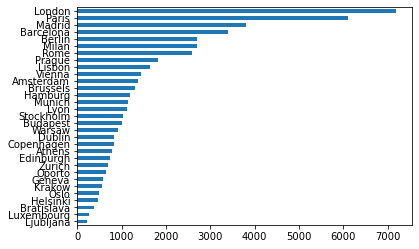

In [35]:
# Посмотрим на признак city
data['city'].value_counts(ascending=True).plot(kind='barh')

In [36]:
# Кодирование признака city
data = pd.get_dummies(data, columns=['city'])

In [37]:
def get_unique_cuisines():
    """
    Возвращает список уникальных значений типов кухонь
    """
    all_cuisines = []

    cuisine_styles = data.cuisine_style.to_list()

    for styles in cuisine_styles:
        all_cuisines += get_cuisine_list(styles)

    return list(set(all_cuisines))

In [38]:
# One-Hot Encoding признака cuisine_style
for i in get_unique_cuisines():
    data[f"cuisine_style_{i}"] = (data.cuisine_style.str.contains(i)).astype(float)
data.drop(['cuisine_style'], inplace=True, axis=1)

In [39]:
# Работа со временем отзывов

def clear_string(string):
    """
    Убирает лишние символы и
    возвращает список
    """
    
    return string.replace('[', '') .replace(']', '').split(',')
                #.replace("'", "") \
                
    

def last_review_date(rev):
    """
    Возвращает дату последнего отзыва
    """
    
    rev = clear_string(rev)
    
    if len(rev[-1])==13 and rev[-1].find('/')==4: 
        return pd.to_datetime(rev[-1])
    
    return pd.Timestamp('2015-01-01')

def first_review_date(rev):
    """
    Возвращает дату первого отзыва
    """
    
    rev = clear_string(rev)
    
    if len(rev[-1])==13 and rev[-1].find('/')==4 and len(rev[-2])==13 and rev[-2].find('/')==4: 
        return pd.to_datetime(rev[-2])
    if len(rev[-1])==13 and rev[-1].find('/')==4: 
        return pd.to_datetime(rev[-1])
    
    return pd.Timestamp('2015-01-01')

In [40]:
# Создание признаков с датами комментариев
data['last_review_date'] = data['reviews'].fillna('').apply(last_review_date)
data['first_review_date'] = data['reviews'].fillna('').apply(first_review_date)

In [41]:
# Признак "Число дней между комментариями"
data['delta_review_date'] = data['first_review_date']-data['last_review_date']
data['delta_review_date'] = data['delta_review_date'].apply(lambda x: x.days)

In [42]:
# Признаки год, месяц и день недели комментария
data['first_review_DayOfWeek'] = data['first_review_date'].apply(lambda x: x.dayofweek)
data['first_review_month'] = data['first_review_date'].apply(lambda x: x.month)
data['first_review_year'] = data['first_review_date'].apply(lambda x: x.year)
data['last_review_DayOfWeek'] = data['last_review_date'].apply(lambda x: x.dayofweek)
data['last_review_month'] = data['last_review_date'].apply(lambda x: x.month)
data['last_review_year'] = data['last_review_date'].apply(lambda x: x.year)

In [43]:
data.head(5)

,restaurant_id,ranking,price_range,number_of_reviews,reviews,url_ta,id_ta,sample,rating,Number_of_Reviews_isNAN,...,cuisine_style_Contemporary,last_review_date,first_review_date,delta_review_date,first_review_DayOfWeek,first_review_month,first_review_year,last_review_DayOfWeek,last_review_month,last_review_year
0,id_0,12963.0,100,4.0,NaN,/Restaurant_Review-g187147-d10746918-Reviews-L...,d10746918,0,0.0,0,...,0.0,2015-01-01,2015-01-01,0,3,1,2015,3,1,2015
1,id_1,106.0,100,97.0,"[['Very good reviews!', 'Fine dining in Hakani...",/Restaurant_Review-g189934-d6674944-Reviews-Ra...,d6674944,0,0.0,0,...,0.0,2017-10-29,2017-12-05,37,1,12,2017,6,10,2017
2,id_2,810.0,100,28.0,"[['Better than the Links', 'Ivy Black'], ['12/...",/Restaurant_Review-g186525-d13129638-Reviews-B...,d13129638,0,0.0,0,...,0.0,2017-12-06,2017-12-28,22,3,12,2017,2,12,2017
3,id_3,1669.0,1000,202.0,"[['Most exquisite', 'Delicious and authentic']...",/Restaurant_Review-g186338-d680417-Reviews-Qui...,d680417,0,0.0,0,...,0.0,2017-11-22,2017-12-06,14,2,12,2017,2,11,2017
4,id_4,37.0,1000,162.0,"[['Always the best in bratislava', 'Very good ...",/Restaurant_Review-g274924-d1112354-Reviews-Ma...,d1112354,0,0.0,0,...,0.0,2018-01-24,2018-02-08,15,3,2,2018,2,1,2018


In [44]:
# Удалим столбцы reviews, url_ta, id_ta
data.drop(['reviews', 'url_ta', 'id_ta'], axis='columns', inplace=True)

### Посмотрим распределение признака

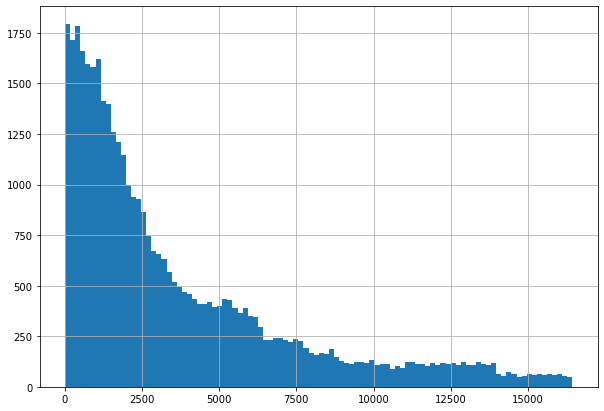

In [45]:
plt.rcParams['figure.figsize'] = (10,7)
df_train['Ranking'].hist(bins=100)

У нас много ресторанов, которые не дотягивают и до 2500 места в своем городе, а что там по городам?

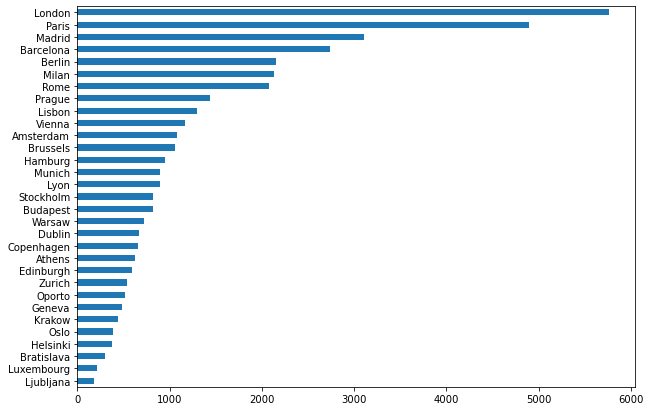

In [46]:
df_train['City'].value_counts(ascending=True).plot(kind='barh')

А кто-то говорил, что французы любят поесть=) Посмотрим, как изменится распределение в большом городе:

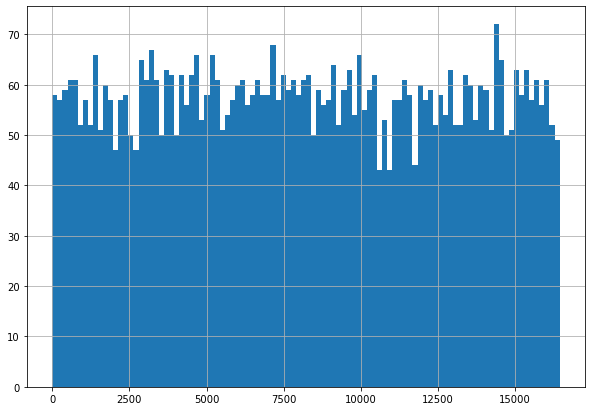

In [47]:
df_train['Ranking'][df_train['City'] =='London'].hist(bins=100)

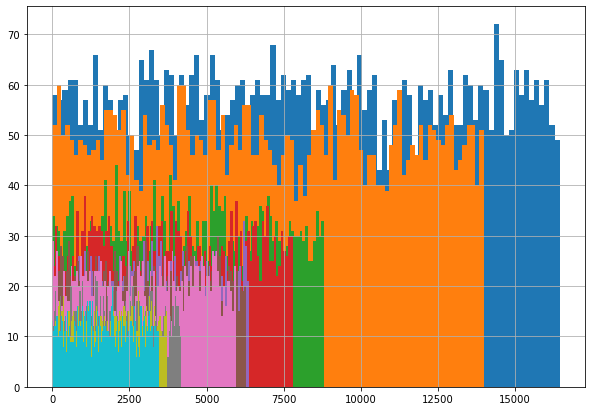

In [48]:
# посмотрим на топ 10 городов
for x in (df_train['City'].value_counts())[0:10].index:
    df_train['Ranking'][df_train['City'] == x].hist(bins=100)
plt.show()

Получается, что Ranking имеет нормальное распределение, просто в больших городах больше ресторанов, из-за мы этого имеем смещение.

>Подумайте как из этого можно сделать признак для вашей модели. Я покажу вам пример, как визуализация помогает находить взаимосвязи. А далее действуйте без подсказок =) 


### Посмотрим распределение целевой переменной

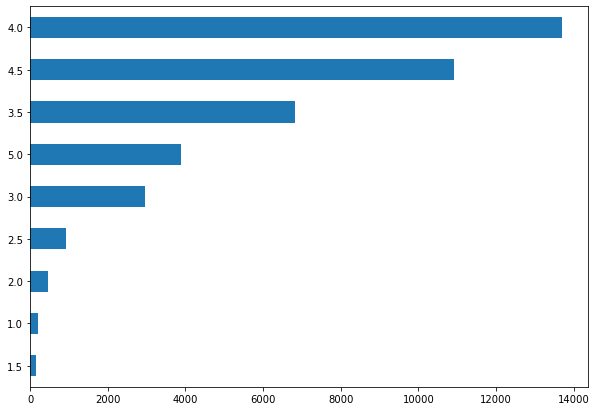

In [49]:
df_train['Rating'].value_counts(ascending=True).plot(kind='barh')

### Посмотрим распределение целевой переменной относительно признака

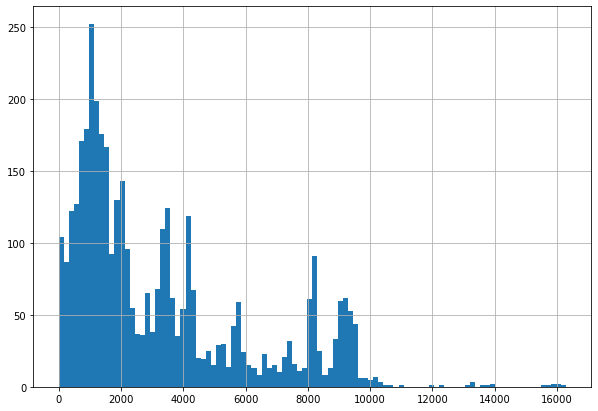

In [50]:
df_train['Ranking'][df_train['Rating'] == 5].hist(bins=100)

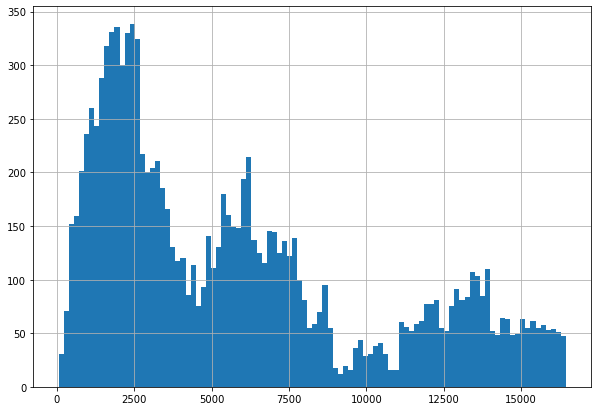

In [51]:
df_train['Ranking'][df_train['Rating'] < 4].hist(bins=100)

### И один из моих любимых - [корреляция признаков](https://ru.wikipedia.org/wiki/Корреляция)
На этом графике уже сейчас вы сможете заметить, как признаки связаны между собой и с целевой переменной.

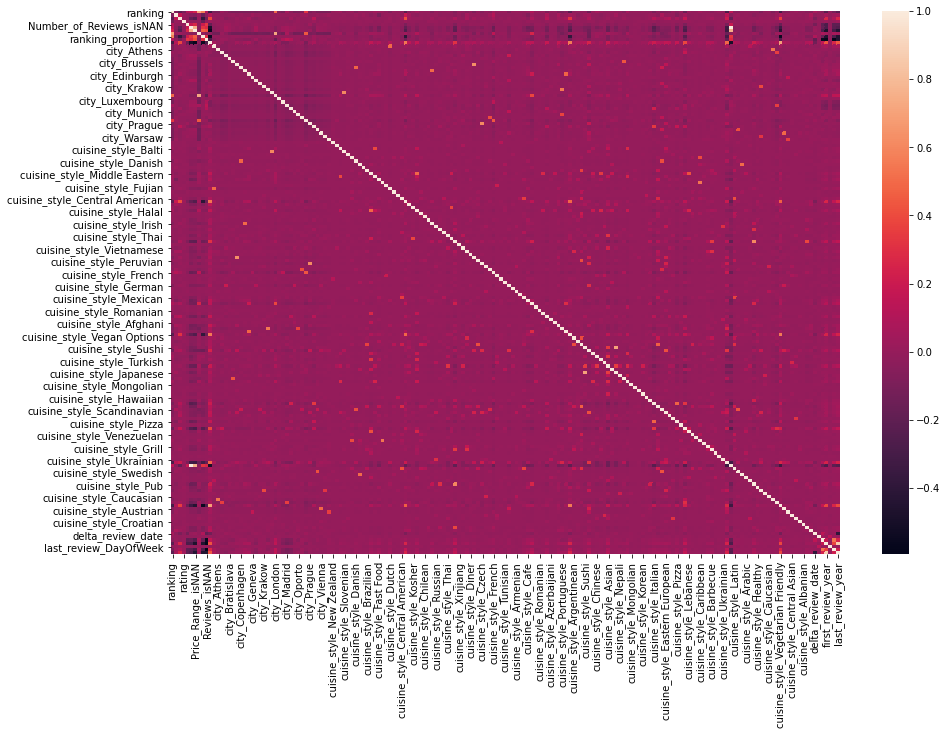

In [52]:
plt.rcParams['figure.figsize'] = (15,10)
sns.heatmap(data.drop(['sample'], axis=1).corr(),)

Вообще благодаря визуализации в этом датасете можно узнать много интересных фактов, например:
* где больше Пицерий в Мадриде или Лондоне?
* в каком городе кухня ресторанов более разнообразна?

придумайте свои вопрос и найдите на него ответ в данных)

# Data Preprocessing
Теперь, для удобства и воспроизводимости кода, завернем всю обработку в одну большую функцию.

In [56]:
# на всякий случай, заново подгружаем данные
df_train = pd.read_csv(DATA_DIR+'main_task.csv')
df_test = pd.read_csv(DATA_DIR+'kaggle_task.csv')
df_train['sample'] = 1 # помечаем где у нас трейн
df_test['sample'] = 0 # помечаем где у нас тест
df_test['Rating'] = 0 # в тесте у нас нет значения Rating, мы его должны предсказать, по этому пока просто заполняем нулями

data = df_test.append(df_train, sort=False).reset_index(drop=True) # объединяем
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Restaurant_id      50000 non-null  object 
 1   City               50000 non-null  object 
 2   Cuisine Style      38410 non-null  object 
 3   Ranking            50000 non-null  float64
 4   Price Range        32639 non-null  object 
 5   Number of Reviews  46800 non-null  float64
 6   Reviews            49998 non-null  object 
 7   URL_TA             50000 non-null  object 
 8   ID_TA              50000 non-null  object 
 9   sample             50000 non-null  int64  
 10  Rating             50000 non-null  float64
dtypes: float64(3), int64(1), object(7)
memory usage: 4.2+ MB


In [57]:
def preproc_data(df_input):
    '''includes several functions to pre-process the predictor data.'''
    
    df_output = df_input.copy()
    
    #Вспомогательные функции
    def get_cuisine_list(string):
        """
        Убирает лишние символы и
        возвращает список слов.
        """
        cuisine_list = string.replace('[', '') \
                    .replace(']', '') \
                    .replace("'", "") \
                    .split(', ')
    
        return cuisine_list

    def count_cuisine(cuisine_str):
        """
        Возвращает кол-во кухонь в ресторане
        """
    
        return len(get_cuisine_list(cuisine_str))
    
    def get_unique_cuisines():
        """
        Возвращает список уникальных значений типов кухонь
        """
        all_cuisines = []

        cuisine_styles = df_output.cuisine_style.to_list()

        for styles in cuisine_styles:
            all_cuisines += get_cuisine_list(styles)

        return list(set(all_cuisines))
    
    def clear_string(string):
        """
        Убирает лишние символы и
        возвращает список
        """
    
        return string.replace('[', '') .replace(']', '').split(',')                
    

    def last_review_date(rev):
        """
        Возвращает дату последнего отзыва
        """
    
        rev = clear_string(rev)
    
        if len(rev[-1])==13 and rev[-1].find('/')==4: 
            return pd.to_datetime(rev[-1])
    
        return pd.Timestamp('2015-01-01')

    def first_review_date(rev):
        """
        Возвращает дату первого отзыва
        """
    
        rev = clear_string(rev)
    
        if len(rev[-1])==13 and rev[-1].find('/')==4 and len(rev[-2])==13 and rev[-2].find('/')==4: 
            return pd.to_datetime(rev[-2])
        if len(rev[-1])==13 and rev[-1].find('/')==4: 
            return pd.to_datetime(rev[-1])
    
        return pd.Timestamp('2015-01-01')
    
    price_dict = {
        '$': 1,
        '$$ - $$$': 100,
        '$$$$': 1000
    }
    
    # Создадим справочник с указанием количества ресторанов для каждого города, 
    #присутствующего в датасете (данные из файла TA_restaurants_curated.csv)
    restaurant_stat_data = {
        'London': 18212,
        'Paris':14874,
        'Madrid':9543,
        'Barcelona':8425,
        'Berlin':7078,
        'Milan':6687,
        'Rome':5949,
        'Prague':4859,
        'Lisbon':3986,
        'Vienna':3724,
        'Amsterdam':3434,
        'Brussels':3204,
        'Hamburg':3131,
        'Munich':2995,
        'Lyon':2930,
        'Stockholm':2705,
        'Budapest':2606,
        'Warsaw':2352,
        'Copenhagen':2109,
        'Dublin':2082,
        'Athens':1938,
        'Edinburgh':1865,
        'Zurich':1667,
        'Oporto':1580,
        'Geneva':1572,
        'Krakow':1354,
        'Helsinki':1228,
        'Oslo':1213,
        'Bratislava':1067,
        'Luxembourg':657,
        'Ljubljana':501
    }
    
    # ################### 1. Предобработка ############################################################## 
    # убираем не нужные для модели признаки
    #df_output.drop(['Restaurant_id','ID_TA',], axis = 1, inplace=True)
    df_output.columns = ['_'.join(col.split()).lower() for col in data.columns]
    
    
    # ################### 2. NAN ############################################################## 
    # Далее заполняем пропуски
    
    # Признак number_of_reviews
    df_output['Number_of_Reviews_isNAN'] = pd.isna(df_output['number_of_reviews']).astype('uint8')
    
    mean_num_rev = df_output.groupby('city').number_of_reviews.mean()
    df_output.number_of_reviews = df_output.apply(lambda row: mean_num_rev[row['city']] \
                                                  if pd.isnull(row['number_of_reviews']) \
                                                  else row['number_of_reviews'], axis=1)
    
    # Признак price_range
    
    df_output['Price_Range_isNAN'] = pd.isna(df_output['price_range']).astype('uint8')   
    df_output.price_range = df_output.price_range.fillna(value='$$ - $$$')
    
    # Признак cuisine_style
    
    df_output['Cuisine_Style_isNAN'] = pd.isna(df_output['cuisine_style']).astype('uint8')
    df_output.cuisine_style = df_output.cuisine_style.fillna(value='traditional')
    
    #Заменим в признаке 'reviews' значение [[], []] на np.nan
    df_output.reviews = df_output.reviews.apply(lambda string: np.nan if string == '[[], []]' else string)
    df_output['Reviews_isNAN'] = pd.isna(df_output['reviews']).astype('uint8')
    
    # ################### 3. Encoding ############################################################## 
    # для One-Hot Encoding в pandas есть готовая функция - get_dummies. Особенно радует параметр dummy_na
    #df_output = pd.get_dummies(df_output, columns=['city'])
    
    # One-Hot Encoding признака cuisine_style
    for i in get_unique_cuisines():
        df_output[f"cuisine_style_{i}"] = (df_output.cuisine_style.str.contains(i)).astype(float)
        
    # тут ваш код не Encoding фитчей
    
    # Преобразуем price_range по принципу LabelEncoding
    df_output.price_range = df_output.price_range.map(price_dict)
    
    # признак количества ресторанов в городе
    df_output['restaurants_count'] = df_output.city.map(restaurant_stat_data)
    df_output = pd.get_dummies(df_output, columns=['city'])
    
    # ################### 4. Feature Engineering ####################################################
    # тут ваш код на генерацию новых фитчей
    print(df_output.head(5))
    df_output['cuisine_count'] = df_output.cuisine_style.map(count_cuisine)
    
    #Создадим признак ranking_proportion - отношение признака ranking и restaurants_count
    df_output['ranking_proportion'] = df_output.ranking / df_output.restaurants_count
    
    # Создание признаков с датами комментариев
    df_output['last_review_date'] = df_output['reviews'].fillna('').apply(last_review_date)
    df_output['first_review_date'] = df_output['reviews'].fillna('').apply(first_review_date)
    
    # Признак "Число дней между комментариями"
    df_output['delta_review_date'] = df_output['first_review_date']-df_output['last_review_date']
    df_output['delta_review_date'] = df_output['delta_review_date'].apply(lambda x: x.days)
    
    # Признаки год, месяц и день недели комментария
    df_output['first_review_DayOfWeek'] = df_output['first_review_date'].apply(lambda x: x.dayofweek)
    df_output['first_review_month'] = df_output['first_review_date'].apply(lambda x: x.month)
    df_output['first_review_year'] = df_output['first_review_date'].apply(lambda x: x.year)
    df_output['last_review_DayOfWeek'] = df_output['last_review_date'].apply(lambda x: x.dayofweek)
    df_output['last_review_month'] = df_output['last_review_date'].apply(lambda x: x.month)
    df_output['last_review_year'] = df_output['last_review_date'].apply(lambda x: x.year)
  
    
    # ################### 5. Clean #################################################### 
    # убираем признаки которые еще не успели обработать, 
    df_output.drop(['last_review_date','first_review_date'], axis = 1, inplace=True)
    
    # модель на признаках с dtypes "object" обучаться не будет, просто выберим их и удалим
    object_columns = [s for s in df_output.columns if df_output[s].dtypes == 'object']
    df_output.drop(object_columns, axis = 1, inplace=True)
    
    return df_output

>По хорошему, можно было бы перевести эту большую функцию в класс и разбить на подфункции (согласно ООП). 

#### Запускаем и проверяем что получилось

In [58]:
df_preproc = preproc_data(data)
df_preproc.sample(10)

  restaurant_id                                      cuisine_style  ranking  \
0          id_0                                     ['Bar', 'Pub']  12963.0   
1          id_1  ['European', 'Scandinavian', 'Gluten Free Opti...    106.0   
2          id_2                            ['Vegetarian Friendly']    810.0   
3          id_3  ['Italian', 'Mediterranean', 'European', 'Vege...   1669.0   
4          id_4  ['Italian', 'Mediterranean', 'European', 'Seaf...     37.0   

   price_range  number_of_reviews  \
0          100                4.0   
1          100               97.0   
2          100               28.0   
3         1000              202.0   
4         1000              162.0   

                                             reviews  \
0                                                NaN   
1  [['Very good reviews!', 'Fine dining in Hakani...   
2  [['Better than the Links', 'Ivy Black'], ['12/...   
3  [['Most exquisite', 'Delicious and authentic']...   
4  [['Always the best 

,ranking,price_range,number_of_reviews,sample,rating,Number_of_Reviews_isNAN,Price_Range_isNAN,Cuisine_Style_isNAN,Reviews_isNAN,cuisine_style_New Zealand,...,city_Zurich,cuisine_count,ranking_proportion,delta_review_date,first_review_DayOfWeek,first_review_month,first_review_year,last_review_DayOfWeek,last_review_month,last_review_year
16295,501.0,100,559.000000,1,5.0,0,0,0,0,0.0,...,0,6,0.027509,23,0,12,2017,5,11,2017
44472,2244.0,1,77.649387,1,4.0,1,0,0,1,0.0,...,0,1,0.749249,0,3,1,2015,3,1,2015
2284,4362.0,100,5.000000,0,0.0,0,1,0,1,0.0,...,0,1,0.652310,0,3,1,2015,3,1,2015
22263,14468.0,1000,3.000000,1,3.5,0,0,0,0,0.0,...,0,1,0.794421,1314,3,9,2017,5,2,2014
2231,110.0,100,332.000000,0,0.0,0,0,0,0,0.0,...,0,5,0.042210,10,0,1,2018,4,12,2017
30721,1139.0,1,80.000000,1,4.5,0,0,0,0,0.0,...,0,2,0.170330,977,4,7,2017,0,11,2014
39108,1611.0,100,6.000000,1,4.0,0,1,0,1,0.0,...,0,1,0.595564,0,3,1,2015,3,1,2015
17533,5139.0,100,123.000000,1,3.5,0,0,0,0,0.0,...,0,2,0.768506,0,1,9,2015,1,9,2015
49824,7065.0,100,6.000000,1,3.0,0,1,1,1,0.0,...,0,1,0.838576,0,3,1,2015,3,1,2015
7839,3618.0,1,8.000000,0,0.0,0,0,0,0,0.0,...,0,2,0.744598,70,6,9,2017,6,7,2017


In [59]:
df_preproc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Columns: 176 entries, ranking to last_review_year
dtypes: float64(130), int64(11), uint8(35)
memory usage: 55.5 MB


In [60]:
# Теперь выделим тестовую часть
train_data = df_preproc.query('sample == 1').drop(['sample'], axis=1)
test_data = df_preproc.query('sample == 0').drop(['sample'], axis=1)

y = train_data.rating.values            # наш таргет
X = train_data.drop(['rating'], axis=1)

**Перед тем как отправлять наши данные на обучение, разделим данные на еще один тест и трейн, для валидации. 
Это поможет нам проверить, как хорошо наша модель работает, до отправки submissiona на kaggle.**

In [61]:
# Воспользуемся специальной функцие train_test_split для разбивки тестовых данных
# выделим 20% данных на валидацию (параметр test_size)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=RANDOM_SEED)

In [62]:
# проверяем
test_data.shape, train_data.shape, X.shape, X_train.shape, X_test.shape

((10000, 175), (40000, 175), (40000, 174), (32000, 174), (8000, 174))

# Model 
Сам ML

In [63]:
# Импортируем необходимые библиотеки:
from sklearn.ensemble import RandomForestRegressor # инструмент для создания и обучения модели
from sklearn import metrics # инструменты для оценки точности модели

In [64]:
# Создаём модель (НАСТРОЙКИ НЕ ТРОГАЕМ)
model = RandomForestRegressor(n_estimators=100, verbose=1, n_jobs=-1, random_state=RANDOM_SEED)

In [65]:
# Обучаем модель на тестовом наборе данных
model.fit(X_train, y_train)

# Используем обученную модель для предсказания рейтинга ресторанов в тестовой выборке.
# Предсказанные значения записываем в переменную y_pred
y_pred = model.predict(X_test)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    8.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   20.7s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


In [66]:
# Видим разницу в том, что реальные рейтинги всегда кратны 0.5
# Напишем функцию соответствующей корректировки предсказанных рейтингов
def fine_rating_pred(rating_pred):
    if rating_pred <= 0.5:
        return 0.0
    if rating_pred <= 1.5:
        return 1.0
    if rating_pred <= 1.75:
        return 1.5
    if rating_pred <= 2.25:
        return 2.0
    if rating_pred <= 2.75:
        return 2.5
    if rating_pred <= 3.25:
        return 3.0
    if rating_pred <= 3.75:
        return 3.5
    if rating_pred <= 4.25:
        return 4.0
    if rating_pred <= 4.75:
        return 4.5
    return 5.0

In [67]:
# Применим такое округление
for i in range(len(y_pred)):
    y_pred[i] = fine_rating_pred(y_pred[i])

In [68]:
# Сравниваем предсказанные значения (y_pred) с реальными (y_test), и смотрим насколько они в среднем отличаются
# Метрика называется Mean Absolute Error (MAE) и показывает среднее отклонение предсказанных значений от фактических.
print('MAE:', metrics.mean_absolute_error(y_test, y_pred))

MAE: 0.1695


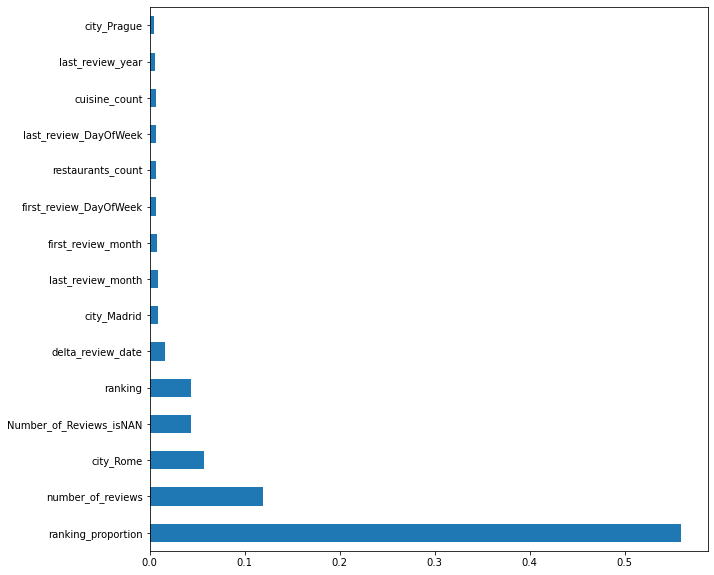

In [69]:
# в RandomForestRegressor есть возможность вывести самые важные признаки для модели
plt.rcParams['figure.figsize'] = (10,10)
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(15).plot(kind='barh')

# Submission
Если все устраевает - готовим Submission на кагл

In [70]:
test_data.sample(10)

,ranking,price_range,number_of_reviews,rating,Number_of_Reviews_isNAN,Price_Range_isNAN,Cuisine_Style_isNAN,Reviews_isNAN,cuisine_style_New Zealand,cuisine_style_Cambodian,...,city_Zurich,cuisine_count,ranking_proportion,delta_review_date,first_review_DayOfWeek,first_review_month,first_review_year,last_review_DayOfWeek,last_review_month,last_review_year
4447,1713.0,100,86.0,0.0,0,1,1,0,0.0,0.0,...,0,1,0.256169,110,3,4,2016,5,12,2015
2490,8404.0,100,35.0,0.0,0,0,0,0,0.0,0.0,...,0,1,0.880645,338,2,12,2017,0,1,2017
438,7025.0,100,47.0,0.0,0,0,0,0,0.0,0.0,...,0,6,0.385735,27,0,11,2017,1,10,2017
4128,11678.0,1,55.0,0.0,0,0,0,0,0.0,0.0,...,0,2,0.785128,143,2,6,2016,6,2,2016
5524,13056.0,100,65.0,0.0,0,0,0,0,0.0,0.0,...,0,1,0.877773,84,6,11,2017,6,8,2017
2787,428.0,100,366.0,0.0,0,0,0,0,0.0,0.0,...,0,7,0.050801,44,1,12,2017,6,11,2017
2316,13005.0,100,185.0,0.0,0,0,0,0,0.0,0.0,...,0,5,0.874344,0,4,11,2017,4,11,2017
8532,2692.0,100,2.0,0.0,0,1,1,0,0.0,0.0,...,0,1,0.898831,0,2,5,2014,2,5,2014
9509,1743.0,1,27.0,0.0,0,0,0,0,0.0,0.0,...,0,3,0.117184,21,6,7,2017,6,7,2017
3440,14653.0,100,13.0,0.0,0,1,1,0,0.0,0.0,...,0,1,0.804579,51,6,12,2017,4,11,2017


In [71]:
test_data = test_data.drop(['rating'], axis=1)

In [72]:
sample_submission

,Restaurant_id,Rating
0,id_0,2.0
1,id_1,2.5
2,id_2,4.0
3,id_3,1.0
4,id_4,4.0
...,...,...
9995,id_9995,3.0
9996,id_9996,1.5
9997,id_9997,4.5
9998,id_9998,1.0


In [73]:
predict_submission = model.predict(test_data)

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.1s finished


In [74]:
predict_submission

array([3.03 , 4.23 , 4.425, ..., 3.085, 4.49 , 4.195])

In [75]:
sample_submission['Rating'] = predict_submission
sample_submission.to_csv('submission.csv', index=False)
sample_submission.head(10)

,Restaurant_id,Rating
0,id_0,3.030
1,id_1,4.230
2,id_2,4.425
3,id_3,4.315
4,id_4,4.495
5,id_5,4.485
6,id_6,2.370
7,id_7,2.550
8,id_8,4.220
9,id_9,4.585


# What's next?
Или что делать, чтоб улучшить результат:
* Обработать оставшиеся признаки в понятный для машины формат
* Посмотреть, что еще можно извлечь из признаков
* Сгенерировать новые признаки
* Подгрузить дополнительные данные, например: по населению или благосостоянию городов
* Подобрать состав признаков

В общем, процесс творческий и весьма увлекательный! Удачи в соревновании!
